# Quantum Genetic Programming



#### This notebook will demonstrate how genetic algorithms can be applied to evolving quantum gates. Being able to evolve quantum gates has the clear advantage that we partially or entirely remove the need for a human engineer to design gates to carry out specific quantum computations. Additionally, we abstract away the physical implementation of the quantum gates/circuits and focus on the underlying mathematics. Over time, physical considerations will be taken into account. This notebook will serve as a "proof-of-concept" that we can use genetic programmming to evolve quantum circuits in theory, and then lay out a roadmap as to how to make this more practical over time. 


##### While the PoC will be written in Python, a new version of this repo will be written in Julia. For those who wish to continue building off this repo in Python, can submit PRs. I plan on contributing to this repository periodically, but my main contributions will be to the Julia repo. 




In [1]:
from genetic_quantum_programming import *


## Basic Qubit Gates


<img src="gates.png" width="450x450">

#### A quantum gate can be viewed as an operator $T$ acting on a qubit system $\psi_1$ to change the states of the qubit(s) to $\psi_2$. 

##### Concisely: $T\psi_1=\psi_2$

##### The gates pictured above are specific instances of U that were developed by physicists. We are going to use genetic algorithms to evolve the quantum gates. 


##### In quantum computing, the quantum gates when represented as matrices must be unitary (the conjugate transpose is equal to its inverse)
##### This means our search space in theory could be as large as $U(n)$ - the group of n x n unitary matrices. Elements of U(2) (2 x 2 unitary matrices) have the form $T=\begin{pmatrix}
w & z \\
-e^{i\theta}w^{*} & e^{i\theta}z^{*}
\end{pmatrix}$

##### Depending on the architecture of the quantum computer (i.e. trapped ion, topological etc.), certain gates may require more sophisticated hardware to implement physically. Eventually, we want to incorporate the hardware specifications into the fitness function so that the genetic algorithm evolves gates that only perform the computation, but perform it using gates that are most appropriate for the hardware. Additionally, we could simply choose combinations of "universal" gates (gates that can produce any qubit state by applying a finite number of universal gates to the qubit(s)).

##### The Bloch sphere (pictured below), is a geometric representation of a qubit state, and is a visual aid for gaining an intuition for how the gates act on the qubit system. Here, there is no explicit utilization of the Bloch sphere geometry, but future updates may somehow make use of the geometry. 

<img src="block_sphere.png" width="300x300">

### Genetic Algorithm (single qubit)

##### We will evolve the quantum gates through an elitist selection approach rather than a crossover-mutation approach. Future updates will include a crossover-mutation based algorithm as well. 

##### If we wanted to consider the entire search space of U(2) for a single qubit system, we could take our chromosomes to be vectors of the form $[w,z,\theta]$ where $z,w\in \mathbb{C}$ and $\theta\in [0,2\pi]$
#### where $|w|^2+|z|^2=1$

##### Our 2 x 2 unitary matrices can easily be constructed from the vector  

##### $[w,z,\theta]\rightarrow \begin{pmatrix}
w & z \\
-e^{i\theta}w^{*} & e^{i\theta}z^{*}
\end{pmatrix}$



##### The fitness of the chromosomes is based on how close the resulting qubit is to the qubit we want. 
##### Restricting our search space to familar single qubit gates like the Pauli X, Pauli Y, and Pauli Z gates makes engineering sense because we can find gates that map our input qubit state to a target qubit state in very little time. We want to first make sure we can evolve solutions to known problems and then expand to unknown problems.

#### Let $T\psi_1=\tilde{\psi_2}$, where $T,\psi_1,\tilde{\psi_2}$ are the matrix, input qubit and resulting qubit respectively
#### Let $\psi_2$ be our target. We can define a fitness function $F(\tilde{\psi_2},\psi_2)=||\tilde{\psi_2}-\psi_2||$

#### If we have $M$ chromsomes per generation, we keep a fraction of the most fit (the elite ones)

#### For the chromsomes which were less fit, we remove those, and reinitialize the removed ones with new random gates, and we loop over the number of generations. 

#### The benefit of elitist selection is that each generation, the maximum fitness is as high or higher than the previous generation. 


### Genetic Algorithm (two-qubit system)

#### Here the algorithm is identical, only now we consider familar two qubit gates like SWAP and $\sqrt{SWAP}$. 

#### the cells below will demonstrate the genetic algorithm in action for single qubit gates and dual qubit gates. 
#### A false color map is included to help visualize the quantum states. 




Generation: 1/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


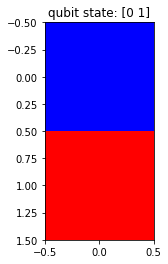

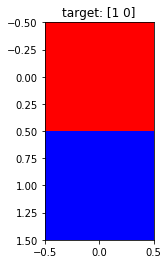

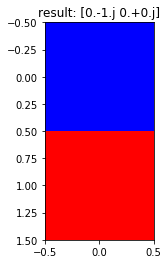

Generation: 1/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


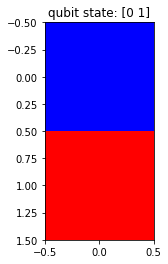

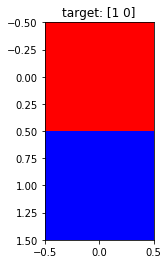

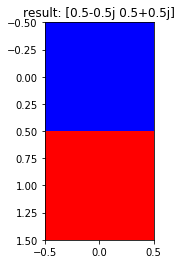

Generation: 1/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


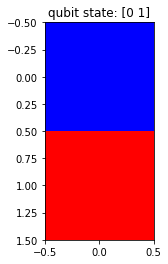

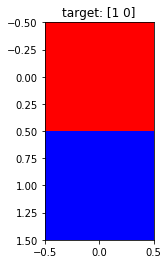

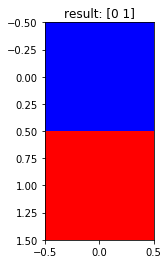

Generation: 1/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


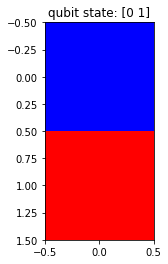

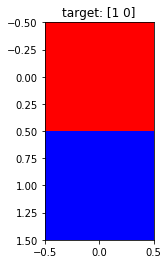

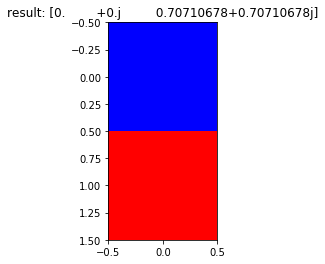

Generation: 1/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


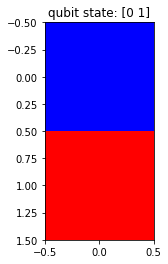

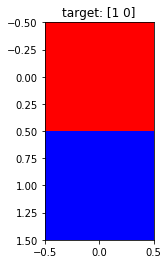

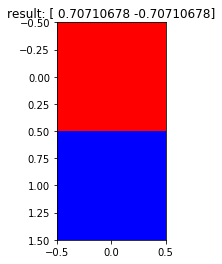

Generation: 1/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


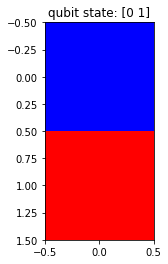

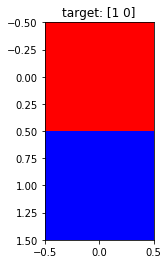

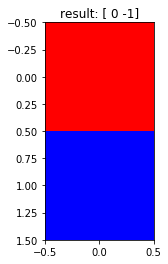

Generation: 2/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


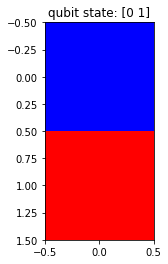

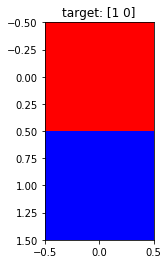

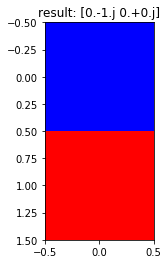

Generation: 2/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


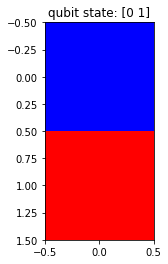

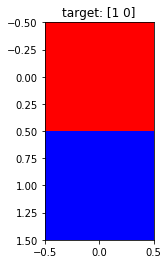

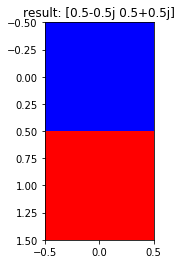

Generation: 2/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


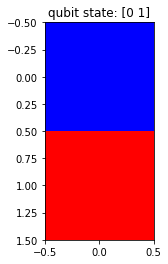

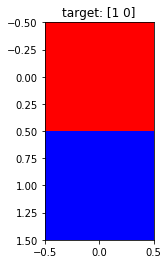

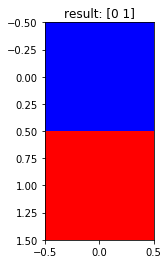

Generation: 2/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


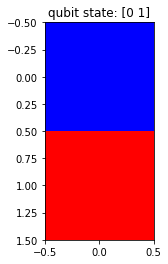

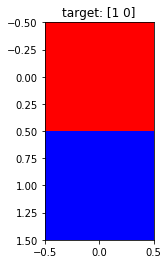

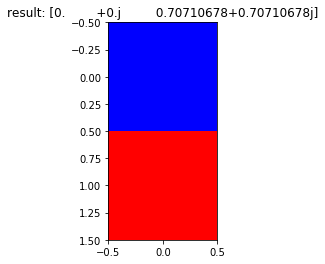

Generation: 2/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


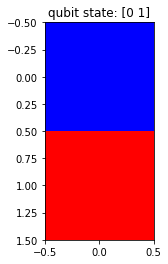

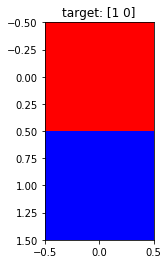

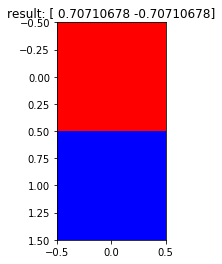

Generation: 2/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


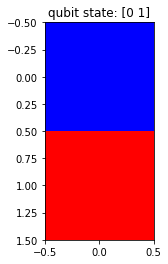

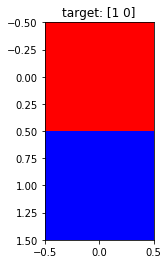

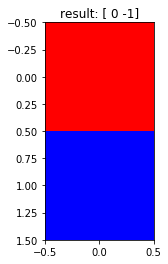

Generation: 3/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


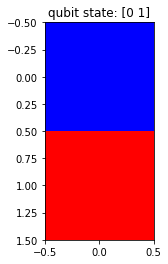

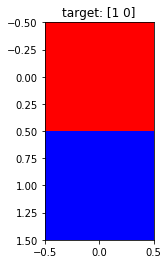

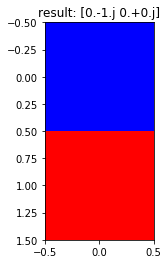

Generation: 3/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


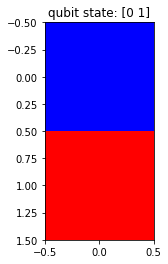

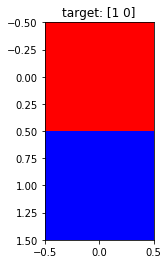

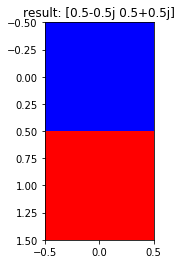

Generation: 3/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


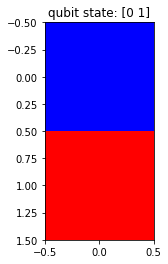

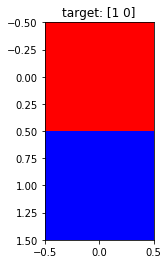

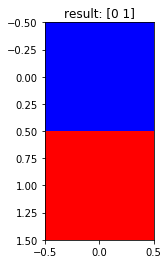

Generation: 3/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


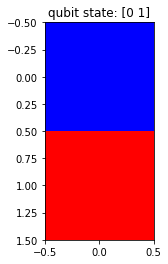

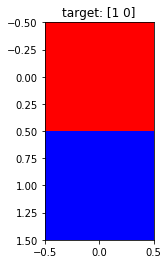

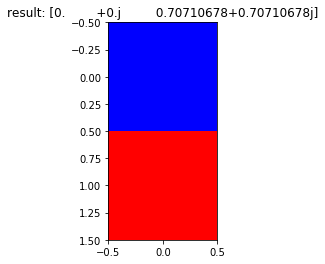

Generation: 3/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


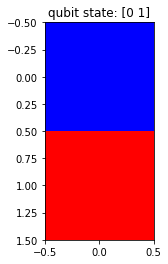

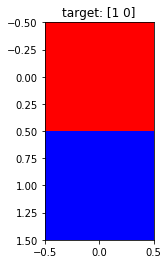

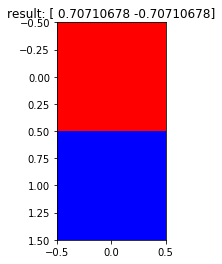

Generation: 3/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


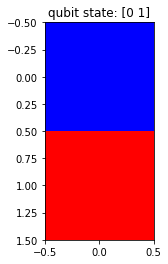

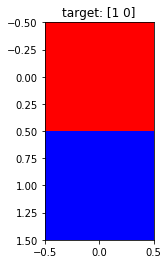

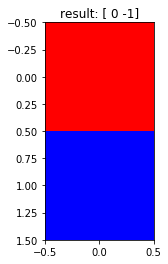

Generation: 4/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


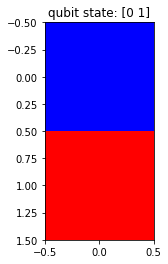

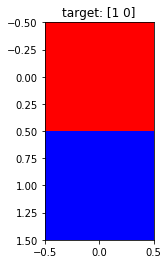

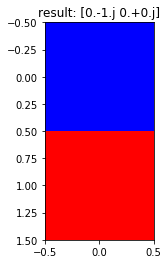

Generation: 4/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


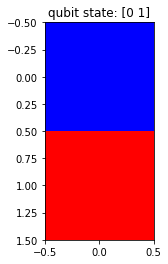

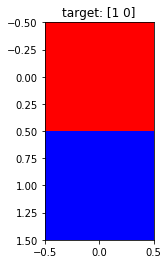

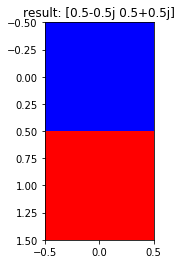

Generation: 4/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


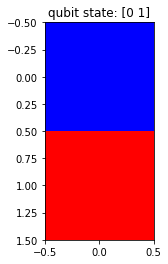

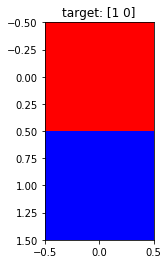

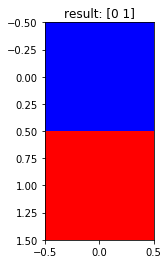

Generation: 4/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


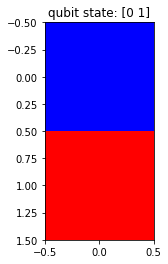

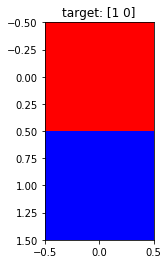

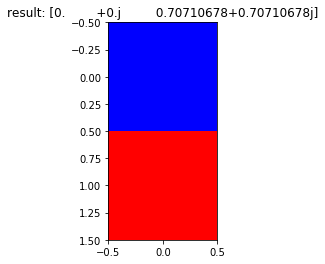

Generation: 4/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


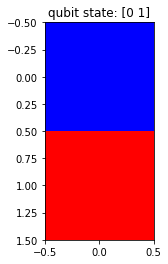

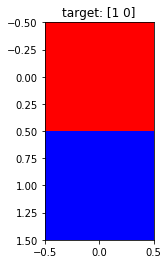

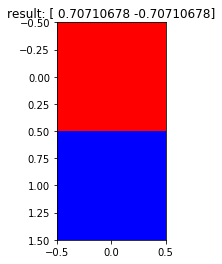

Generation: 4/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


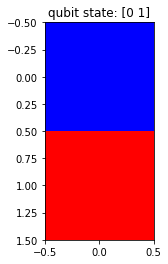

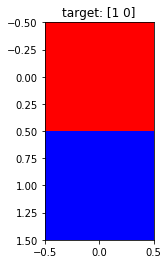

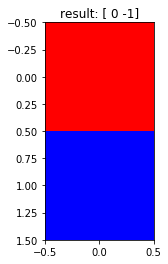

Generation: 5/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


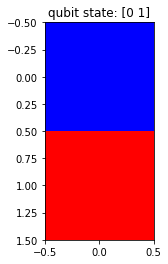

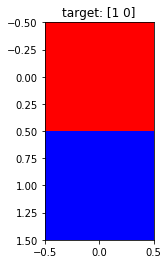

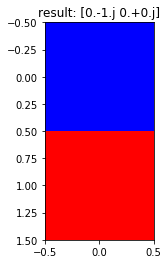

Generation: 5/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


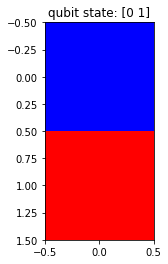

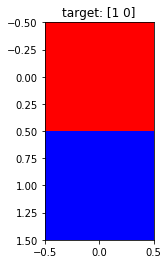

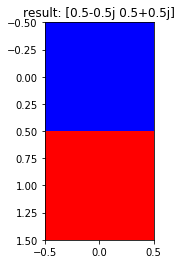

Generation: 5/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


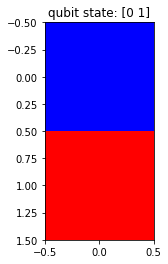

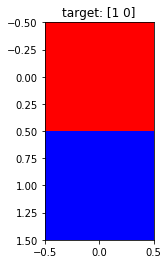

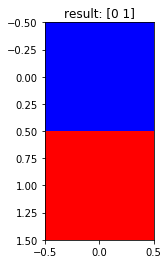

Generation: 5/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


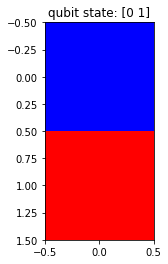

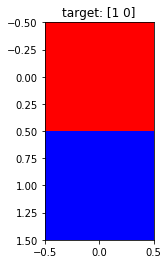

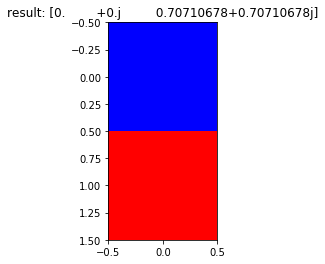

Generation: 5/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


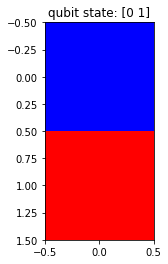

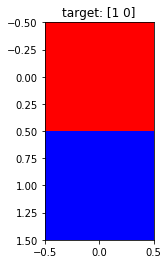

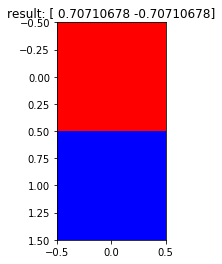

Generation: 5/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


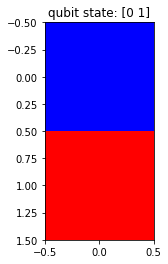

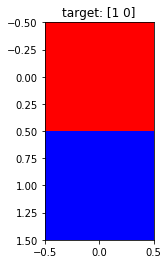

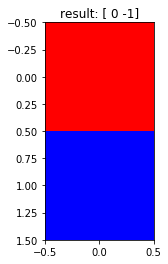

Generation: 6/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


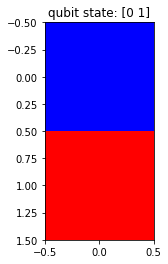

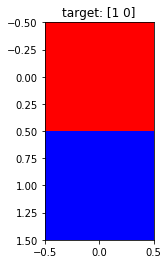

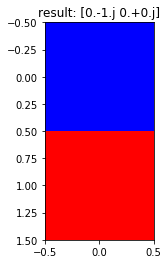

Generation: 6/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


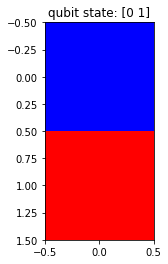

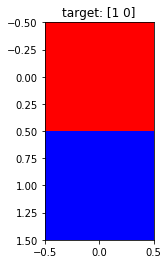

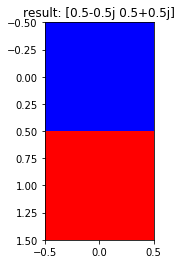

Generation: 6/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


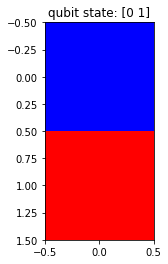

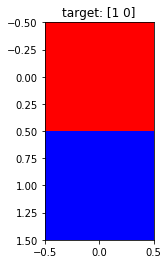

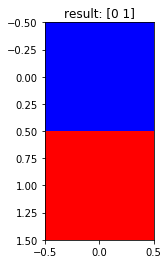

Generation: 6/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


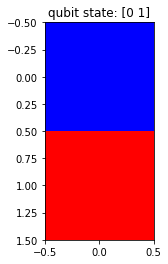

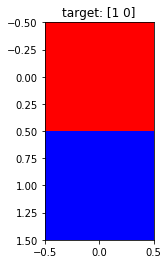

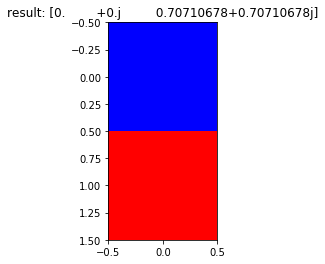

Generation: 6/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


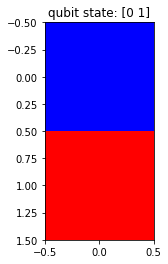

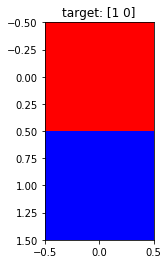

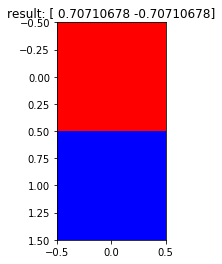

Generation: 6/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


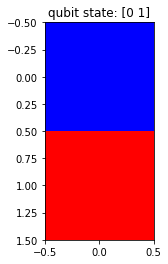

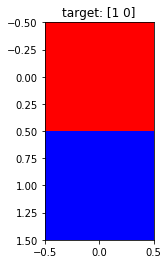

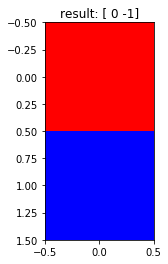

Generation: 7/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


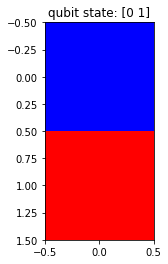

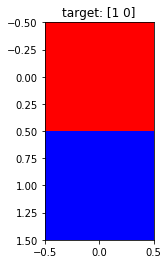

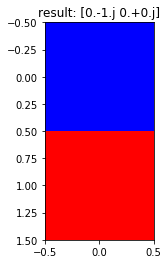

Generation: 7/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


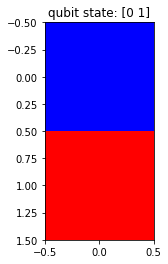

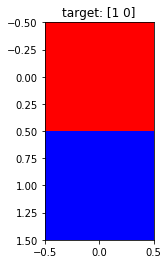

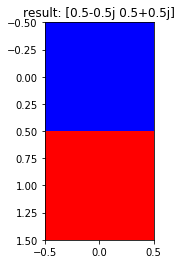

Generation: 7/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


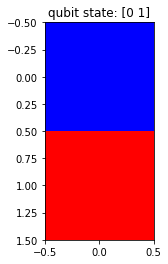

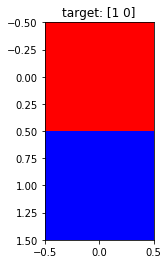

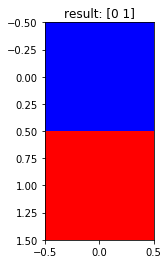

Generation: 7/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


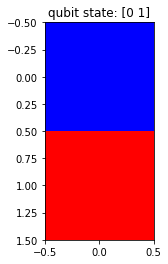

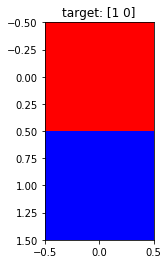

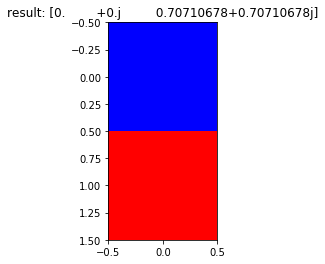

Generation: 7/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


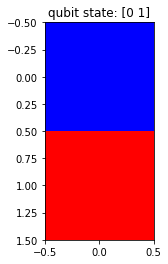

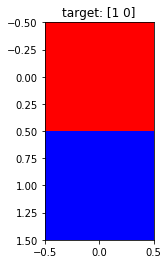

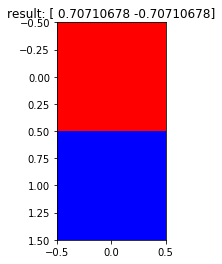

Generation: 7/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


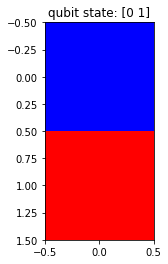

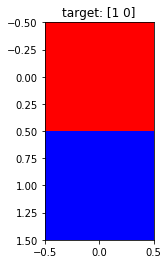

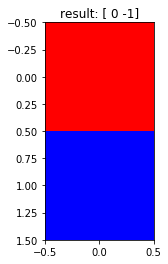

Generation: 8/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


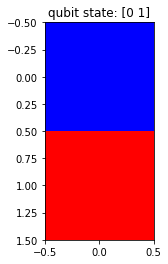

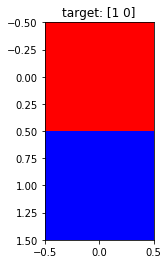

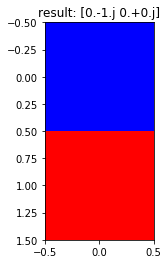

Generation: 8/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


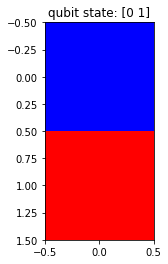

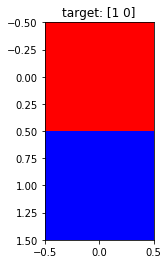

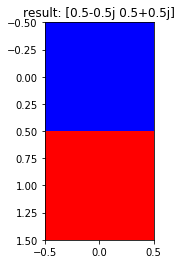

Generation: 8/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


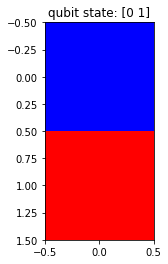

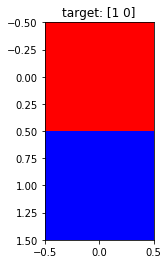

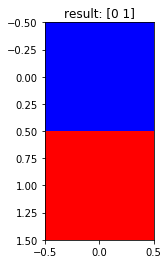

Generation: 8/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


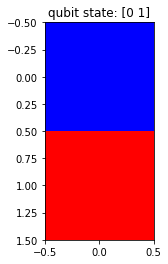

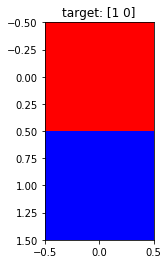

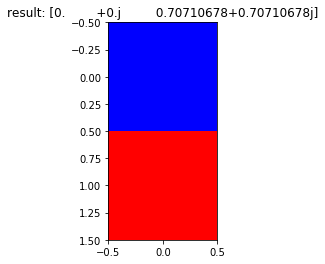

Generation: 8/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


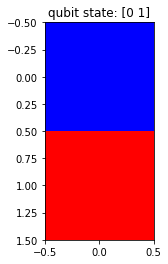

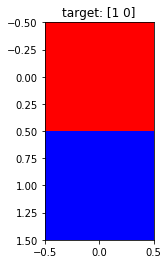

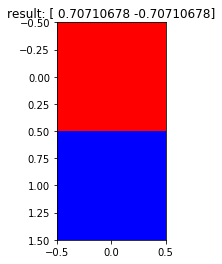

Generation: 8/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


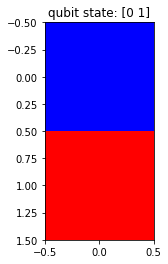

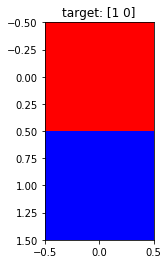

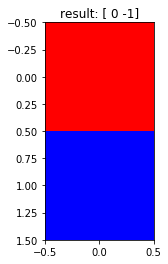

Generation: 9/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


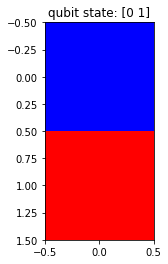

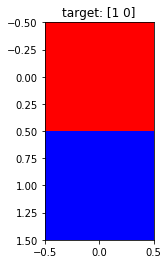

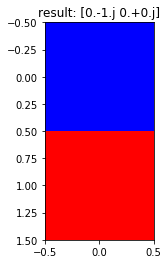

Generation: 9/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


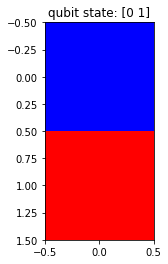

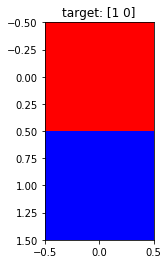

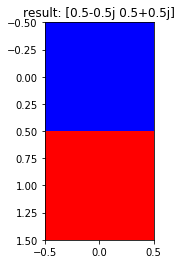

Generation: 9/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


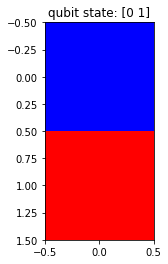

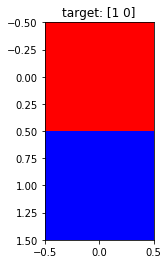

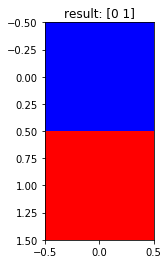

Generation: 9/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


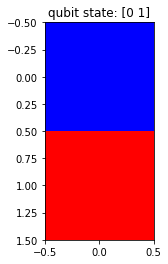

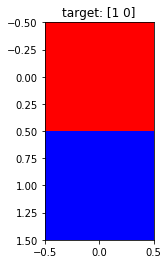

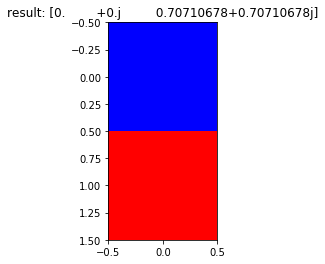

Generation: 9/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


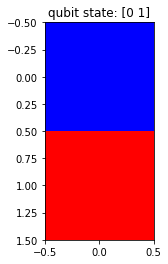

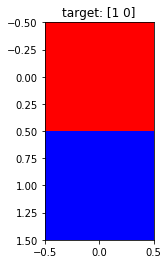

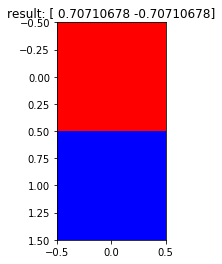

Generation: 9/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


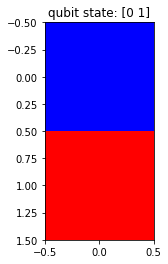

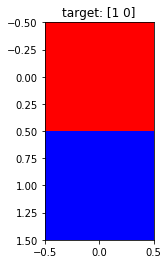

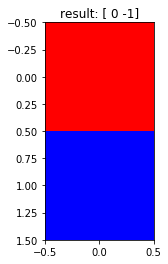

Generation: 10/10 Chromosome: 1/6
Quantum gate:
 [[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.-1.j 0.+0.j]
Fitness: 0.6088593649824492


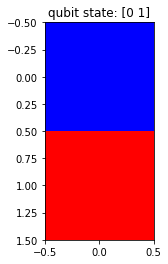

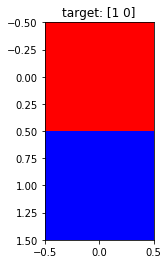

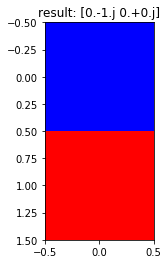

Generation: 10/10 Chromosome: 2/6
Quantum gate:
 [[0.5+0.5j 0.5-0.5j]
 [0.5-0.5j 0.5+0.5j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.5-0.5j 0.5+0.5j]
Fitness: 0.7615941559137674


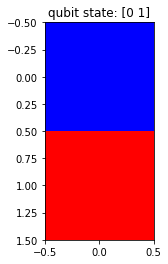

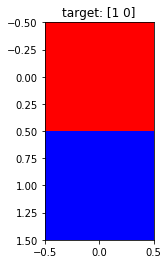

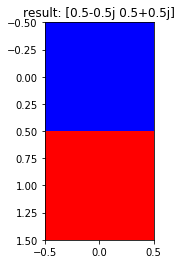

Generation: 10/10 Chromosome: 3/6
Quantum gate:
 [[1 0]
 [0 1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0 1]
Fitness: 0.6088593649824492


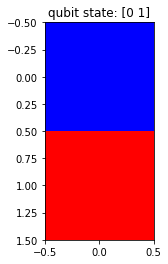

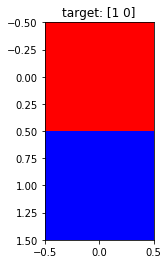

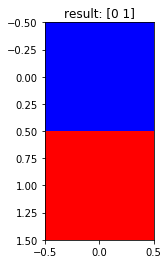

Generation: 10/10 Chromosome: 4/6
Quantum gate:
 [[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [0.        +0.j         0.70710678+0.70710678j]
Fitness: 0.6088593649824492


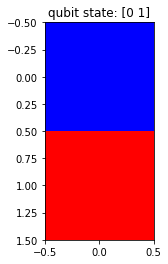

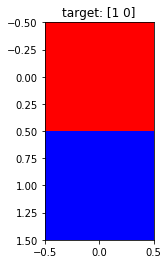

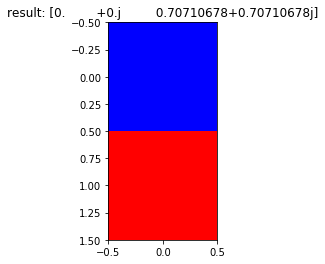

Generation: 10/10 Chromosome: 5/6
Quantum gate:
 [[ 0.70710678  0.70710678]
 [ 0.70710678 -0.70710678]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0.70710678 -0.70710678]
Fitness: 0.8634031590079495


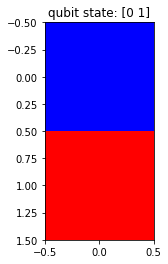

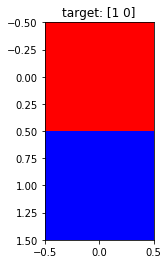

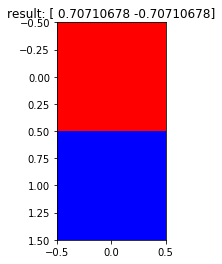

Generation: 10/10 Chromosome: 6/6
Quantum gate:
 [[ 1  0]
 [ 0 -1]]

Qubit: [0 1]
Target Qubit: [1 0]
Result: [ 0 -1]
Fitness: 0.6088593649824492


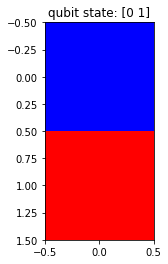

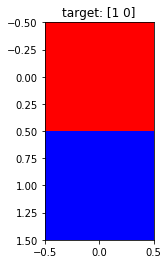

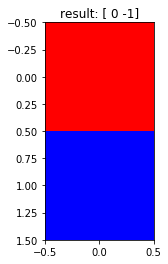

<Figure size 432x288 with 0 Axes>

In [2]:
flip_bit=evolve_gate(q_in=[0,1],q_out=[1,0],num_chroms=6,num_generations=10) #flipping the state of a qubit

#### The next cell is going to evolve the "SWAP" gate, which flips the individual states of two qubits in a two-qubit system. 

In [3]:
q_in = [1,1,0,0]
q_out = [0,0,1,1]

swap_qubits = evolve_gates(q_in=q_in,q_out=q_out)

Generation: 1/100 Chromosome: 1/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.        +0.j
   0.        +0.70710678j]
 [ 0.        +0.j         -0.70710678+0.j          0.        +0.70710678j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.70710678j -0.70710678+0.j
   0.        +0.j        ]
 [ 0.        +0.70710678j  0.        +0.j          0.        +0.j
  -0.70710678+0.j        ]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.70710678+0.j         -0.70710678+0.j          0.        +0.70710678j
  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 1/100 Chromosome: 2/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.  


Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.70710678+0.j         -0.70710678+0.j          0.        +0.70710678j
  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 13/100 Chromosome: 2/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.        +0.j
  -0.38268343+0.92387953j]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486
Generation: 13/100 Chromosome: 3/10
Quantum gate:
 [[1 0 0 0]
 [0 1 0 0]
 [0 0 0 1]
 [0 0 1 0]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 1 0 0]
Fitness: 0.4621171572403486
Generation: 13/100 Chromosome: 4/10
Qu

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.70710678+0.j         -0.70710678+0.j          0.        +0.70710678j
  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 23/100 Chromosome: 2/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.        +0.j
  -0.38268343+0.92387953j]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486
Generation: 23/100 Chromosome: 3/10
Quantum gate:
 [[1 0 0 0]
 [0 1 0 0]
 [0 0 0 1]
 [0 0 1 0]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 1 0 0]
Fitness: 0.4621171572403486
Generation: 23/100 Chromosome: 4/10
Qua

Fitness: 0.4621171572403486
Generation: 36/100 Chromosome: 6/10
Quantum gate:
 [[1 0 0 0]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 0 1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 36/100 Chromosome: 7/10
Quantum gate:
 [[ 1  0  0  0]
 [ 0  0  1  0]
 [ 0  1  0  0]
 [ 0  0  0 -1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 36/100 Chromosome: 8/10
Quantum gate:
 [[ 1  0  0  0]
 [ 0  0  1  0]
 [ 0  1  0  0]
 [ 0  0  0 -1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 36/100 Chromosome: 9/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         

Generation: 46/100 Chromosome: 1/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.        +0.j
   0.        +0.70710678j]
 [ 0.        +0.j         -0.70710678+0.j          0.        +0.70710678j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.70710678j -0.70710678+0.j
   0.        +0.j        ]
 [ 0.        +0.70710678j  0.        +0.j          0.        +0.j
  -0.70710678+0.j        ]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.70710678+0.j         -0.70710678+0.j          0.        +0.70710678j
  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 46/100 Chromosome: 2/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.

  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 55/100 Chromosome: 1/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.        +0.j
   0.        +0.70710678j]
 [ 0.        +0.j         -0.70710678+0.j          0.        +0.70710678j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.70710678j -0.70710678+0.j
   0.        +0.j        ]
 [ 0.        +0.70710678j  0.        +0.j          0.        +0.j
  -0.70710678+0.j        ]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.70710678+0.j         -0.70710678+0.j          0.        +0.70710678j
  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 55/100 Chromosome: 2/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]

Generation: 65/100 Chromosome: 7/10
Quantum gate:
 [[ 1  0  0  0]
 [ 0  0  1  0]
 [ 0  1  0  0]
 [ 0  0  0 -1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 65/100 Chromosome: 8/10
Quantum gate:
 [[ 1  0  0  0]
 [ 0  0  1  0]
 [ 0  1  0  0]
 [ 0  0  0 -1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 65/100 Chromosome: 9/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.        +0.j
  -0.38268343+0.92387953j]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486


Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486
Generation: 73/100 Chromosome: 10/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.        +0.j
   0.        +0.70710678j]
 [ 0.        +0.j         -0.70710678+0.j          0.        +0.70710678j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.70710678j -0.70710678+0.j
   0.        +0.j        ]
 [ 0.        +0.70710678j  0.        +0.j          0.        +0.j
  -0.70710678+0.j        ]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.70710678+0.j         -0.70710678+0.j          0.        +0.70710678j
  0.        +0.70710678j]
Fitness: 0.4621171572403486
Generation: 74/100 Chromosome: 1/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.        +0.j
   0.        +0.70710678j]
 [ 0.        +0.j         -0.70710678+0.j          0.        +0.70710678j
   


Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 81/100 Chromosome: 8/10
Quantum gate:
 [[ 1  0  0  0]
 [ 0  0  1  0]
 [ 0  1  0  0]
 [ 0  0  0 -1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 81/100 Chromosome: 9/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.        +0.j
  -0.38268343+0.92387953j]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486
Generation: 81/100 Chromosome: 10/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.      

Result: [1 1 0 0]
Fitness: 0.4621171572403486
Generation: 89/100 Chromosome: 4/10
Quantum gate:
 [[ 1  0  0  0]
 [ 0  0  1  0]
 [ 0  1  0  0]
 [ 0  0  0 -1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 89/100 Chromosome: 5/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.        +0.j
  -0.38268343+0.92387953j]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486
Generation: 89/100 Chromosome: 6/10
Quantum gate:
 [[1 0 0 0]
 [0 0 1 0]
 [0 1 0 0]
 [0 0 0 1]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [1 0 1 

Result: [1 0 1 0]
Fitness: 0.6088593649824492
Generation: 98/100 Chromosome: 9/10
Quantum gate:
 [[-0.38268343+0.92387953j  0.        +0.j          0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j         -0.38268343-0.92387953j  0.        +0.j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j         -0.38268343-0.92387953j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.j          0.        +0.j
  -0.38268343+0.92387953j]]

Qubit: [1 1 0 0]
Target Qubit: [0 0 1 1]
Result: [-0.38268343+0.92387953j -0.38268343-0.92387953j  0.        +0.j
  0.        +0.j        ]
Fitness: 0.4621171572403486
Generation: 98/100 Chromosome: 10/10
Quantum gate:
 [[-0.70710678+0.j          0.        +0.j          0.        +0.j
   0.        +0.70710678j]
 [ 0.        +0.j         -0.70710678+0.j          0.        +0.70710678j
   0.        +0.j        ]
 [ 0.        +0.j          0.        +0.70710678j -0.70710678+0.j
   0.        +0.j        ]
 [ 0.        +


#### scipy allows the creation of random unitary matrices of dim=N, so now we can perform our genetic algorithm experiment properly by letting our search space be the entirety $U(n)$. Note that we still need to remember not all chromosomes/gates will be physically simple to implement on given hardware. We are assuming for the purposes of the experiment that all quantum gates are equally simple to implement in terms of hardware. 

#### I included an argparse script to run the genetic algorithm in this repo as well. We see the space $U(n)$ "large" and it takes many more chromosomes and/or generations to achieve high (>0.8) fitness. 



Generation: 1/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

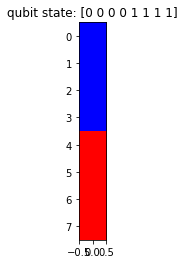

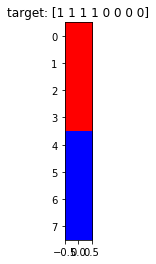

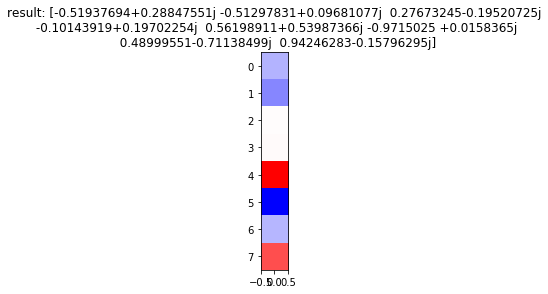

Generation: 1/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

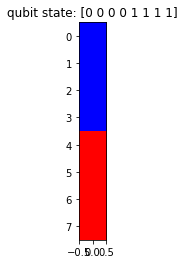

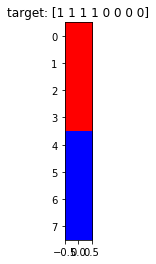

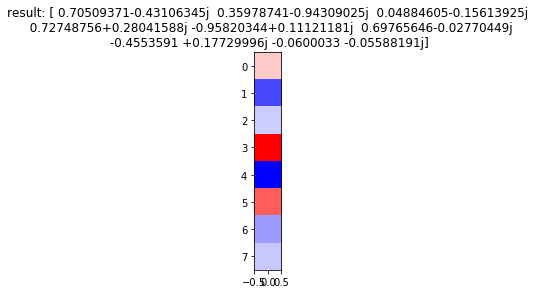

Generation: 1/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

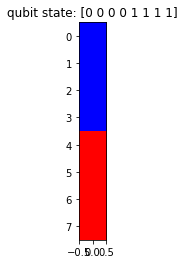

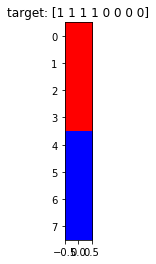

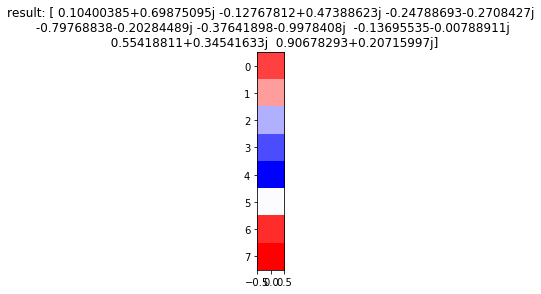

Generation: 1/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

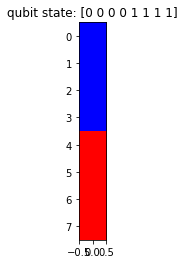

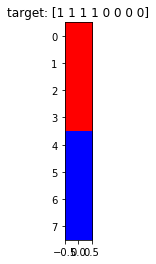

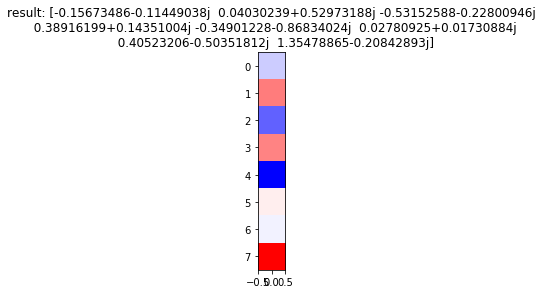

Generation: 1/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

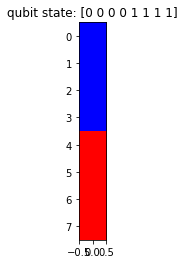

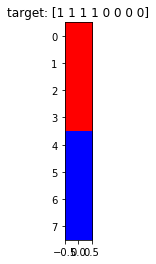

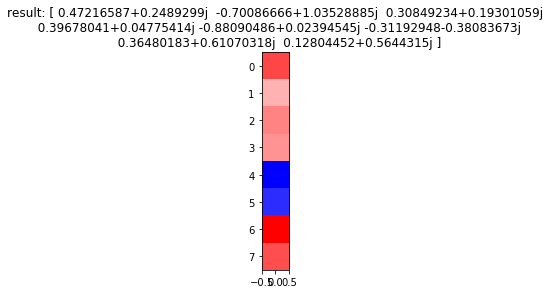

Generation: 1/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

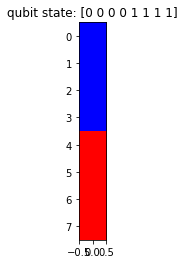

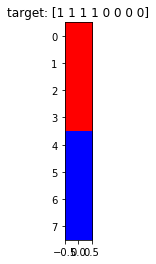

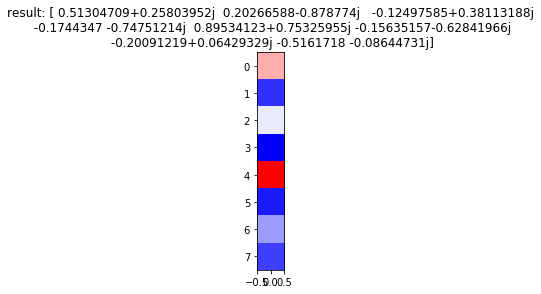

Generation: 1/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

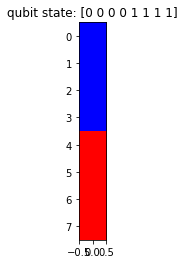

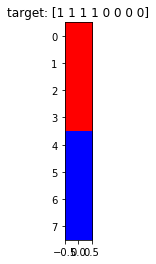

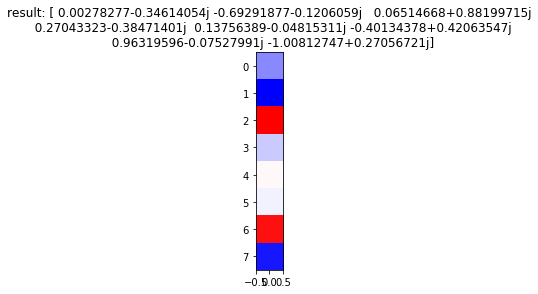

Generation: 1/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

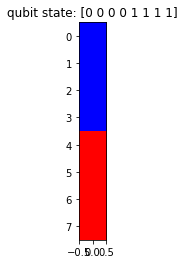

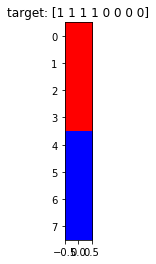

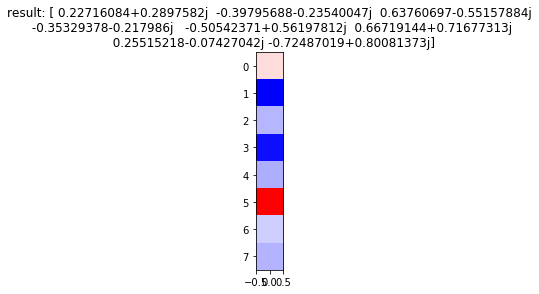

Generation: 1/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

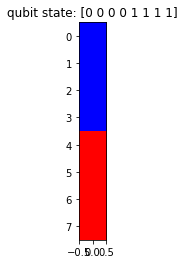

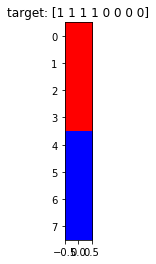

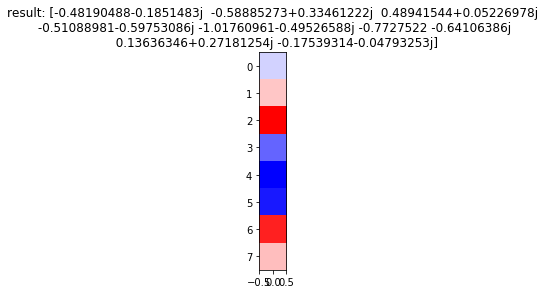

Generation: 1/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

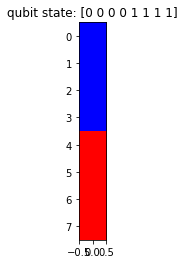

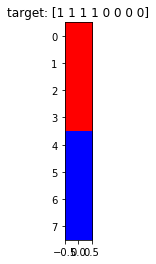

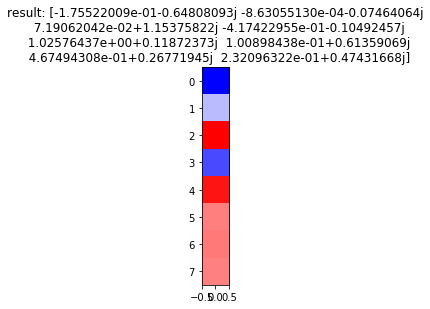

Generation: 2/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

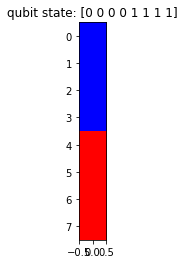

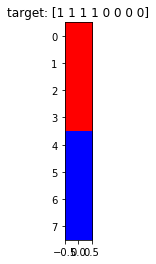

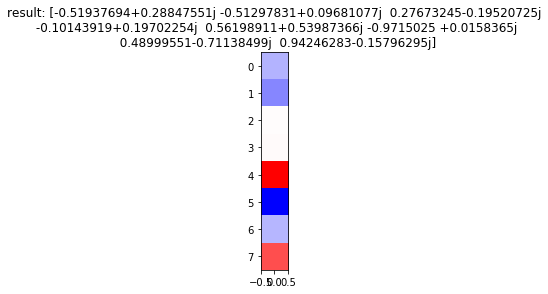

Generation: 2/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

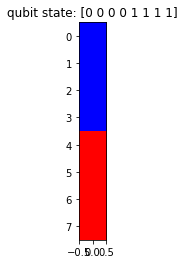

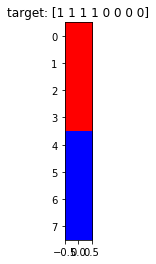

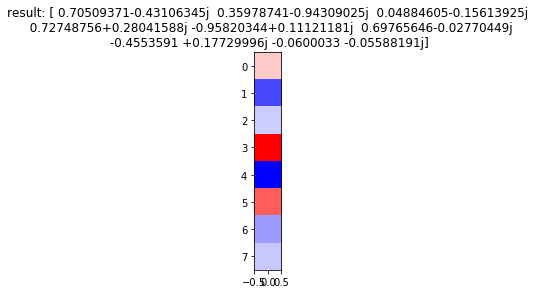

Generation: 2/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

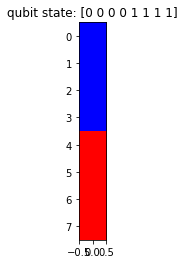

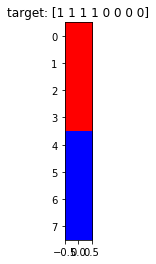

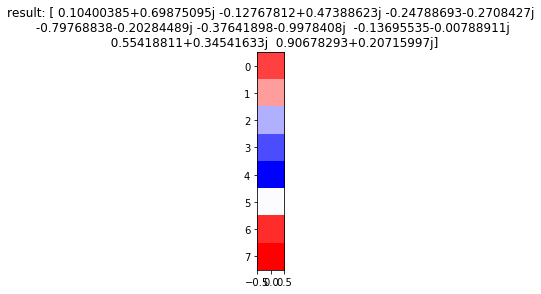

Generation: 2/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

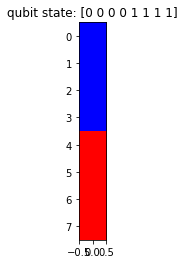

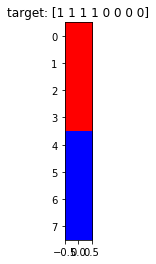

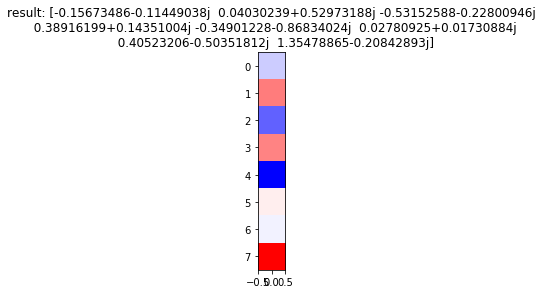

Generation: 2/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

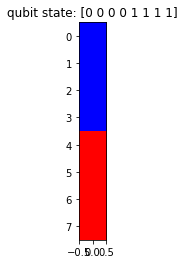

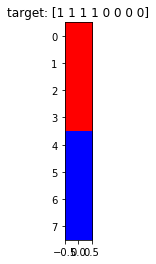

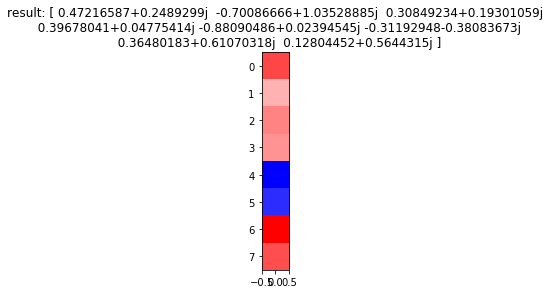

Generation: 2/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

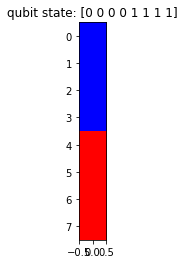

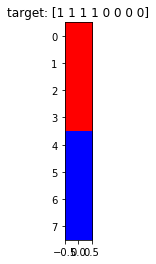

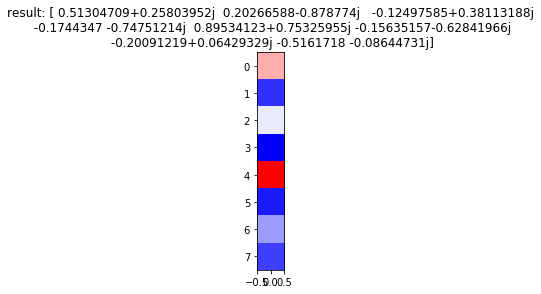

Generation: 2/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

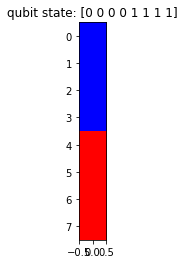

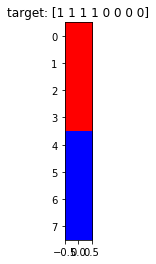

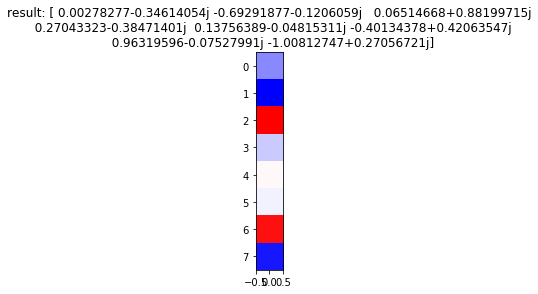

Generation: 2/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

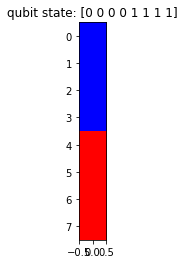

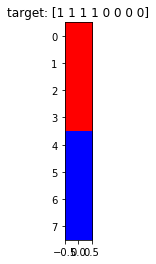

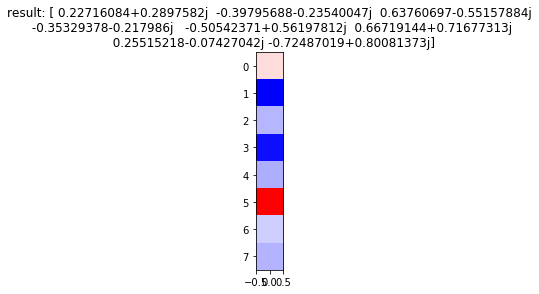

Generation: 2/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

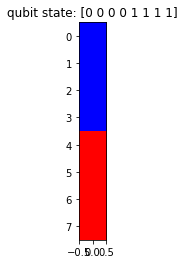

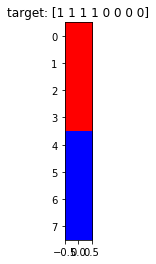

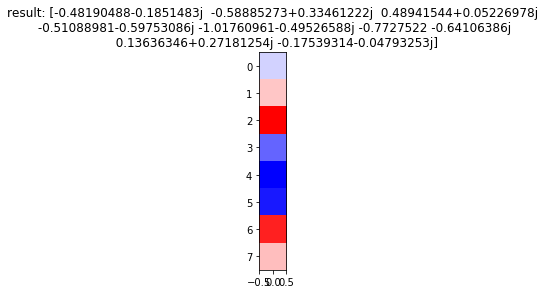

Generation: 2/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

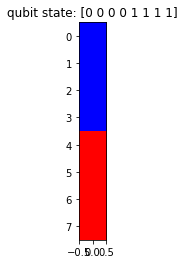

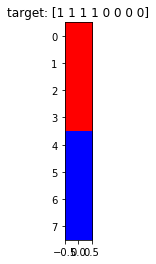

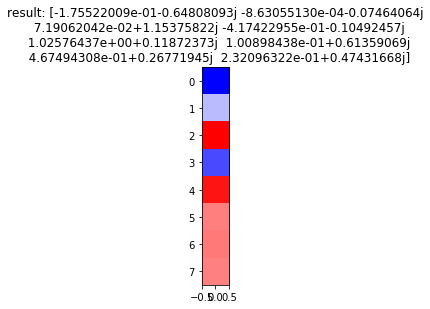

Generation: 3/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

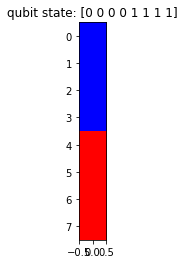

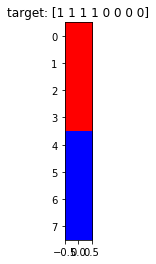

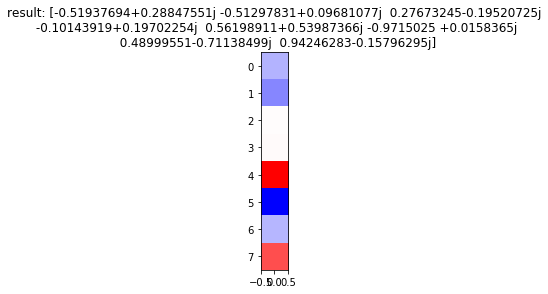

Generation: 3/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

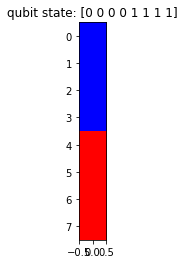

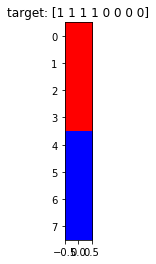

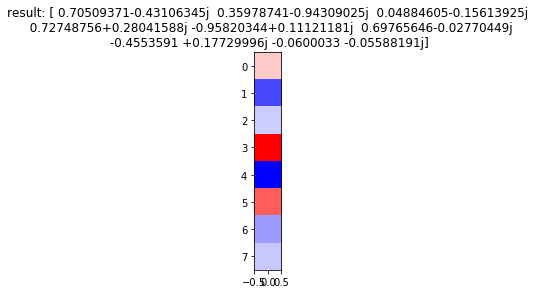

Generation: 3/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

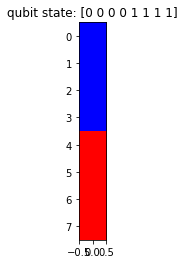

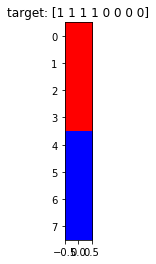

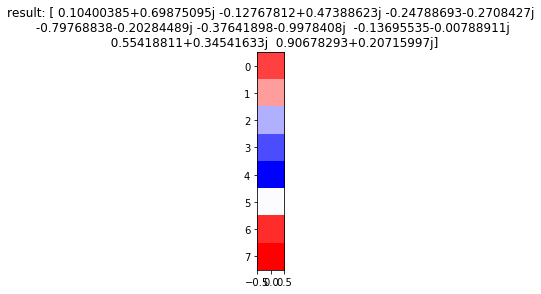

Generation: 3/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

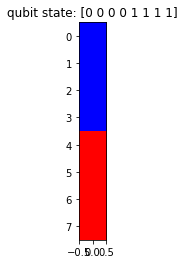

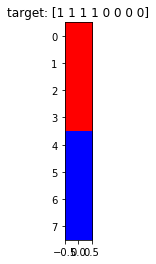

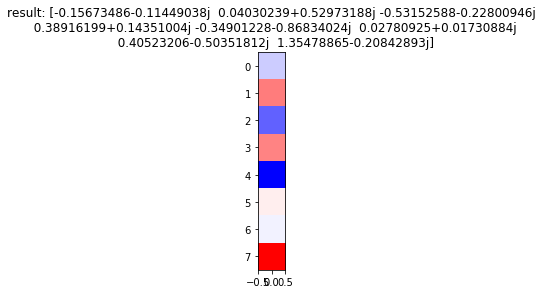

Generation: 3/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

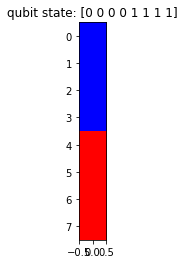

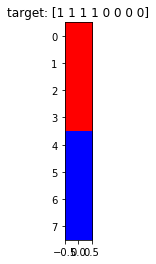

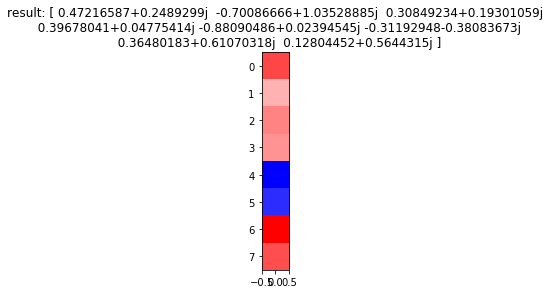

Generation: 3/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

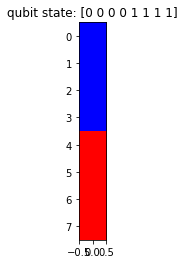

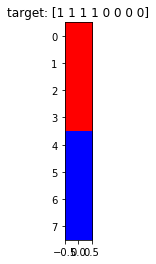

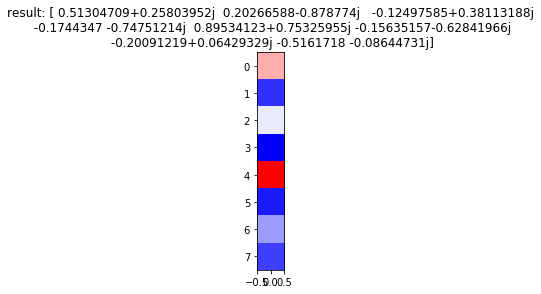

Generation: 3/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

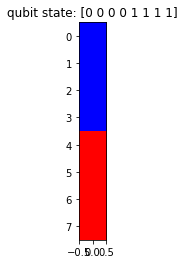

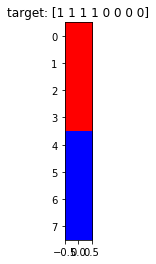

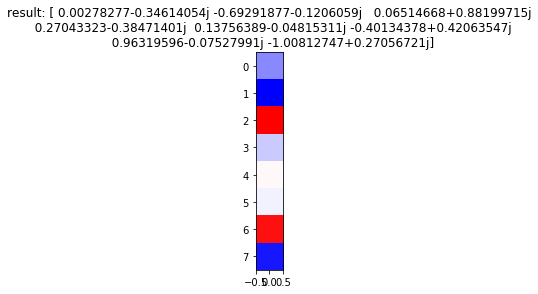

Generation: 3/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

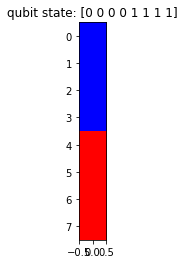

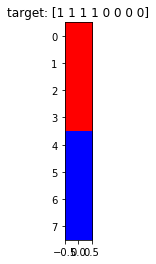

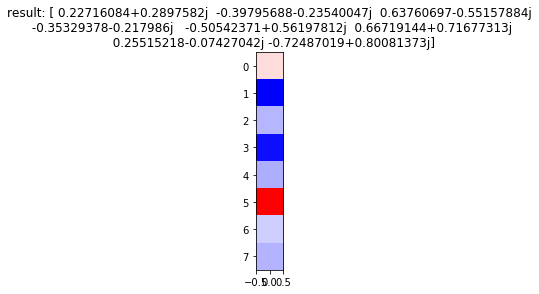

Generation: 3/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

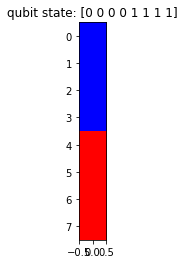

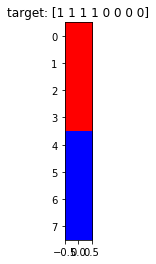

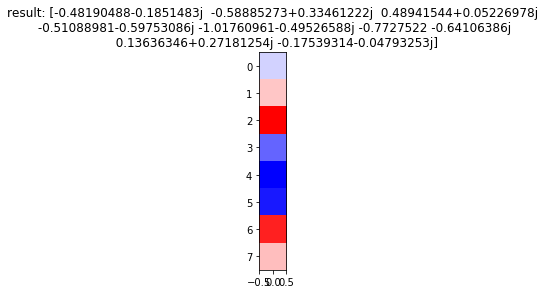

Generation: 3/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

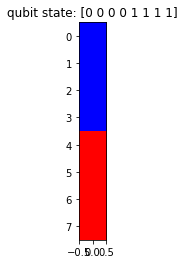

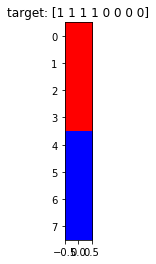

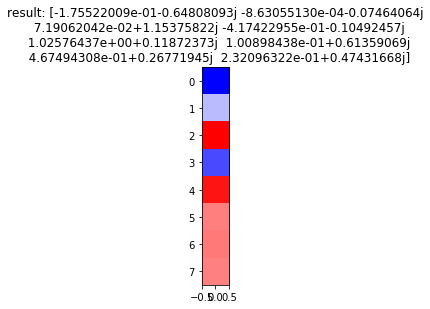

Generation: 4/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

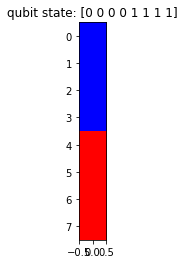

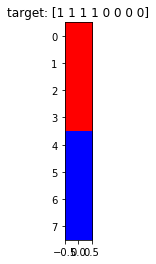

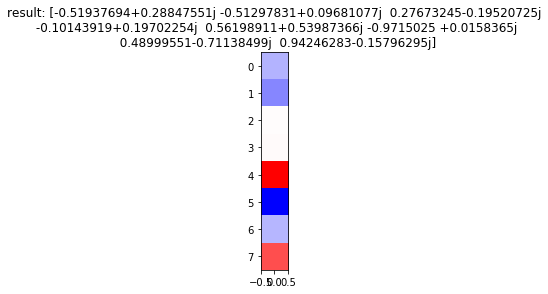

Generation: 4/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

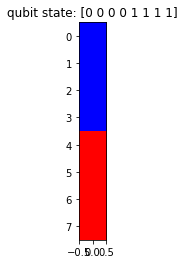

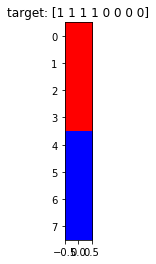

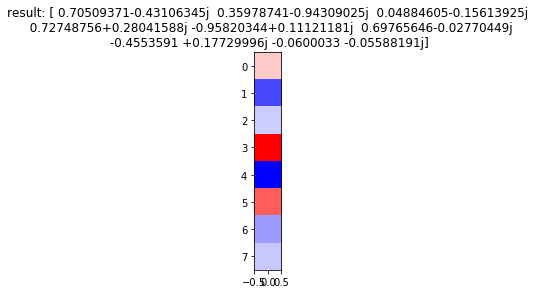

Generation: 4/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

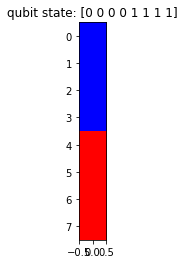

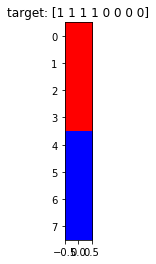

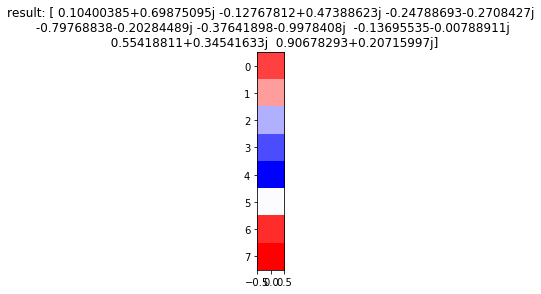

Generation: 4/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

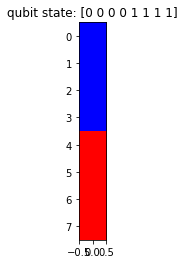

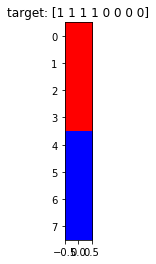

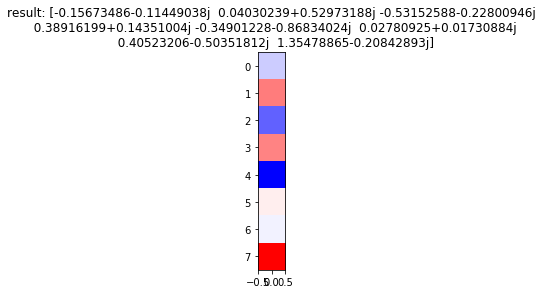

Generation: 4/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

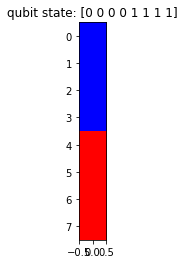

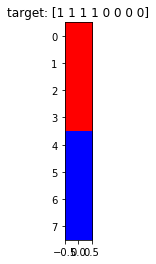

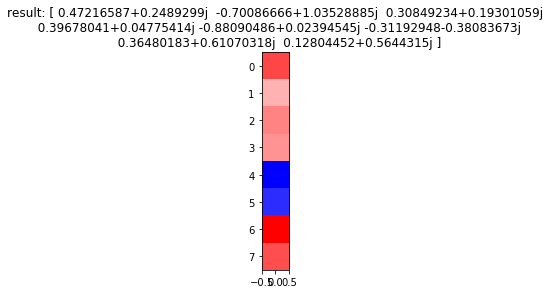

Generation: 4/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

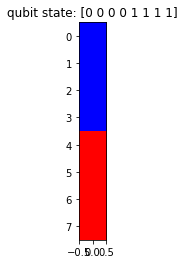

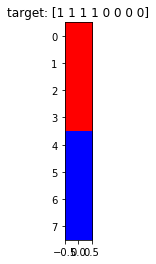

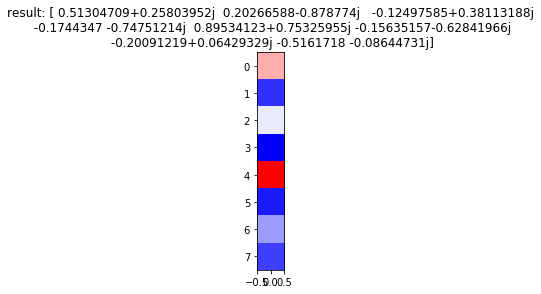

Generation: 4/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

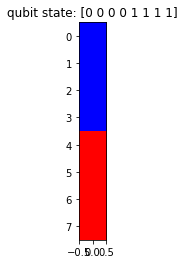

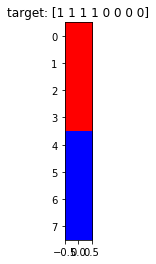

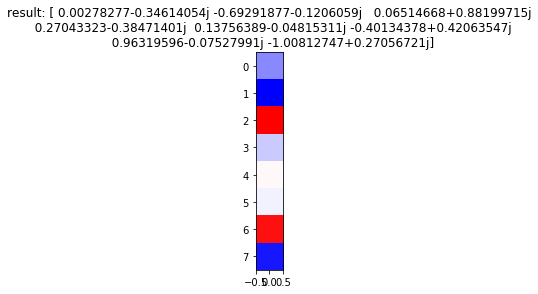

Generation: 4/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

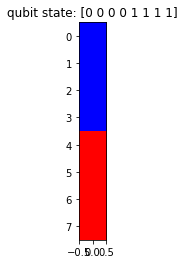

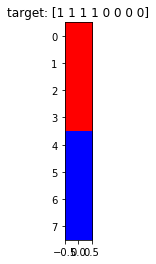

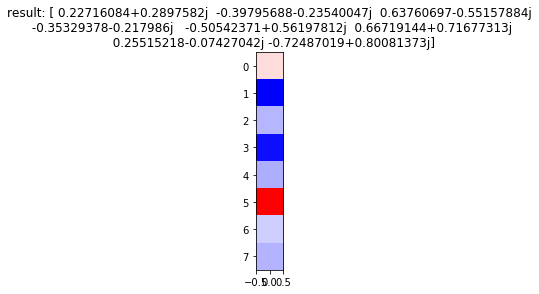

Generation: 4/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

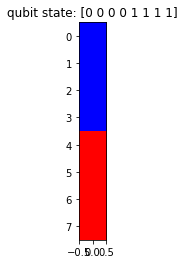

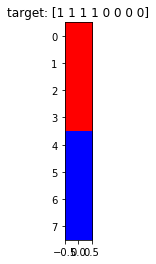

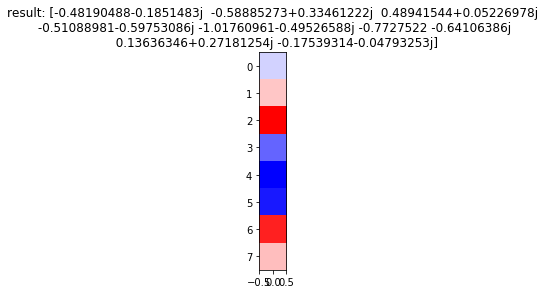

Generation: 4/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

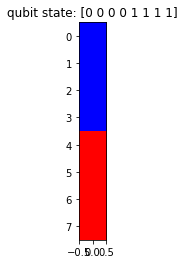

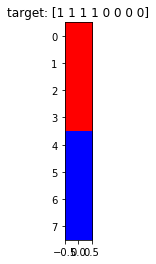

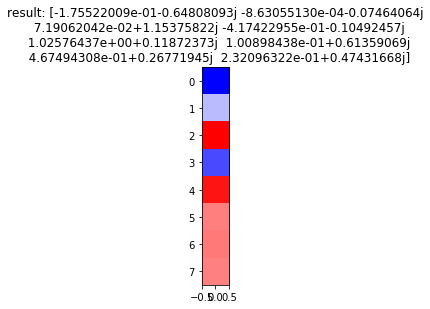

Generation: 5/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

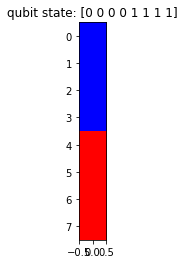

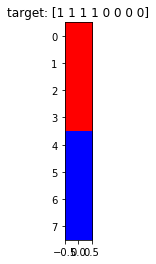

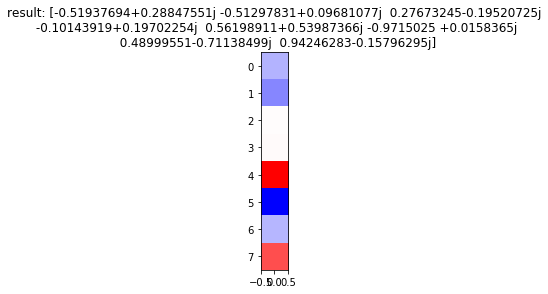

Generation: 5/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

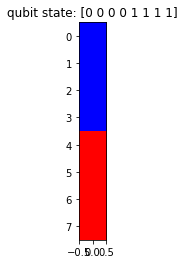

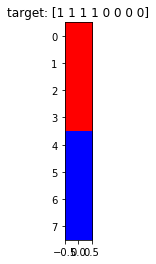

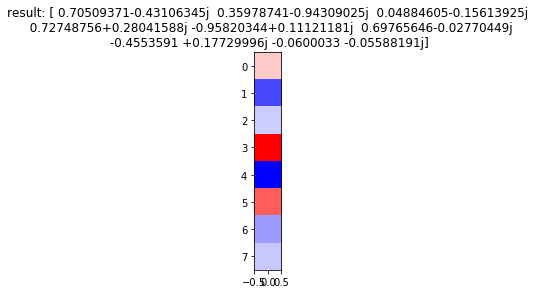

Generation: 5/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

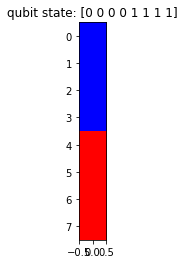

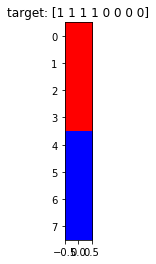

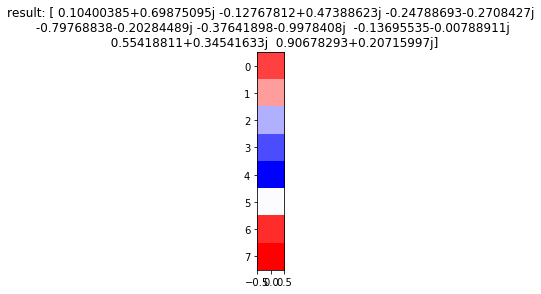

Generation: 5/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

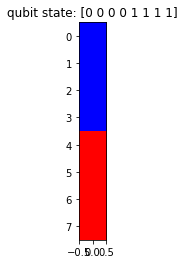

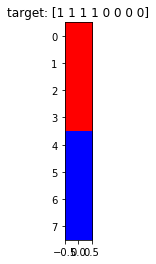

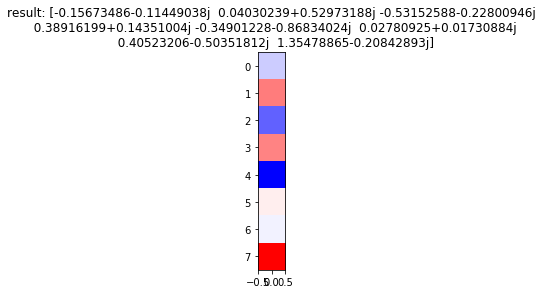

Generation: 5/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

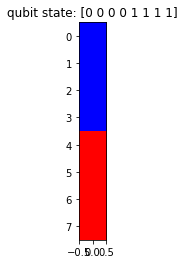

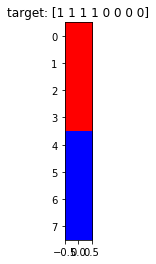

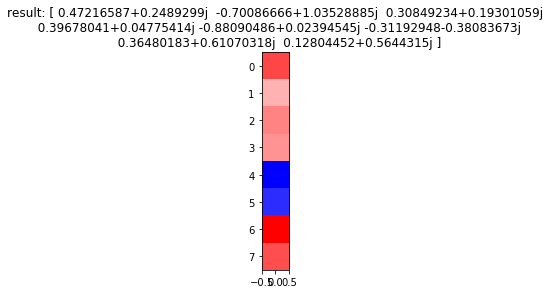

Generation: 5/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

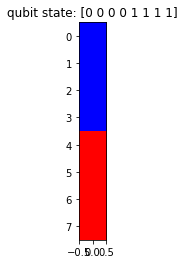

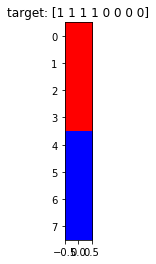

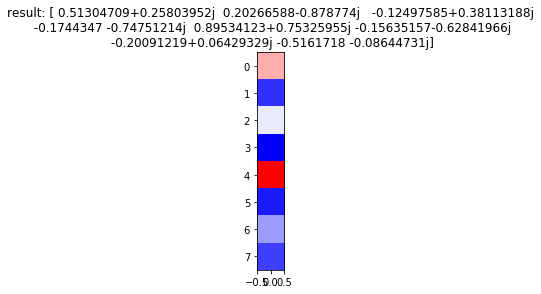

Generation: 5/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

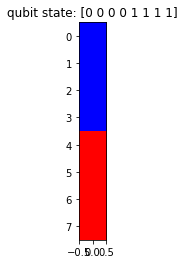

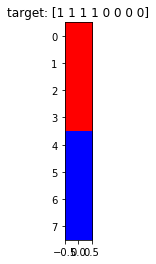

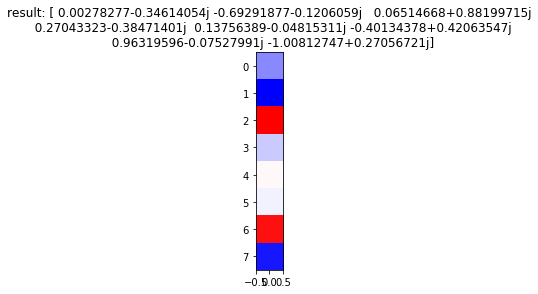

Generation: 5/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

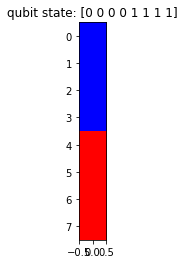

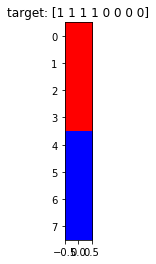

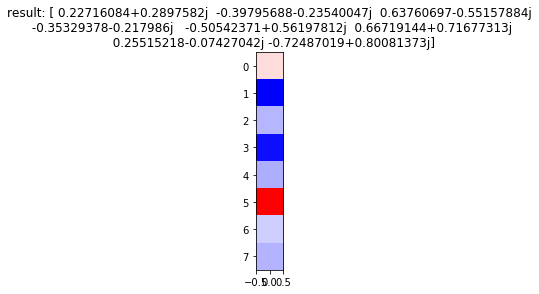

Generation: 5/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

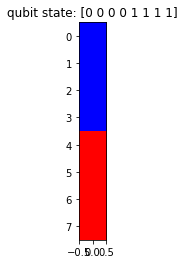

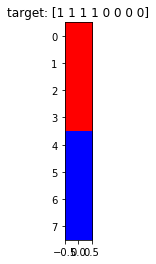

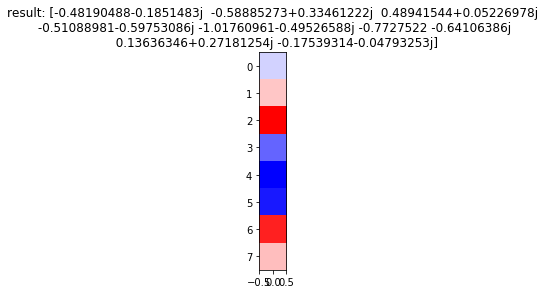

Generation: 5/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

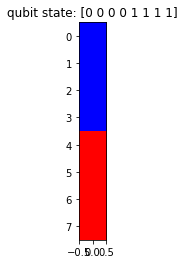

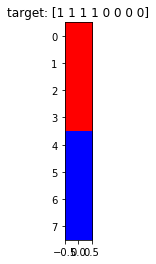

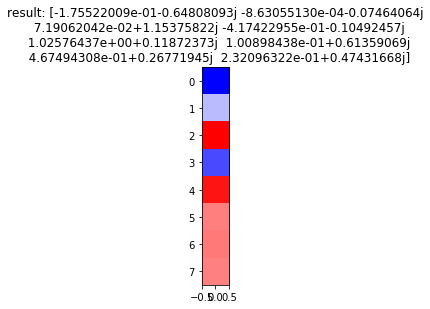

Generation: 6/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

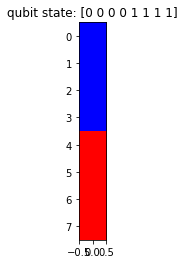

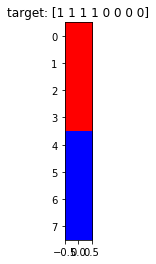

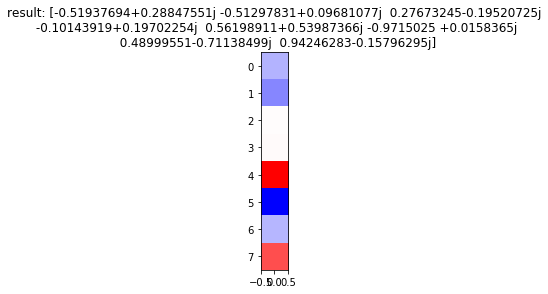

Generation: 6/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

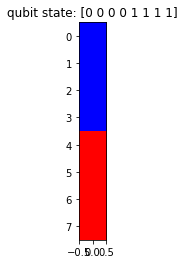

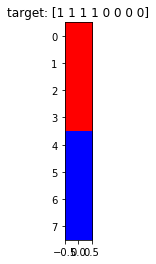

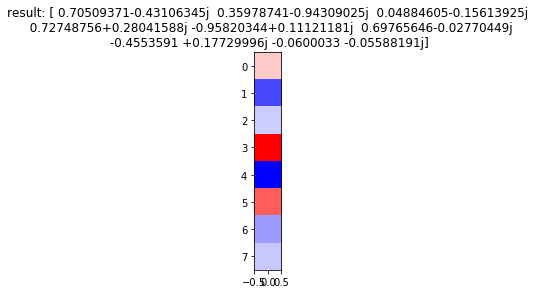

Generation: 6/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

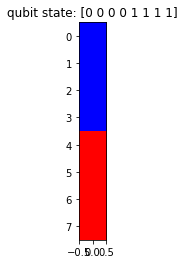

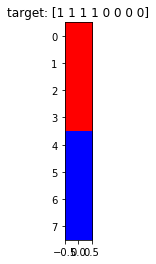

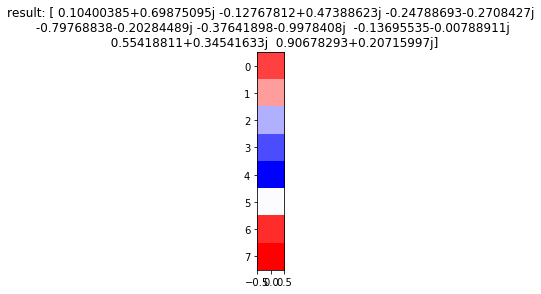

Generation: 6/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

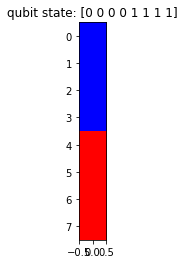

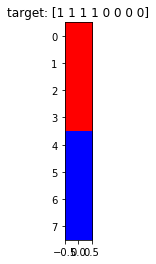

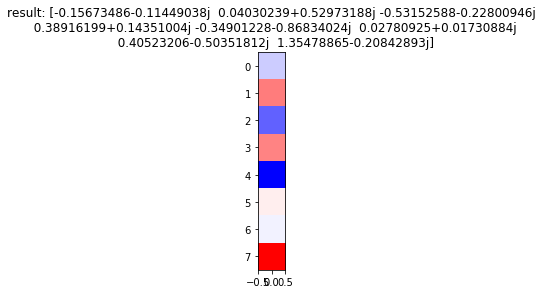

Generation: 6/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

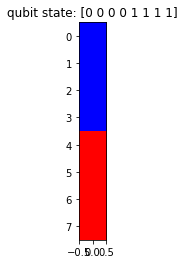

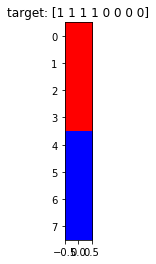

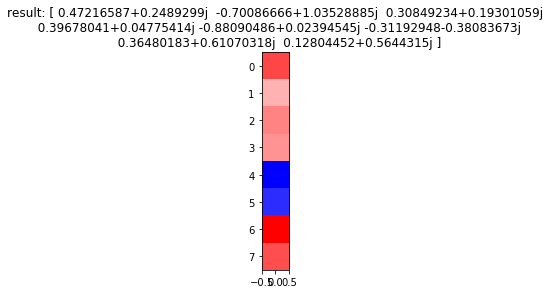

Generation: 6/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

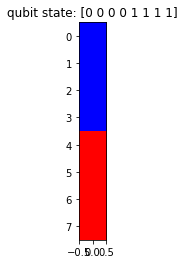

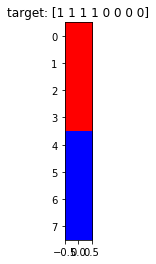

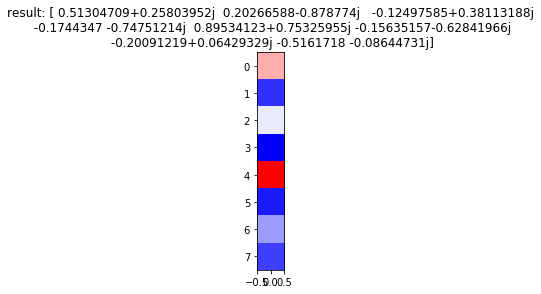

Generation: 6/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

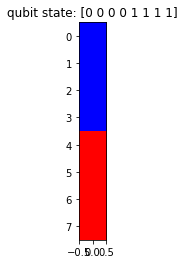

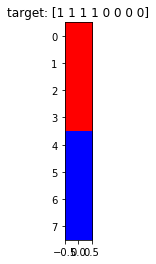

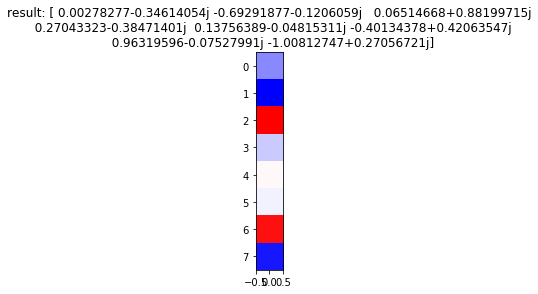

Generation: 6/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

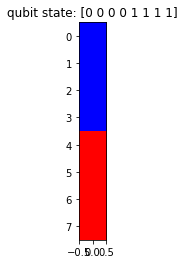

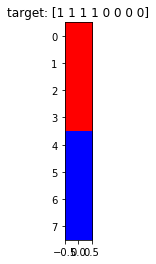

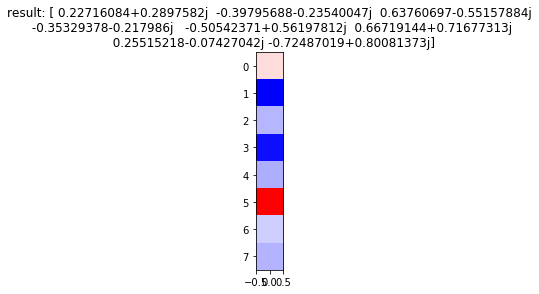

Generation: 6/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

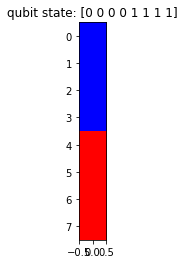

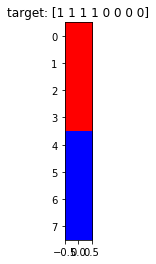

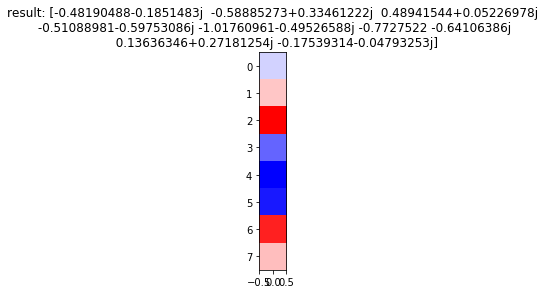

Generation: 6/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

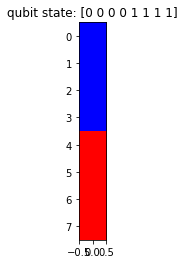

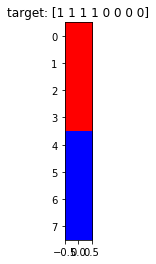

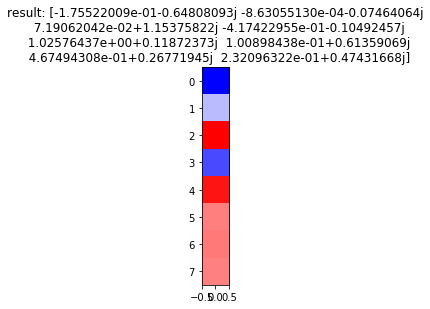

Generation: 7/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

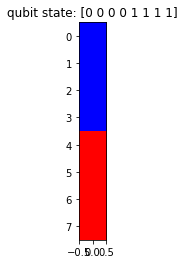

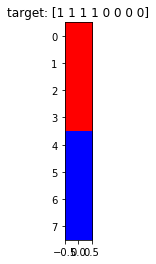

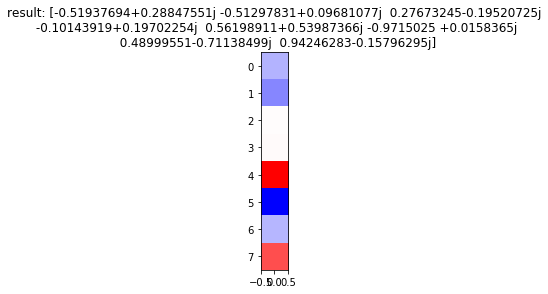

Generation: 7/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

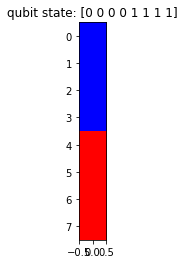

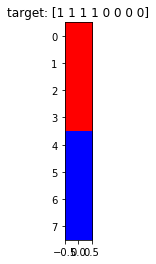

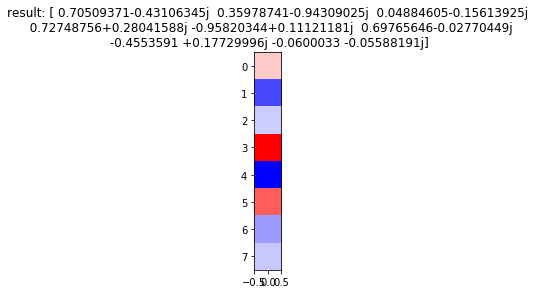

Generation: 7/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

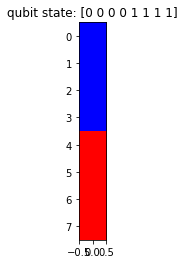

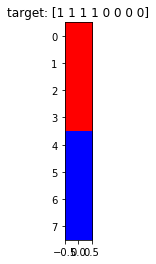

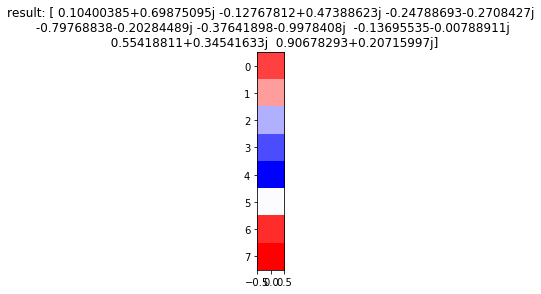

Generation: 7/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

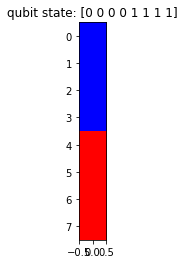

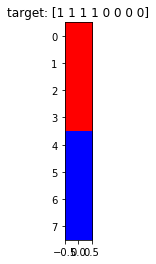

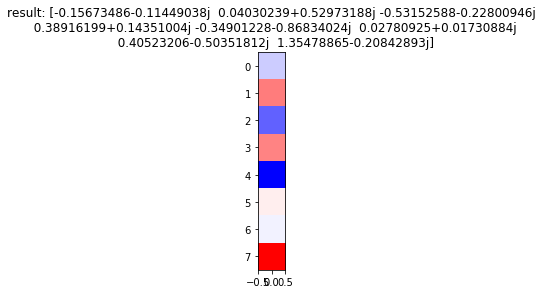

Generation: 7/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

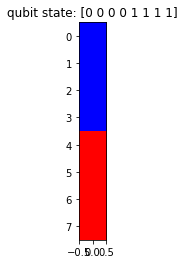

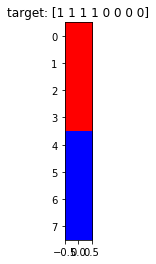

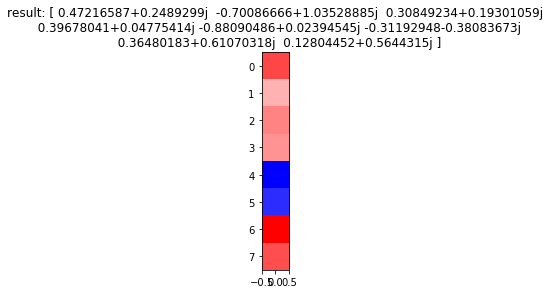

Generation: 7/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

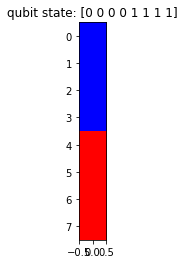

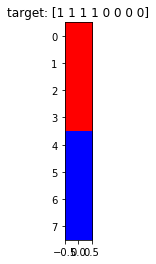

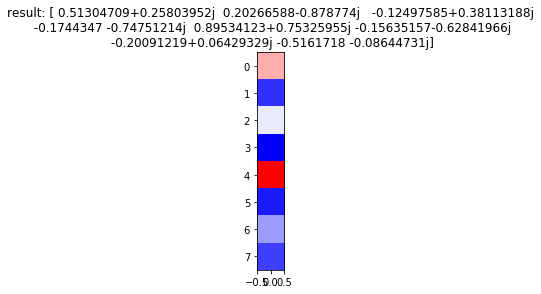

Generation: 7/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

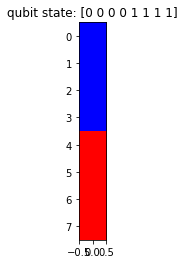

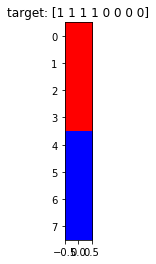

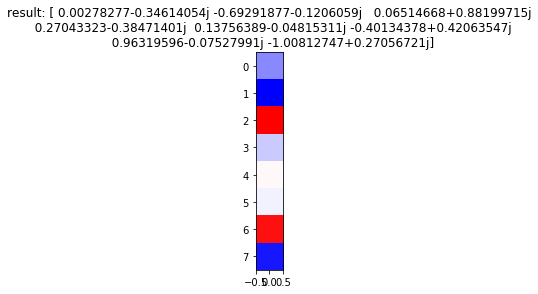

Generation: 7/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

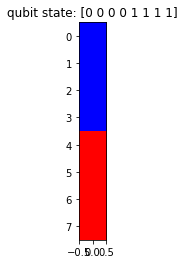

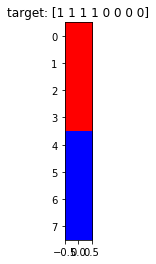

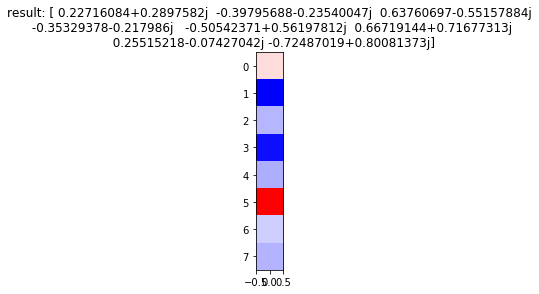

Generation: 7/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

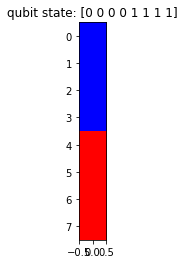

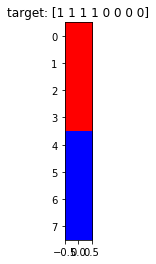

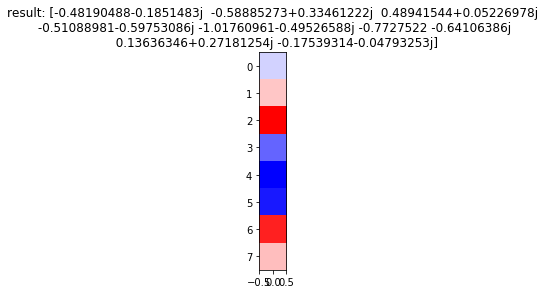

Generation: 7/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

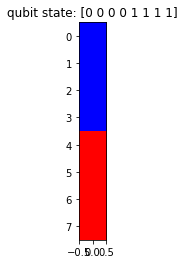

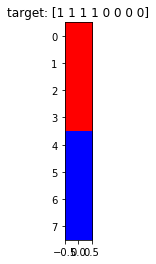

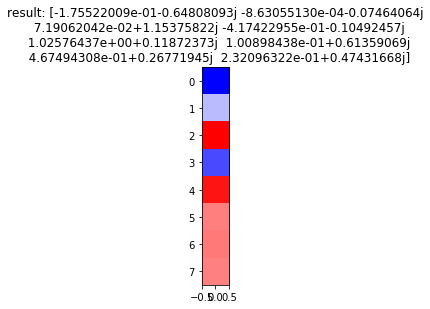

Generation: 8/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

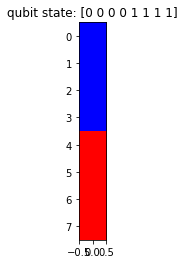

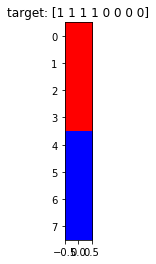

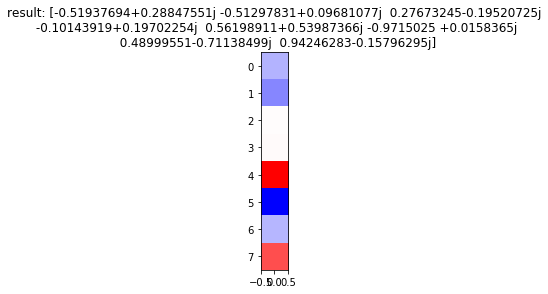

Generation: 8/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

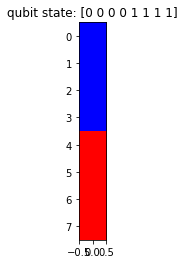

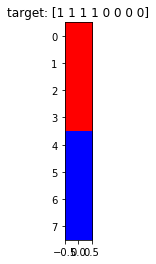

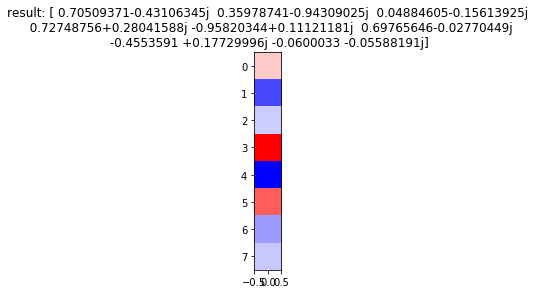

Generation: 8/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

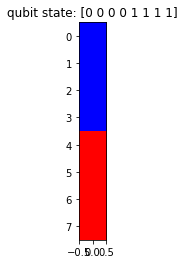

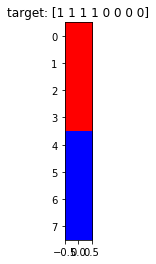

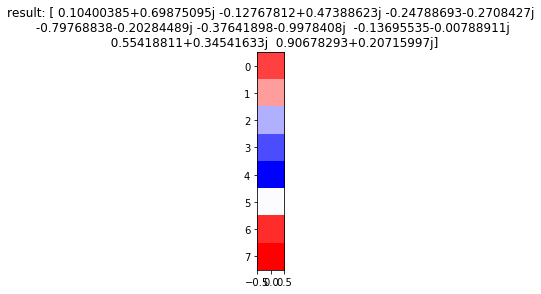

Generation: 8/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

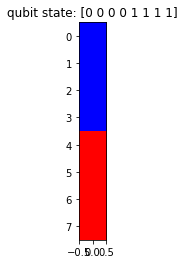

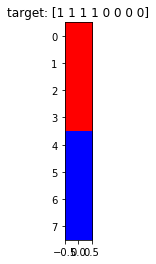

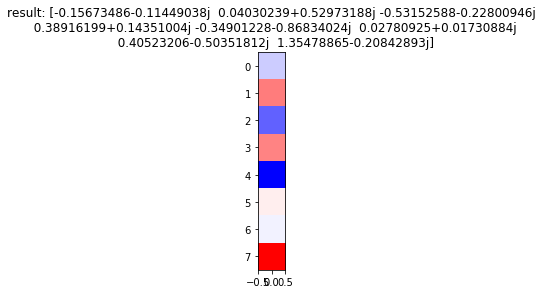

Generation: 8/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

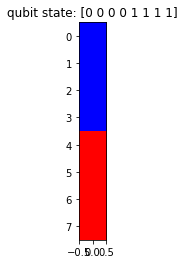

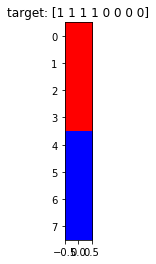

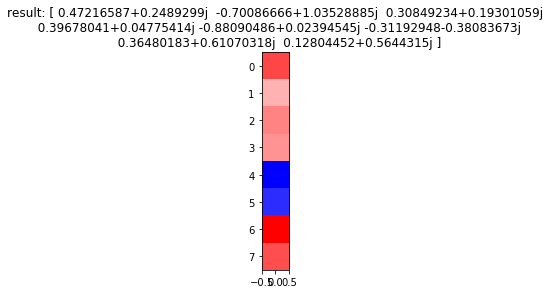

Generation: 8/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

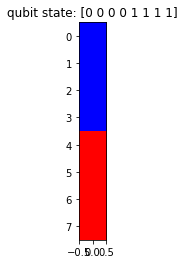

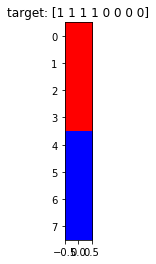

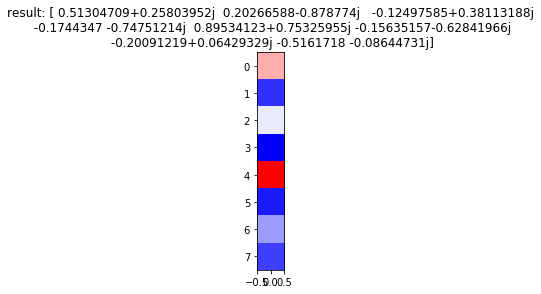

Generation: 8/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

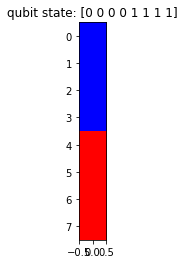

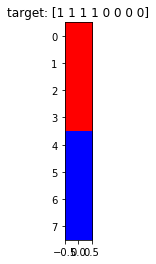

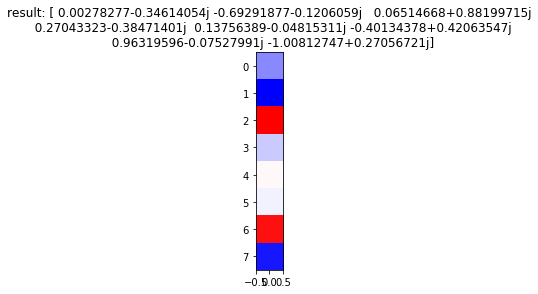

Generation: 8/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

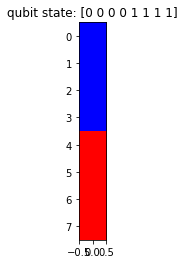

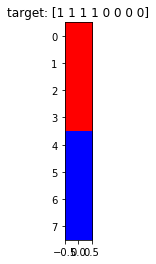

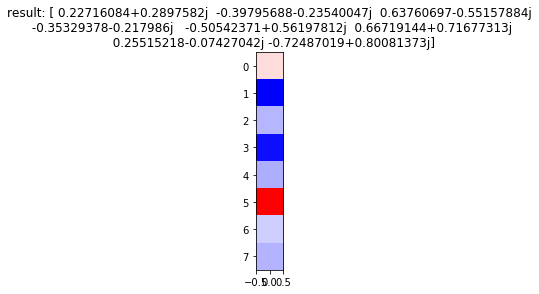

Generation: 8/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

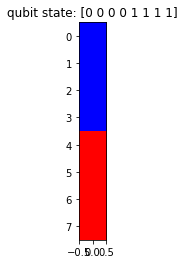

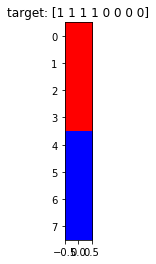

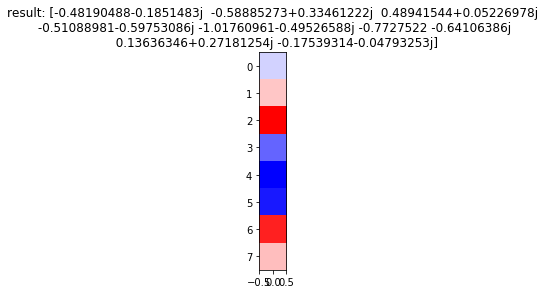

Generation: 8/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

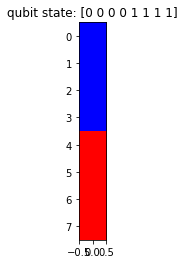

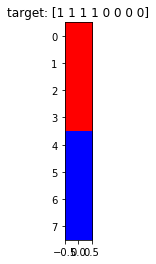

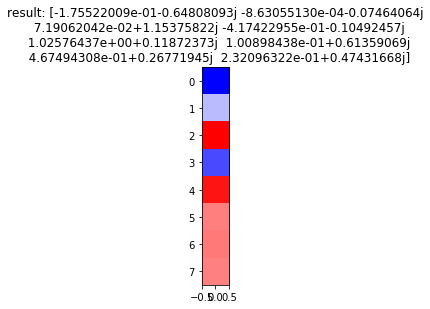

Generation: 9/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.5375

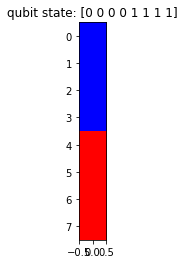

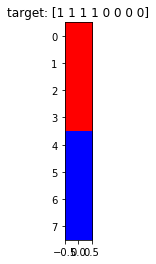

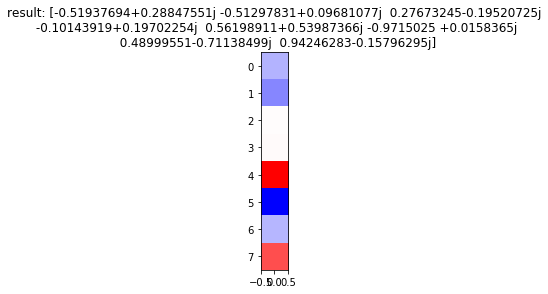

Generation: 9/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.57103

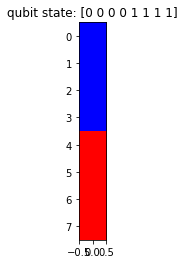

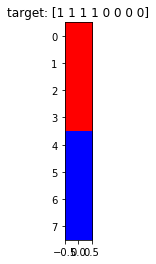

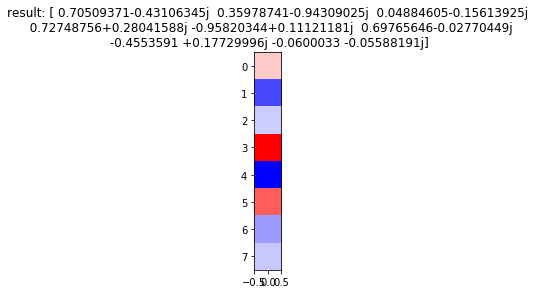

Generation: 9/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.029

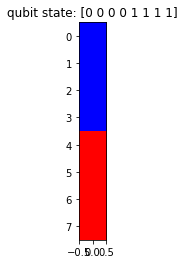

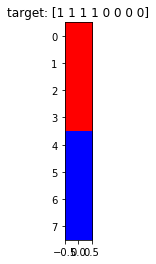

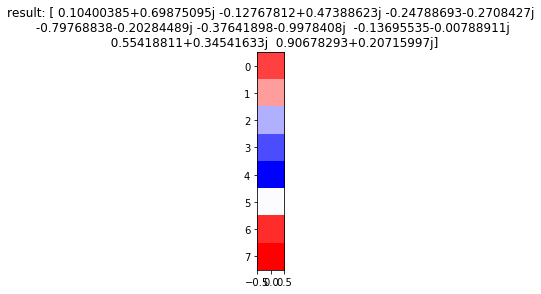

Generation: 9/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.14479

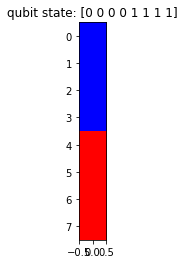

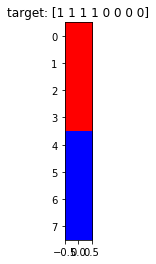

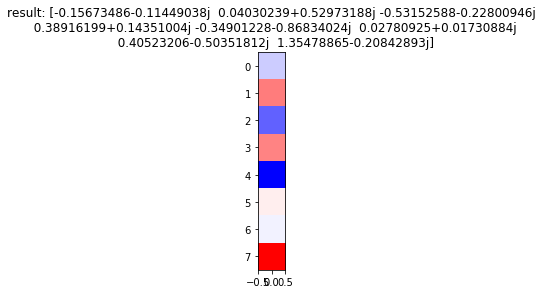

Generation: 9/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.0909

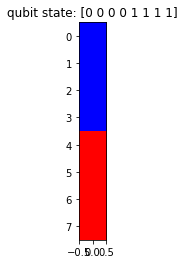

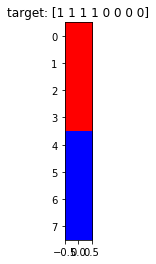

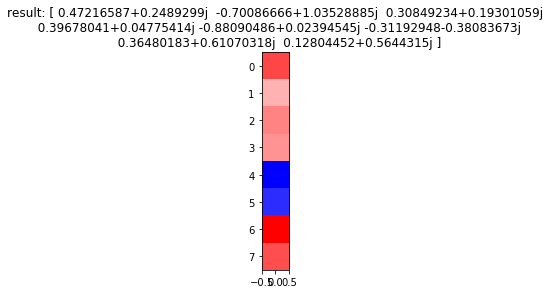

Generation: 9/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.01

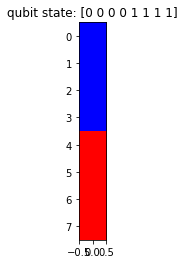

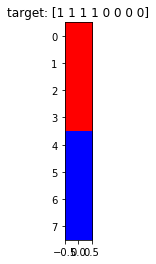

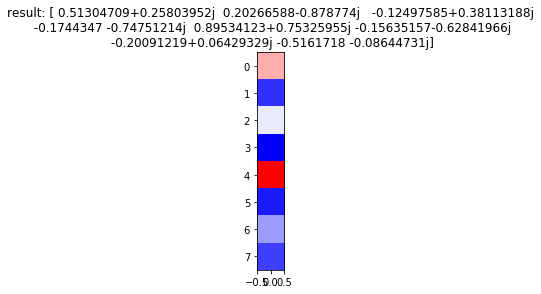

Generation: 9/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.20

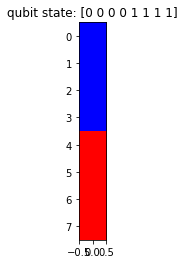

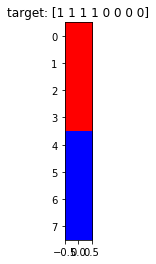

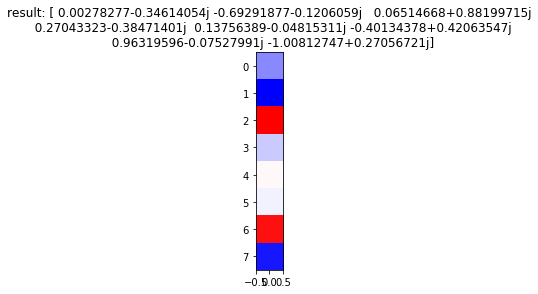

Generation: 9/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.06

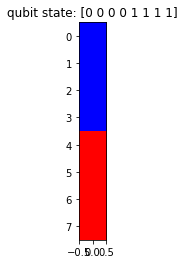

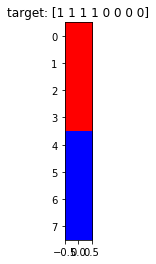

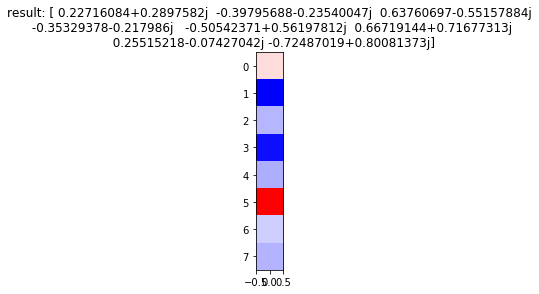

Generation: 9/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.1974

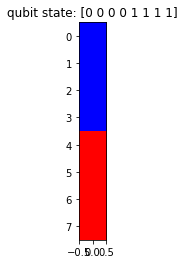

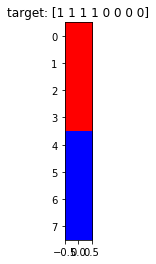

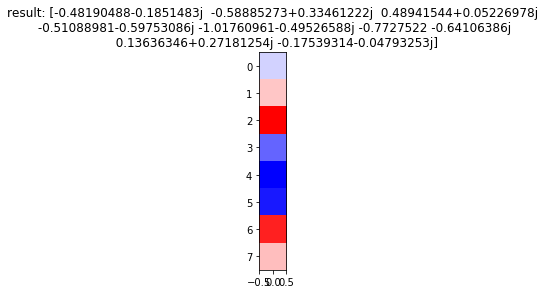

Generation: 9/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.240

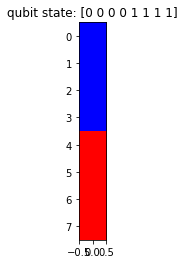

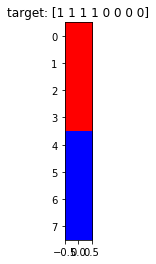

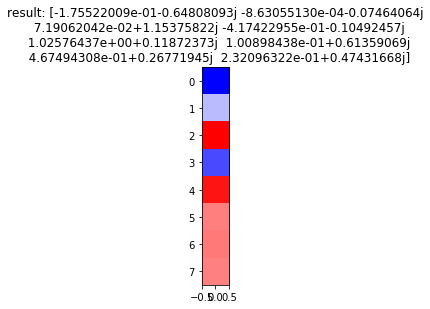

Generation: 10/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

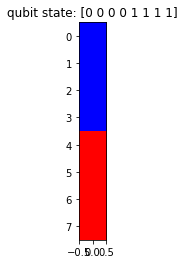

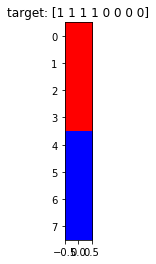

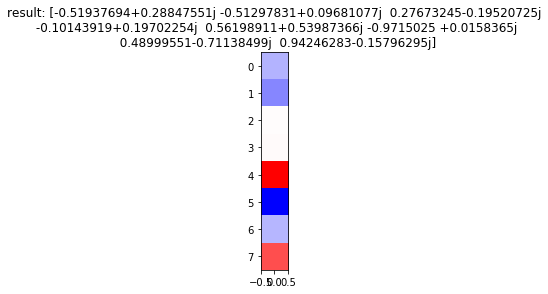

Generation: 10/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

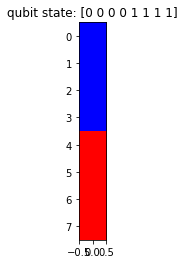

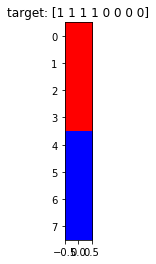

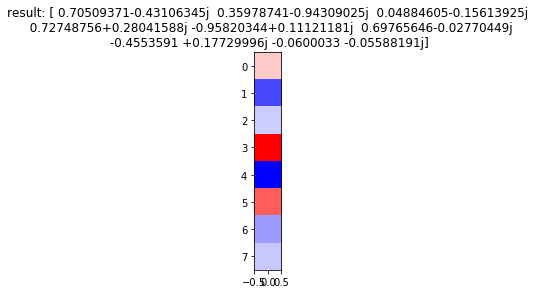

Generation: 10/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

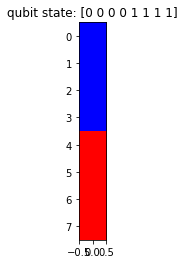

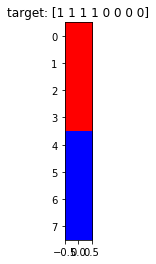

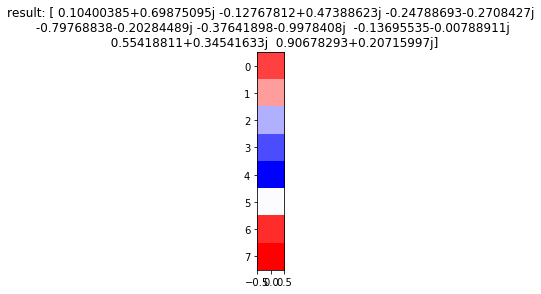

Generation: 10/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

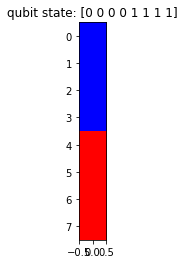

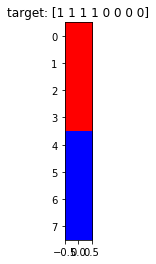

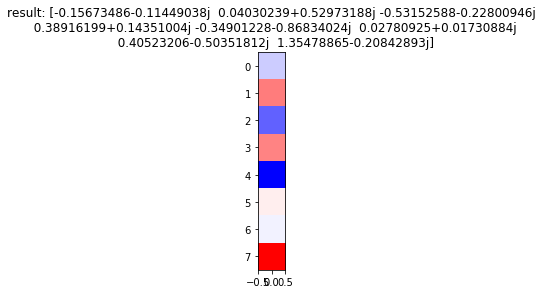

Generation: 10/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

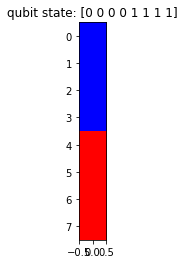

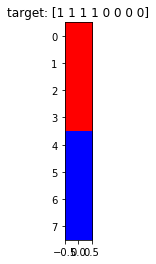

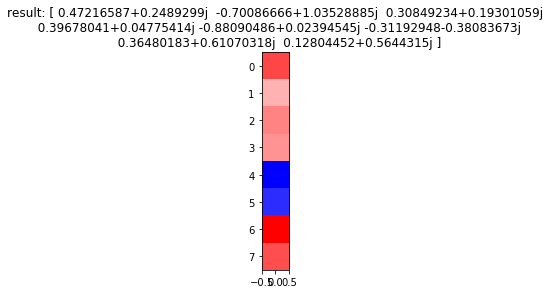

Generation: 10/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

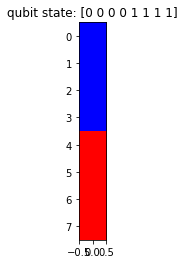

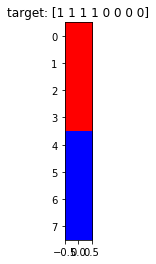

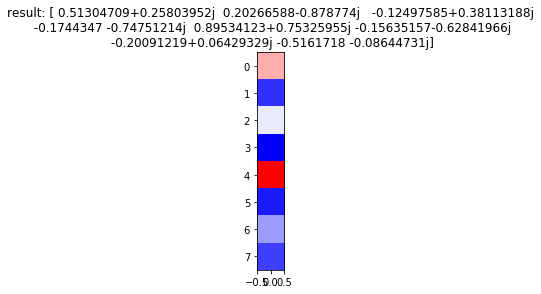

Generation: 10/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

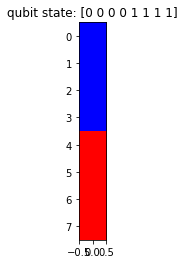

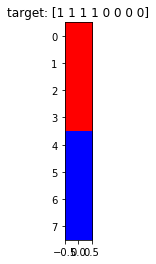

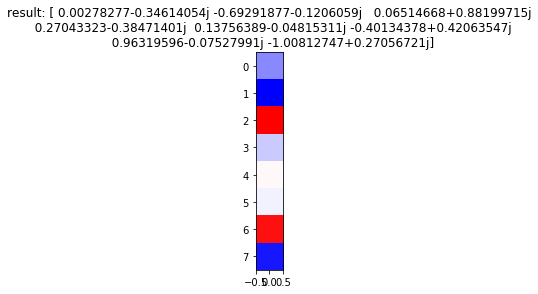

Generation: 10/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

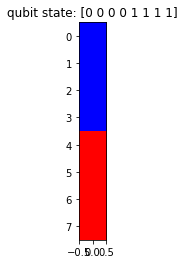

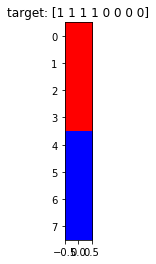

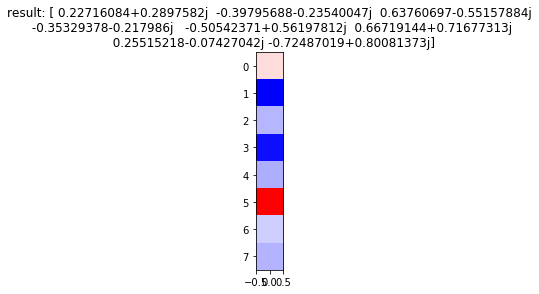

Generation: 10/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

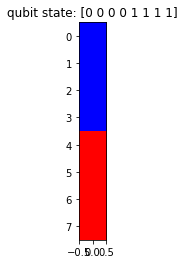

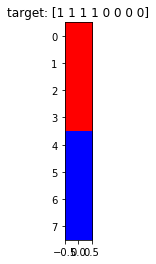

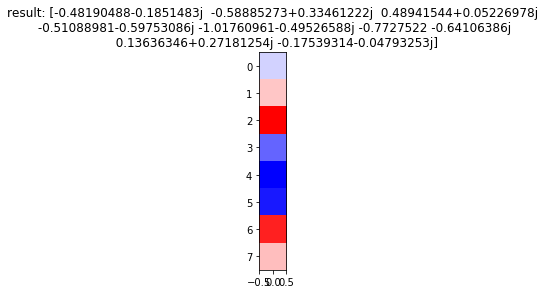

Generation: 10/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

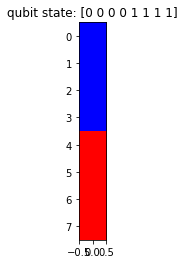

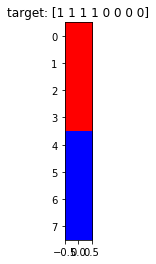

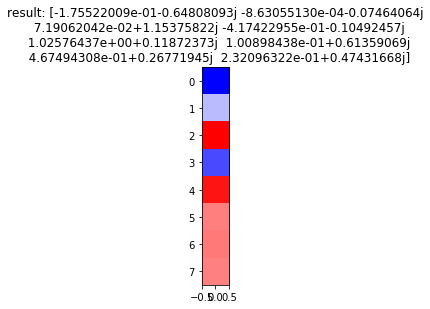

Generation: 11/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

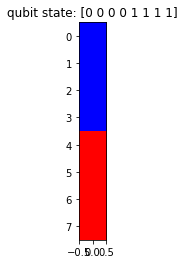

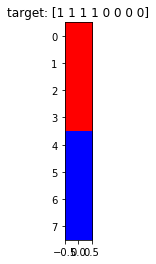

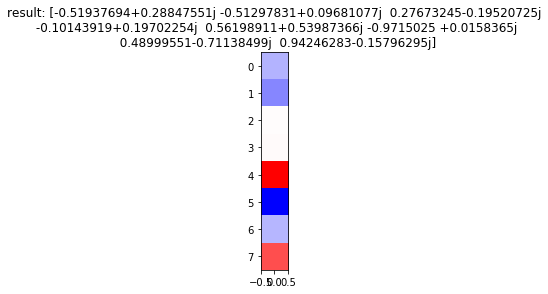

Generation: 11/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

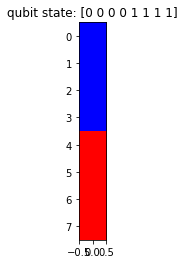

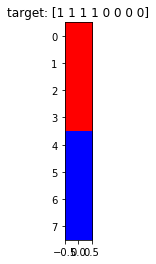

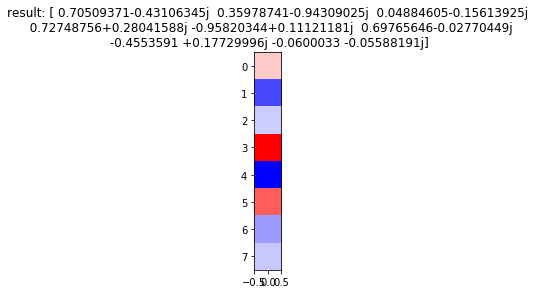

Generation: 11/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

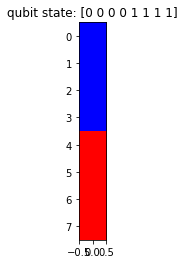

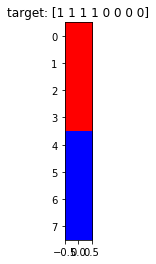

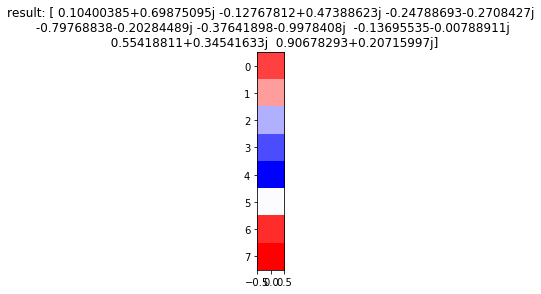

Generation: 11/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

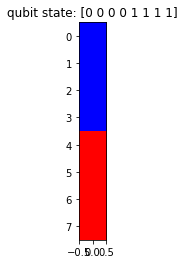

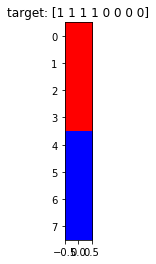

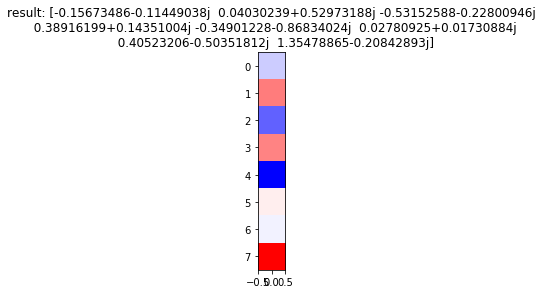

Generation: 11/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

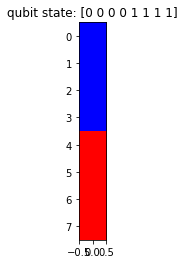

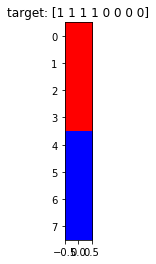

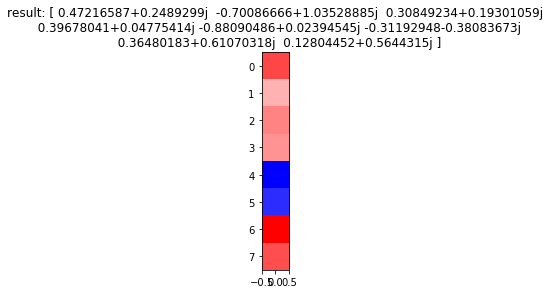

Generation: 11/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

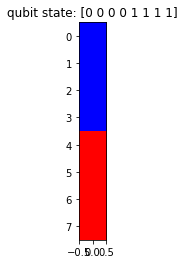

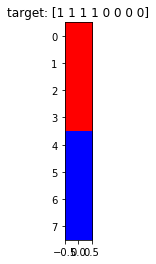

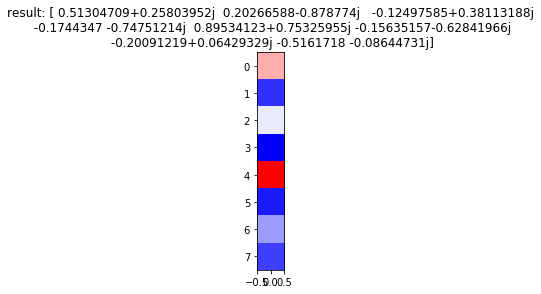

Generation: 11/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

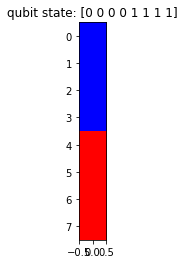

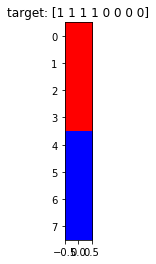

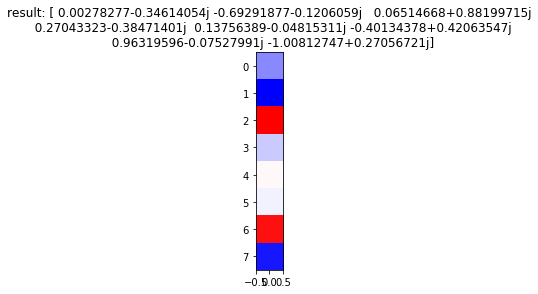

Generation: 11/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

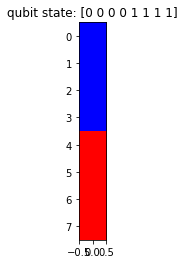

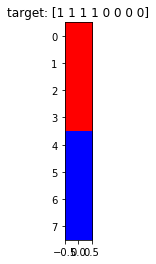

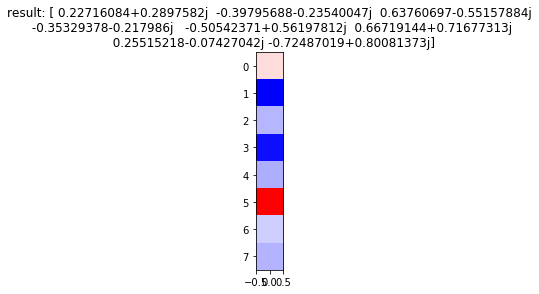

Generation: 11/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

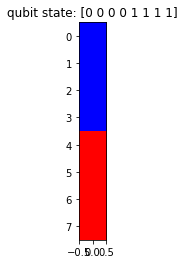

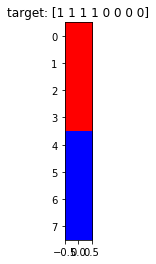

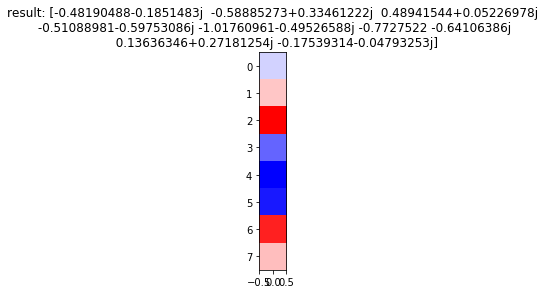

Generation: 11/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

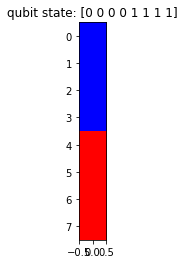

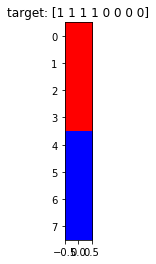

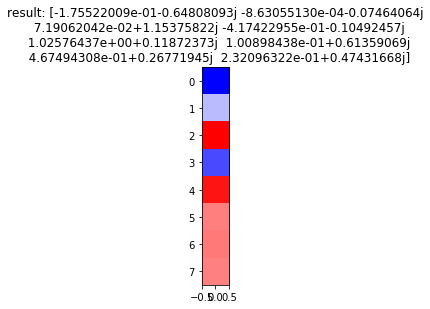

Generation: 12/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

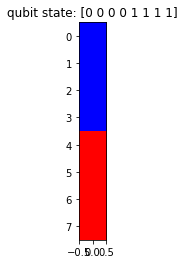

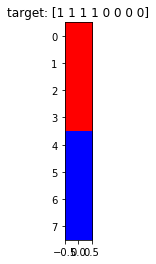

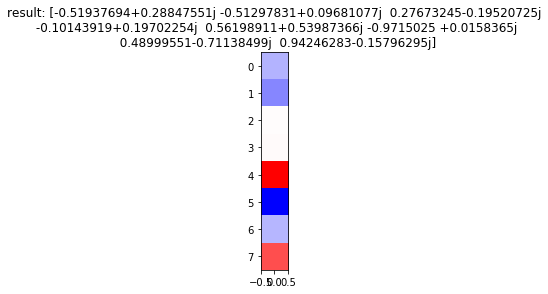

Generation: 12/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

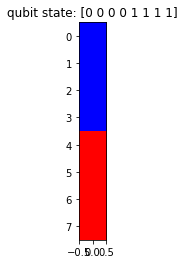

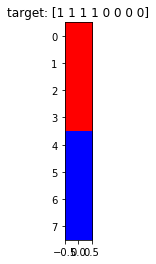

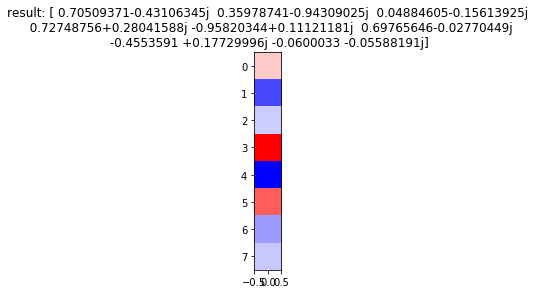

Generation: 12/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

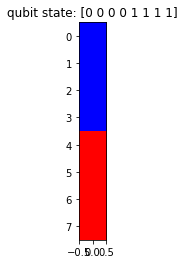

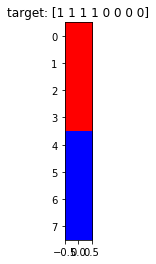

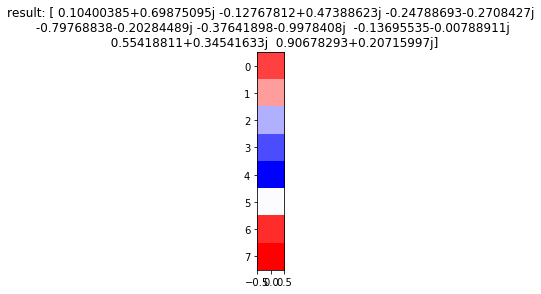

Generation: 12/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

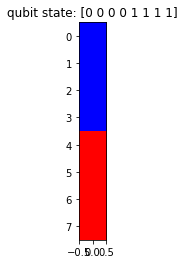

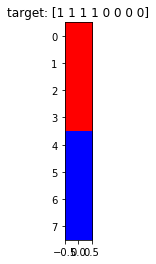

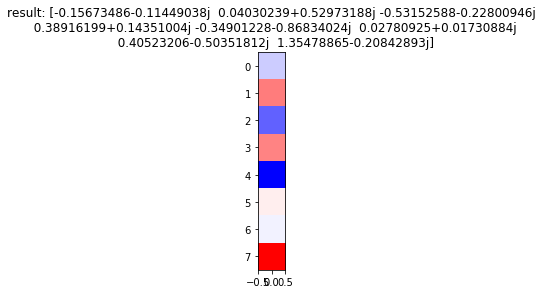

Generation: 12/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

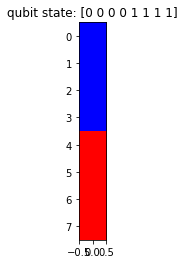

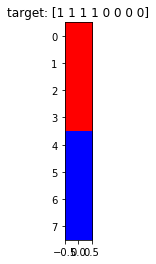

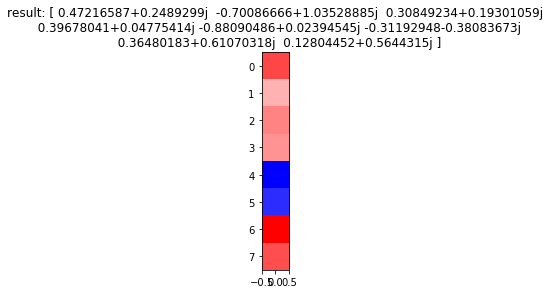

Generation: 12/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

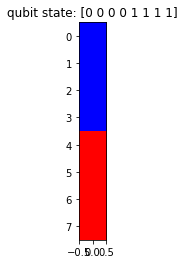

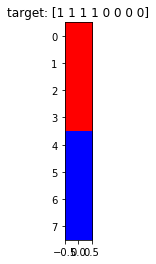

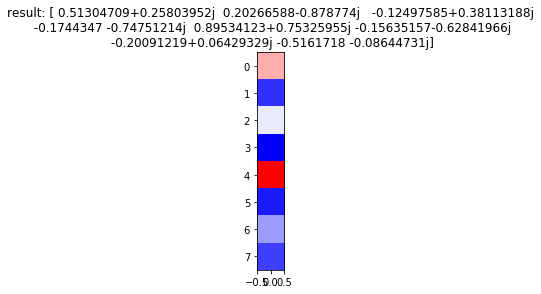

Generation: 12/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

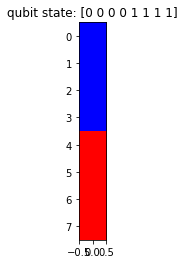

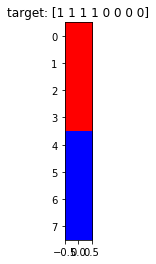

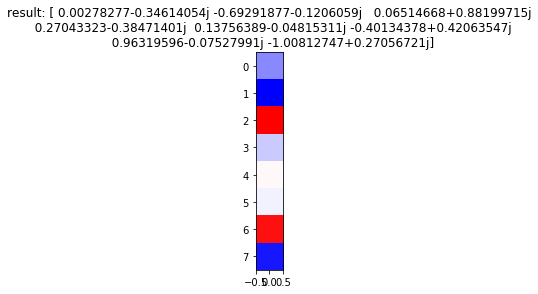

Generation: 12/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

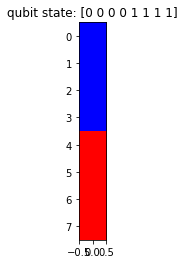

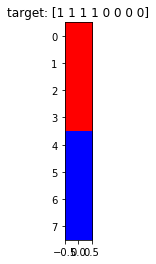

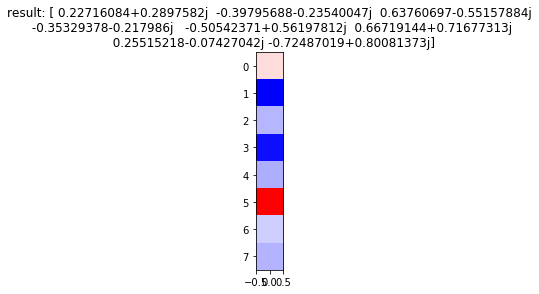

Generation: 12/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

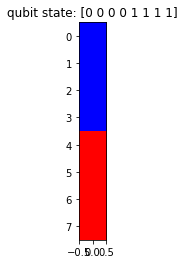

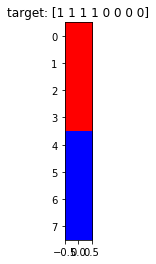

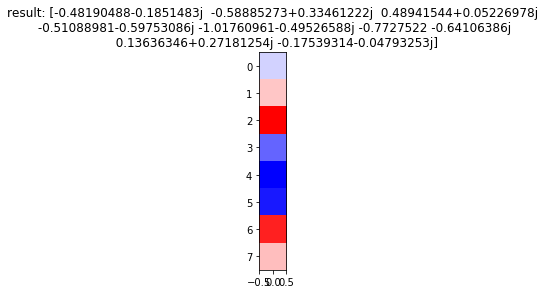

Generation: 12/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

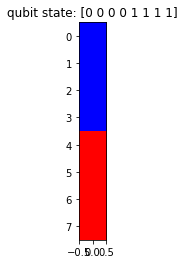

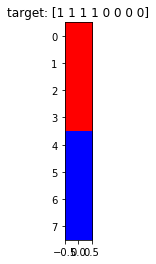

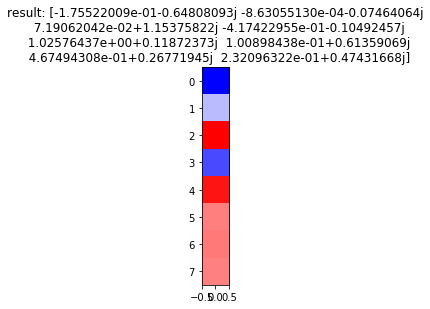

Generation: 13/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

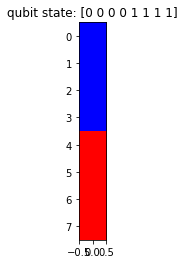

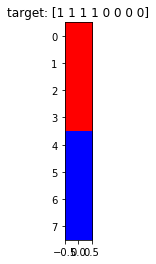

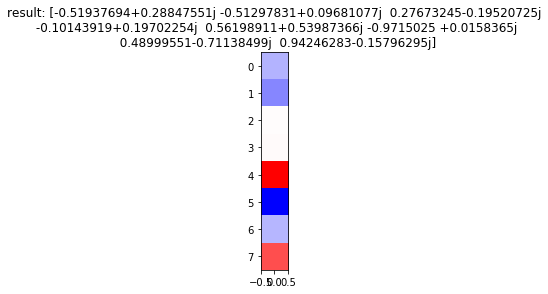

Generation: 13/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

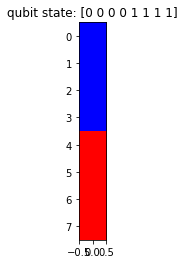

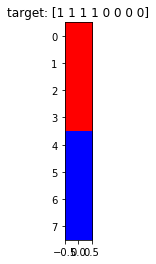

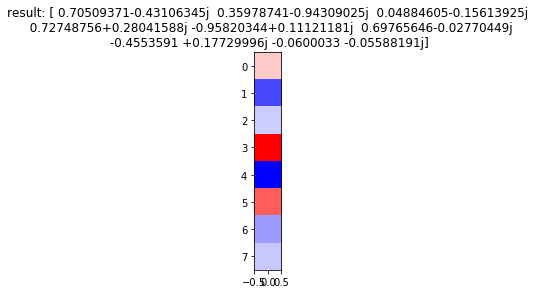

Generation: 13/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

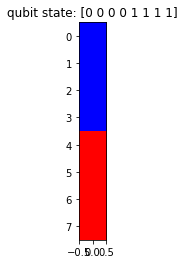

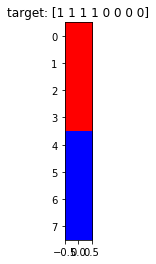

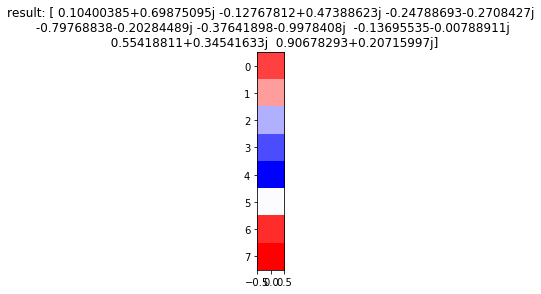

Generation: 13/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

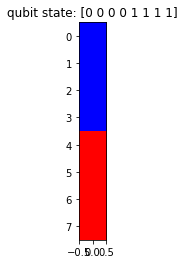

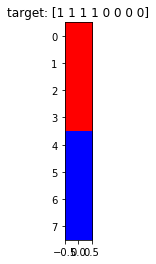

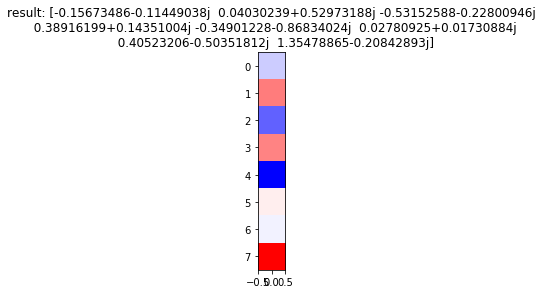

Generation: 13/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

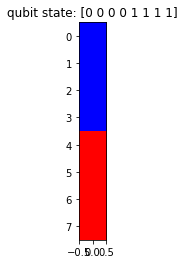

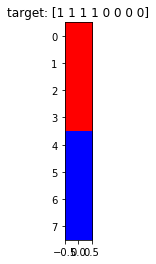

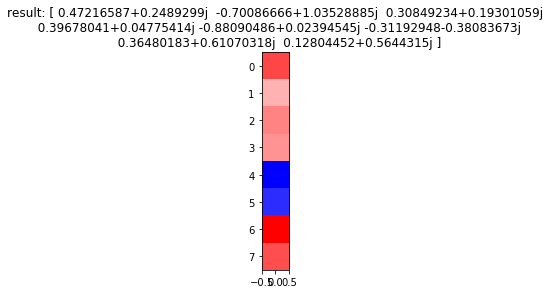

Generation: 13/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

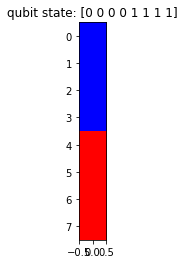

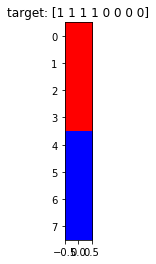

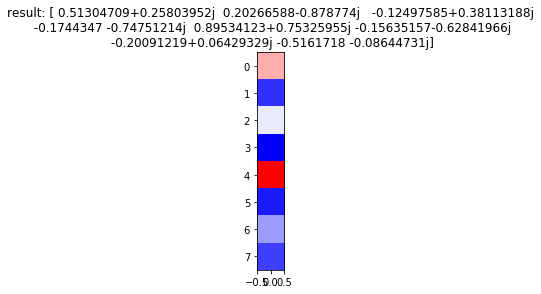

Generation: 13/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

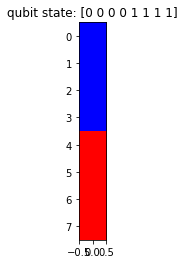

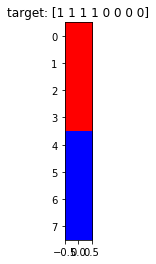

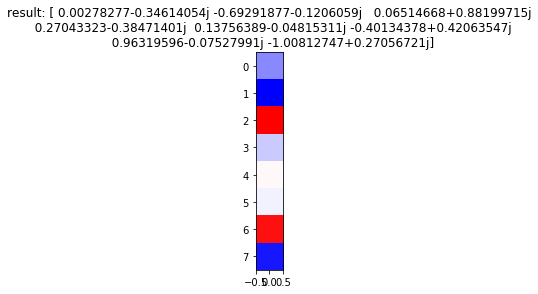

Generation: 13/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

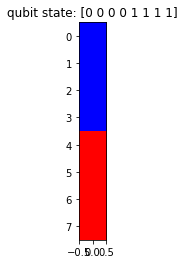

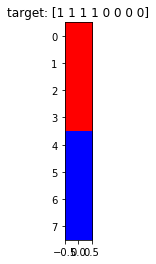

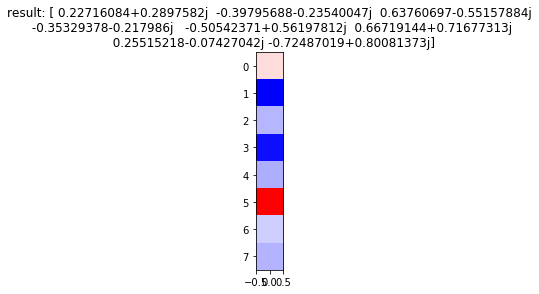

Generation: 13/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

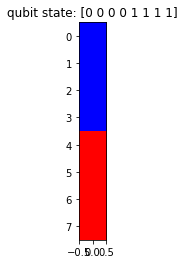

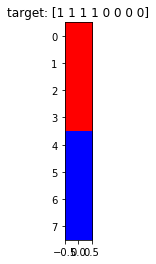

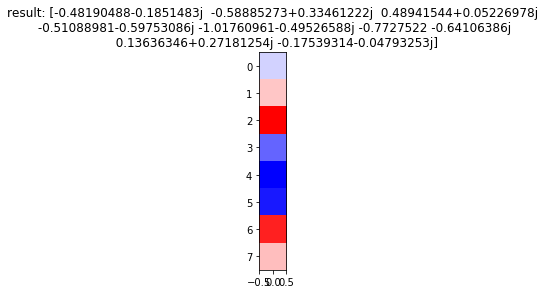

Generation: 13/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

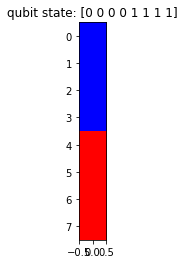

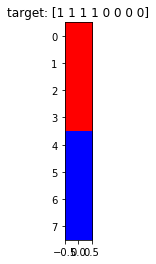

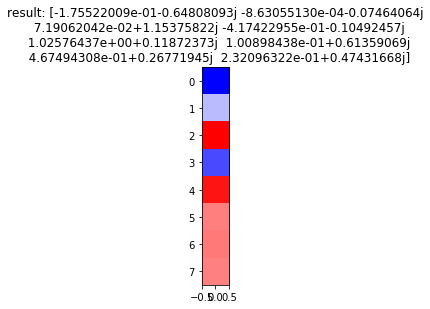

Generation: 14/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

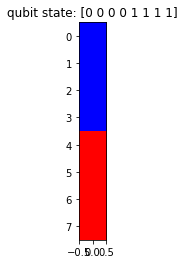

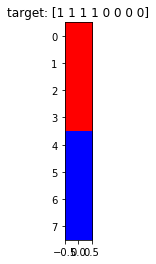

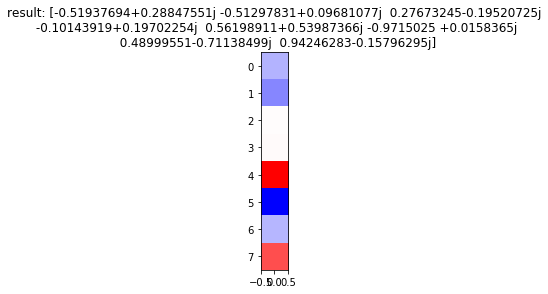

Generation: 14/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

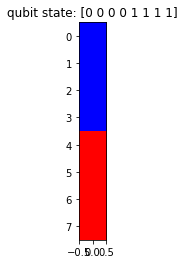

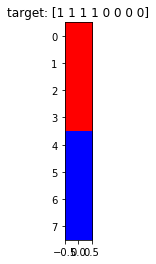

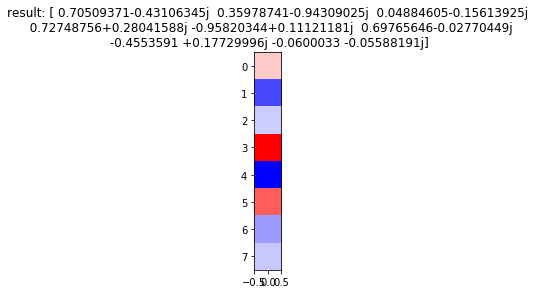

Generation: 14/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

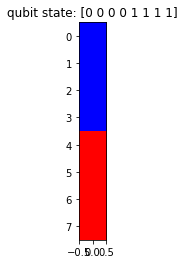

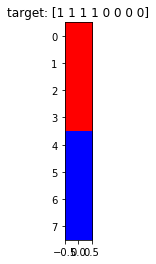

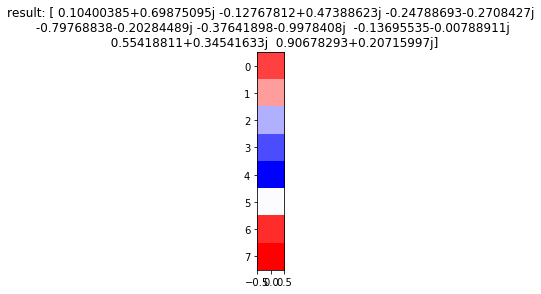

Generation: 14/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

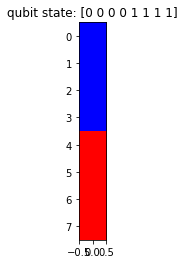

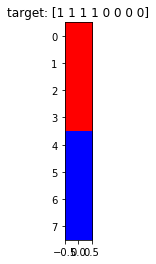

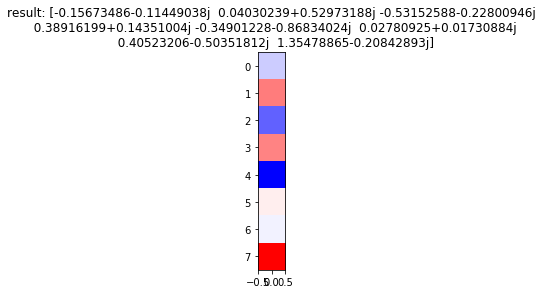

Generation: 14/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

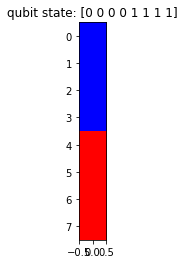

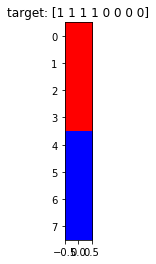

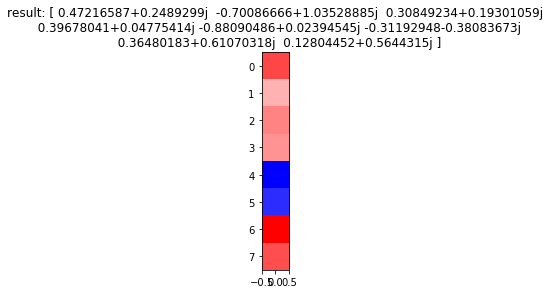

Generation: 14/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

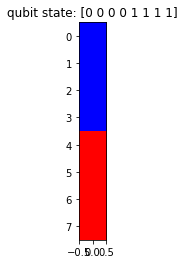

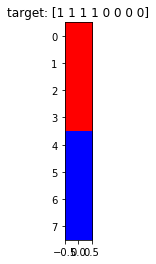

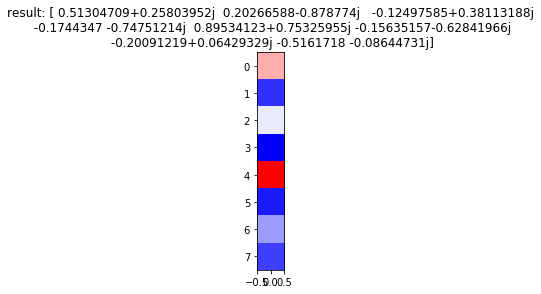

Generation: 14/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

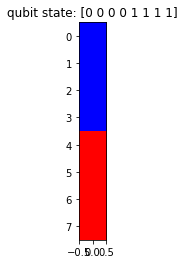

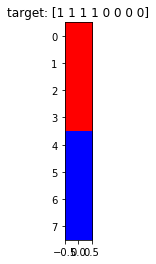

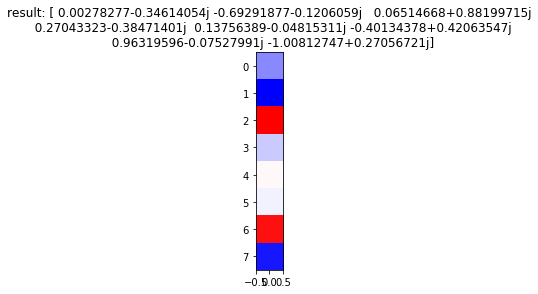

Generation: 14/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

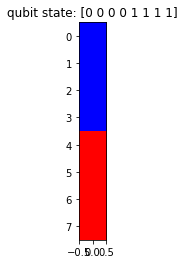

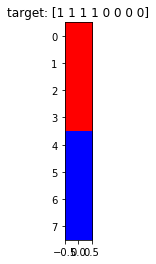

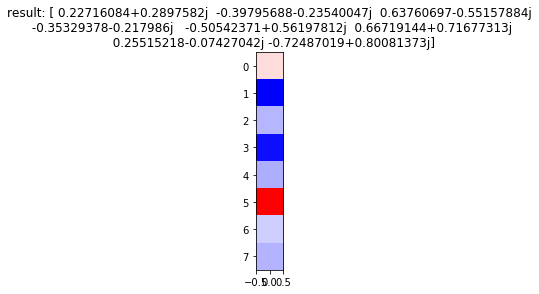

Generation: 14/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

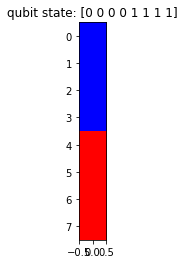

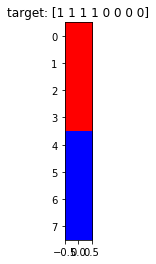

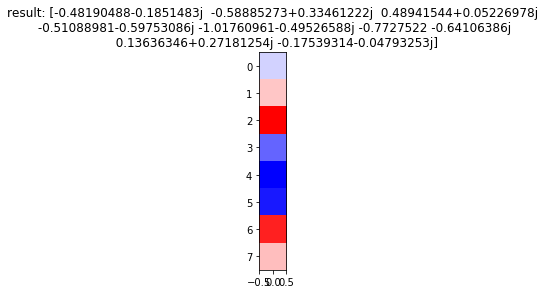

Generation: 14/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

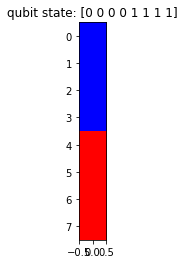

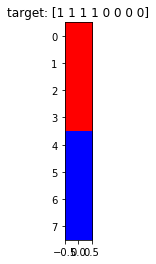

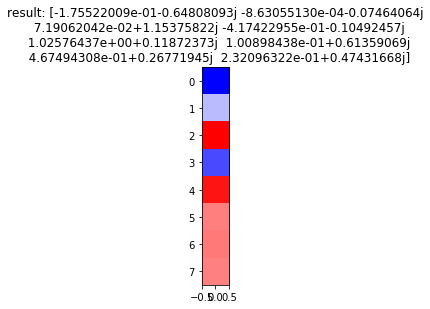

Generation: 15/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

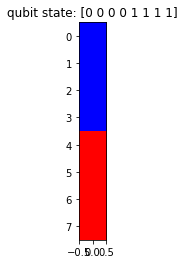

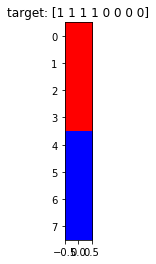

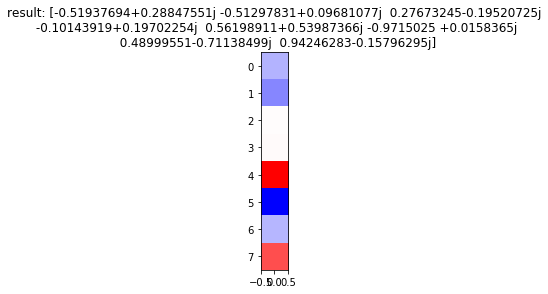

Generation: 15/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

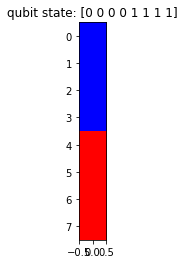

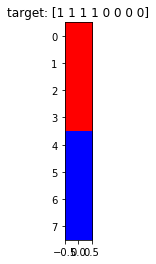

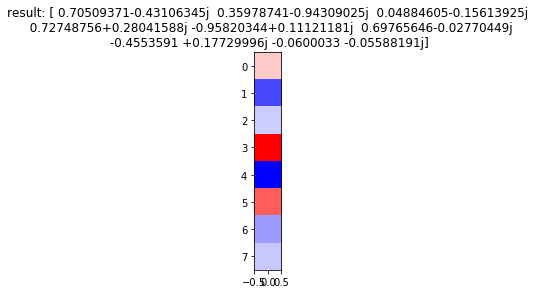

Generation: 15/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

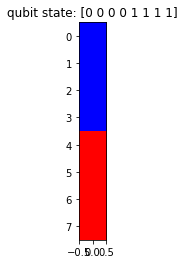

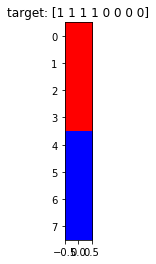

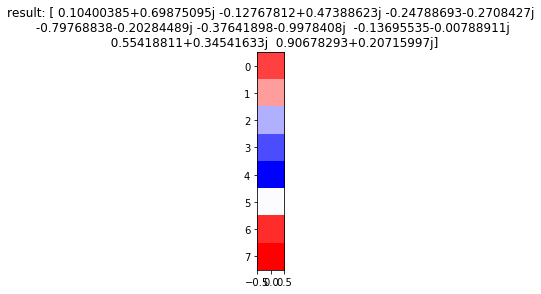

Generation: 15/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

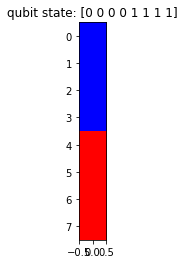

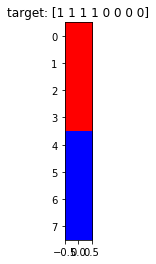

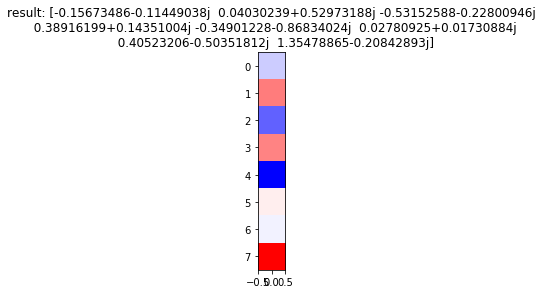

Generation: 15/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

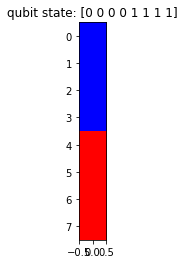

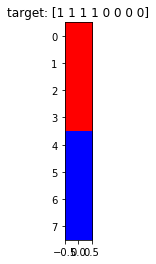

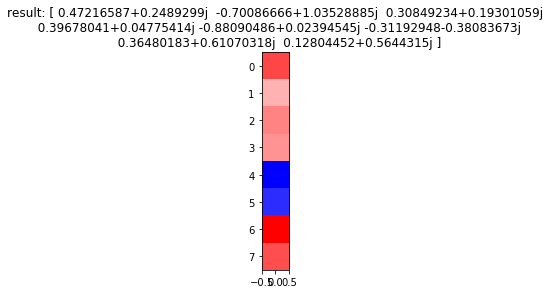

Generation: 15/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

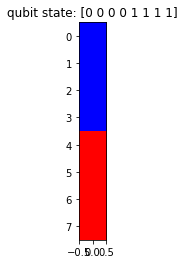

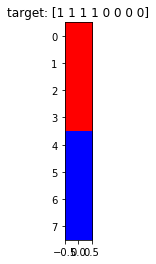

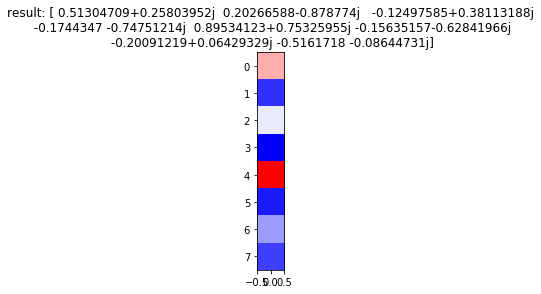

Generation: 15/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

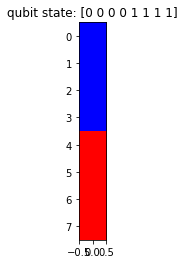

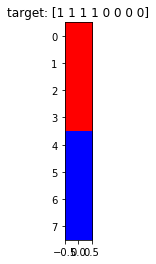

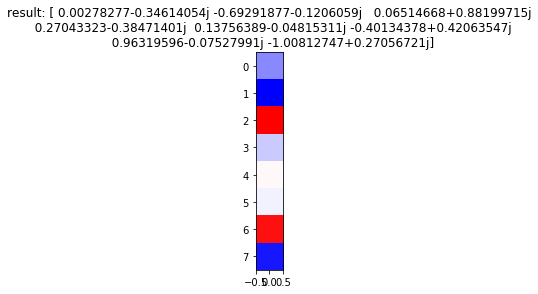

Generation: 15/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

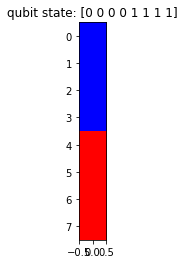

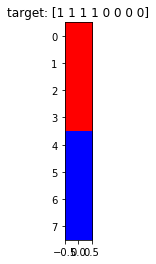

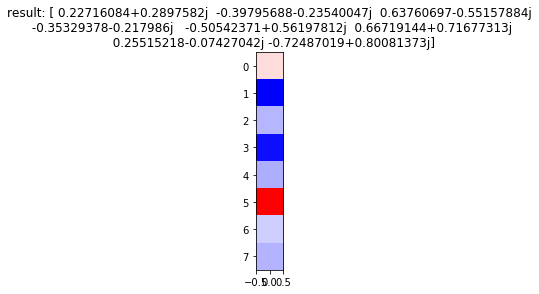

Generation: 15/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

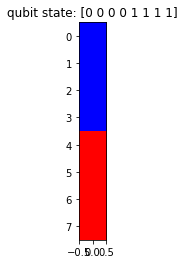

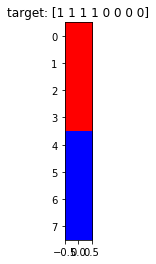

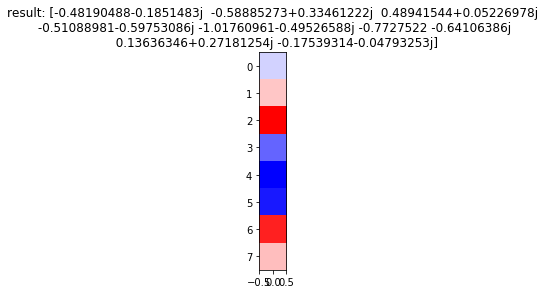

Generation: 15/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

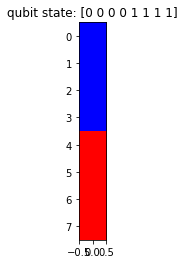

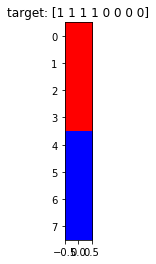

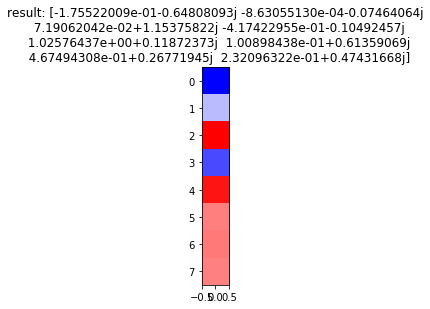

Generation: 16/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

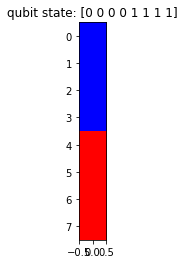

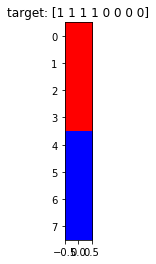

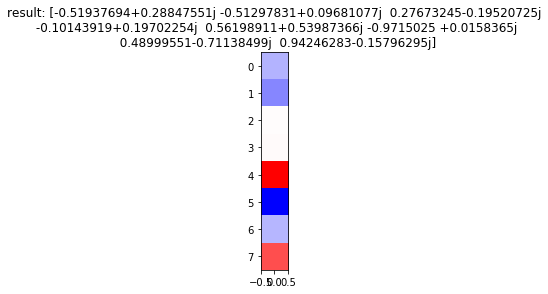

Generation: 16/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

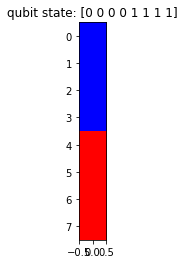

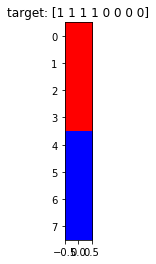

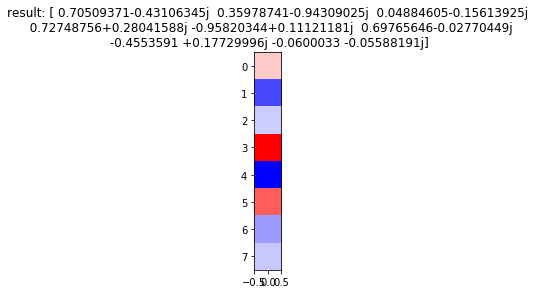

Generation: 16/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

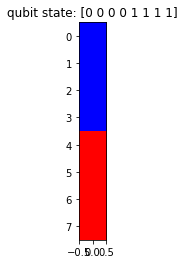

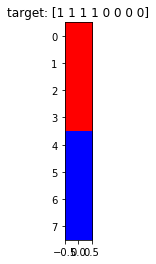

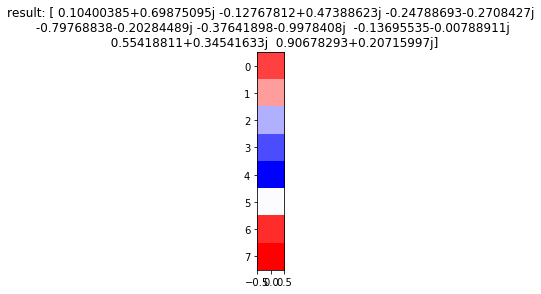

Generation: 16/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

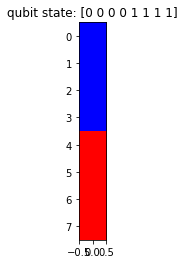

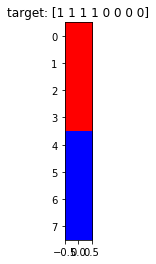

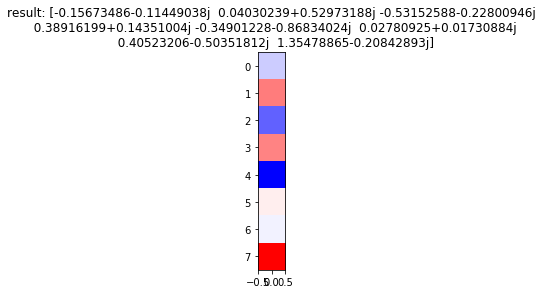

Generation: 16/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

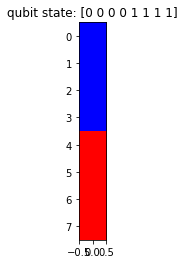

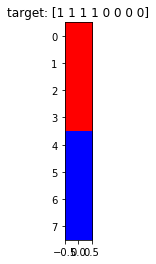

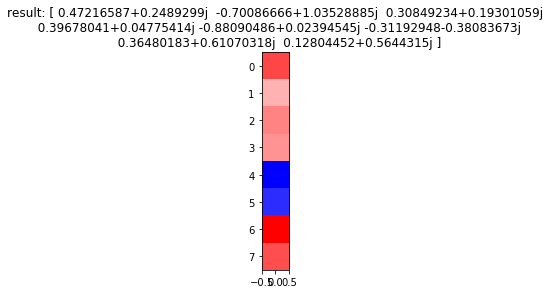

Generation: 16/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

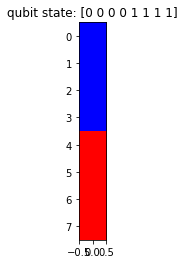

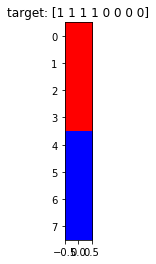

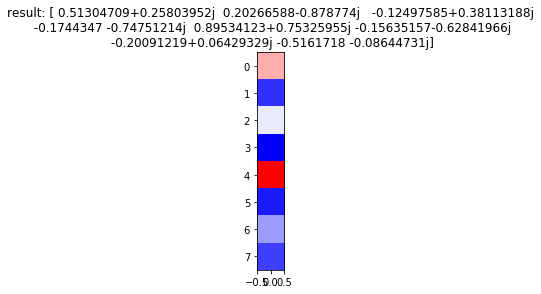

Generation: 16/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

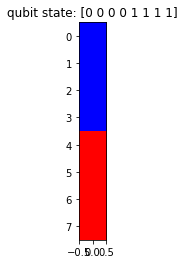

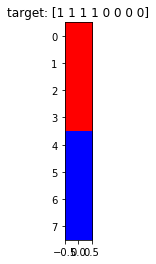

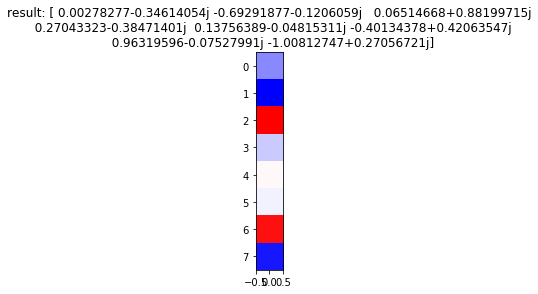

Generation: 16/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

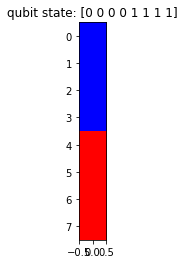

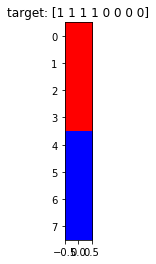

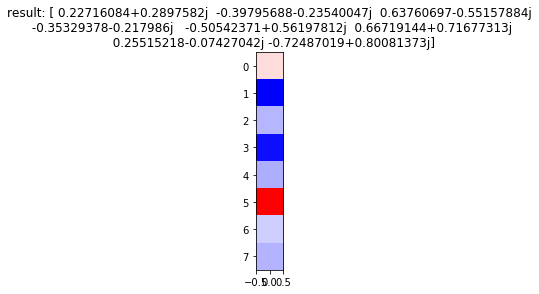

Generation: 16/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

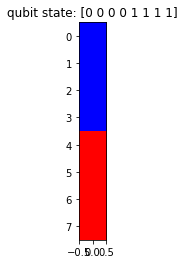

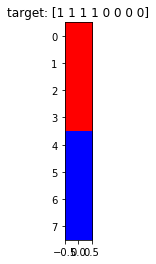

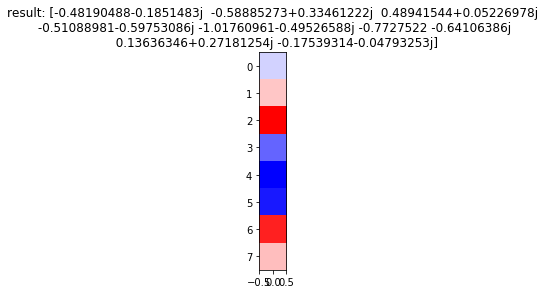

Generation: 16/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

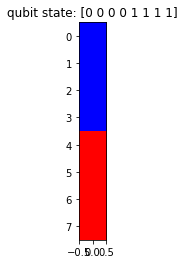

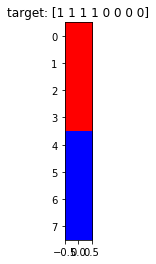

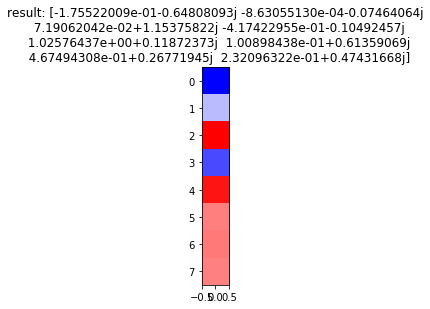

Generation: 17/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

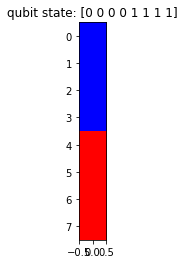

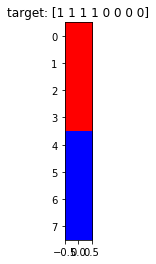

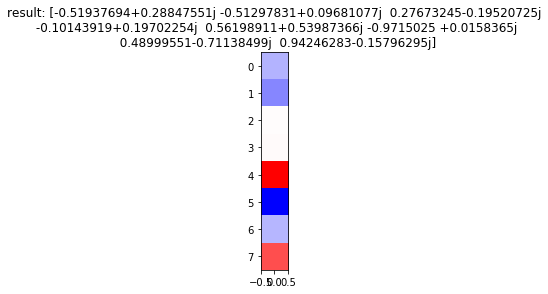

Generation: 17/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

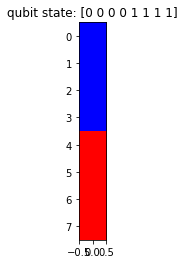

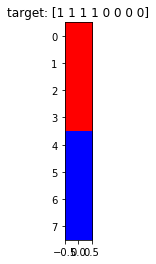

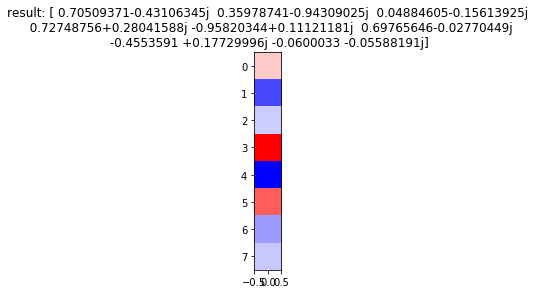

Generation: 17/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

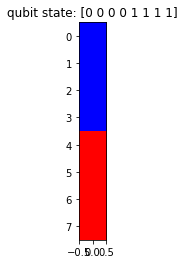

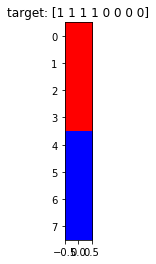

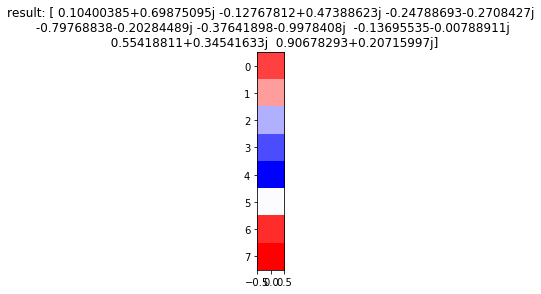

Generation: 17/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

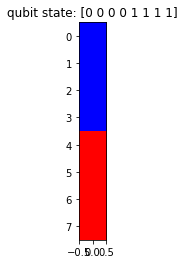

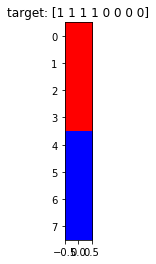

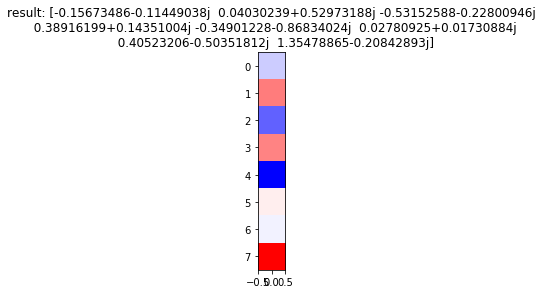

Generation: 17/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

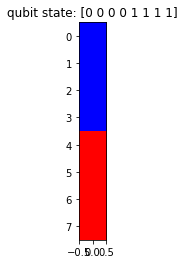

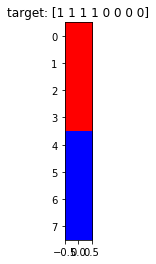

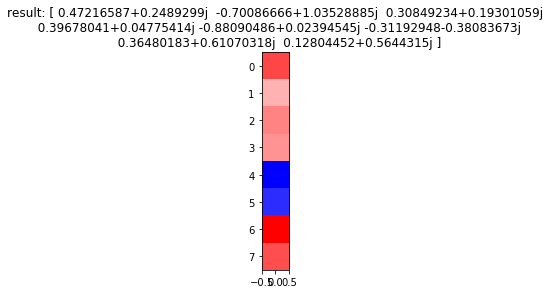

Generation: 17/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

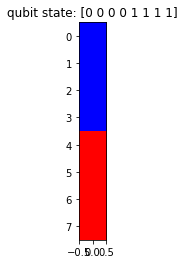

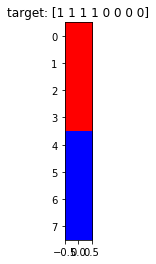

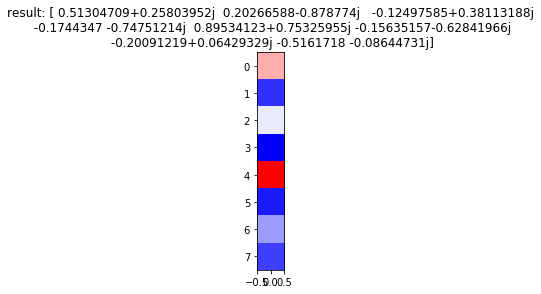

Generation: 17/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

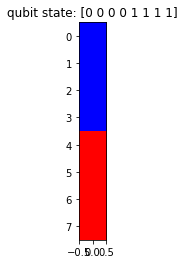

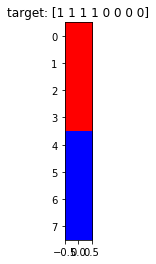

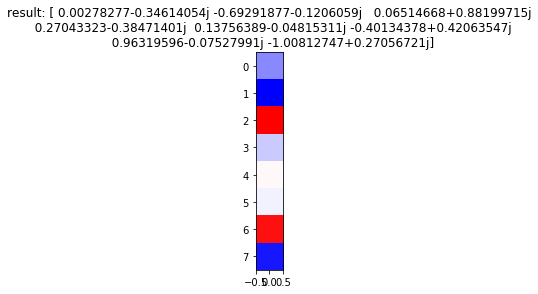

Generation: 17/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

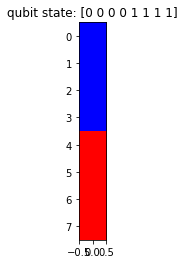

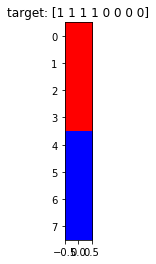

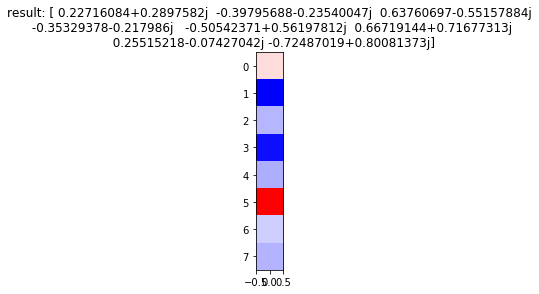

Generation: 17/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

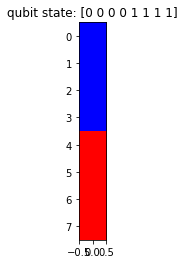

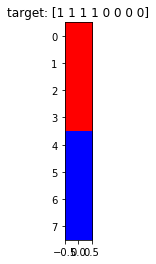

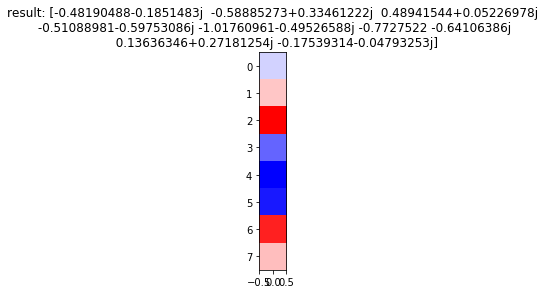

Generation: 17/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

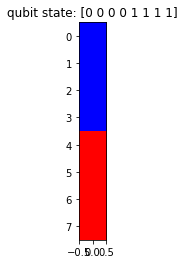

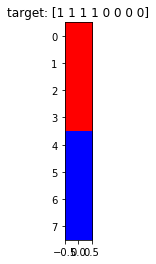

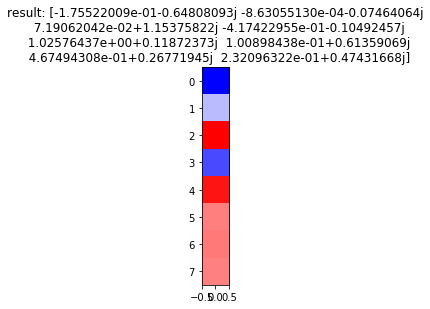

Generation: 18/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

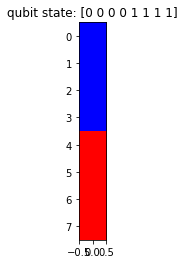

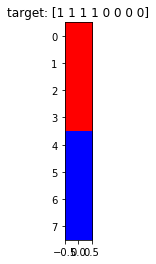

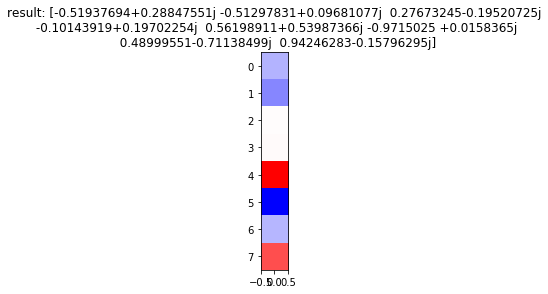

Generation: 18/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

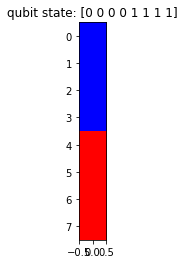

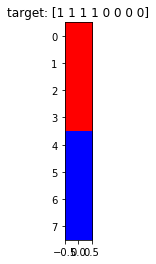

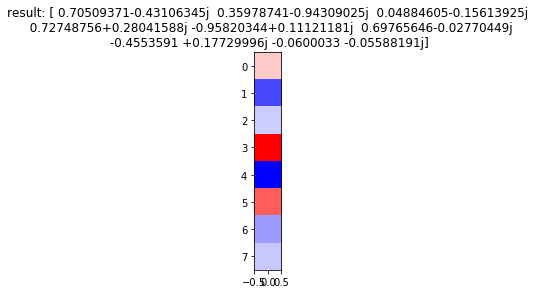

Generation: 18/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

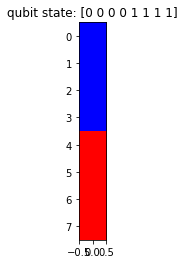

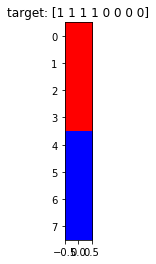

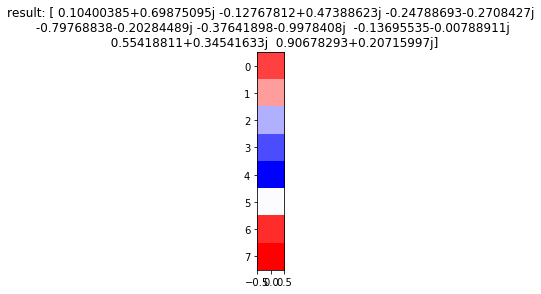

Generation: 18/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

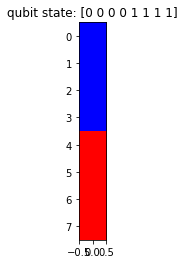

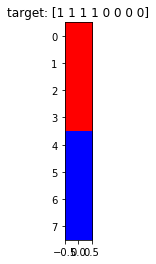

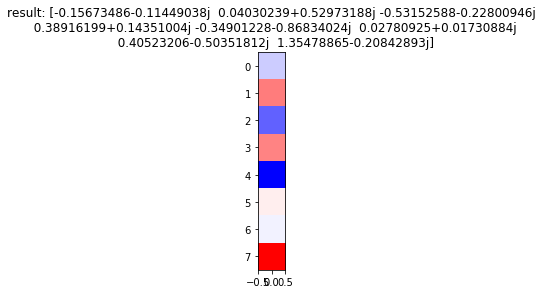

Generation: 18/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

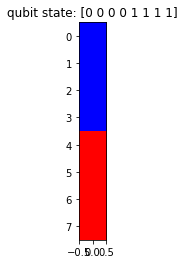

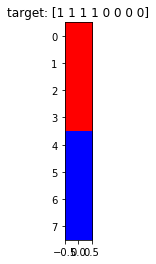

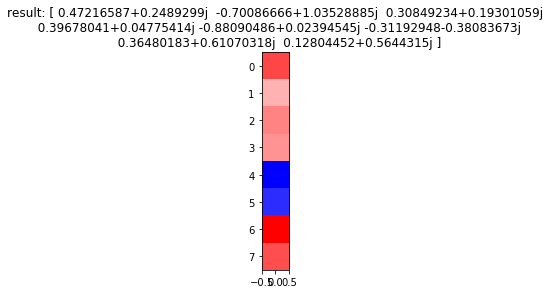

Generation: 18/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

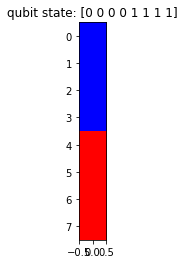

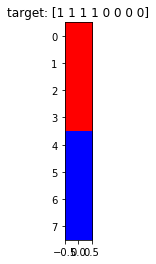

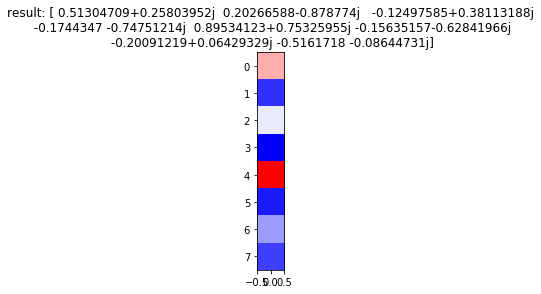

Generation: 18/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

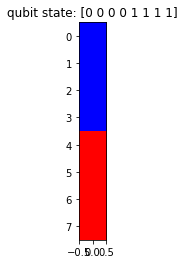

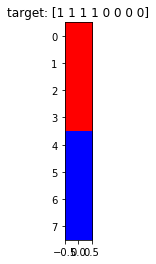

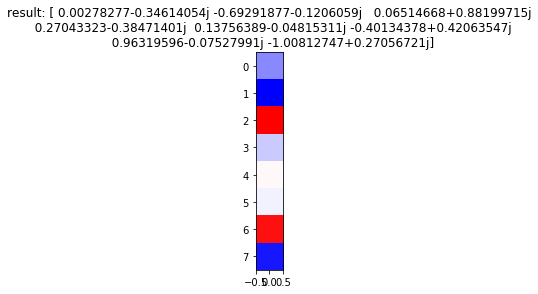

Generation: 18/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

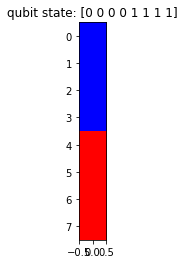

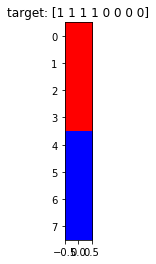

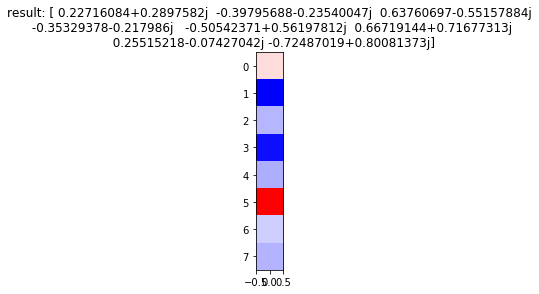

Generation: 18/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

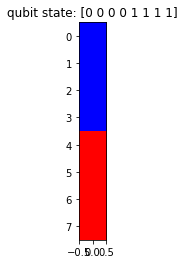

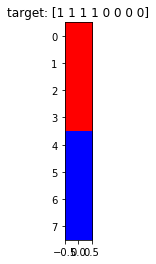

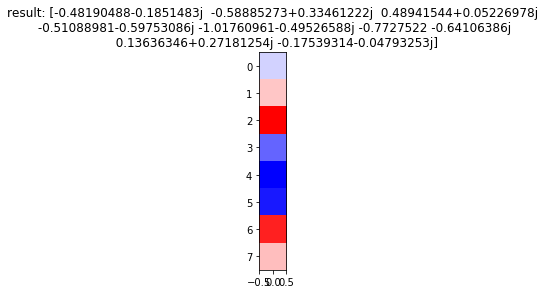

Generation: 18/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

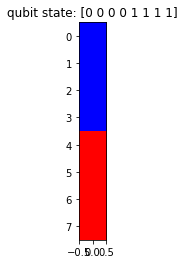

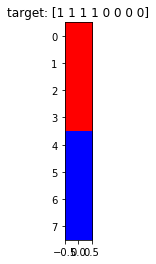

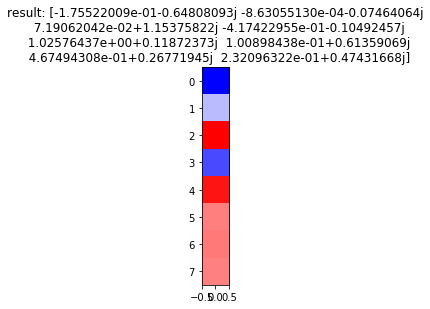

Generation: 19/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

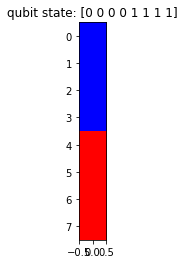

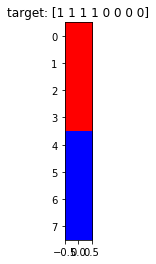

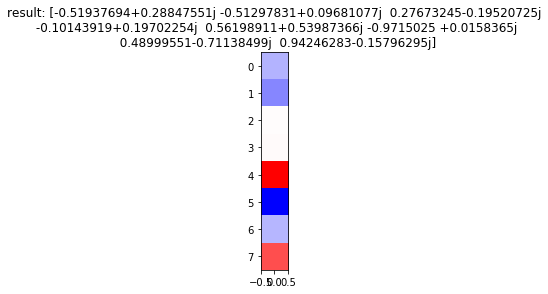

Generation: 19/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

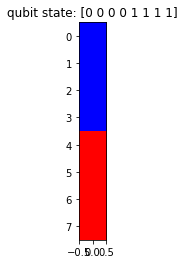

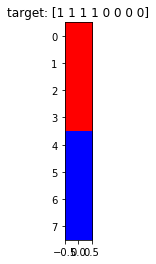

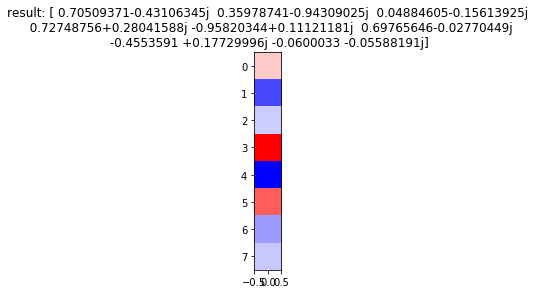

Generation: 19/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

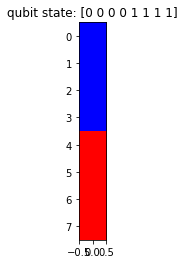

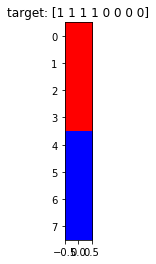

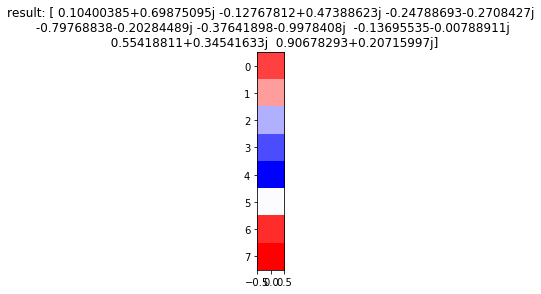

Generation: 19/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

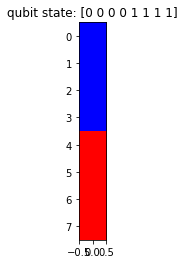

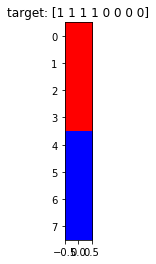

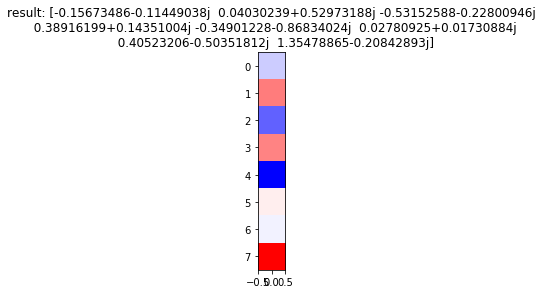

Generation: 19/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

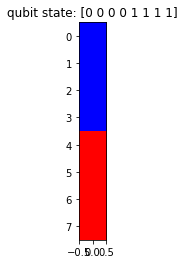

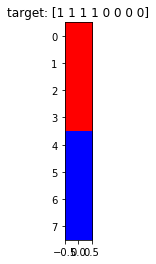

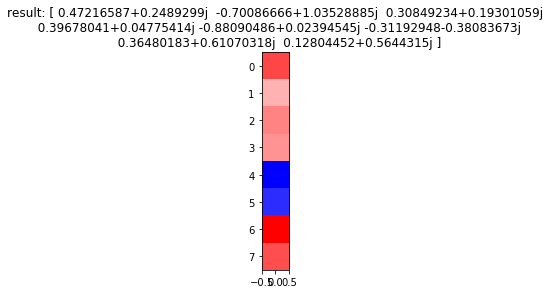

Generation: 19/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

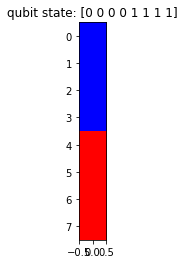

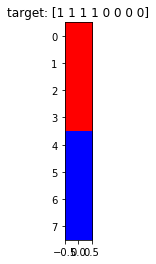

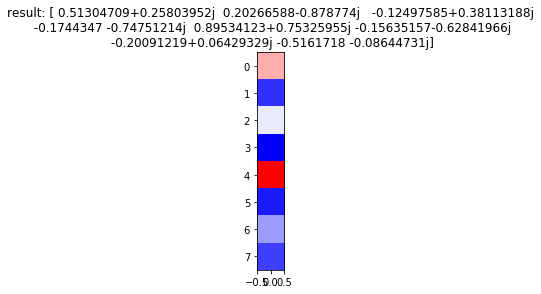

Generation: 19/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

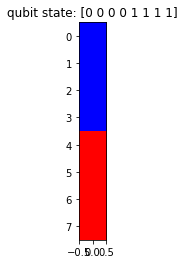

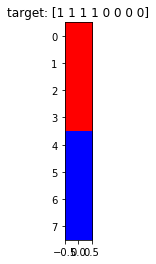

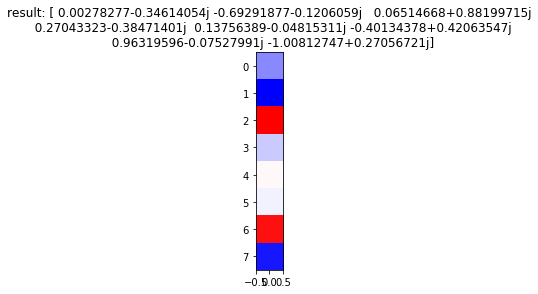

Generation: 19/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

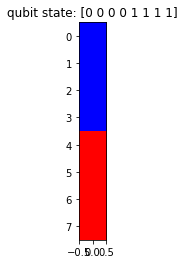

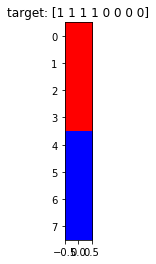

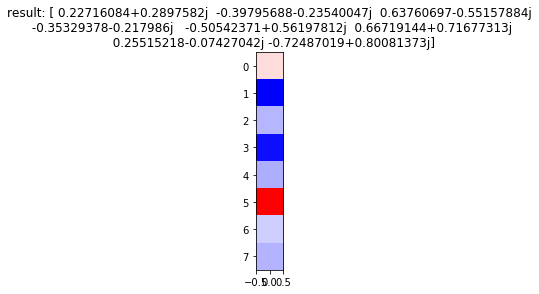

Generation: 19/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

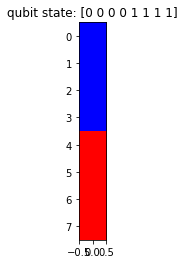

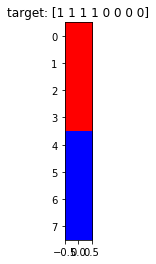

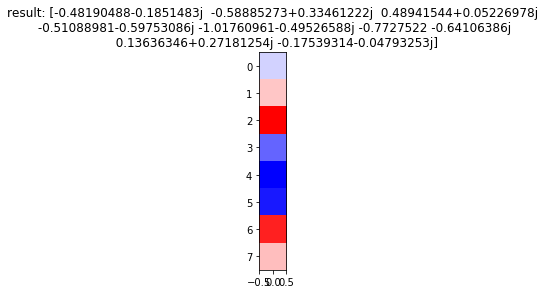

Generation: 19/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

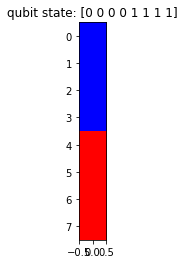

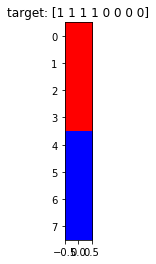

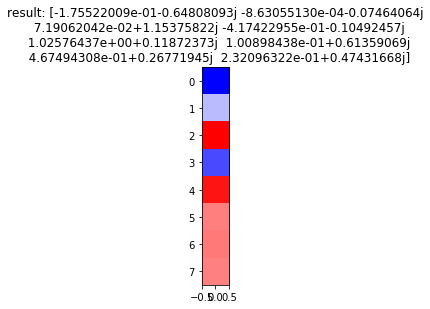

Generation: 20/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

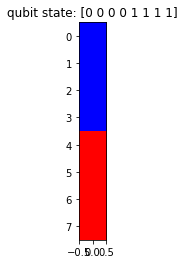

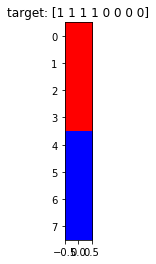

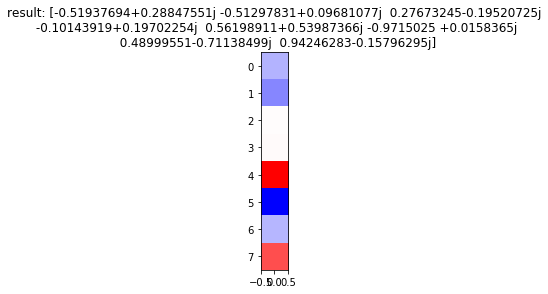

Generation: 20/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

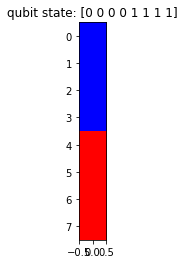

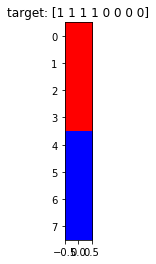

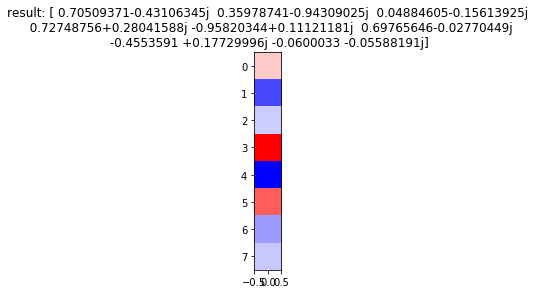

Generation: 20/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

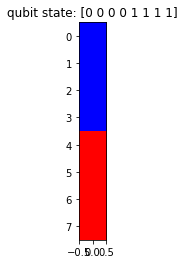

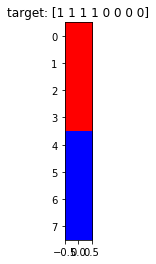

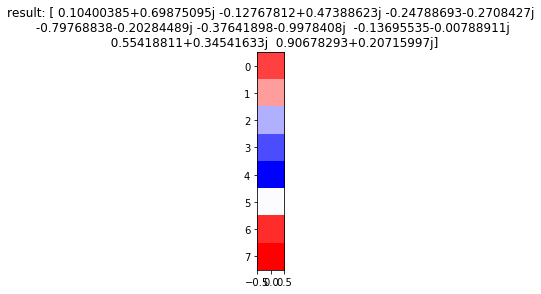

Generation: 20/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

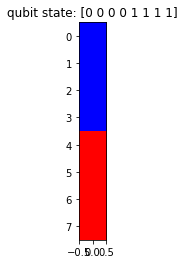

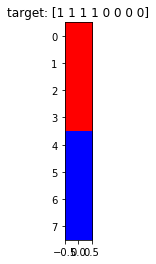

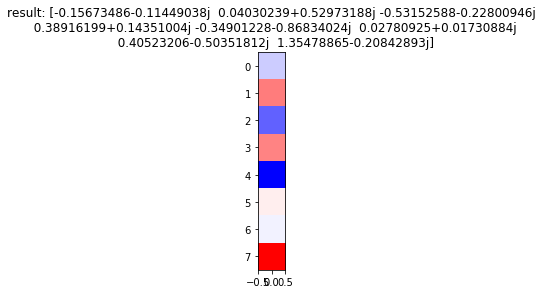

Generation: 20/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

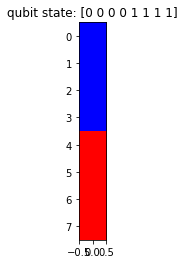

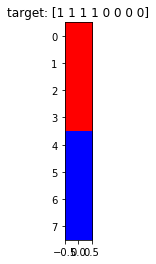

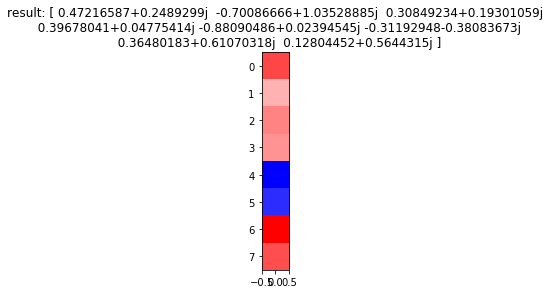

Generation: 20/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

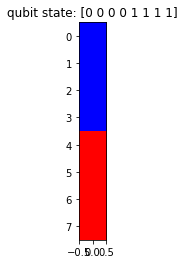

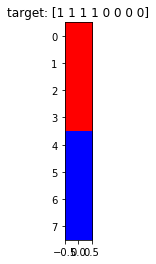

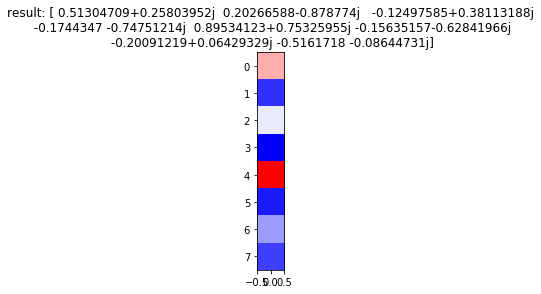

Generation: 20/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

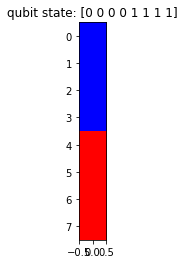

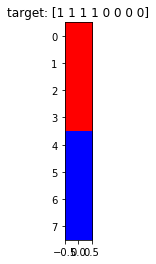

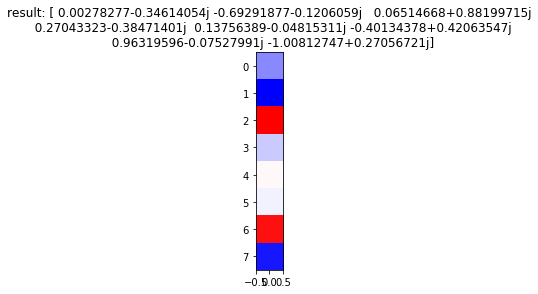

Generation: 20/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

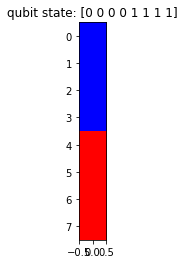

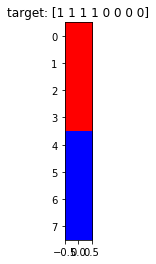

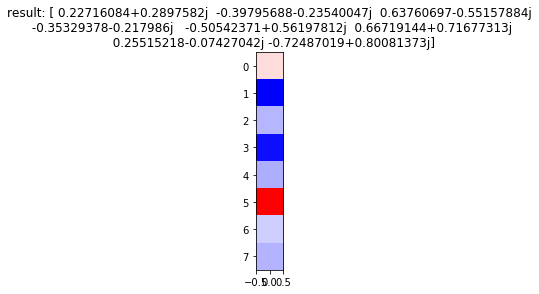

Generation: 20/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

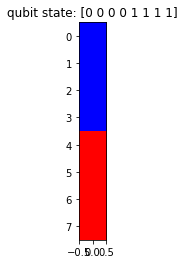

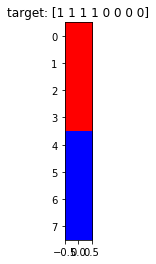

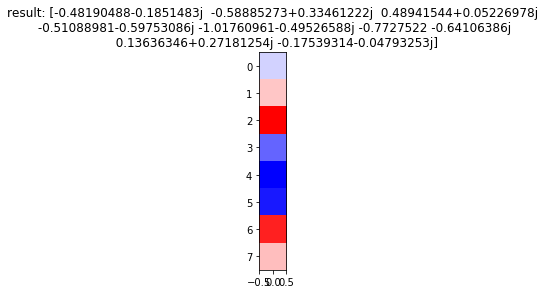

Generation: 20/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

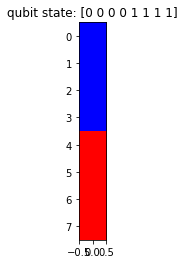

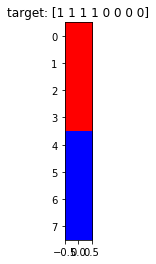

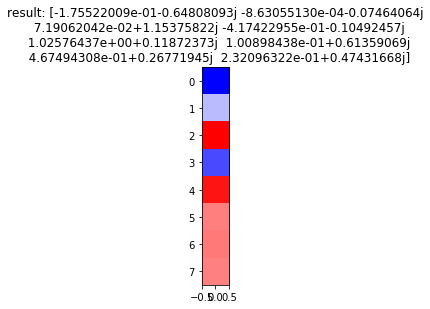

Generation: 21/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

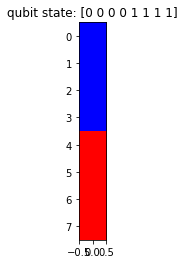

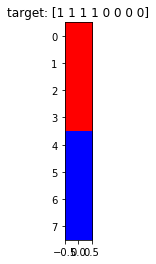

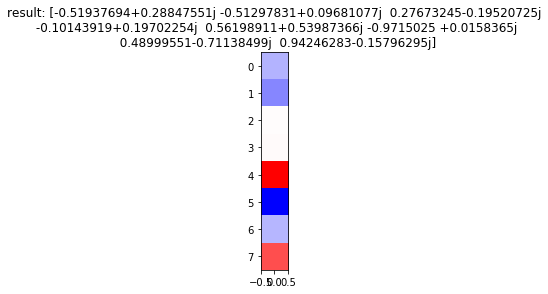

Generation: 21/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

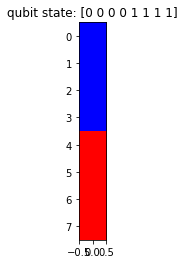

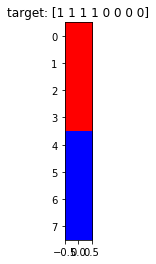

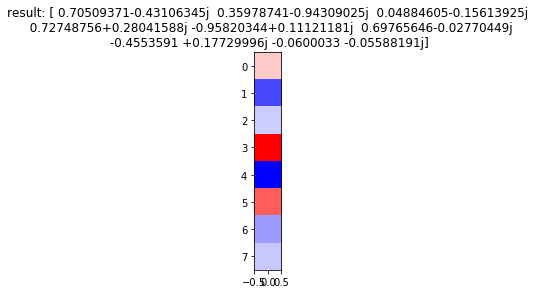

Generation: 21/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

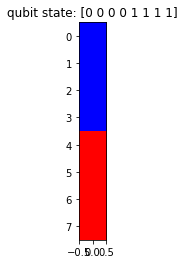

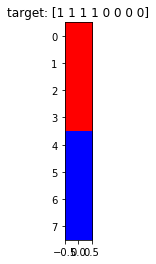

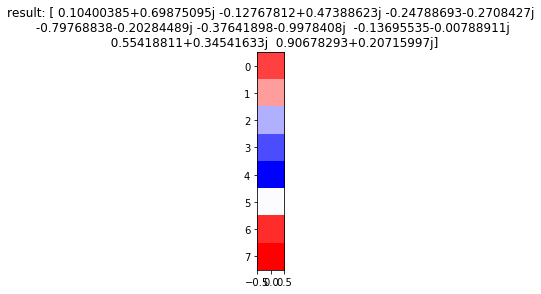

Generation: 21/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

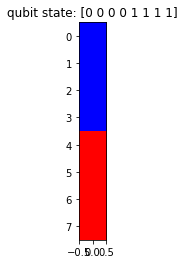

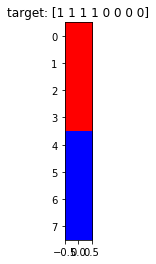

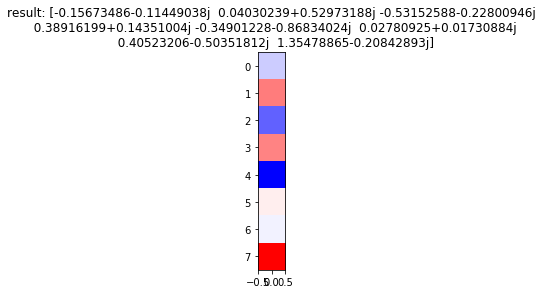

Generation: 21/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

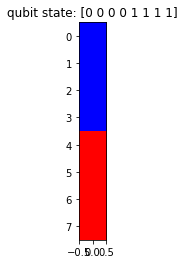

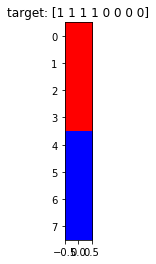

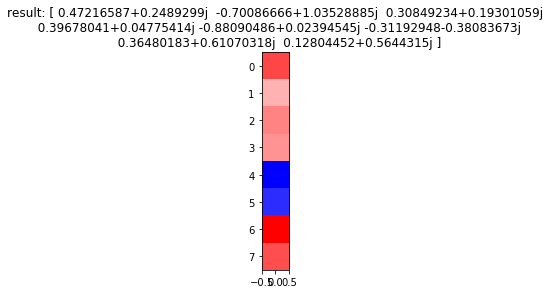

Generation: 21/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

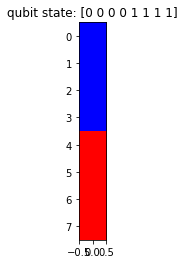

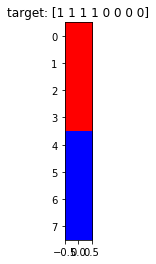

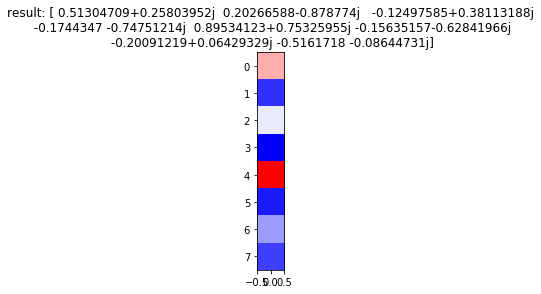

Generation: 21/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

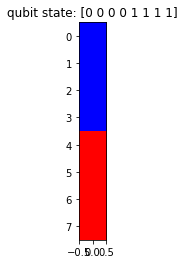

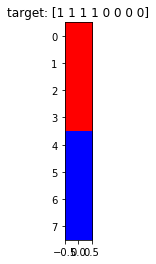

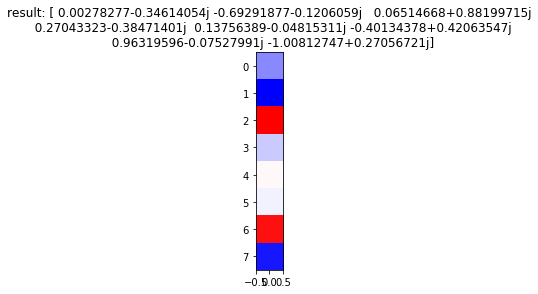

Generation: 21/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

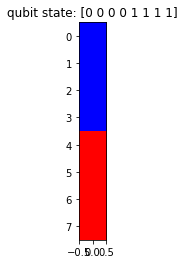

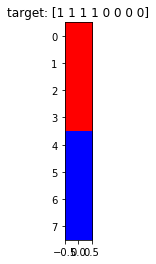

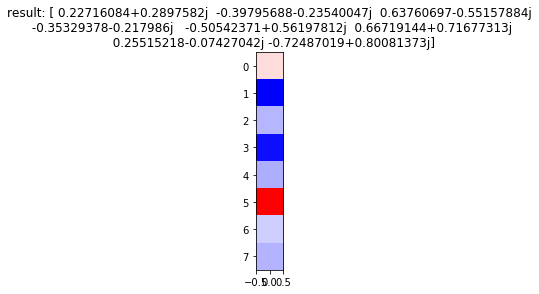

Generation: 21/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

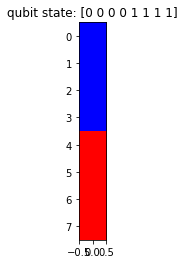

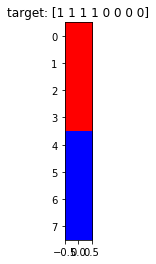

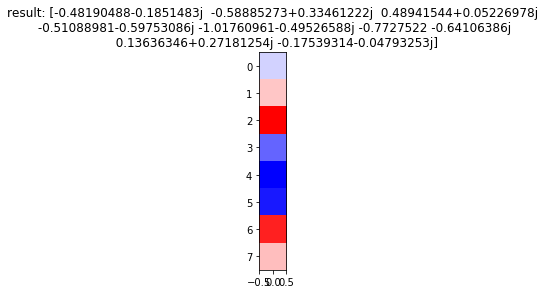

Generation: 21/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

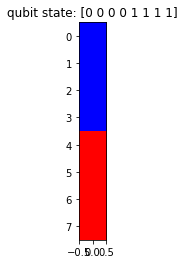

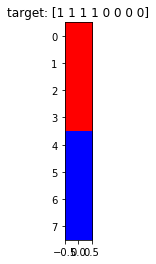

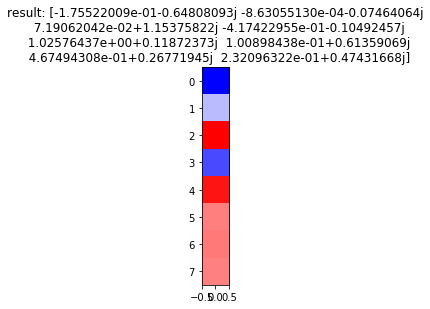

Generation: 22/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

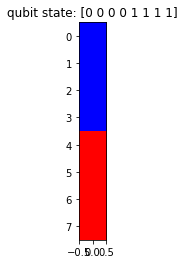

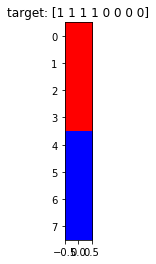

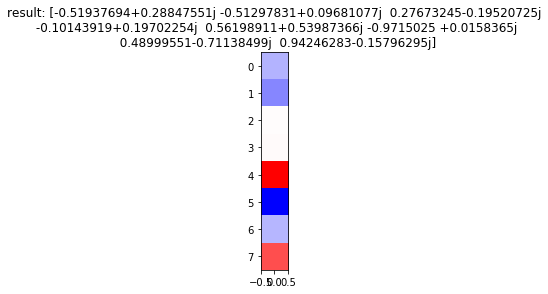

Generation: 22/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

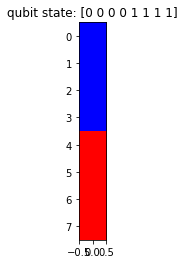

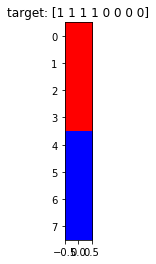

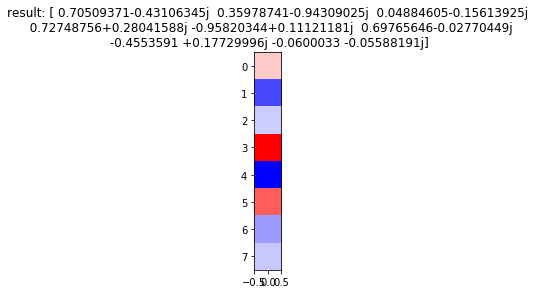

Generation: 22/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

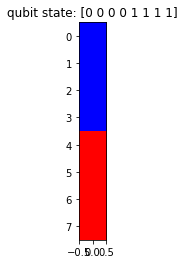

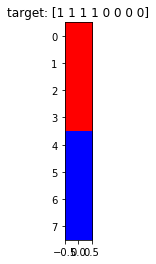

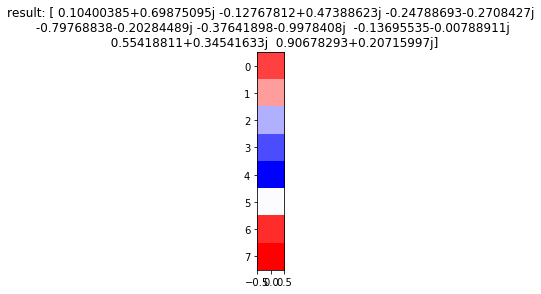

Generation: 22/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

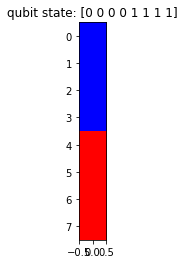

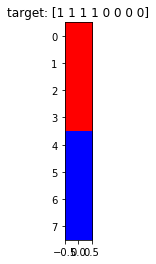

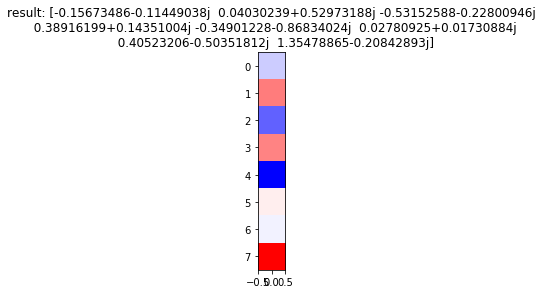

Generation: 22/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

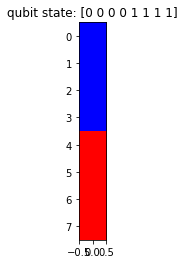

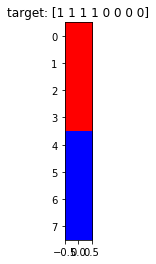

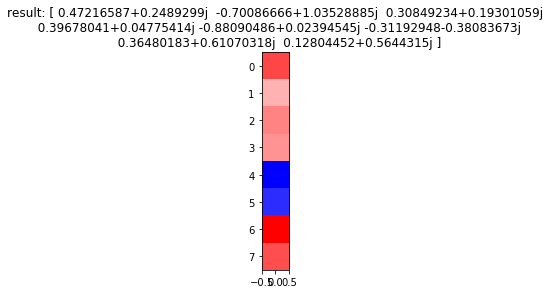

Generation: 22/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

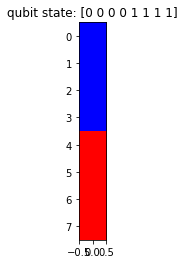

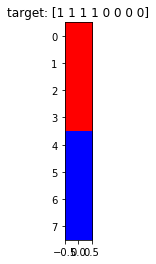

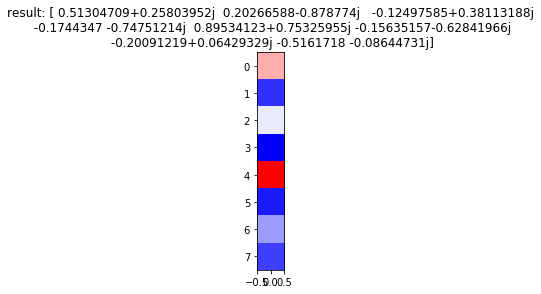

Generation: 22/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

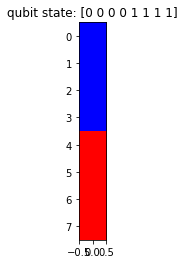

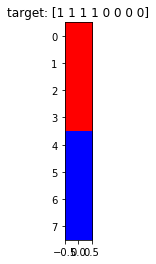

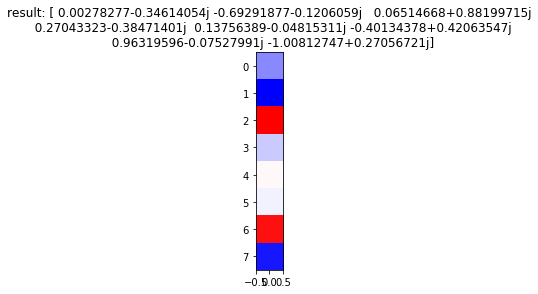

Generation: 22/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

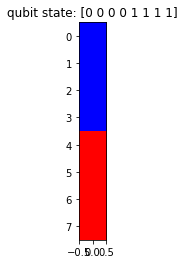

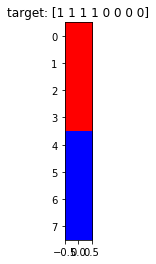

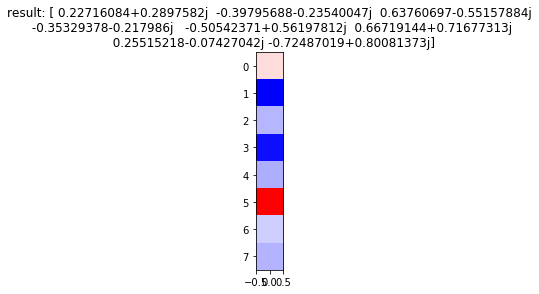

Generation: 22/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

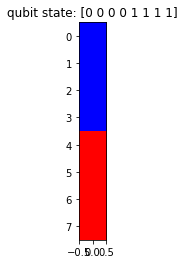

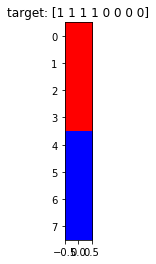

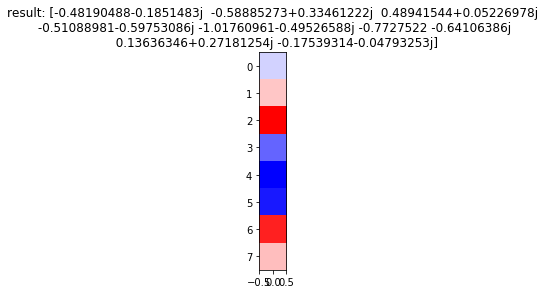

Generation: 22/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

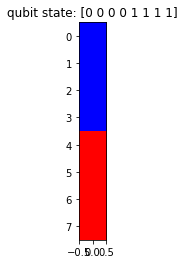

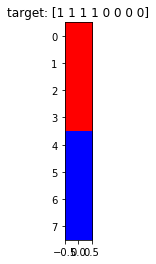

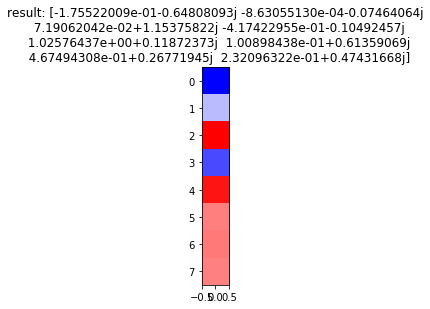

Generation: 23/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

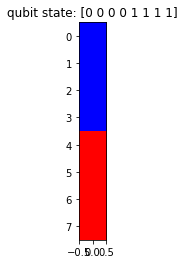

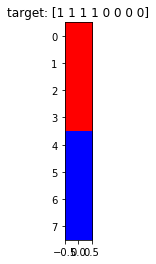

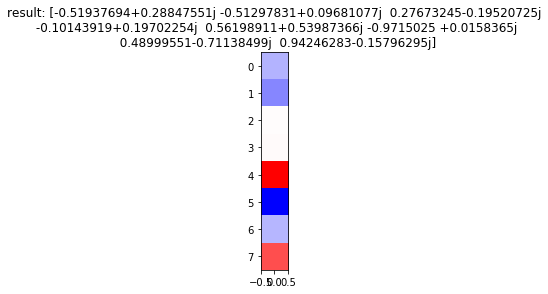

Generation: 23/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

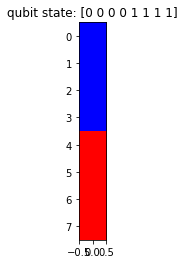

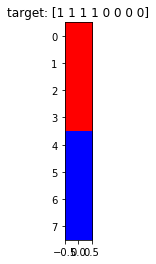

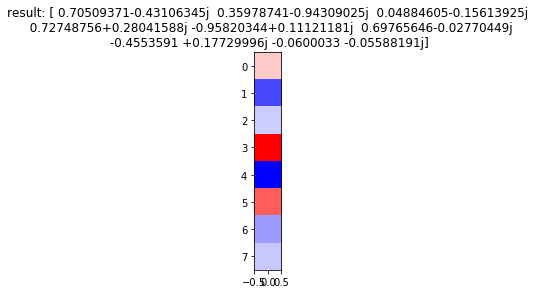

Generation: 23/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

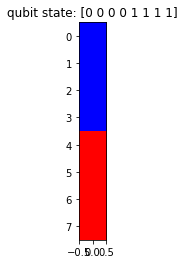

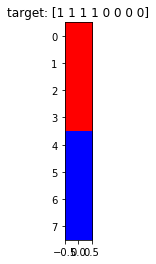

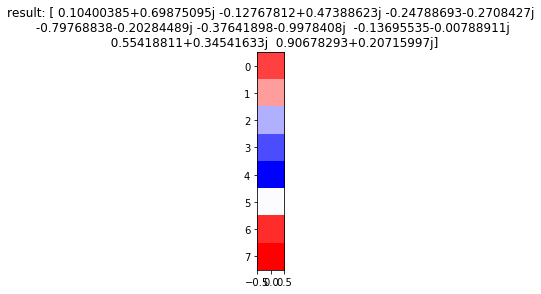

Generation: 23/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

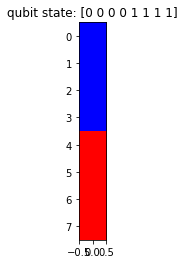

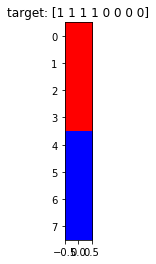

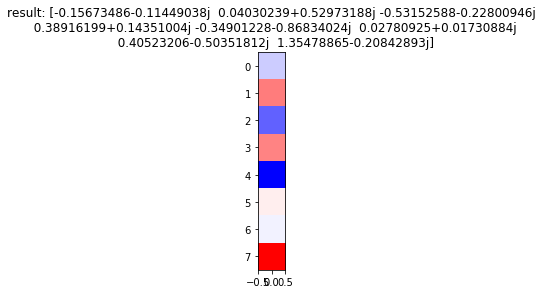

Generation: 23/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

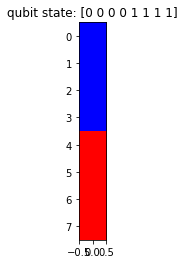

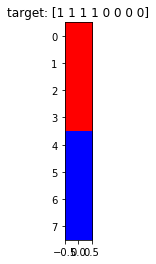

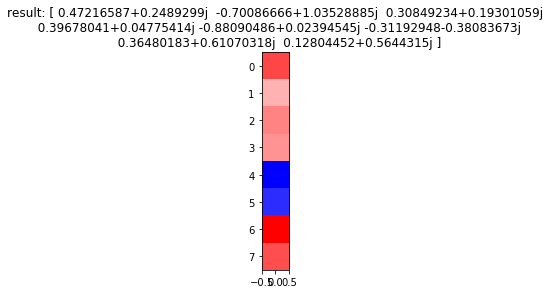

Generation: 23/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

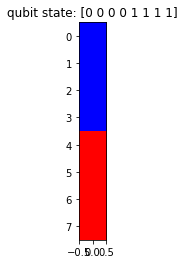

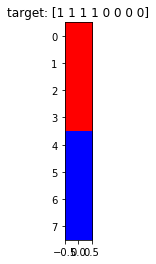

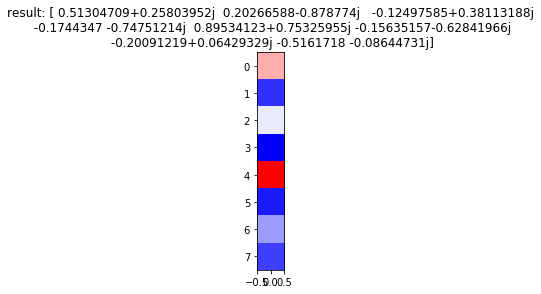

Generation: 23/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

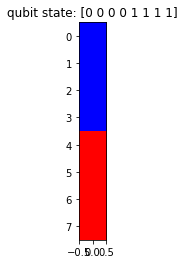

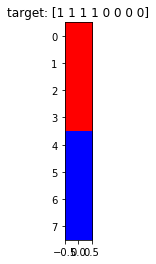

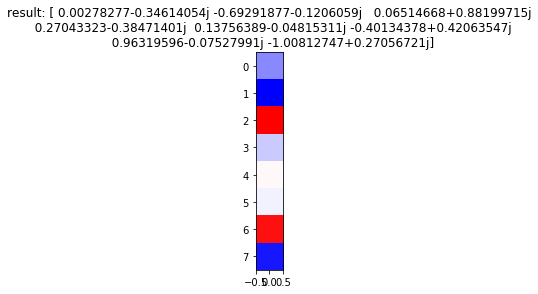

Generation: 23/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

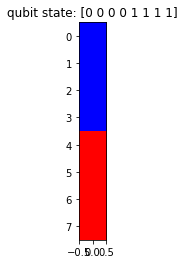

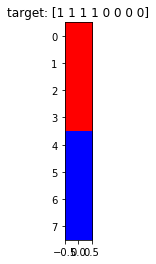

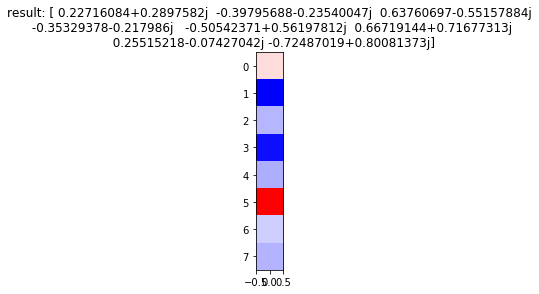

Generation: 23/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

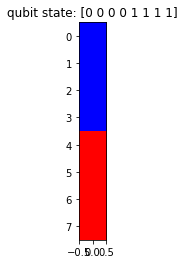

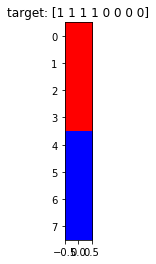

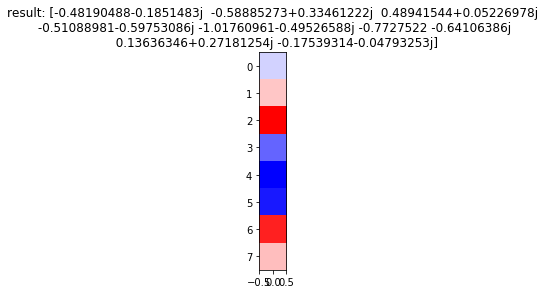

Generation: 23/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

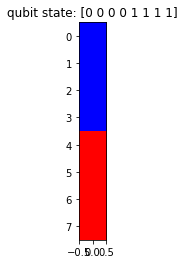

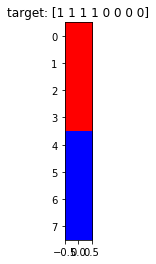

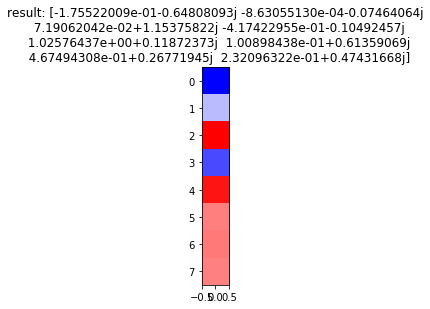

Generation: 24/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

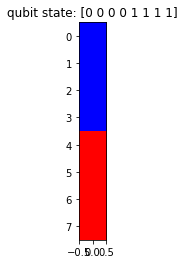

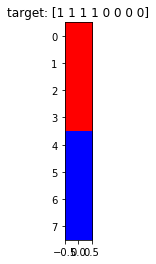

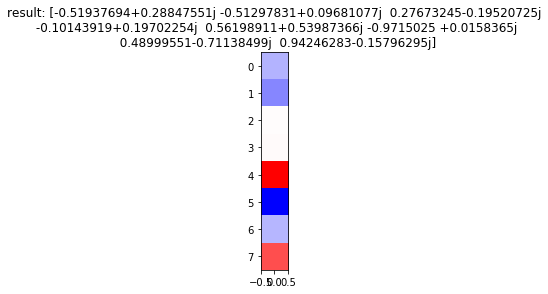

Generation: 24/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

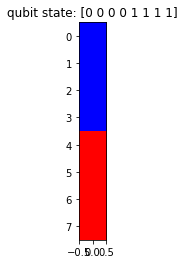

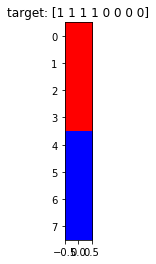

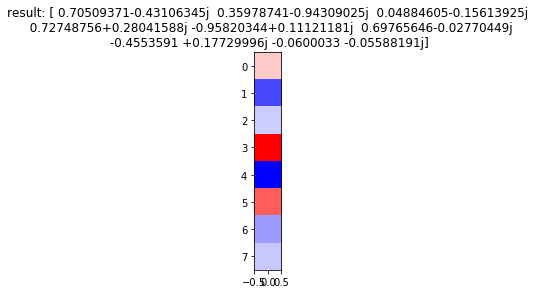

Generation: 24/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

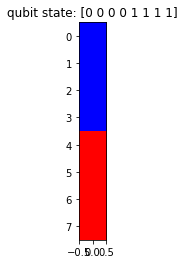

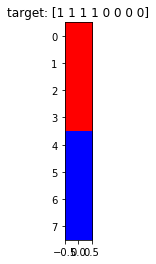

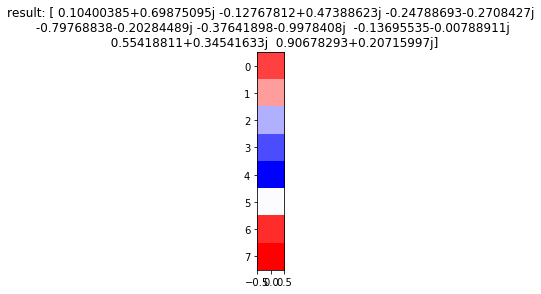

Generation: 24/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

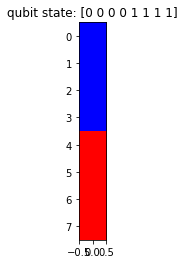

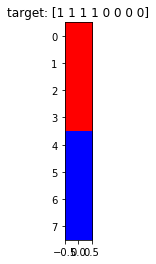

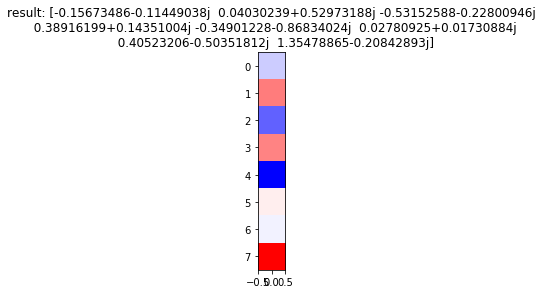

Generation: 24/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

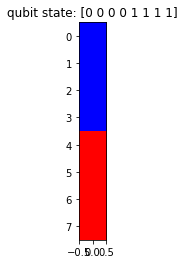

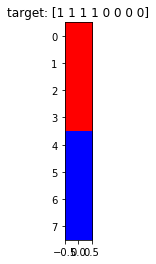

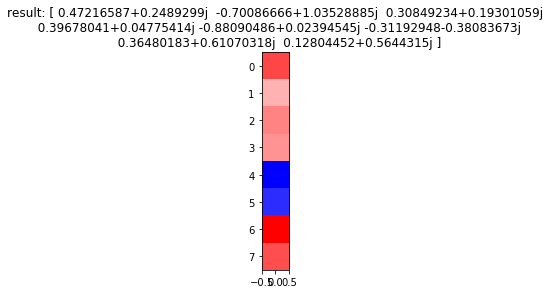

Generation: 24/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

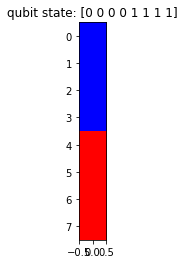

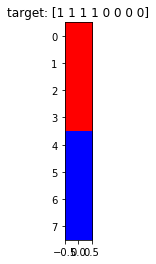

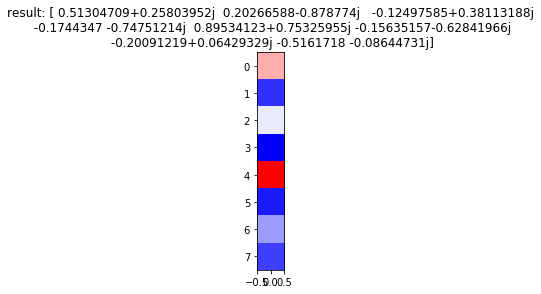

Generation: 24/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

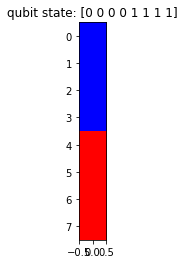

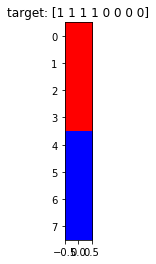

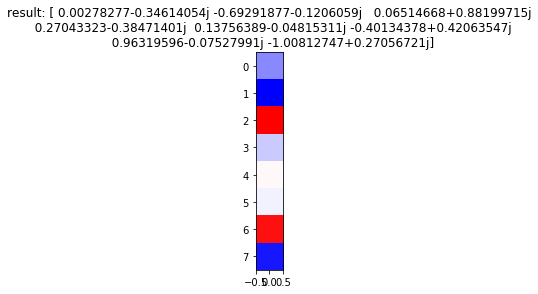

Generation: 24/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

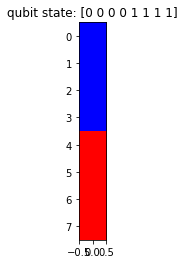

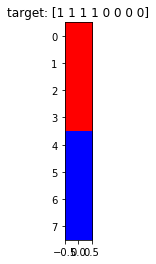

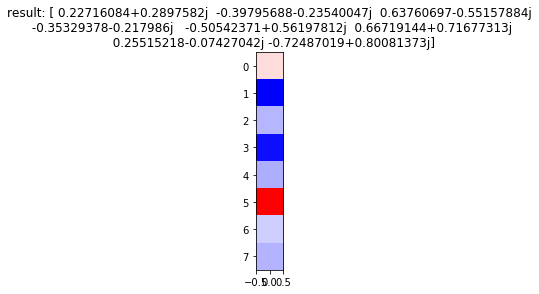

Generation: 24/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

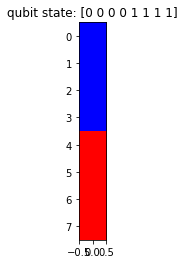

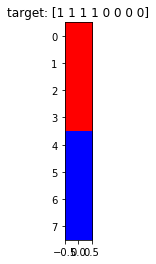

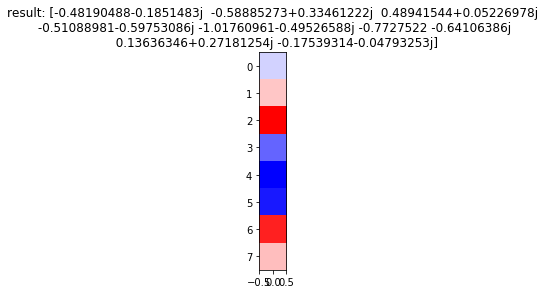

Generation: 24/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

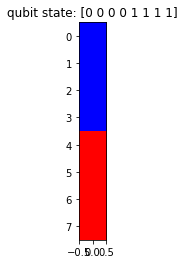

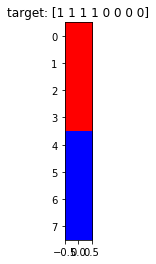

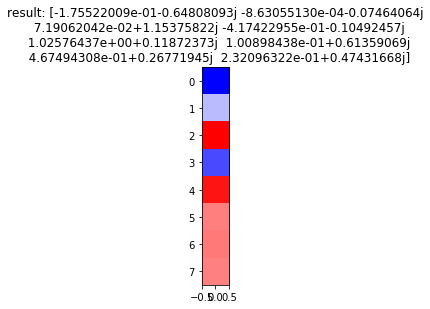

Generation: 25/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

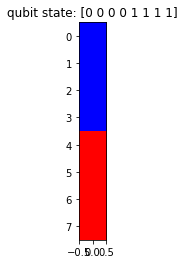

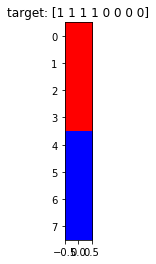

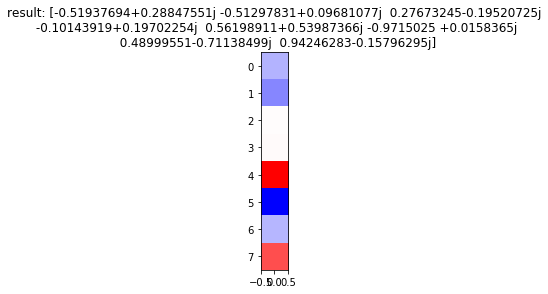

Generation: 25/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

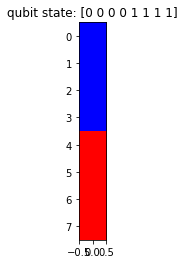

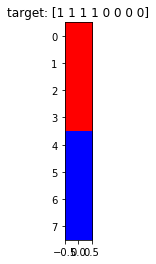

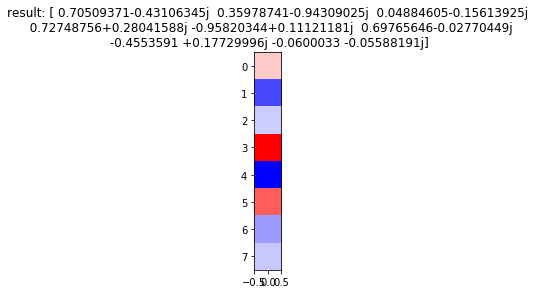

Generation: 25/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

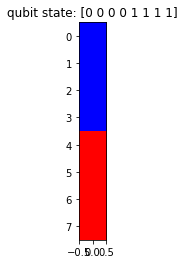

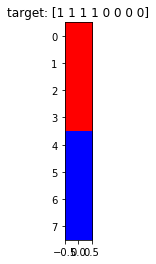

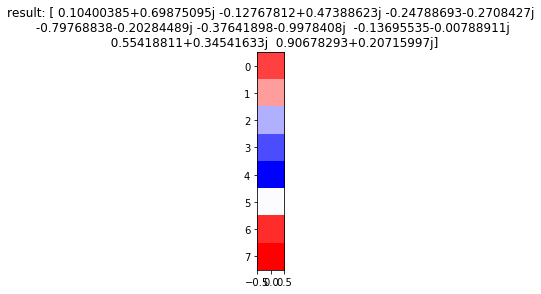

Generation: 25/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

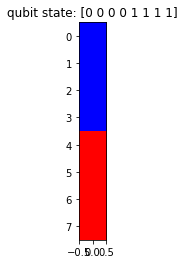

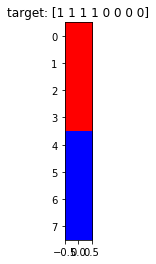

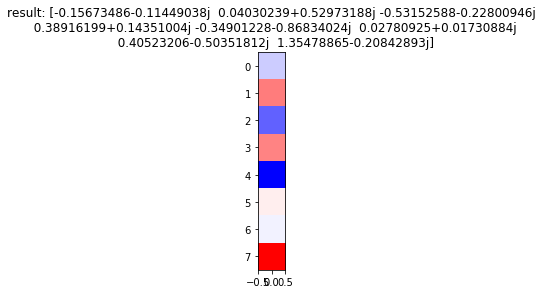

Generation: 25/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

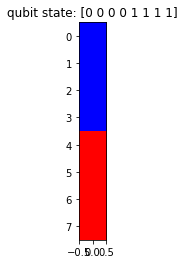

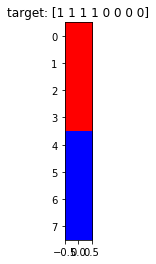

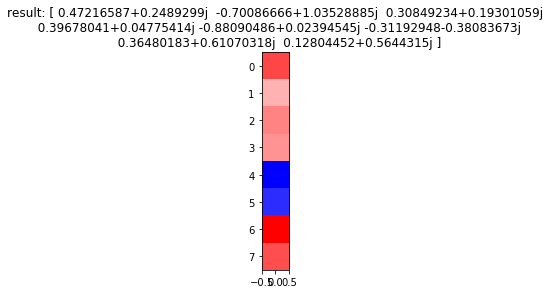

Generation: 25/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

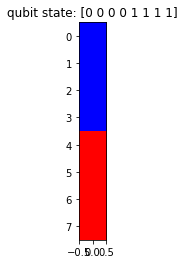

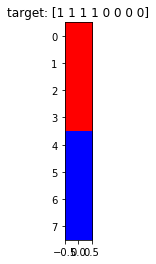

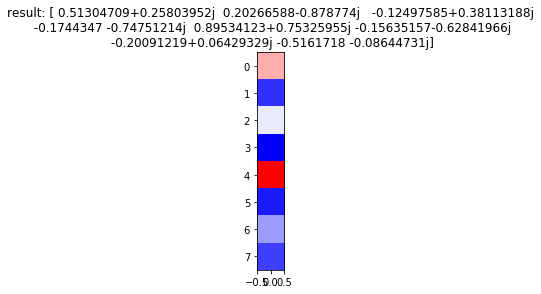

Generation: 25/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

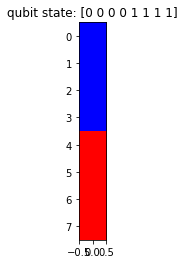

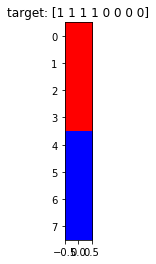

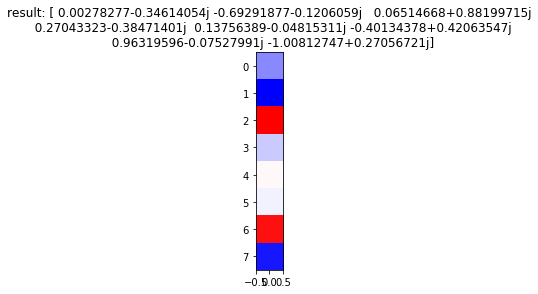

Generation: 25/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

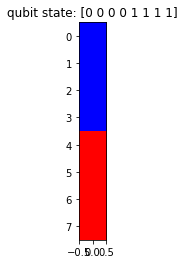

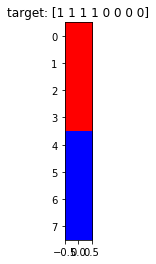

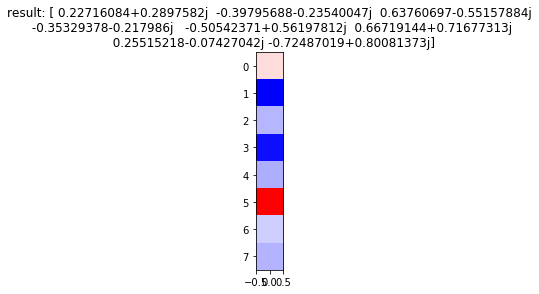

Generation: 25/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

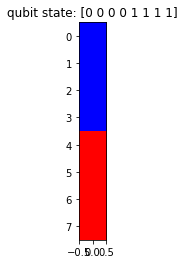

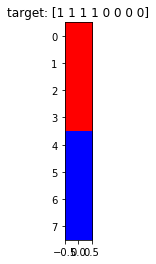

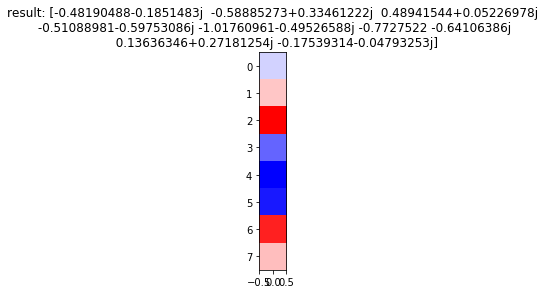

Generation: 25/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

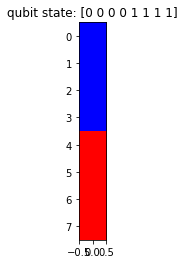

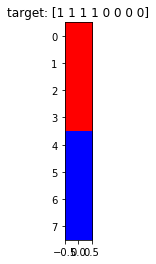

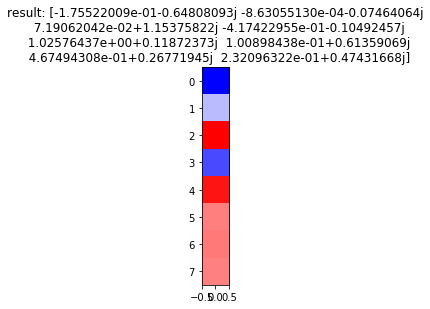

Generation: 26/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

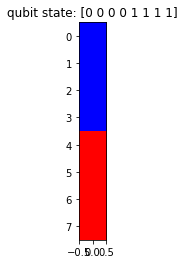

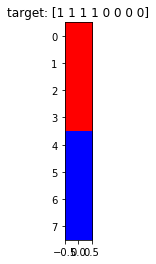

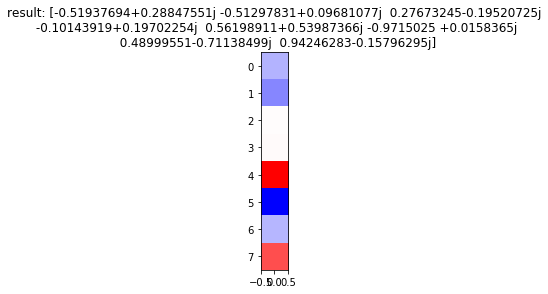

Generation: 26/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

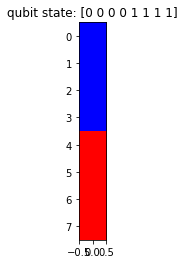

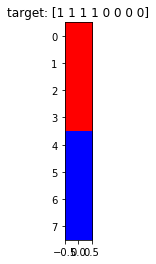

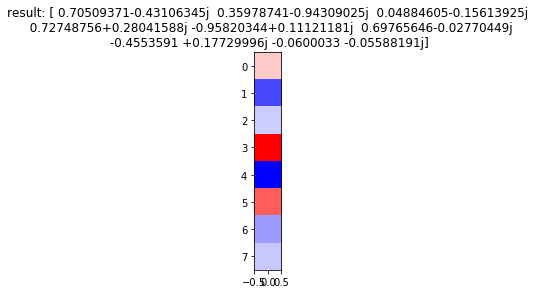

Generation: 26/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

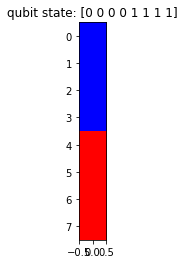

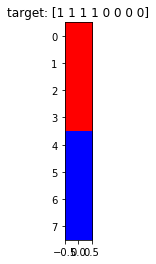

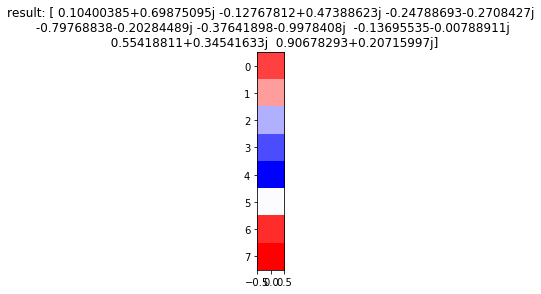

Generation: 26/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

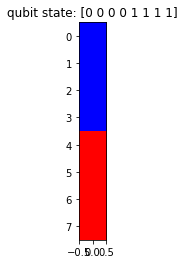

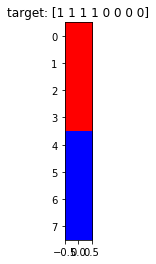

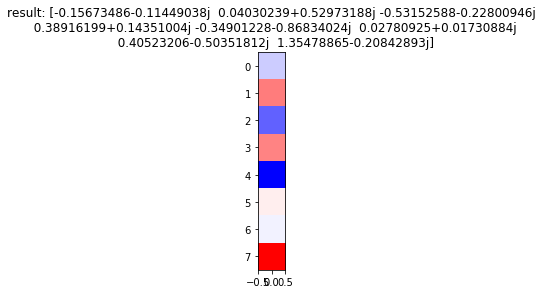

Generation: 26/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

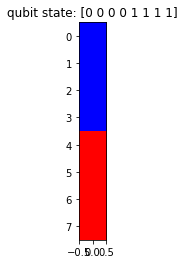

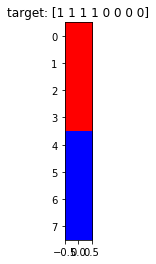

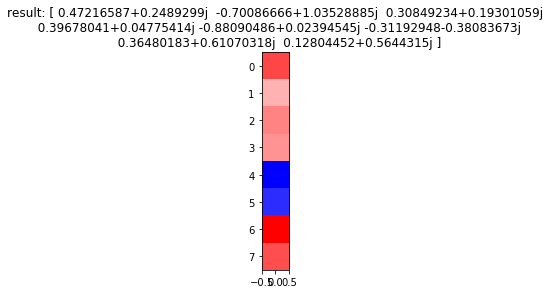

Generation: 26/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

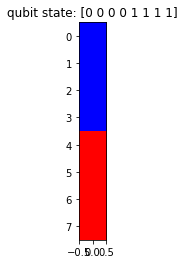

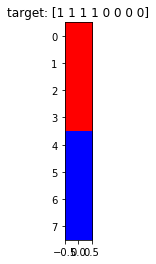

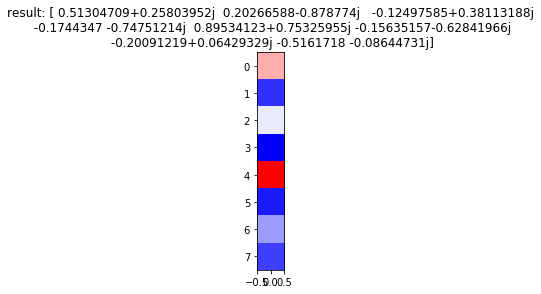

Generation: 26/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

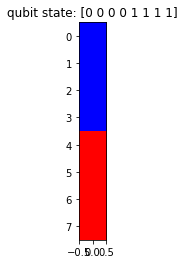

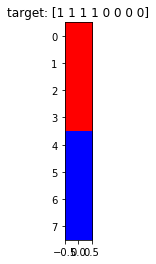

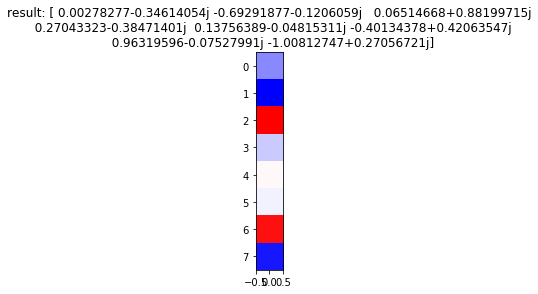

Generation: 26/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

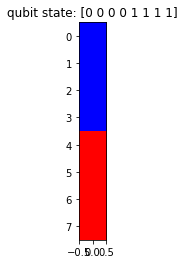

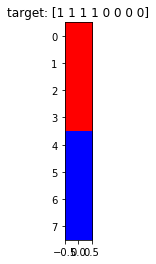

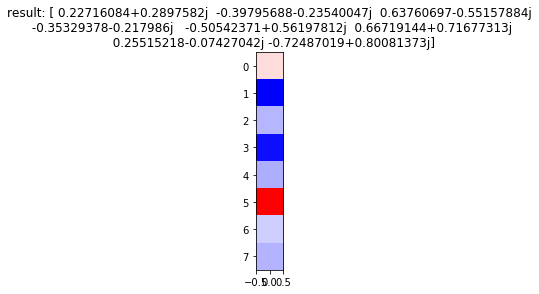

Generation: 26/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

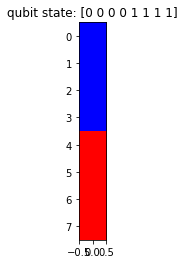

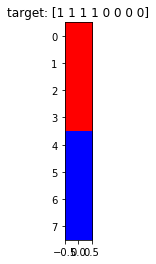

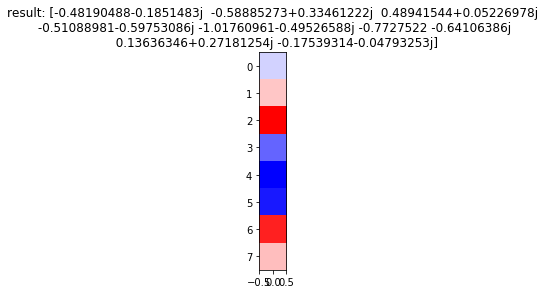

Generation: 26/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

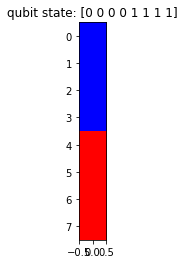

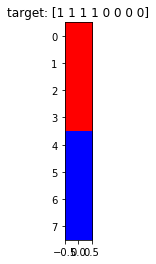

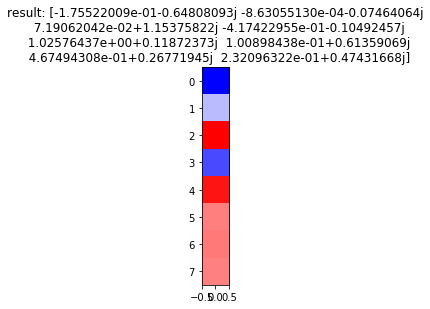

Generation: 27/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

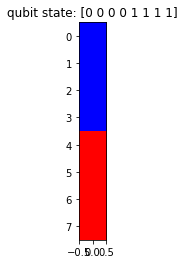

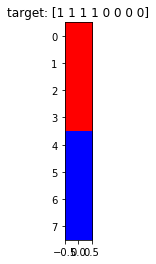

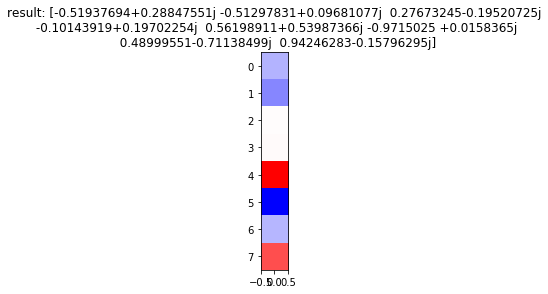

Generation: 27/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

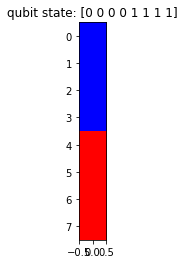

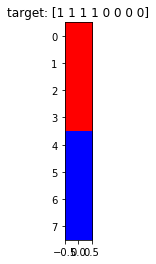

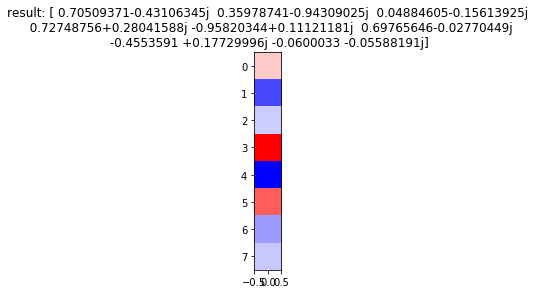

Generation: 27/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

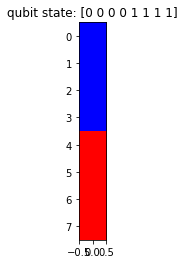

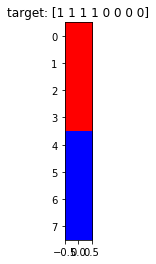

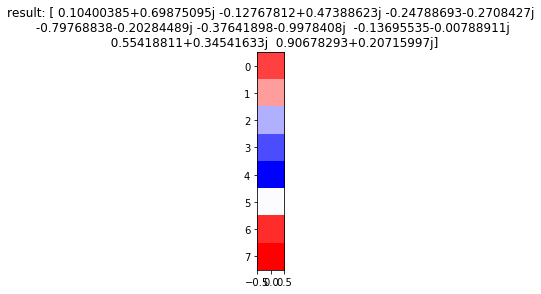

Generation: 27/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

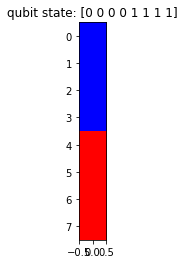

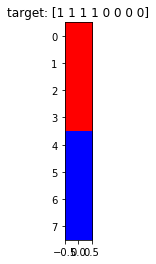

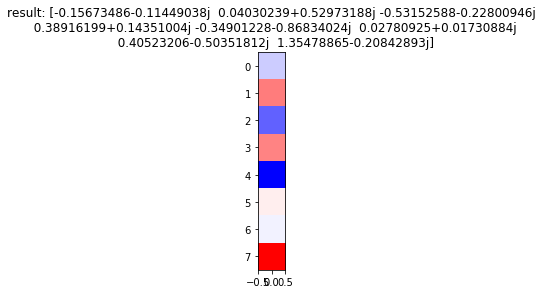

Generation: 27/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

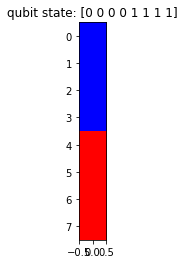

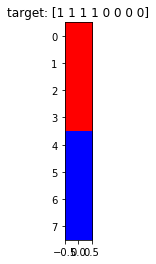

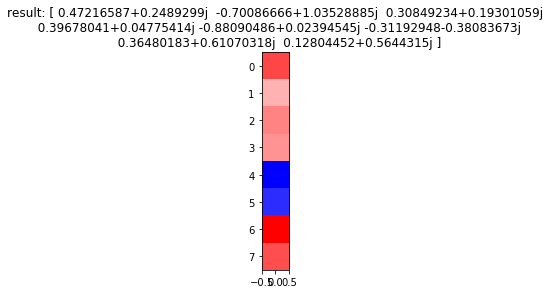

Generation: 27/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

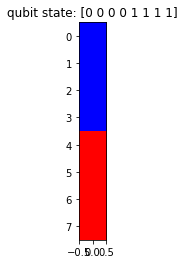

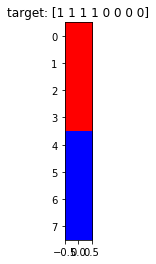

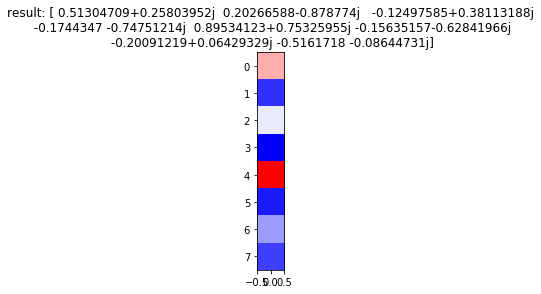

Generation: 27/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

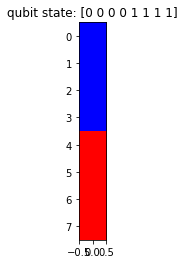

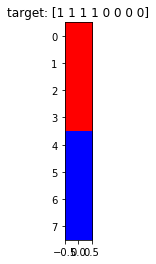

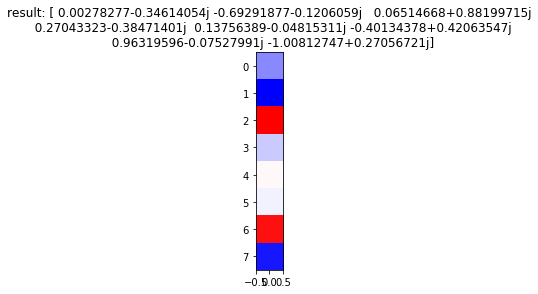

Generation: 27/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

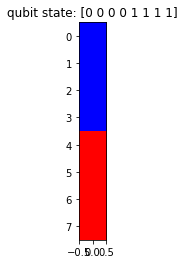

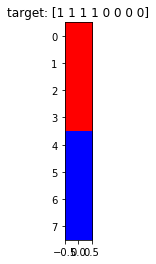

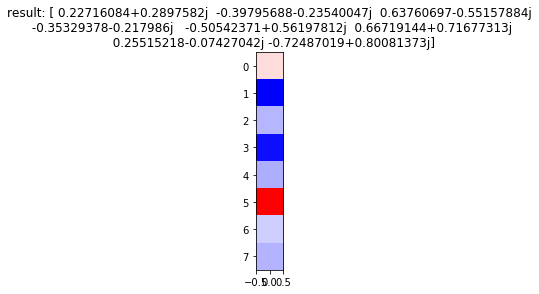

Generation: 27/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

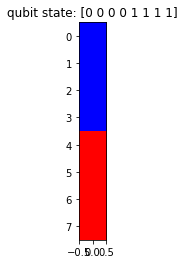

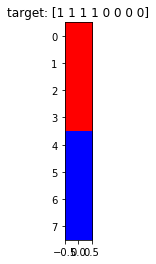

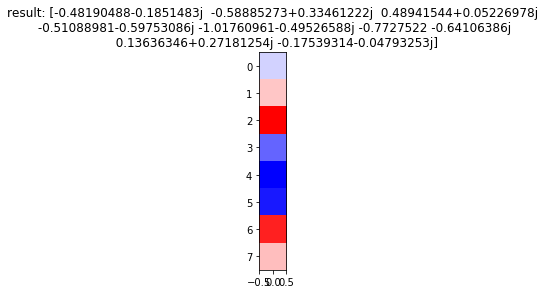

Generation: 27/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

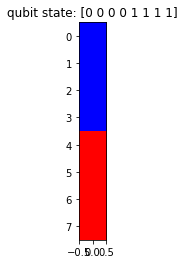

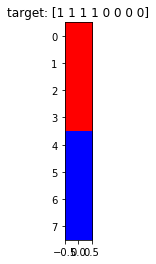

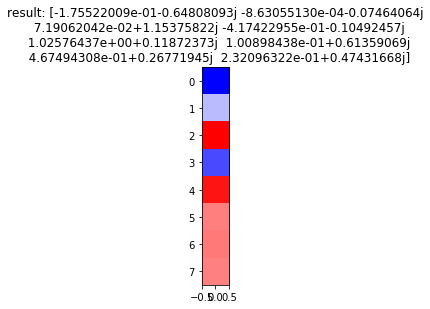

Generation: 28/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

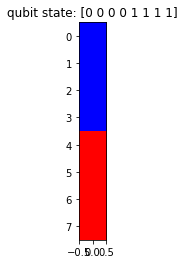

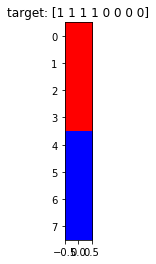

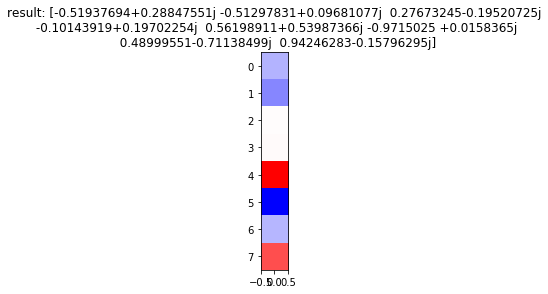

Generation: 28/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

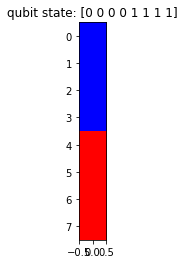

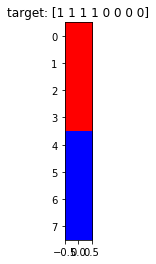

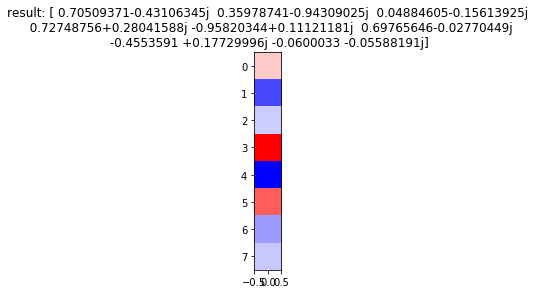

Generation: 28/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

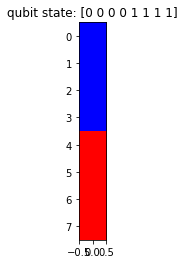

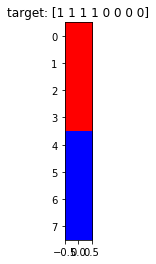

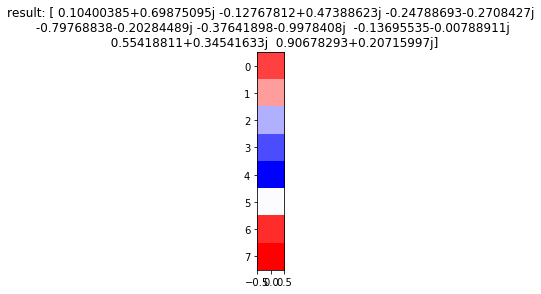

Generation: 28/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

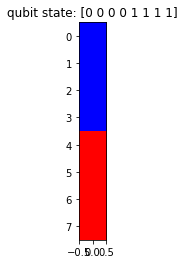

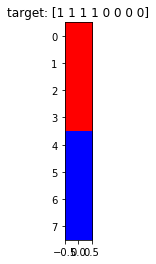

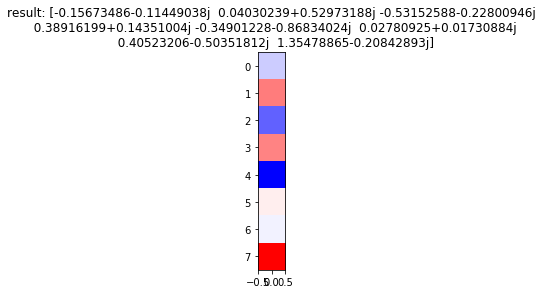

Generation: 28/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

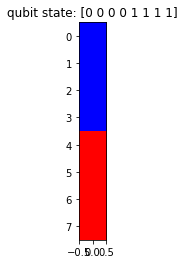

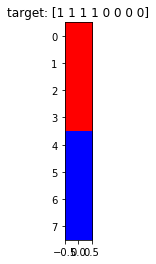

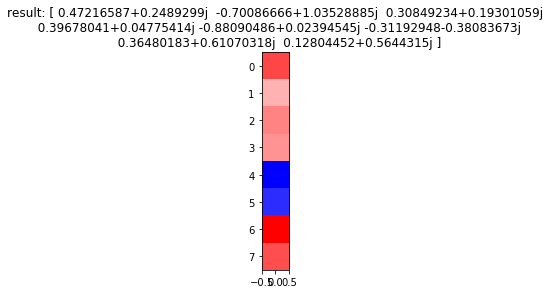

Generation: 28/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

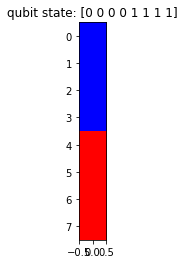

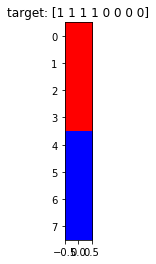

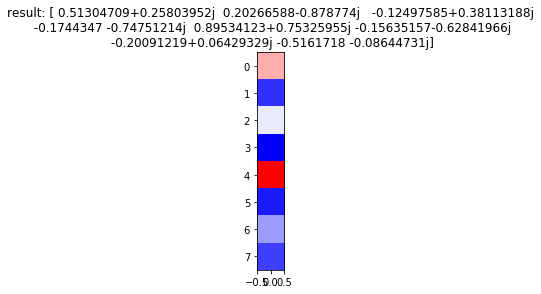

Generation: 28/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

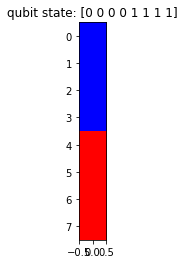

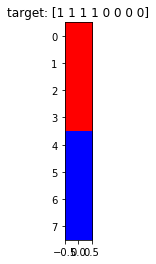

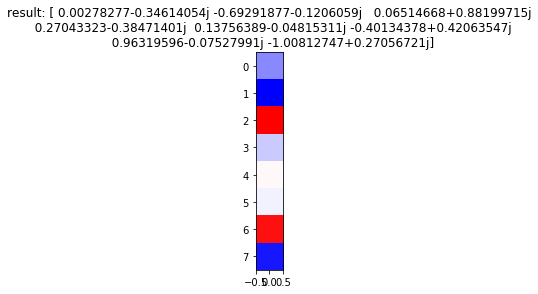

Generation: 28/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

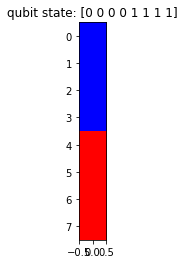

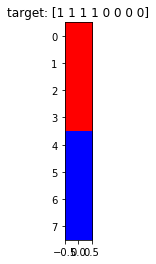

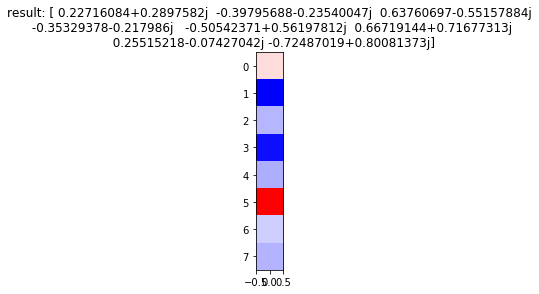

Generation: 28/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

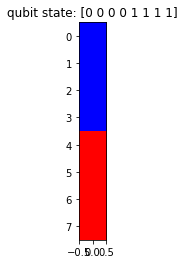

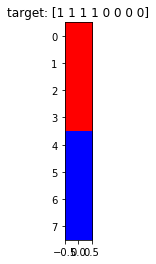

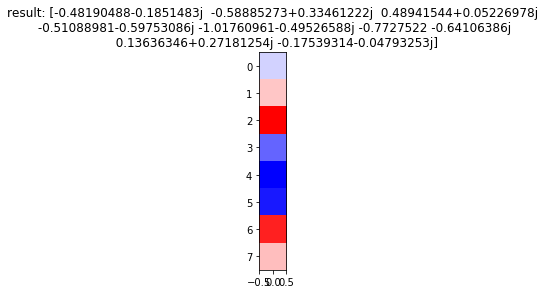

Generation: 28/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

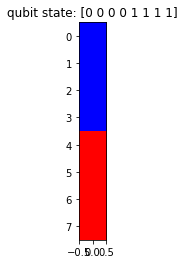

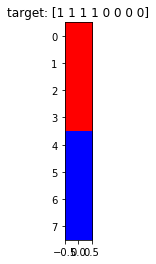

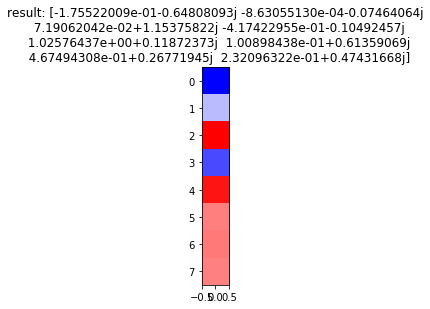

Generation: 29/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

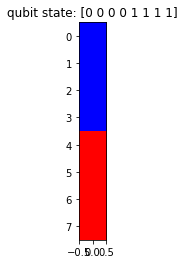

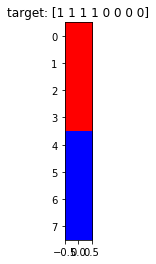

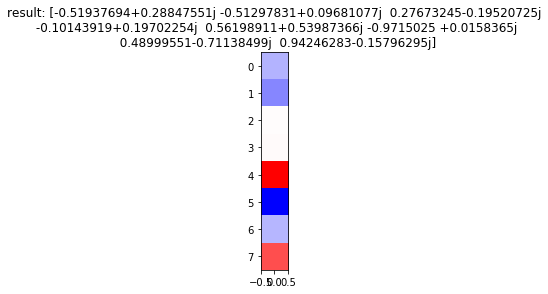

Generation: 29/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

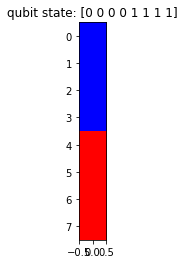

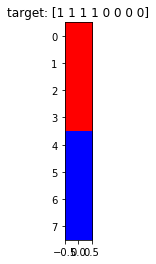

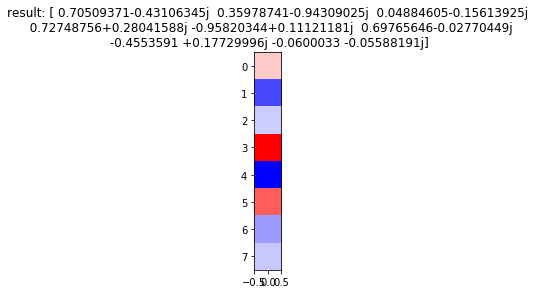

Generation: 29/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

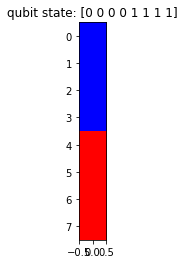

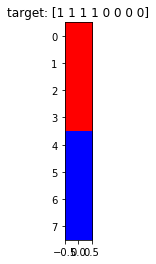

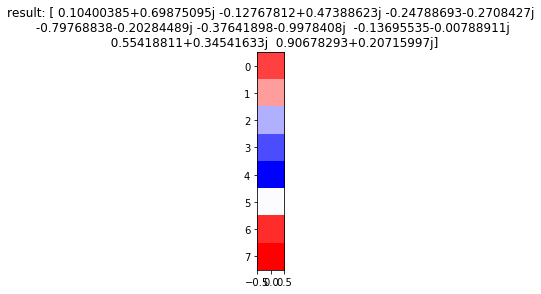

Generation: 29/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

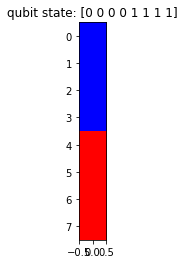

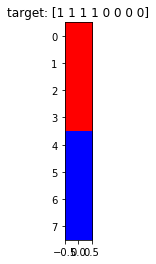

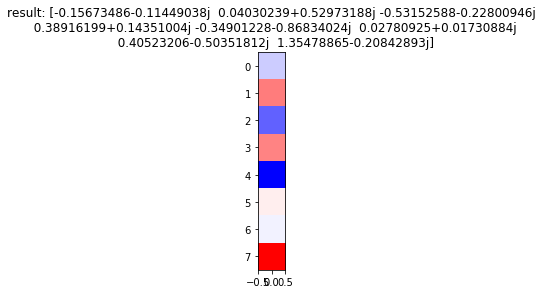

Generation: 29/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

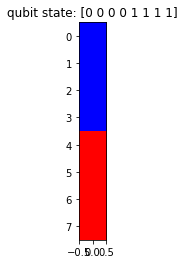

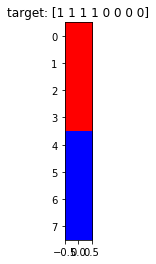

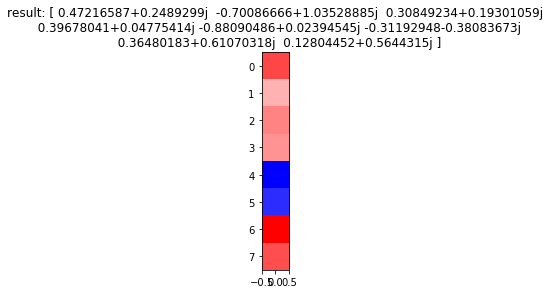

Generation: 29/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

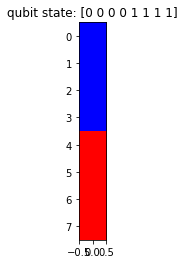

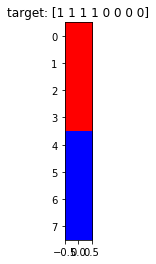

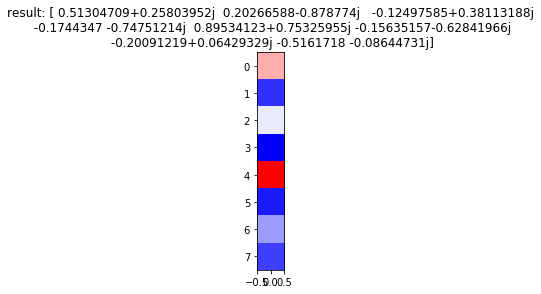

Generation: 29/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

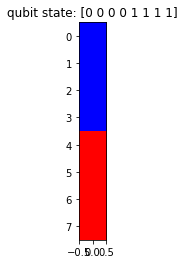

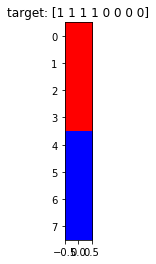

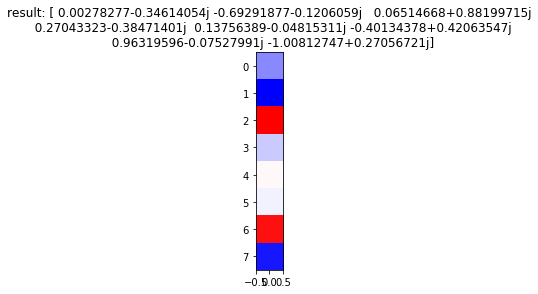

Generation: 29/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

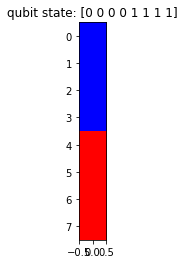

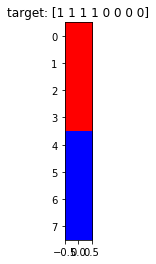

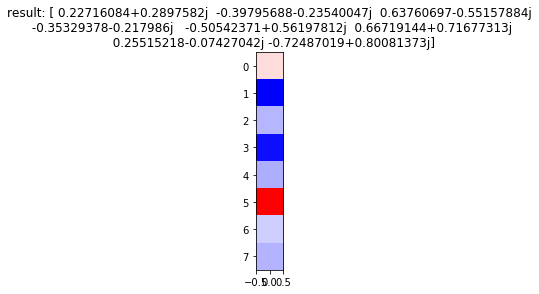

Generation: 29/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

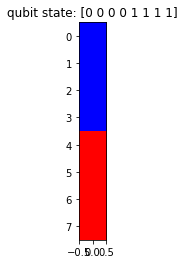

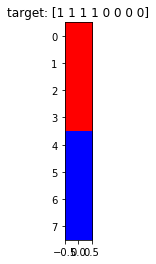

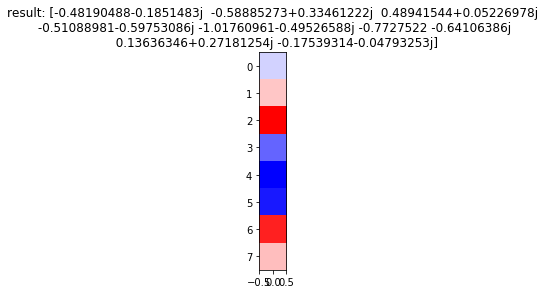

Generation: 29/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

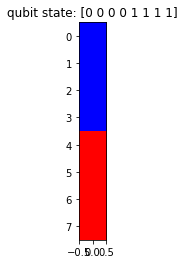

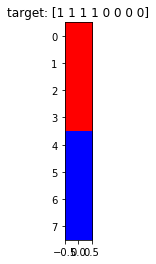

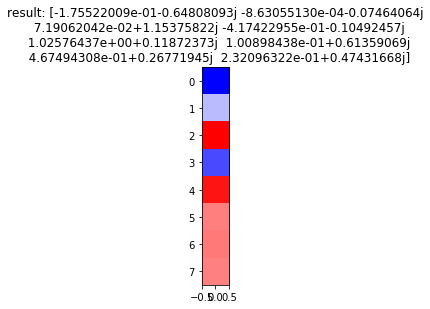

Generation: 30/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

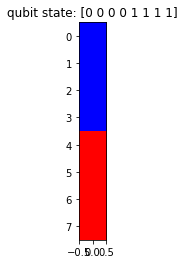

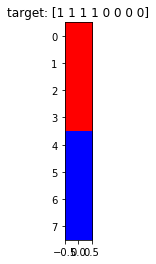

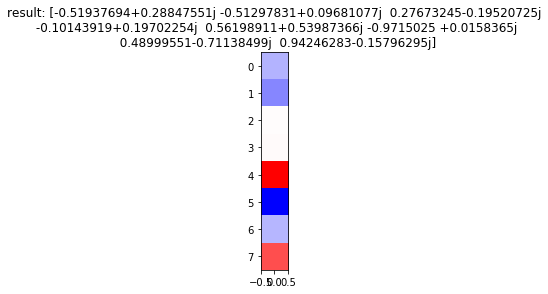

Generation: 30/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

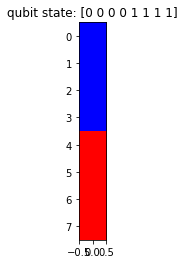

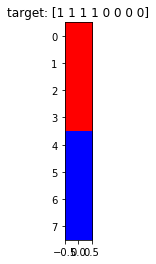

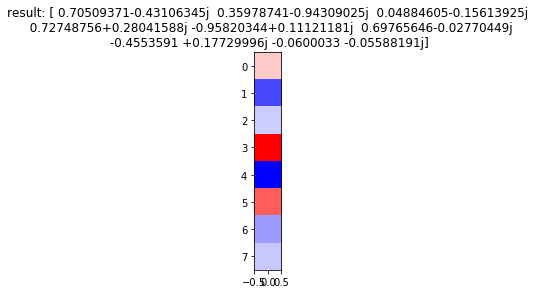

Generation: 30/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

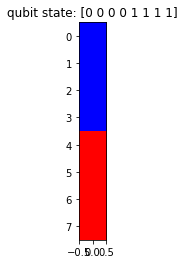

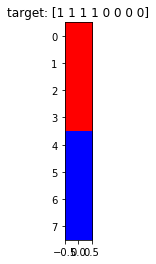

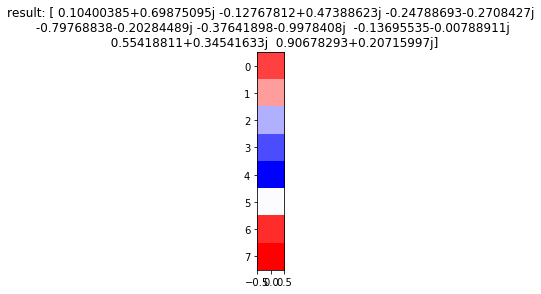

Generation: 30/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

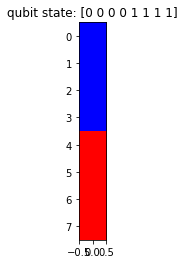

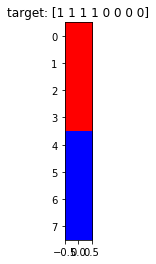

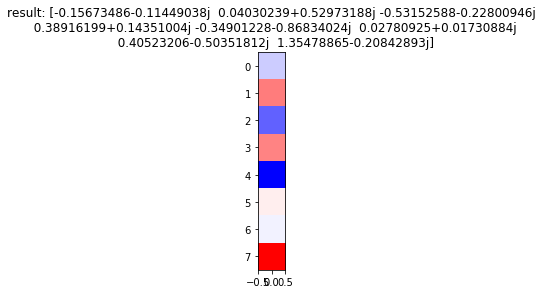

Generation: 30/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

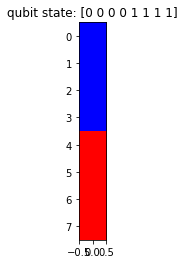

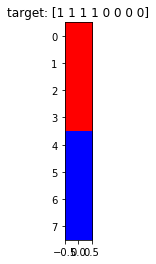

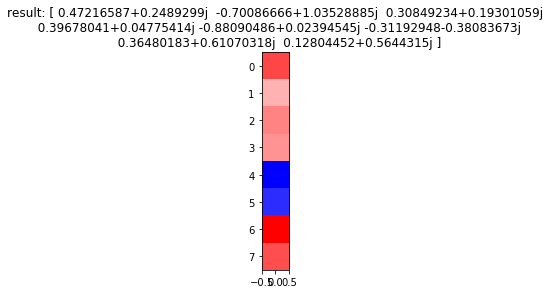

Generation: 30/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

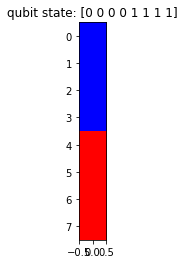

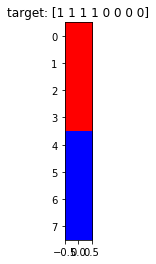

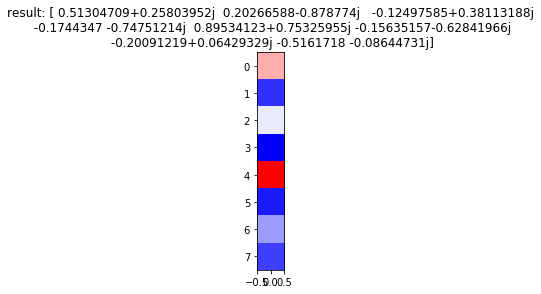

Generation: 30/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

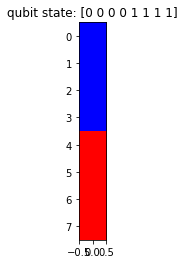

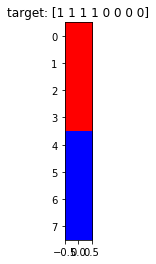

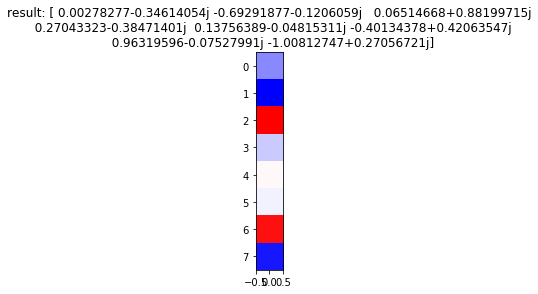

Generation: 30/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

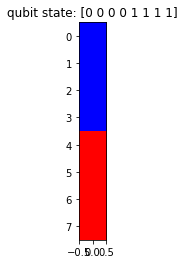

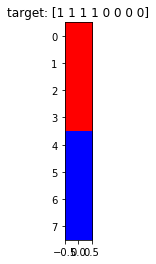

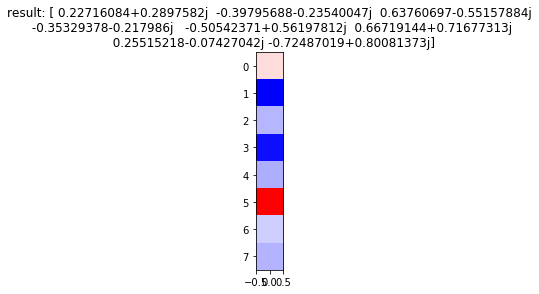

Generation: 30/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

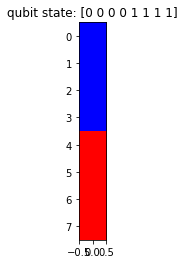

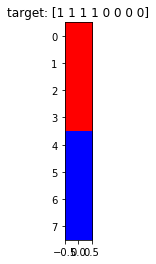

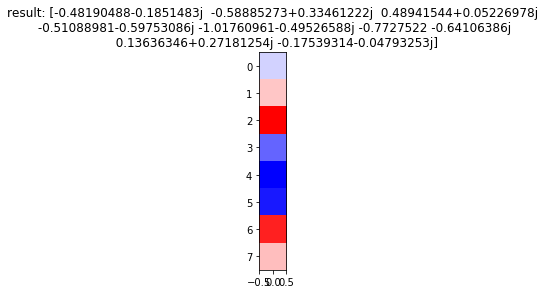

Generation: 30/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

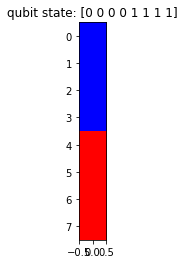

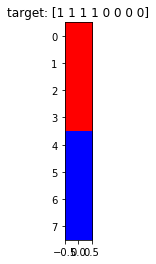

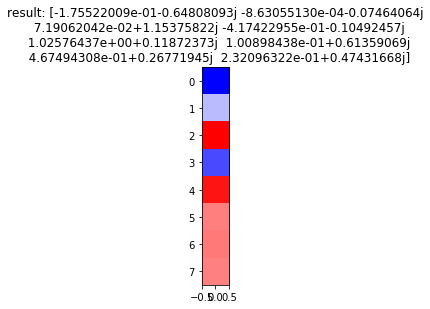

Generation: 31/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

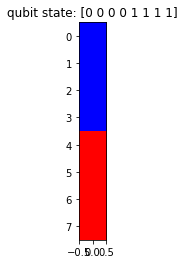

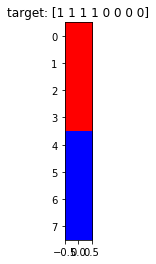

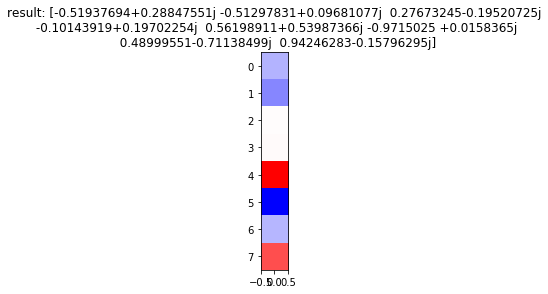

Generation: 31/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

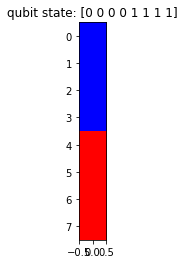

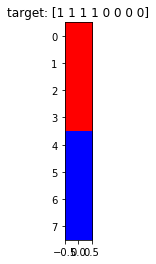

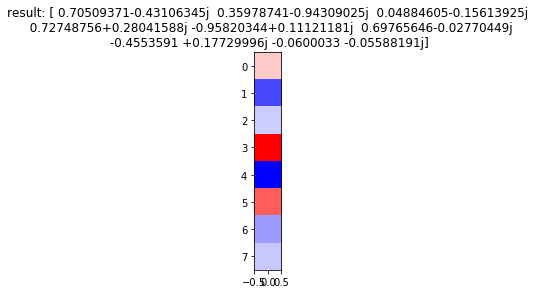

Generation: 31/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

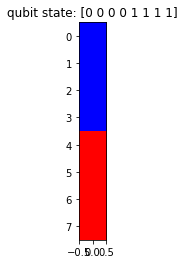

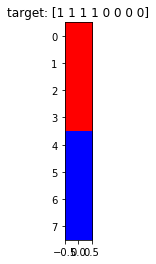

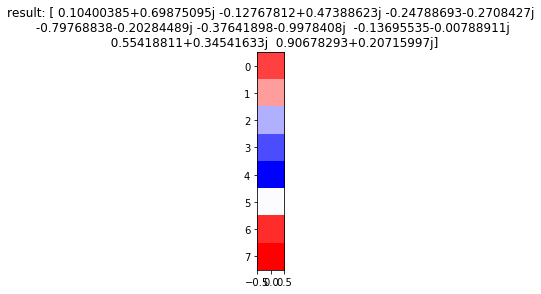

Generation: 31/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

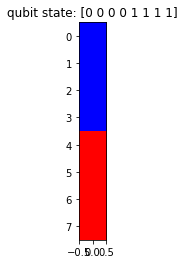

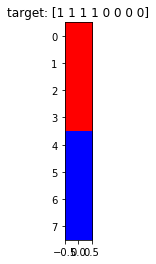

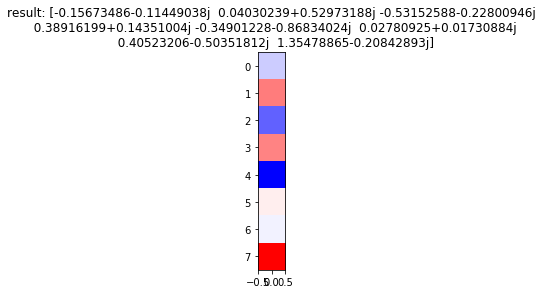

Generation: 31/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

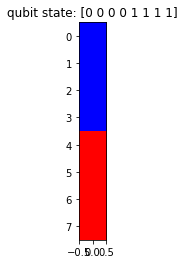

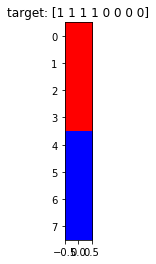

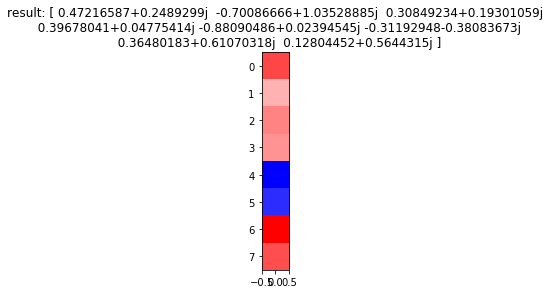

Generation: 31/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

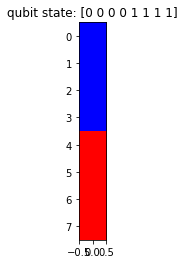

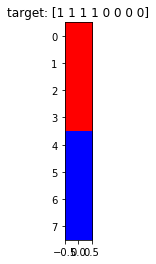

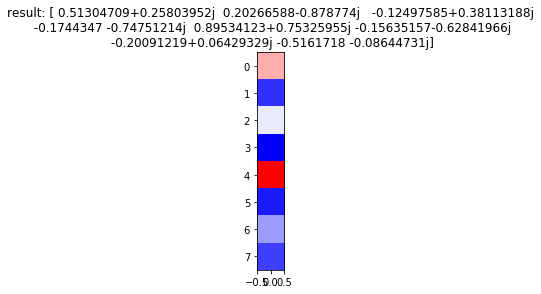

Generation: 31/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

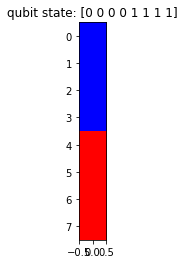

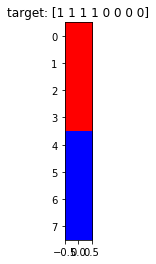

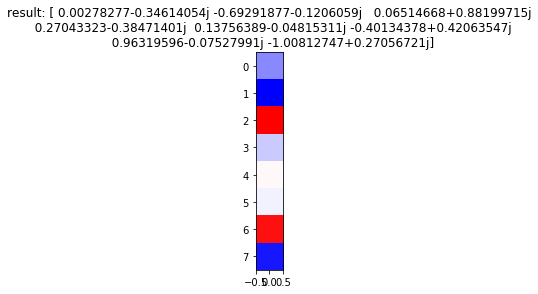

Generation: 31/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

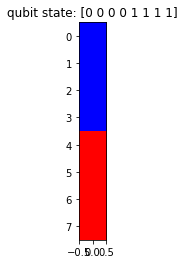

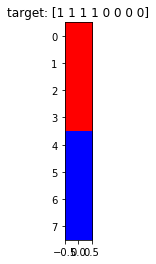

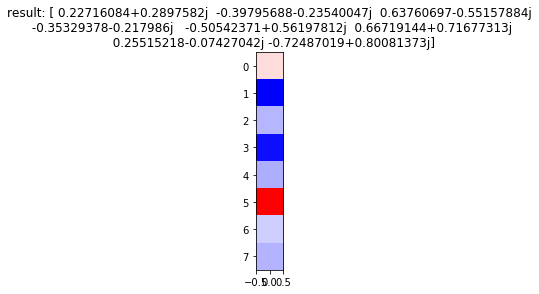

Generation: 31/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

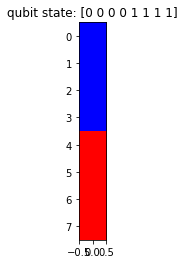

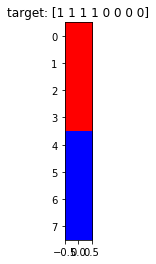

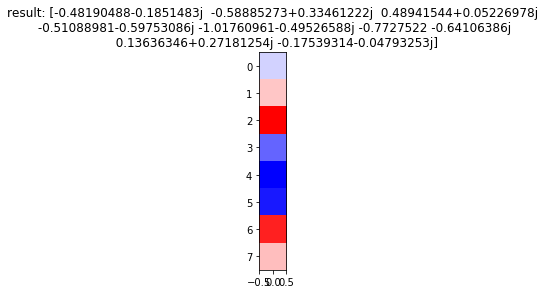

Generation: 31/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

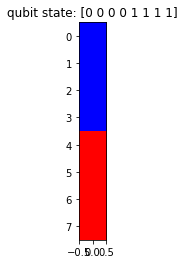

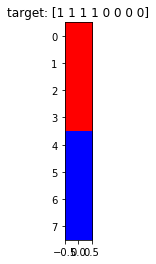

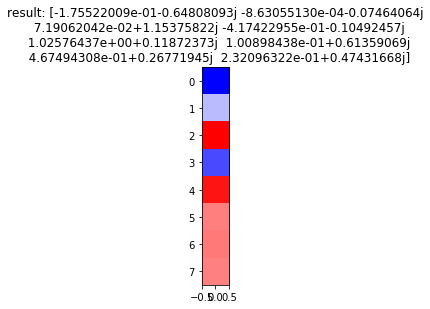

Generation: 32/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

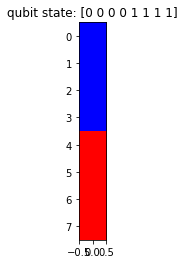

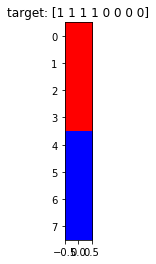

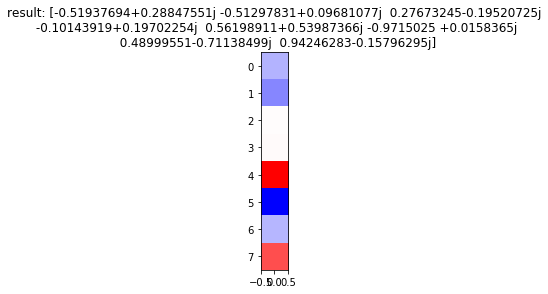

Generation: 32/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

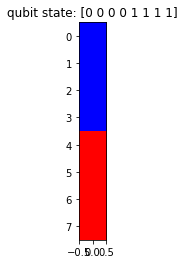

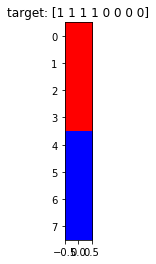

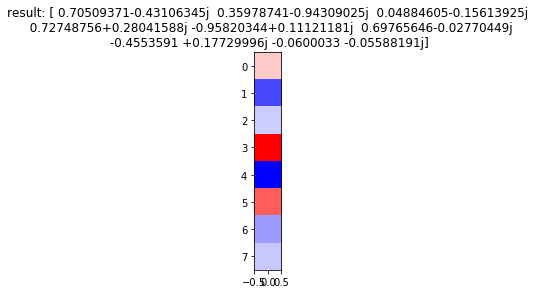

Generation: 32/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

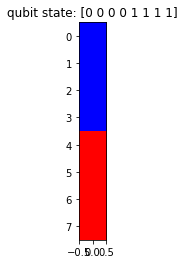

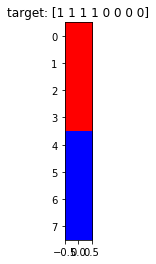

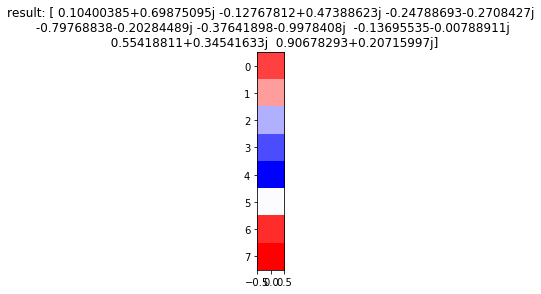

Generation: 32/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

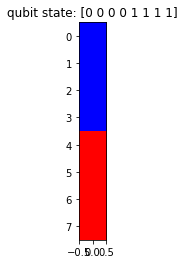

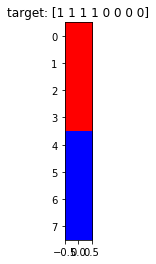

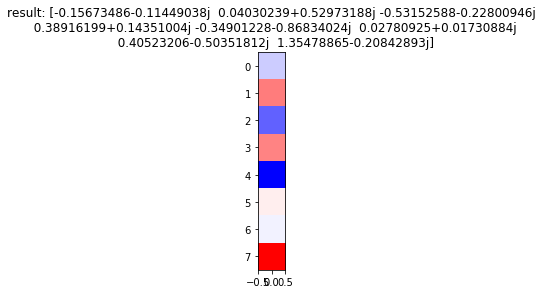

Generation: 32/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

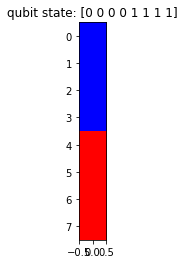

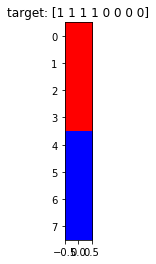

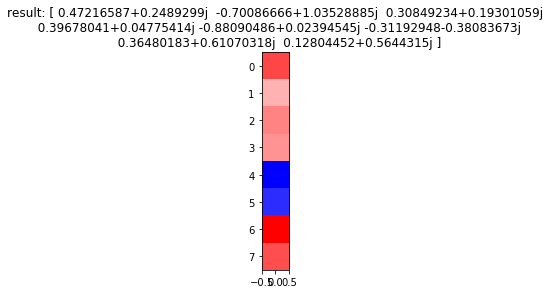

Generation: 32/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

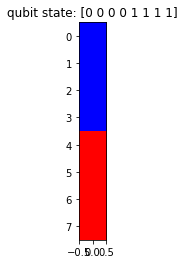

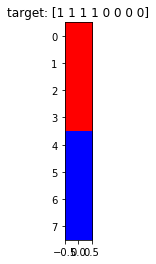

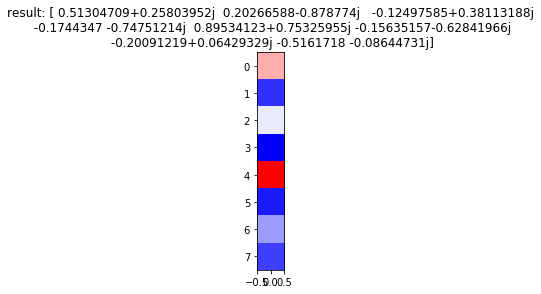

Generation: 32/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

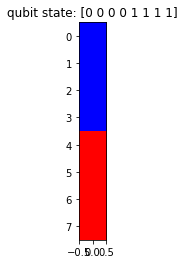

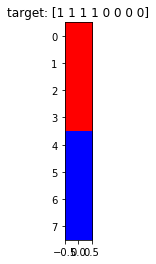

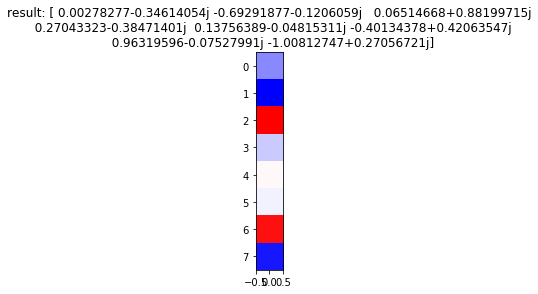

Generation: 32/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

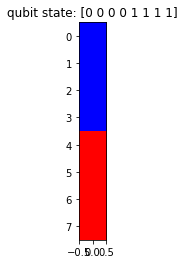

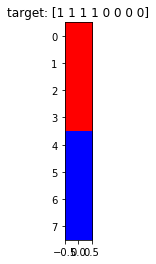

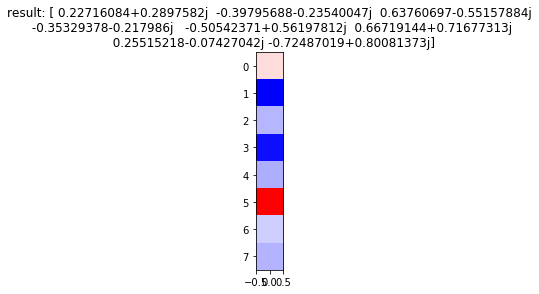

Generation: 32/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

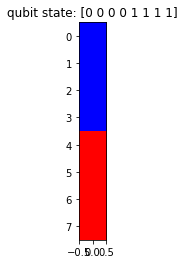

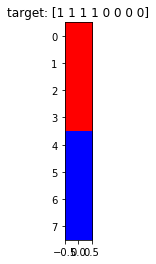

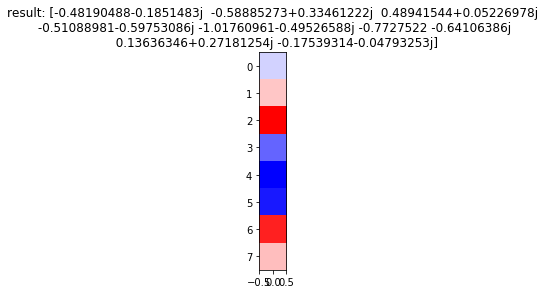

Generation: 32/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

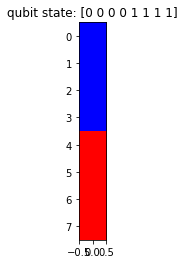

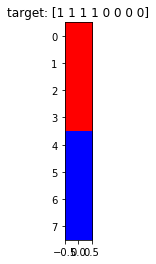

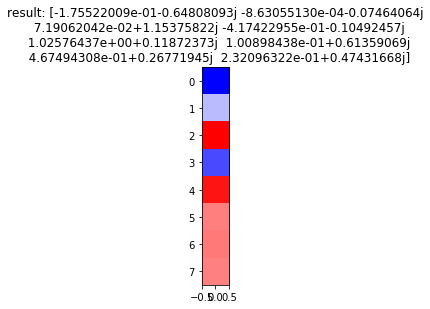

Generation: 33/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

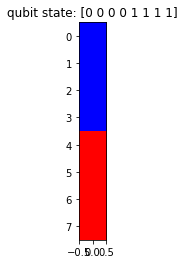

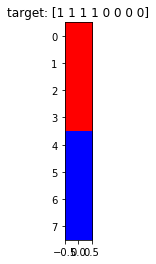

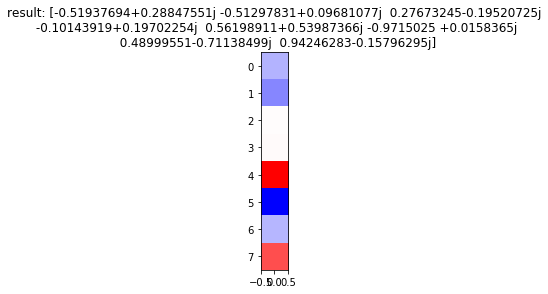

Generation: 33/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

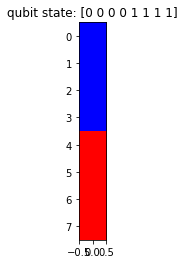

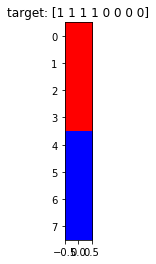

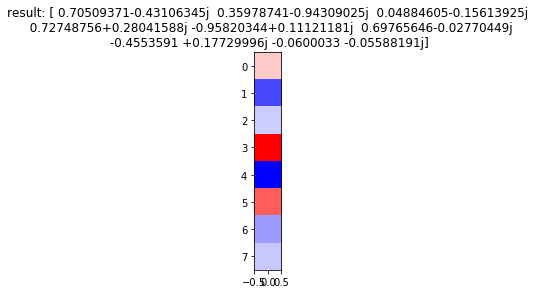

Generation: 33/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

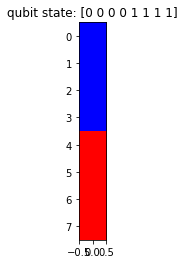

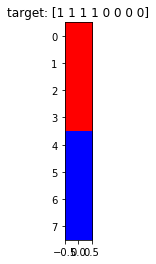

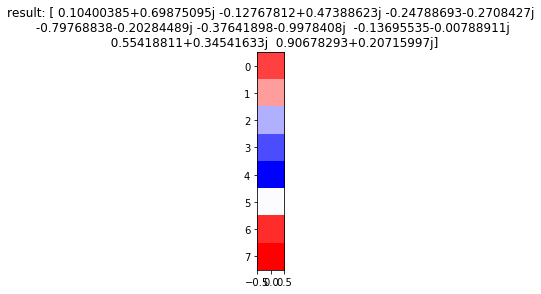

Generation: 33/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

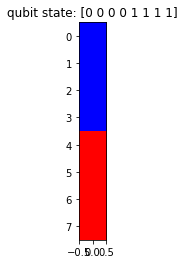

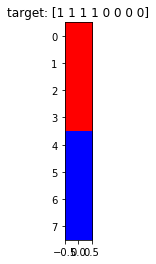

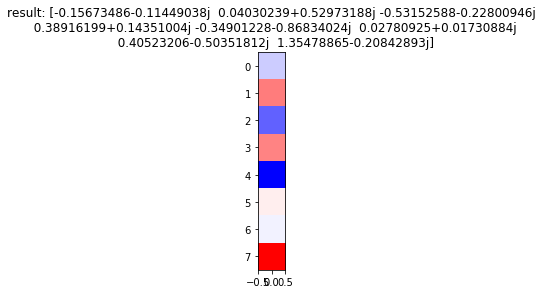

Generation: 33/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

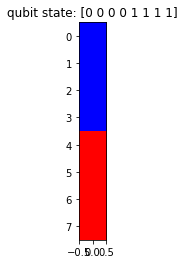

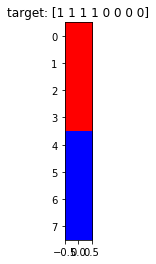

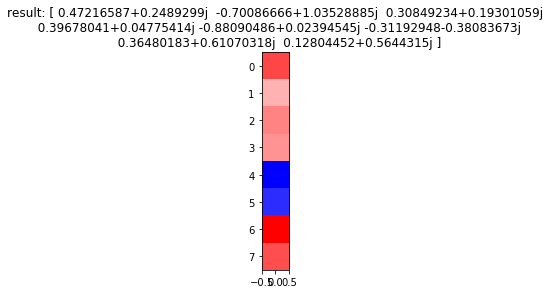

Generation: 33/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

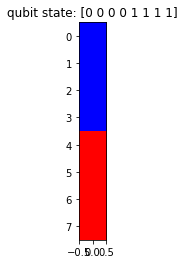

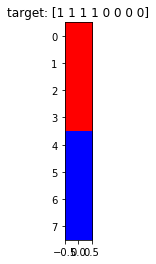

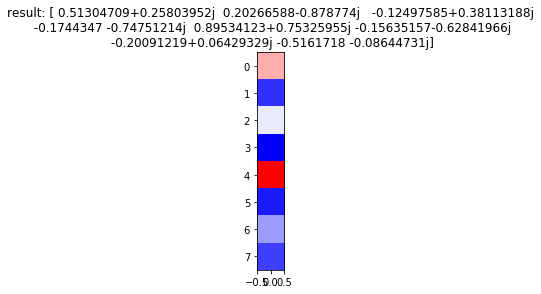

Generation: 33/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

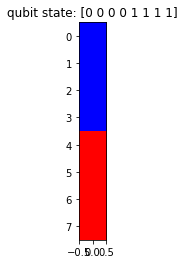

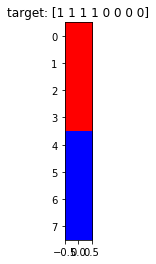

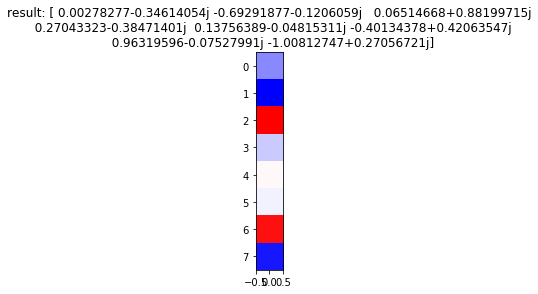

Generation: 33/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

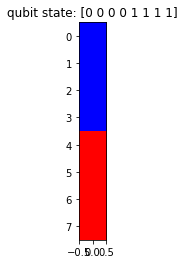

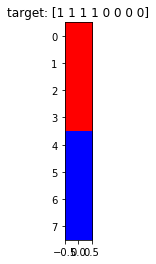

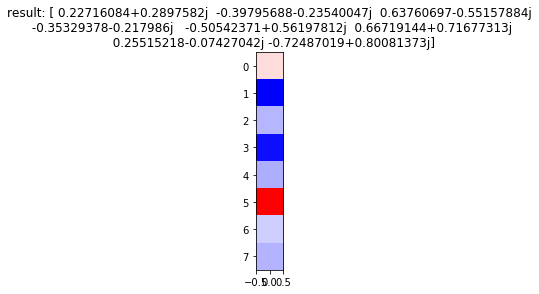

Generation: 33/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

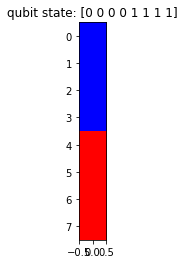

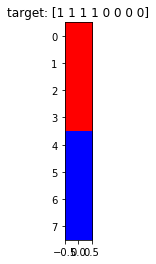

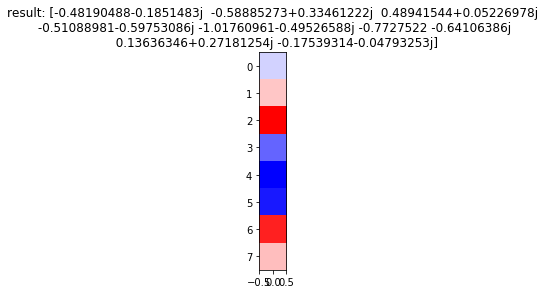

Generation: 33/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

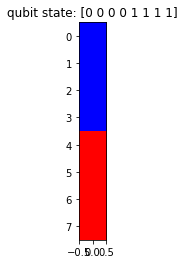

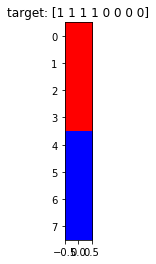

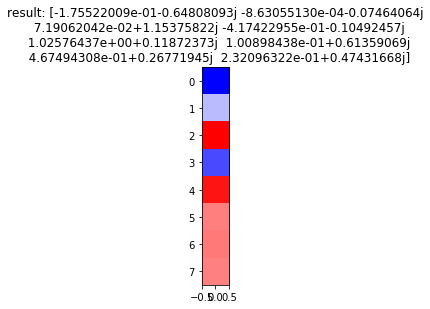

Generation: 34/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

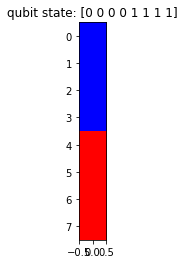

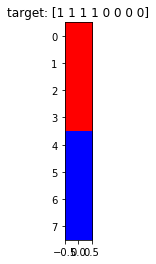

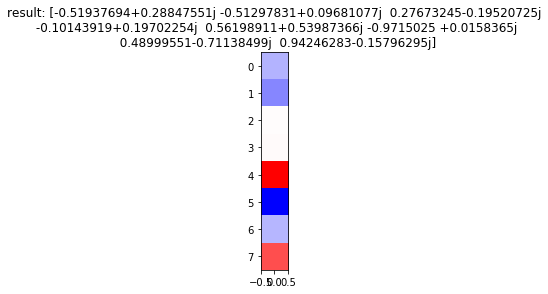

Generation: 34/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

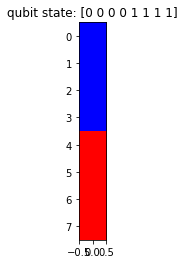

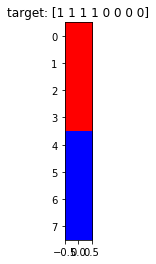

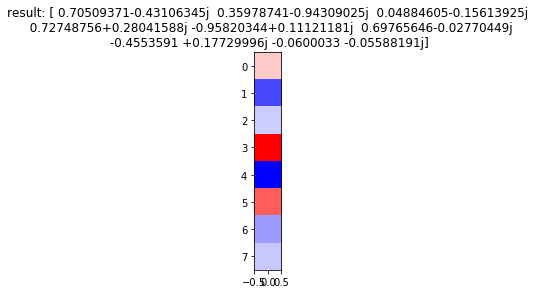

Generation: 34/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

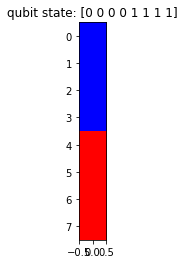

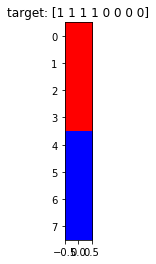

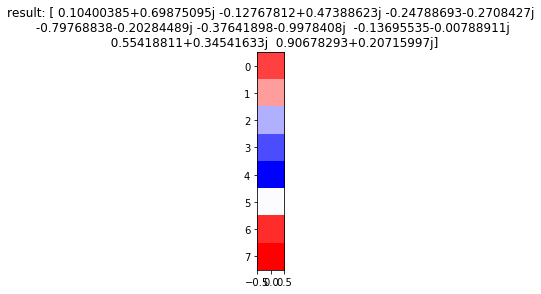

Generation: 34/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

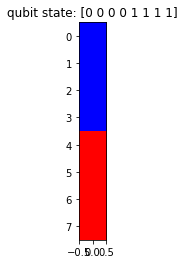

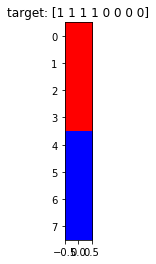

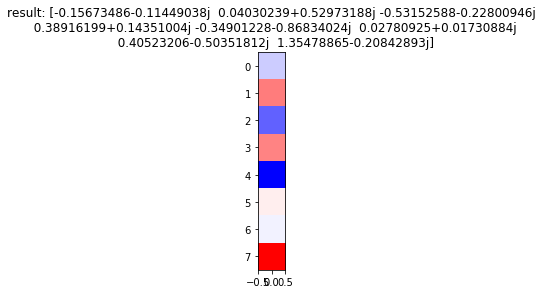

Generation: 34/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

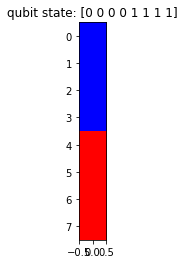

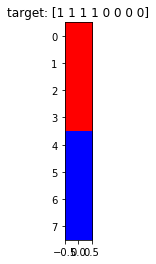

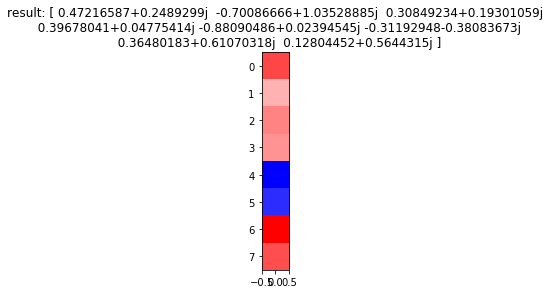

Generation: 34/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

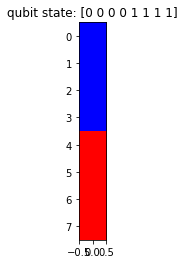

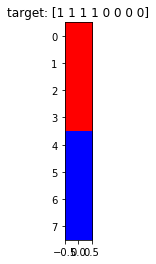

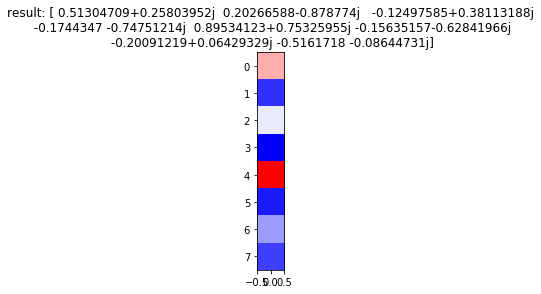

Generation: 34/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

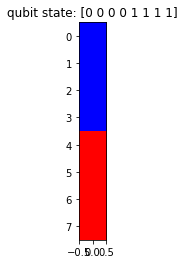

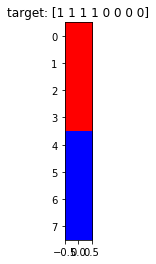

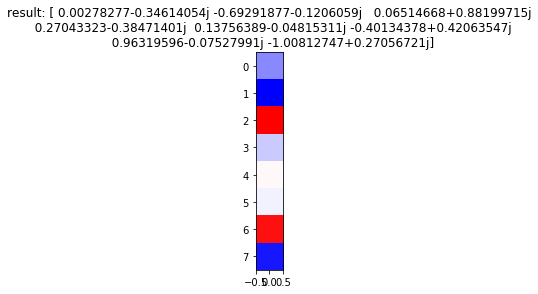

Generation: 34/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

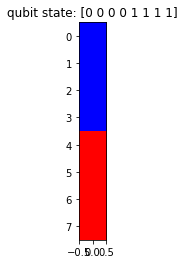

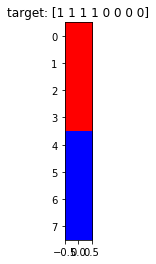

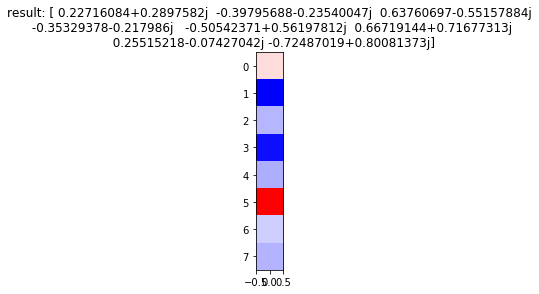

Generation: 34/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

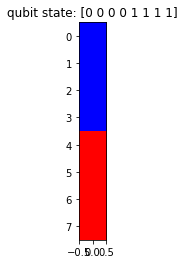

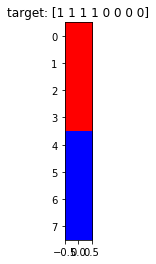

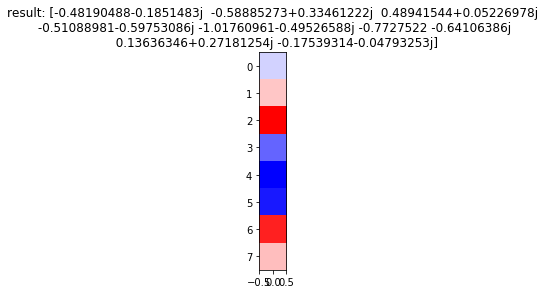

Generation: 34/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

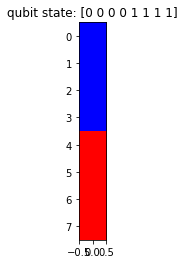

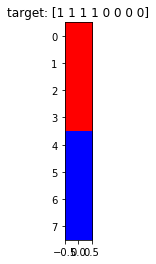

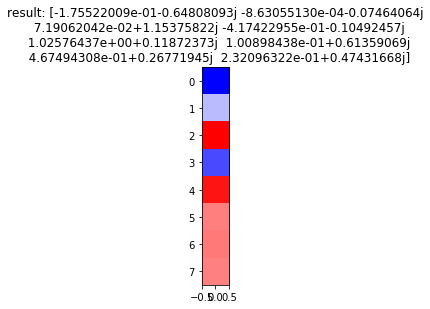

Generation: 35/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

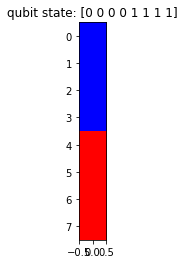

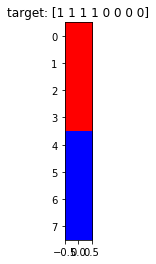

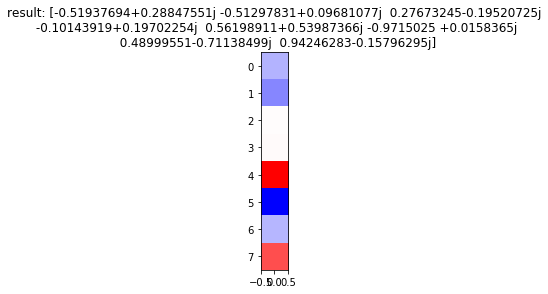

Generation: 35/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

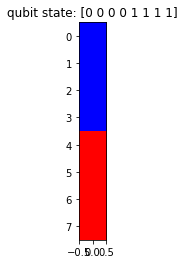

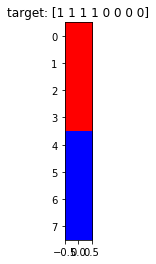

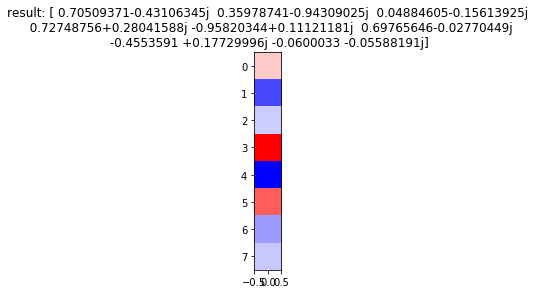

Generation: 35/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

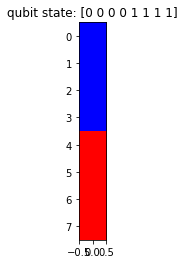

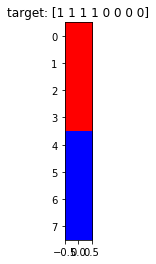

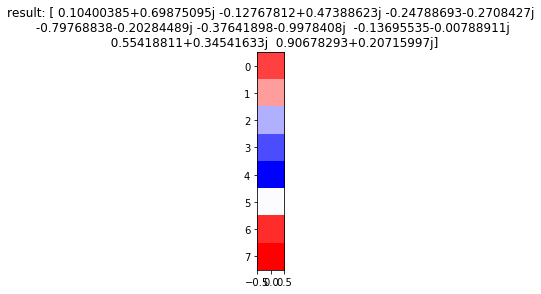

Generation: 35/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

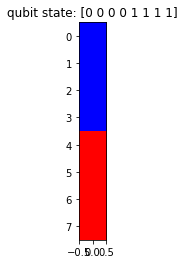

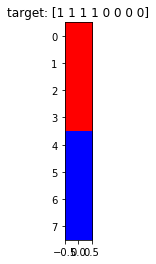

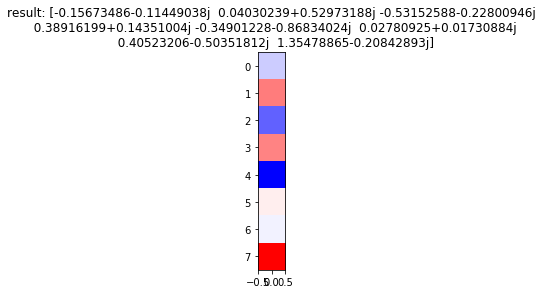

Generation: 35/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

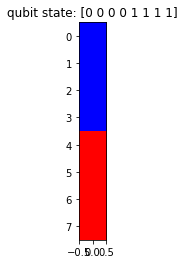

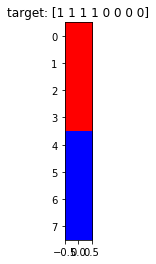

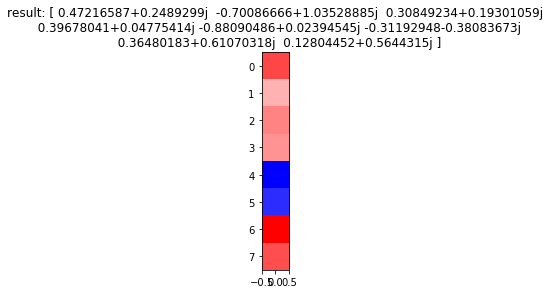

Generation: 35/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

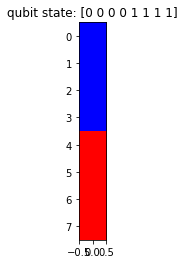

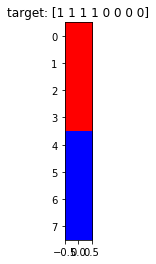

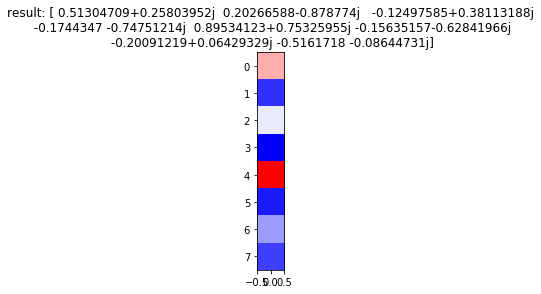

Generation: 35/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

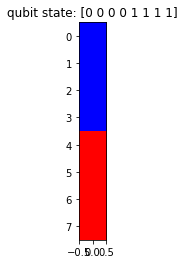

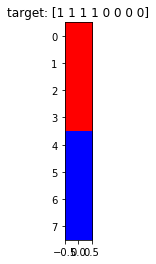

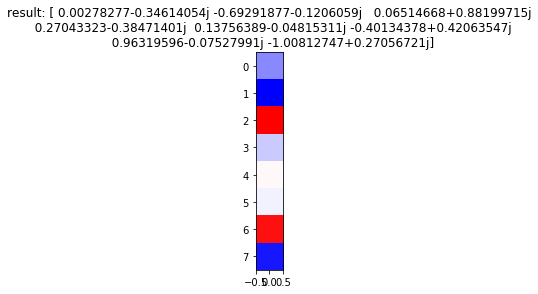

Generation: 35/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

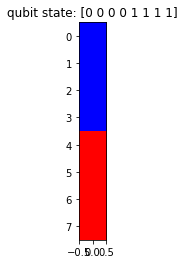

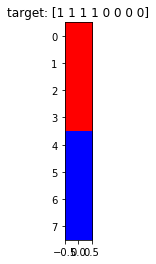

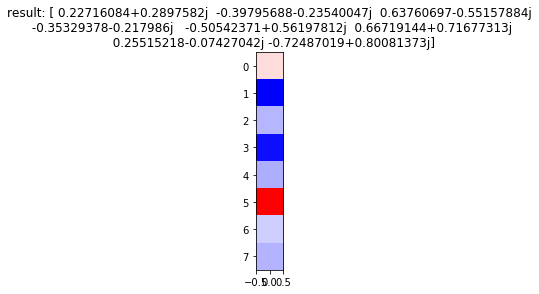

Generation: 35/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

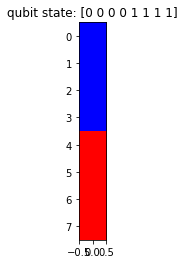

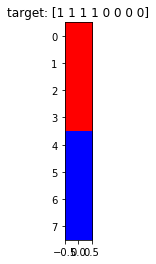

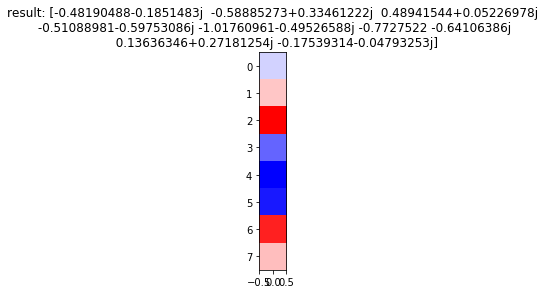

Generation: 35/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

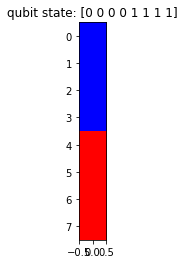

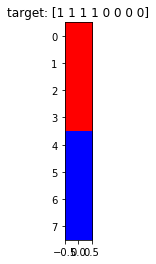

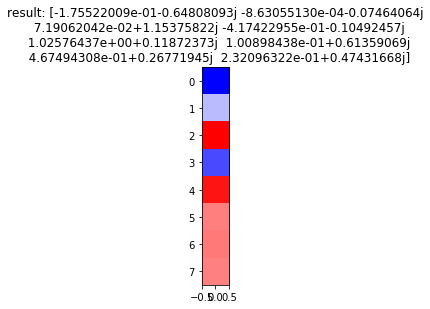

Generation: 36/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

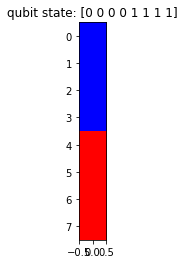

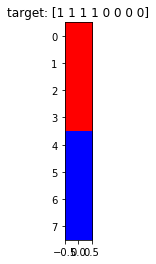

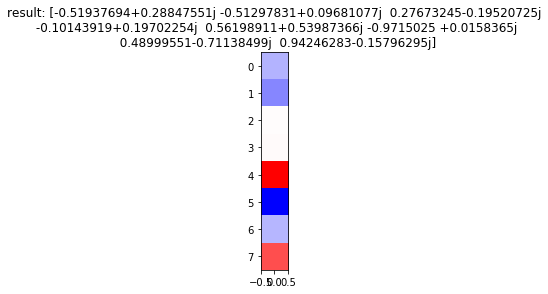

Generation: 36/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

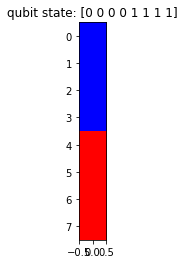

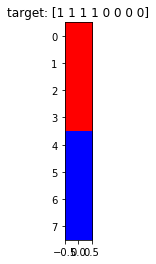

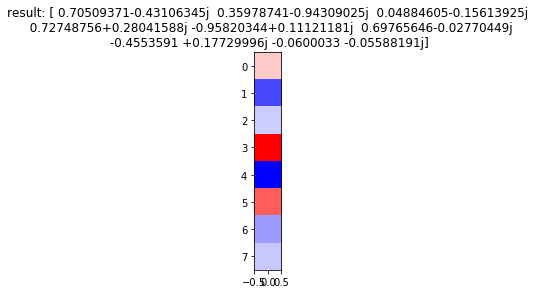

Generation: 36/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

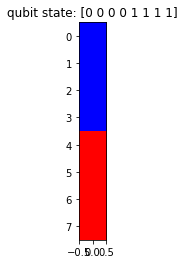

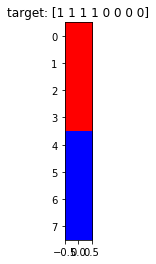

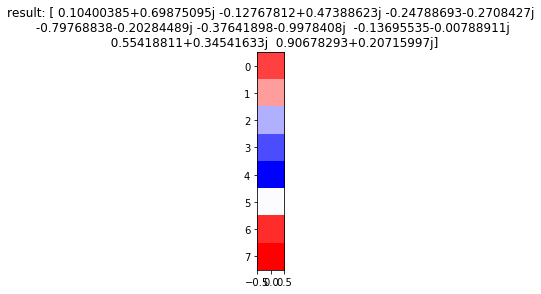

Generation: 36/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

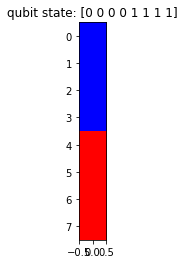

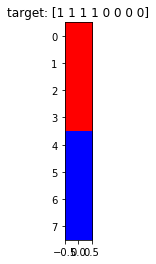

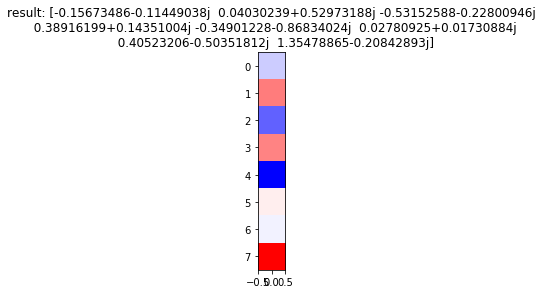

Generation: 36/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

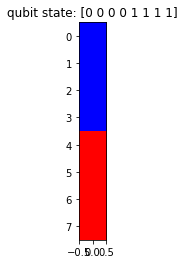

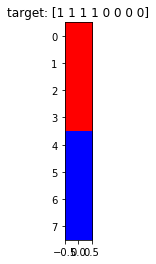

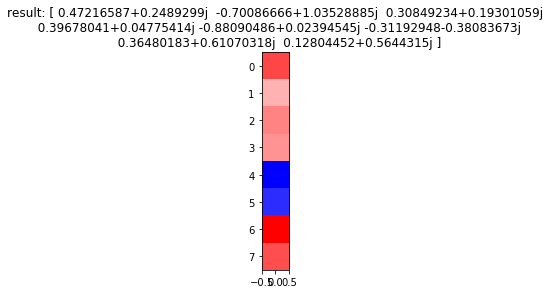

Generation: 36/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

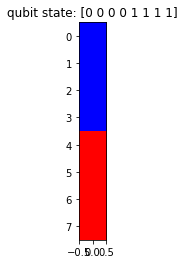

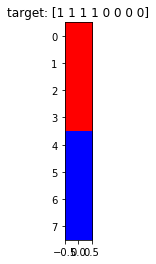

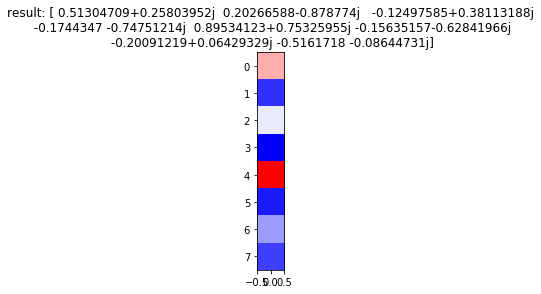

Generation: 36/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

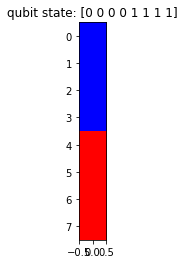

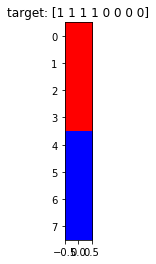

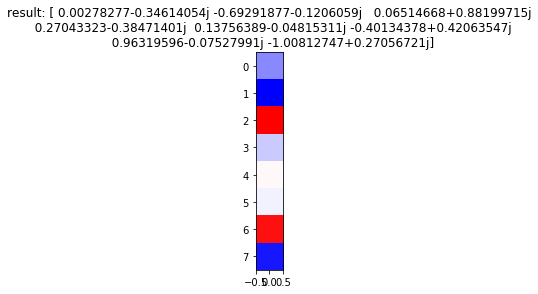

Generation: 36/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

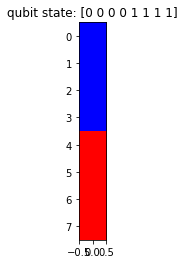

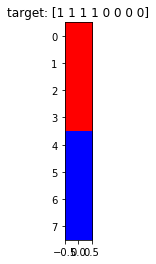

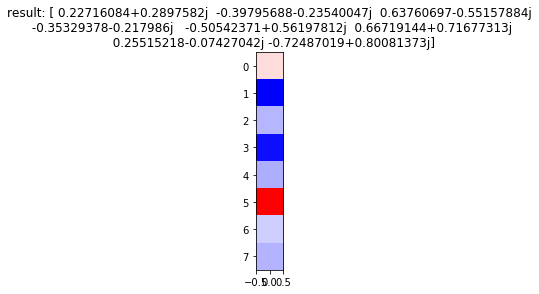

Generation: 36/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

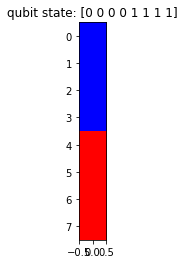

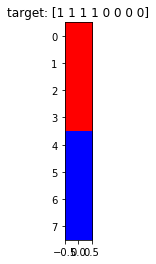

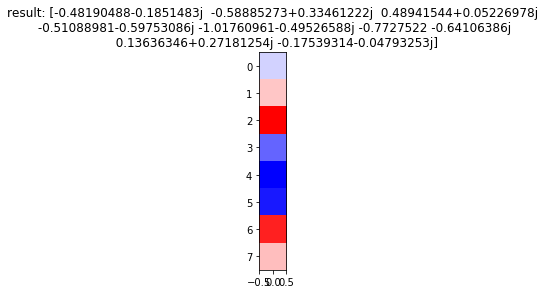

Generation: 36/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

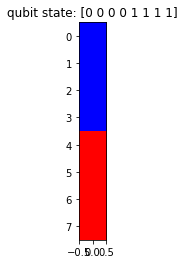

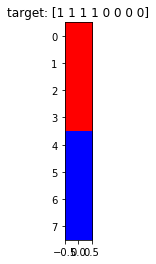

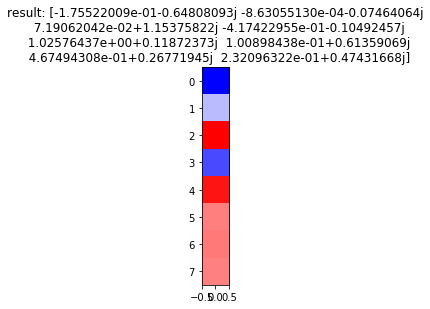

Generation: 37/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

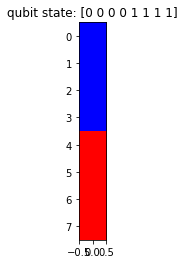

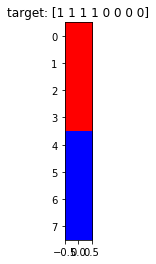

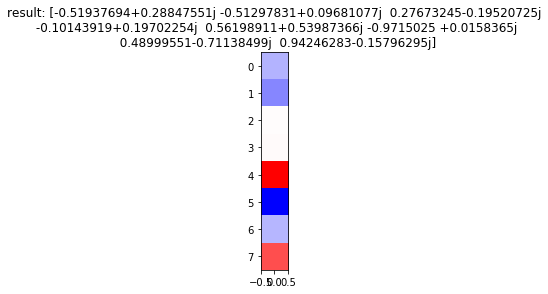

Generation: 37/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

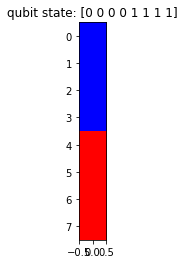

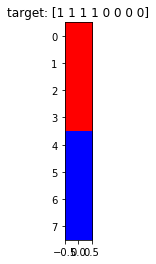

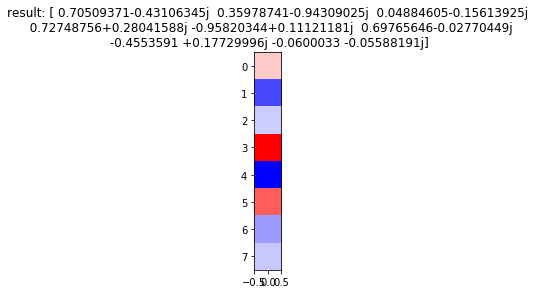

Generation: 37/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

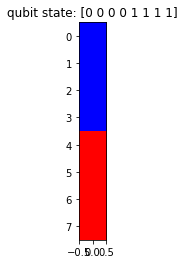

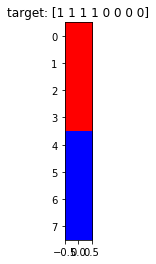

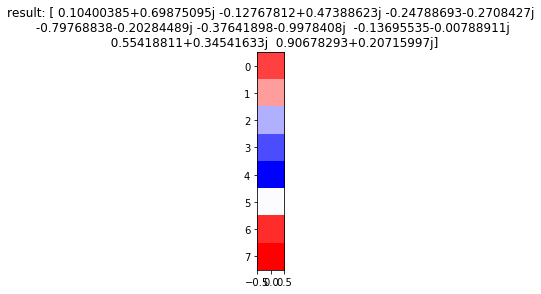

Generation: 37/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

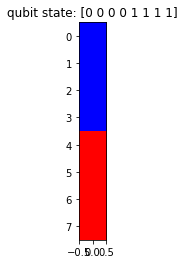

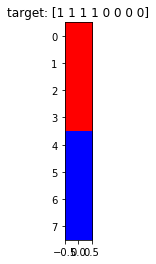

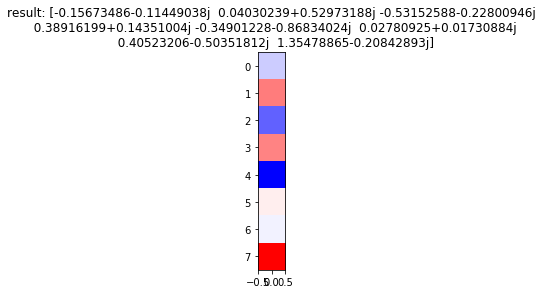

Generation: 37/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

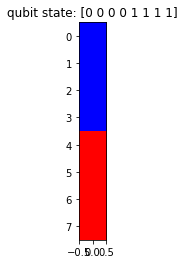

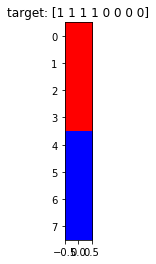

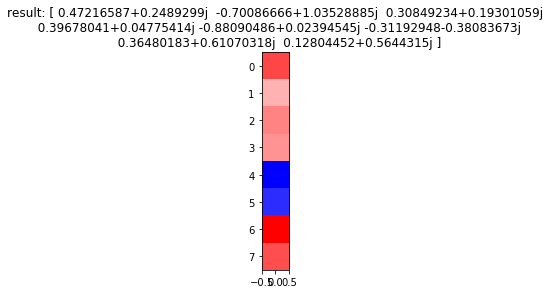

Generation: 37/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

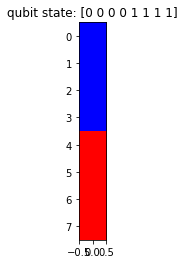

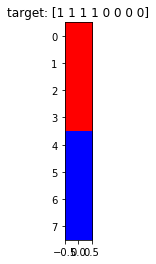

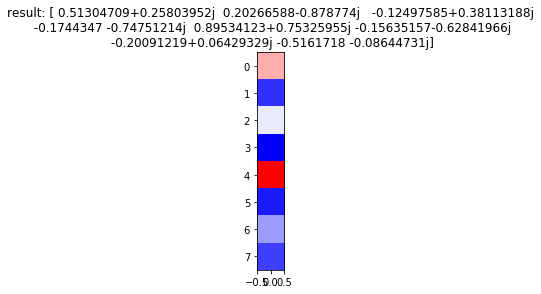

Generation: 37/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

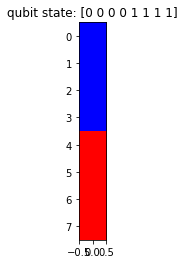

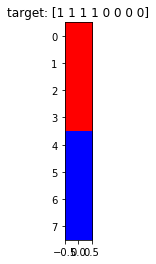

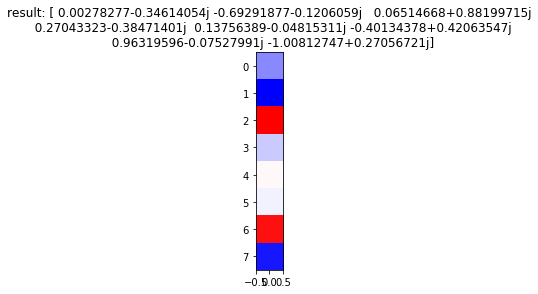

Generation: 37/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

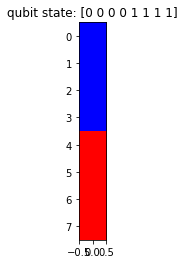

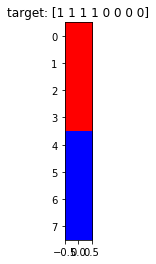

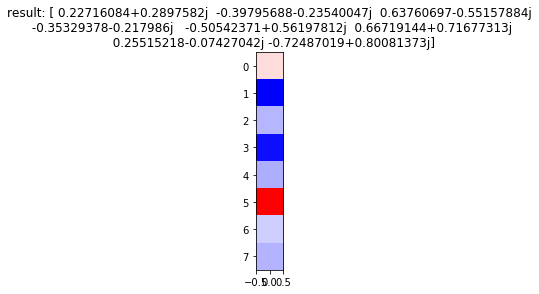

Generation: 37/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

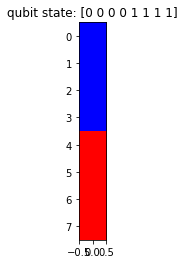

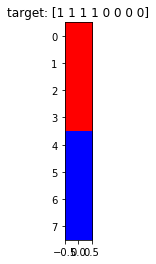

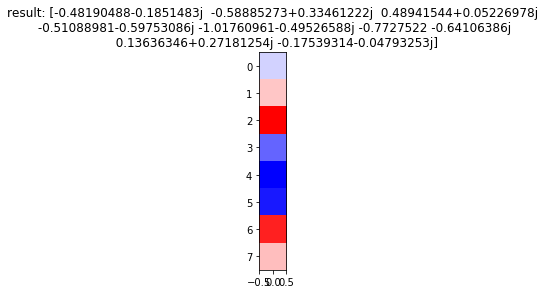

Generation: 37/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

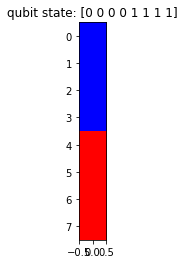

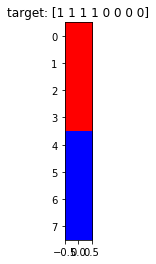

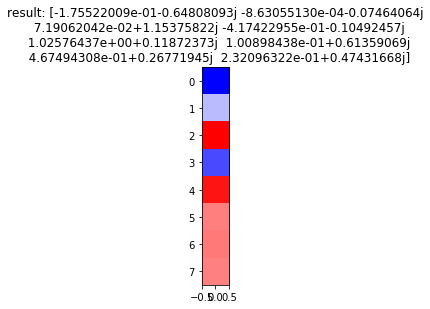

Generation: 38/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

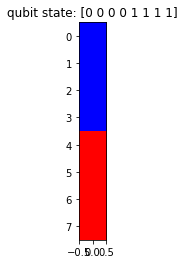

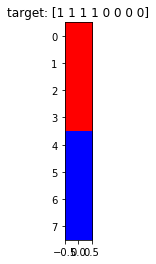

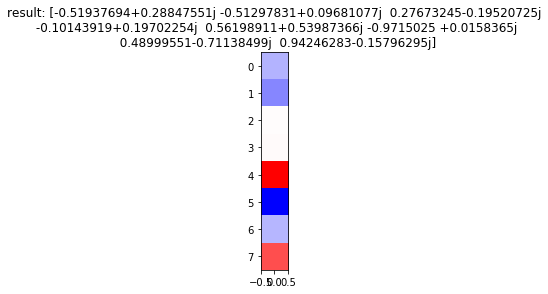

Generation: 38/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

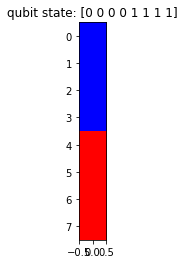

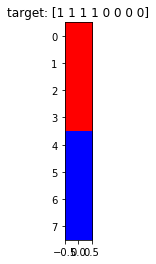

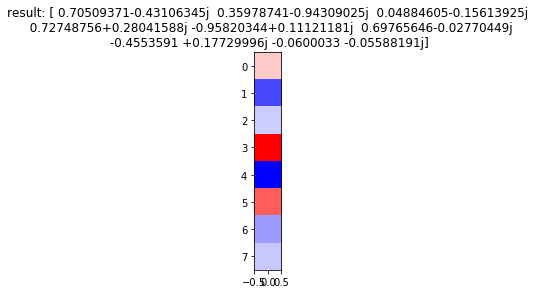

Generation: 38/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

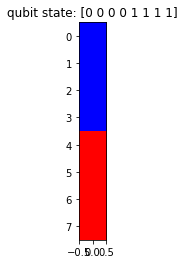

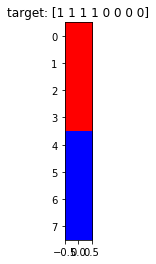

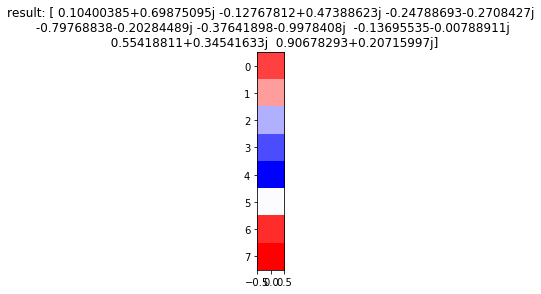

Generation: 38/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

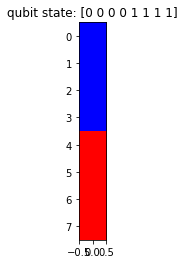

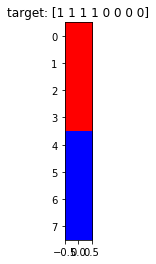

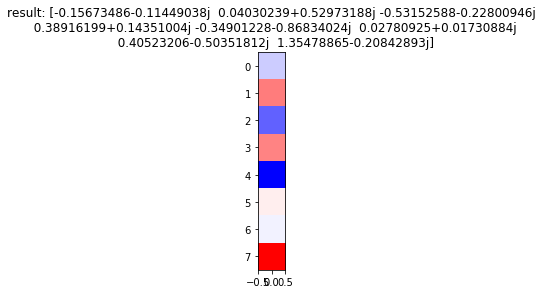

Generation: 38/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

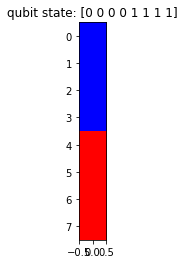

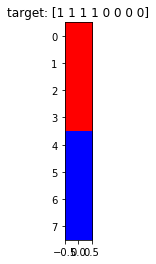

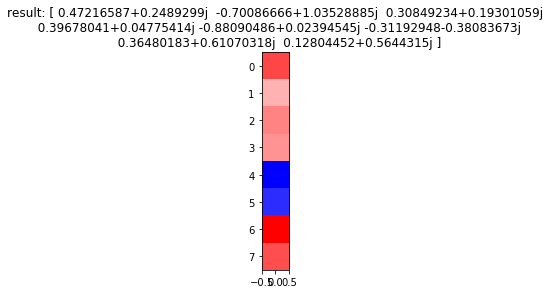

Generation: 38/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

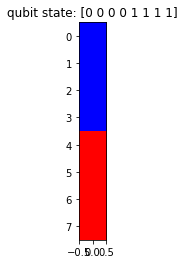

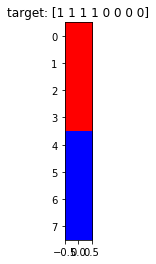

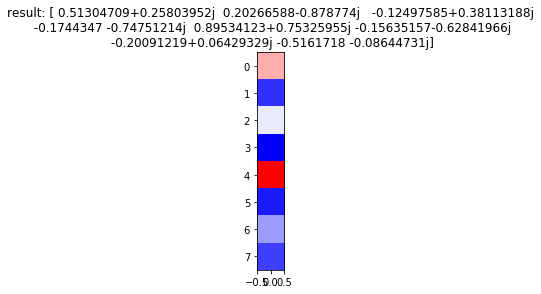

Generation: 38/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

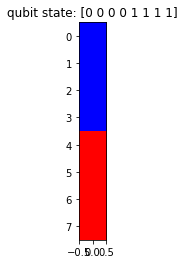

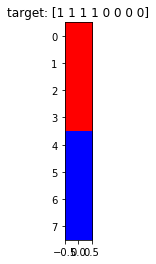

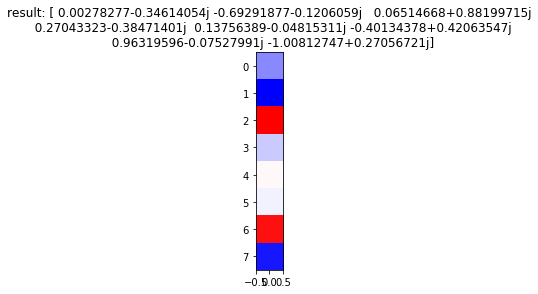

Generation: 38/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

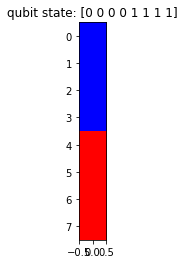

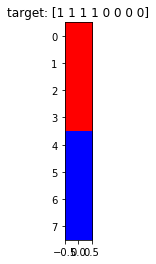

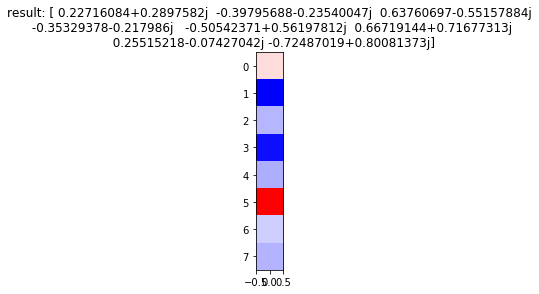

Generation: 38/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

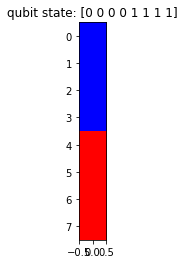

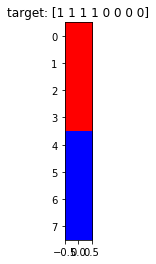

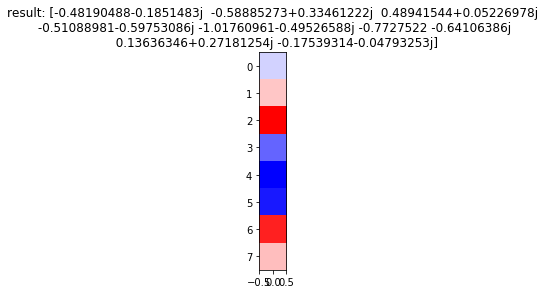

Generation: 38/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

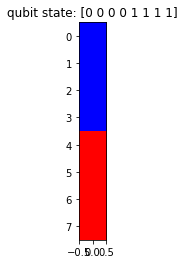

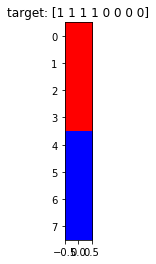

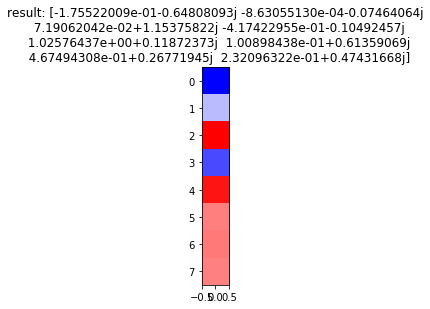

Generation: 39/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

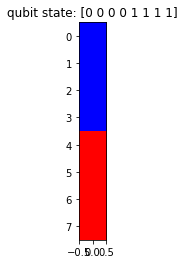

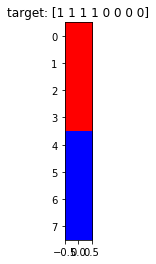

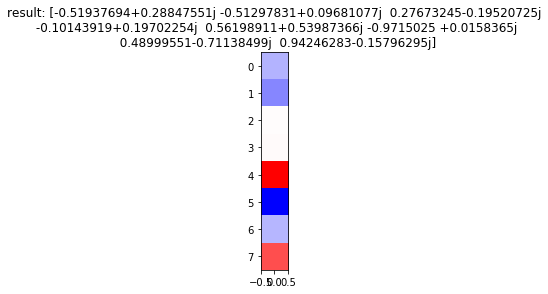

Generation: 39/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

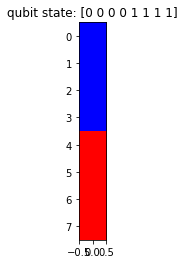

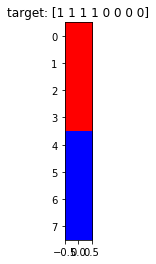

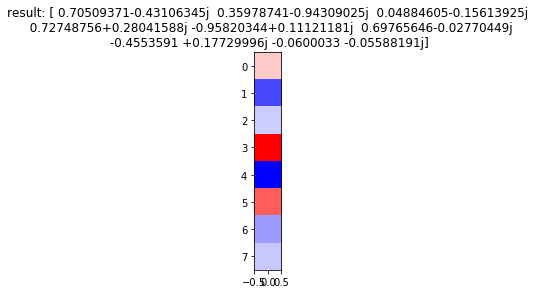

Generation: 39/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

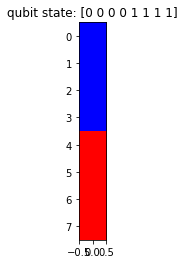

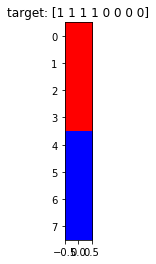

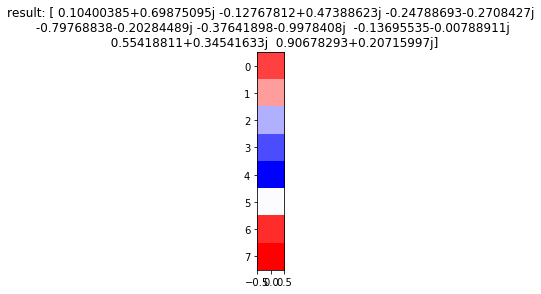

Generation: 39/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

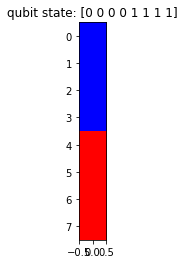

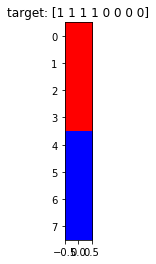

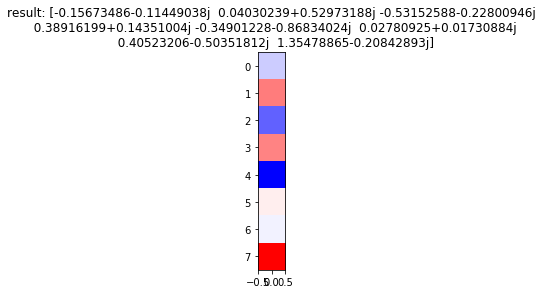

Generation: 39/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

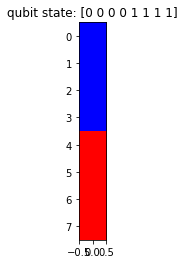

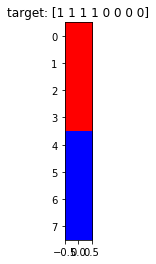

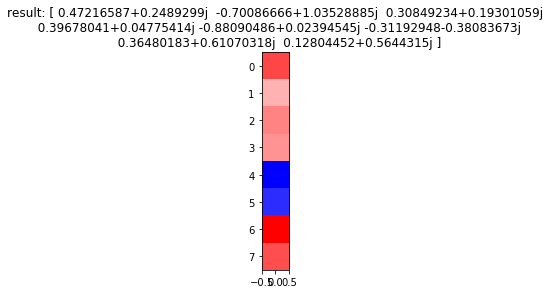

Generation: 39/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

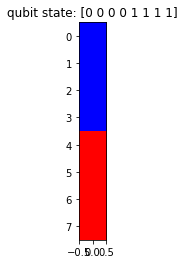

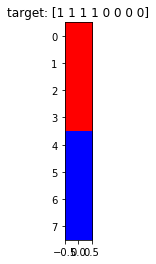

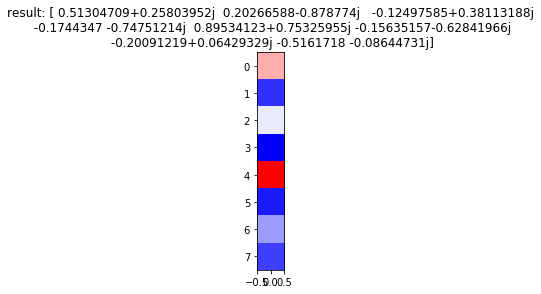

Generation: 39/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

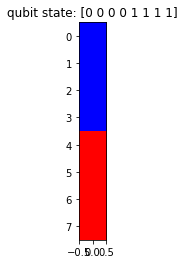

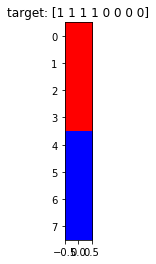

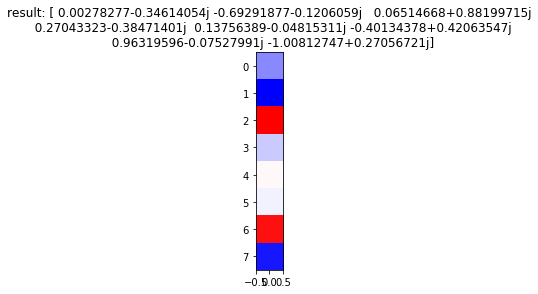

Generation: 39/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

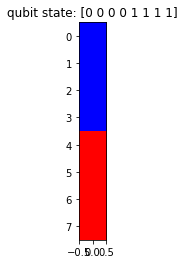

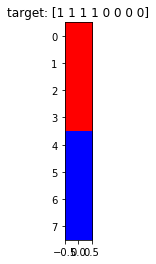

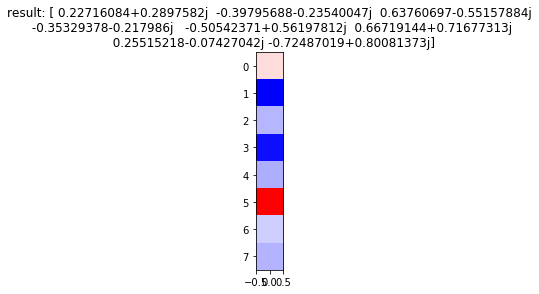

Generation: 39/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

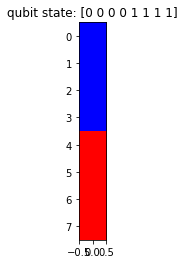

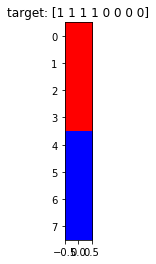

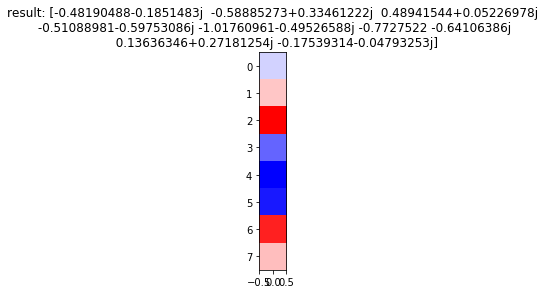

Generation: 39/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

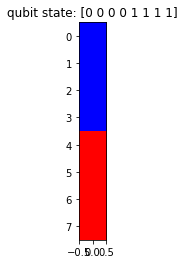

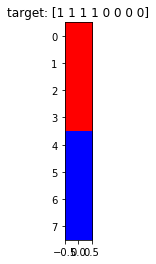

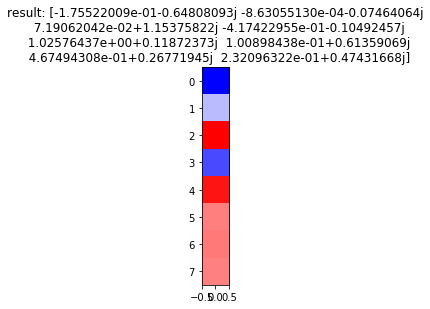

Generation: 40/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

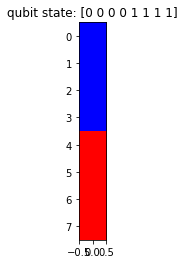

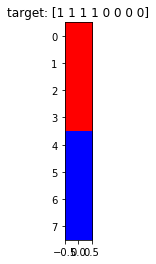

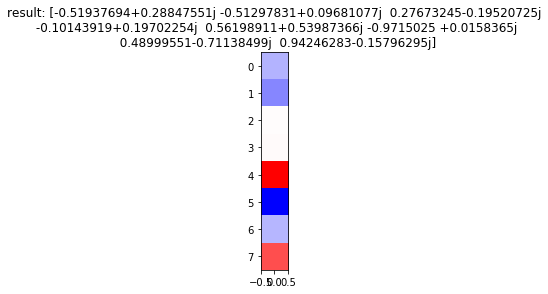

Generation: 40/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

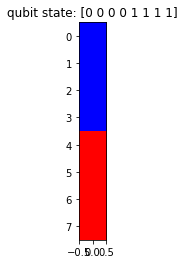

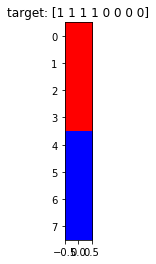

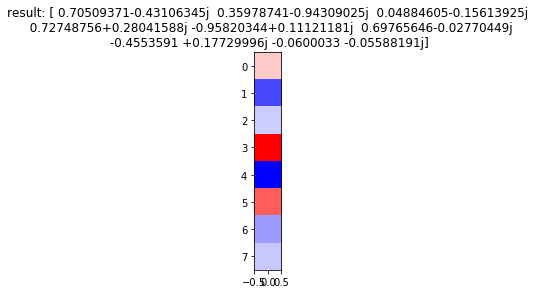

Generation: 40/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

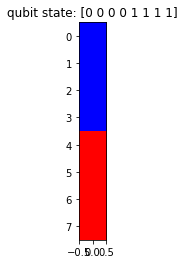

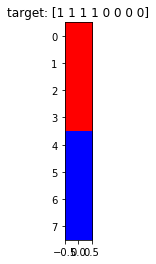

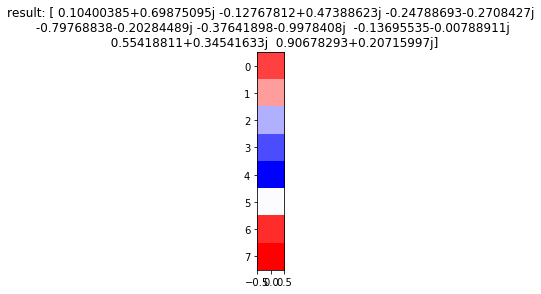

Generation: 40/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

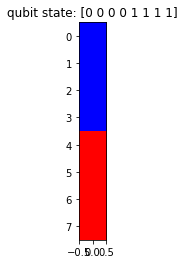

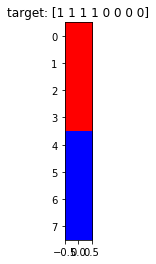

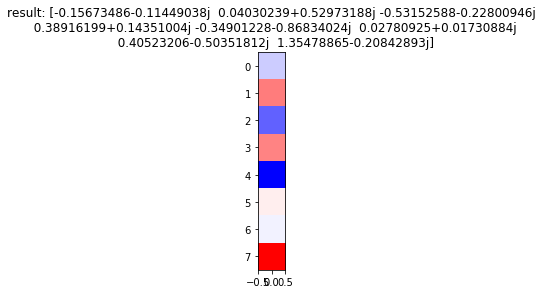

Generation: 40/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

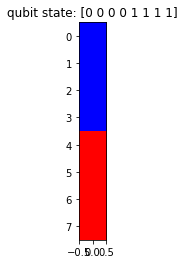

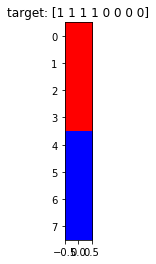

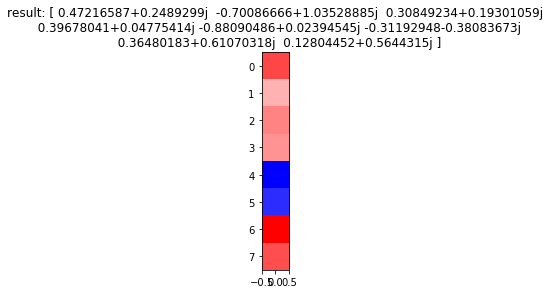

Generation: 40/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

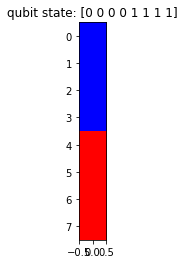

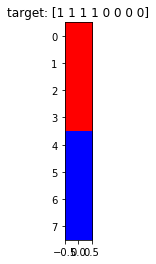

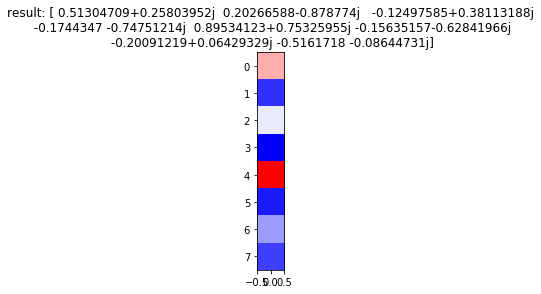

Generation: 40/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

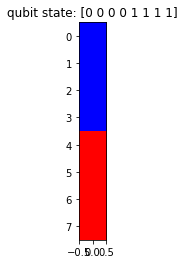

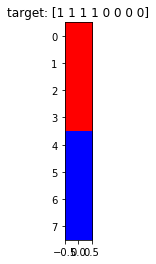

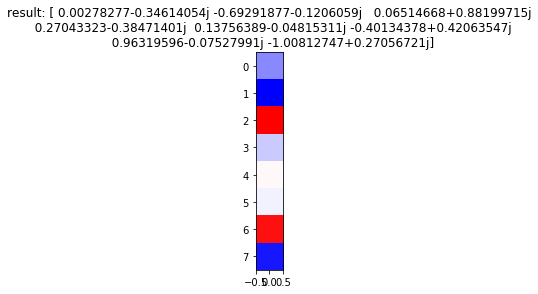

Generation: 40/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

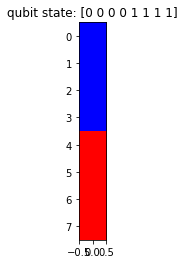

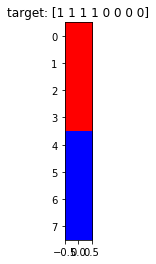

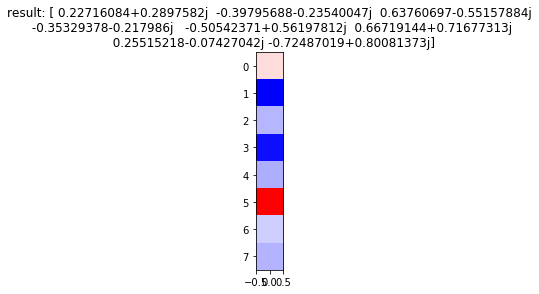

Generation: 40/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

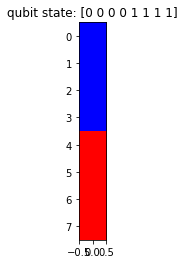

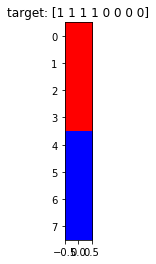

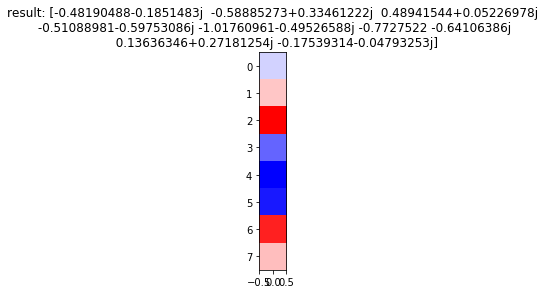

Generation: 40/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

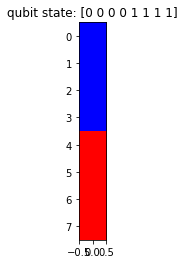

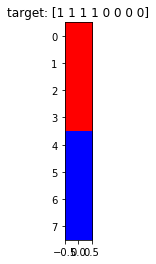

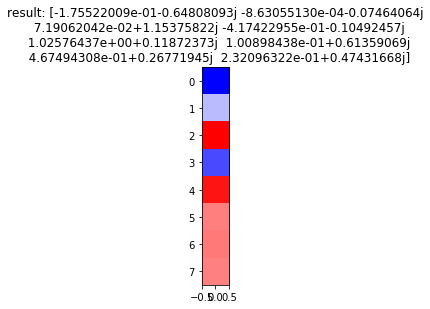

Generation: 41/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

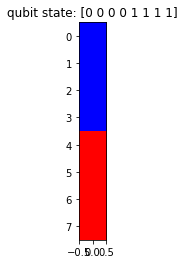

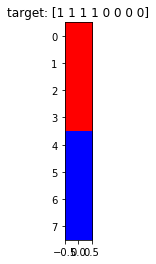

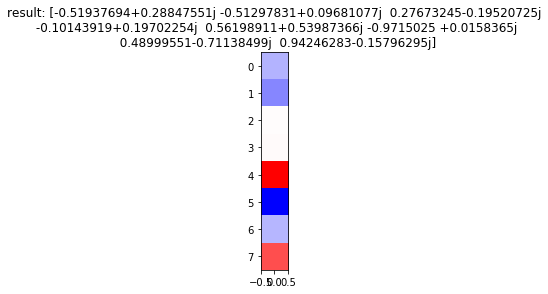

Generation: 41/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

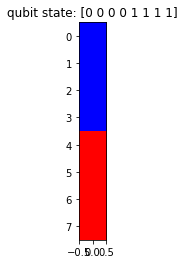

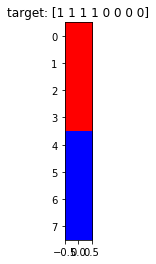

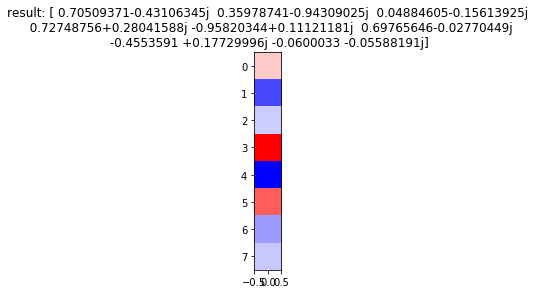

Generation: 41/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

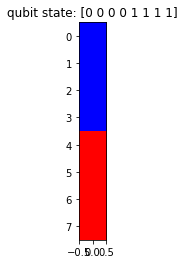

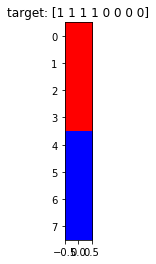

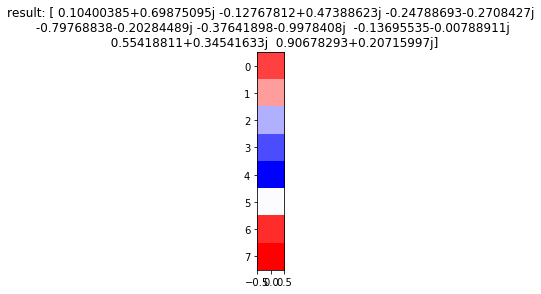

Generation: 41/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

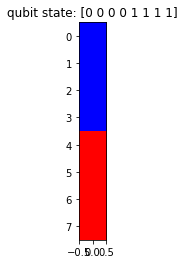

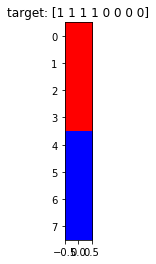

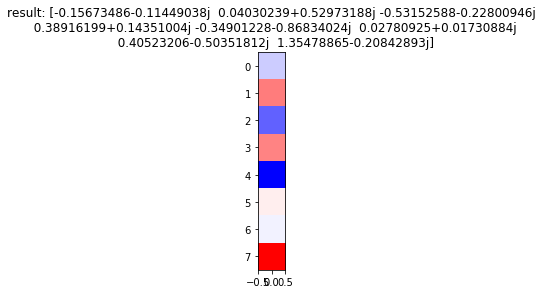

Generation: 41/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

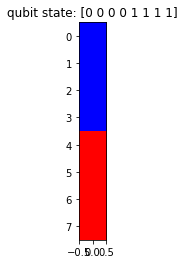

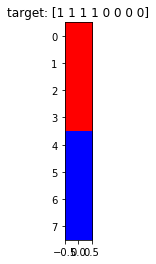

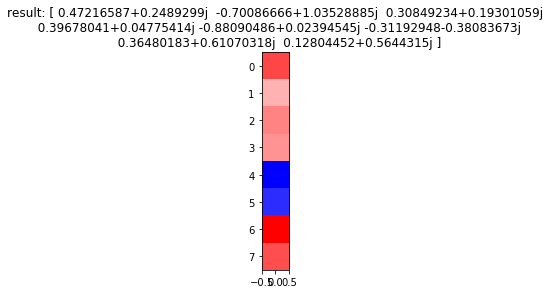

Generation: 41/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

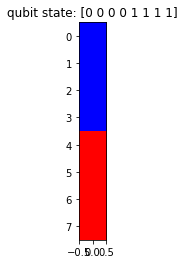

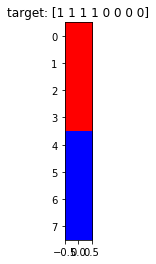

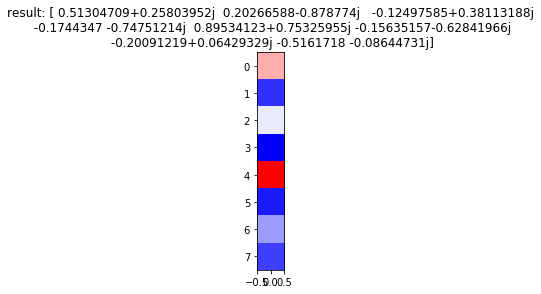

Generation: 41/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

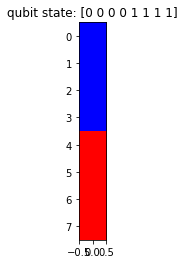

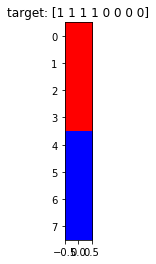

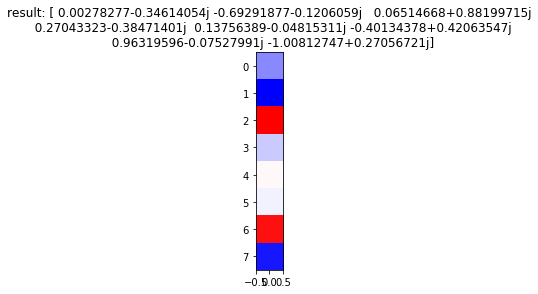

Generation: 41/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

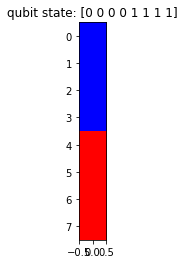

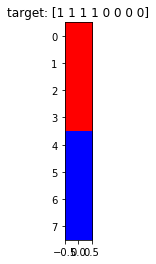

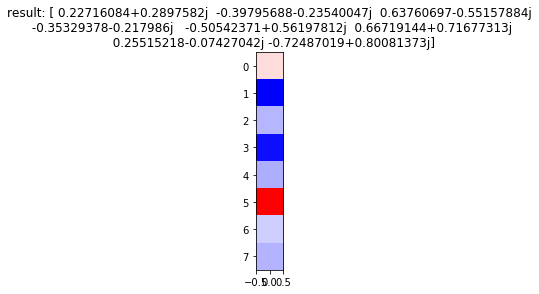

Generation: 41/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

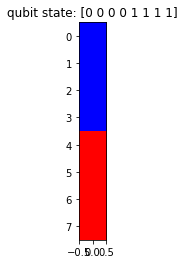

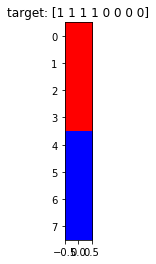

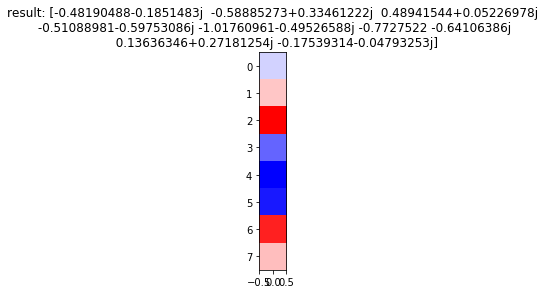

Generation: 41/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

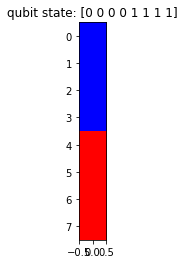

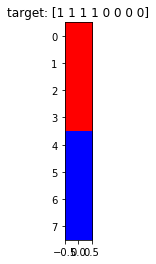

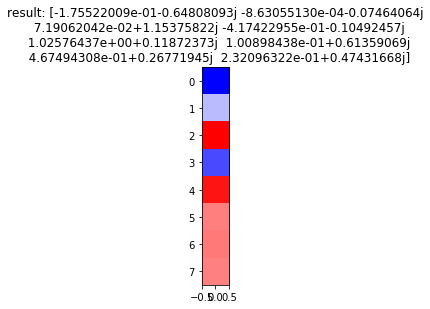

Generation: 42/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

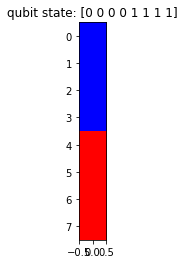

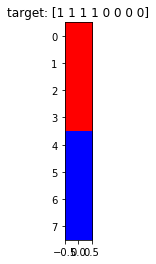

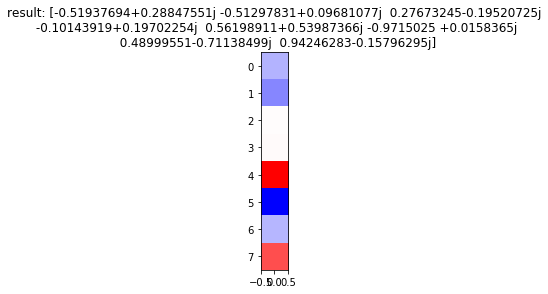

Generation: 42/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

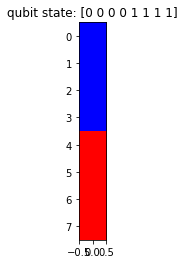

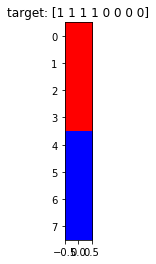

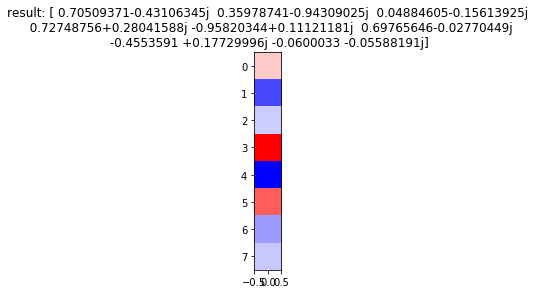

Generation: 42/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

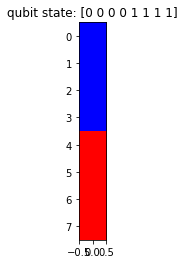

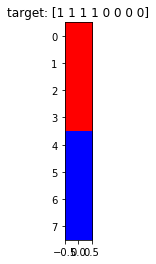

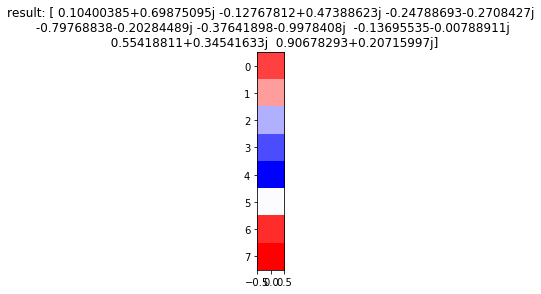

Generation: 42/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

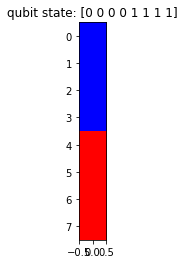

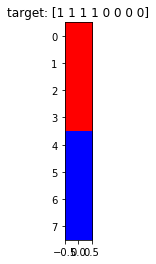

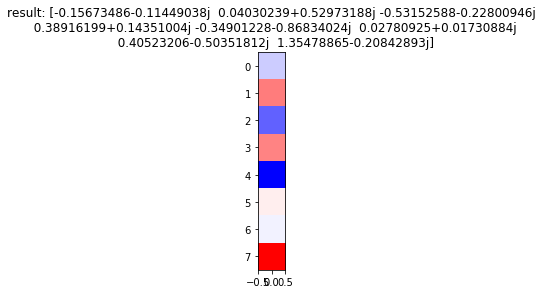

Generation: 42/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

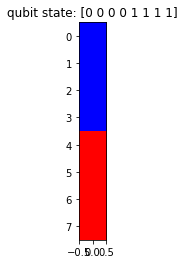

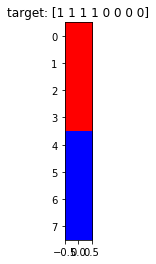

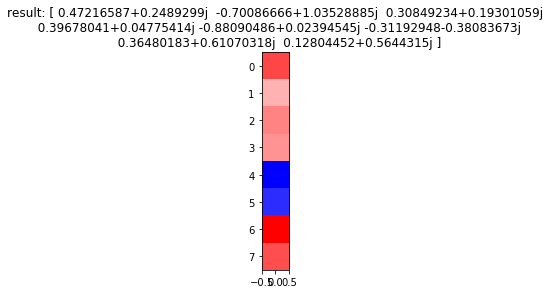

Generation: 42/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

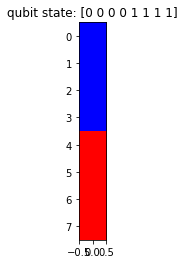

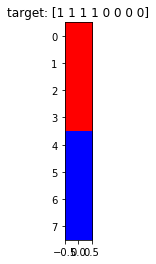

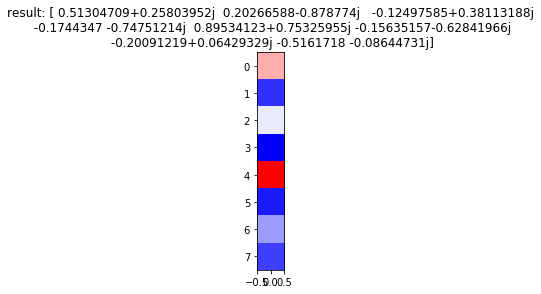

Generation: 42/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

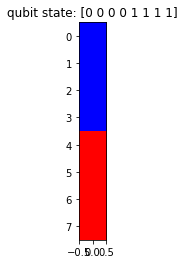

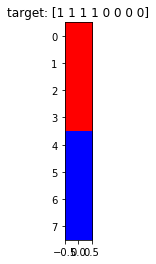

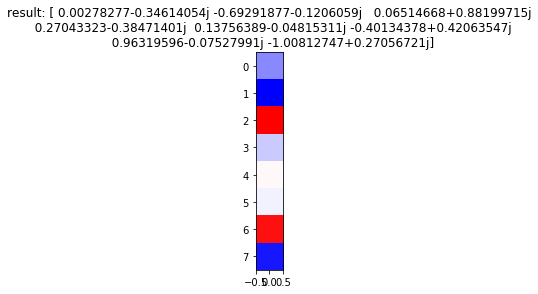

Generation: 42/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

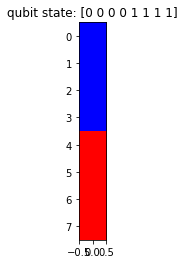

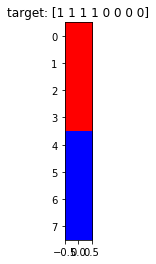

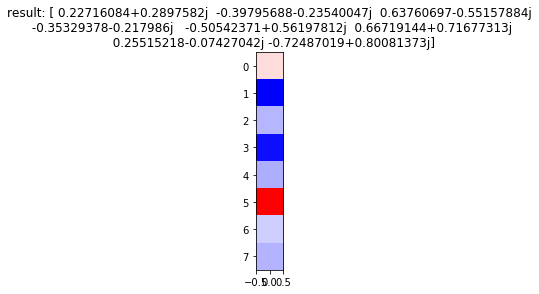

Generation: 42/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

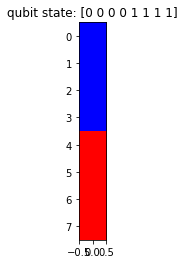

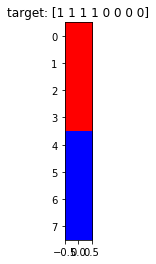

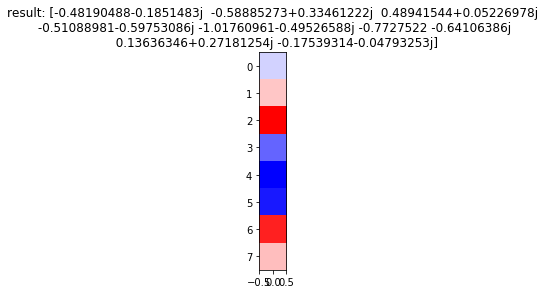

Generation: 42/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

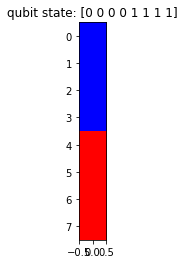

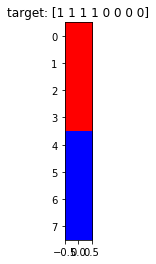

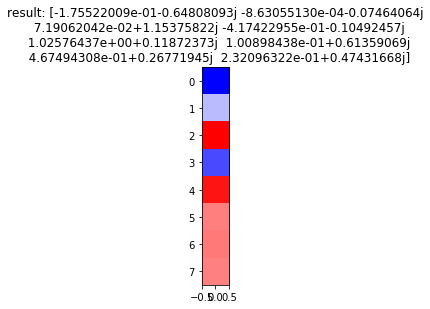

Generation: 43/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

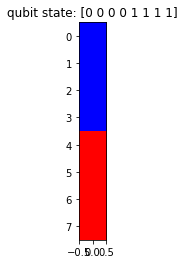

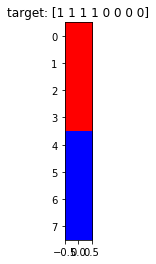

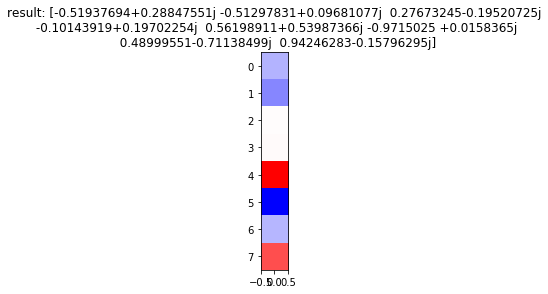

Generation: 43/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

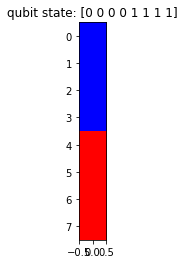

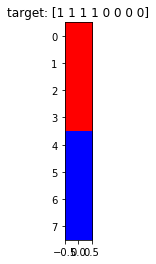

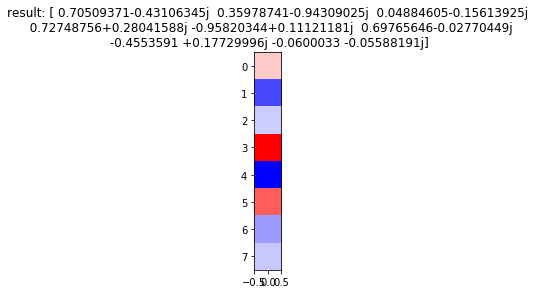

Generation: 43/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

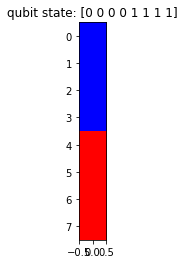

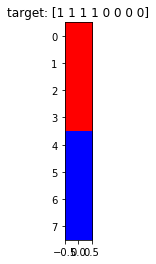

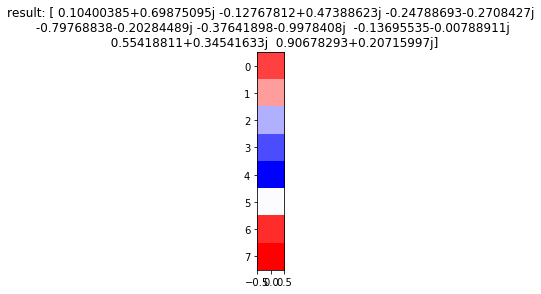

Generation: 43/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

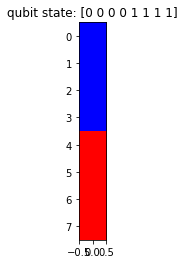

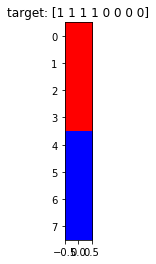

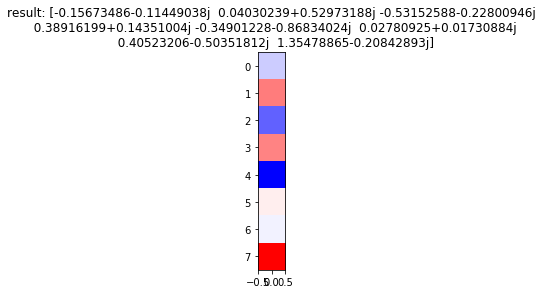

Generation: 43/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

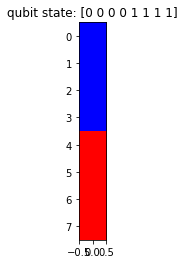

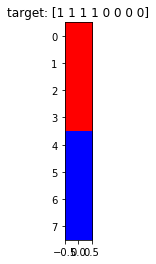

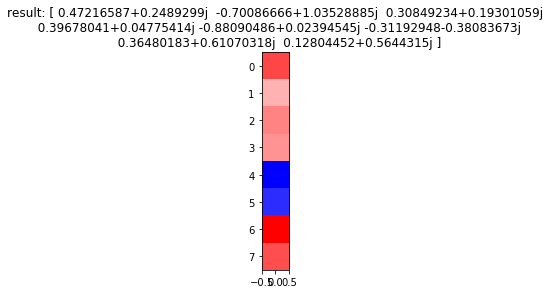

Generation: 43/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

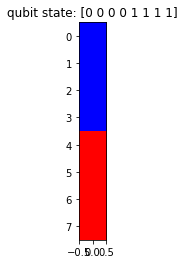

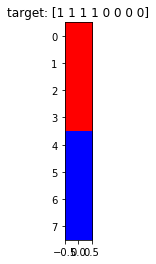

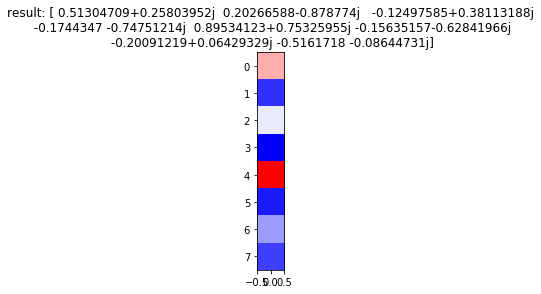

Generation: 43/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

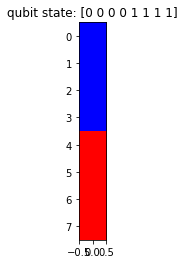

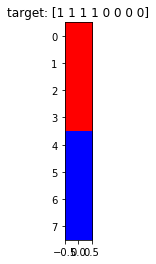

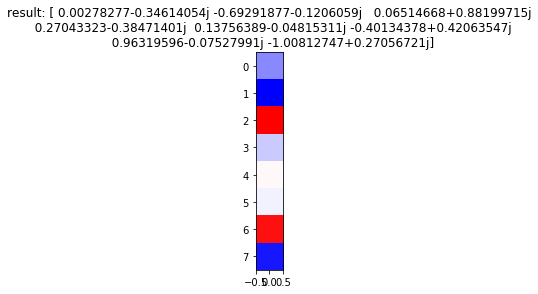

Generation: 43/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

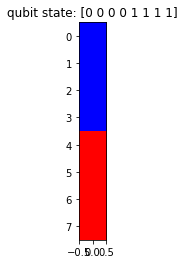

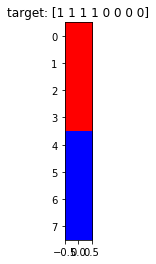

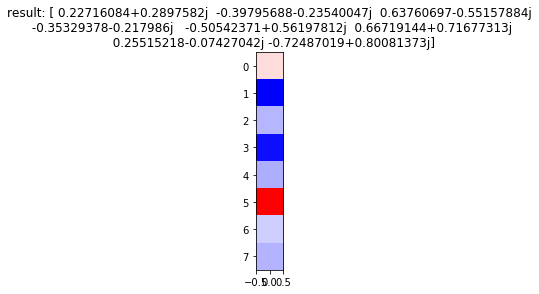

Generation: 43/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

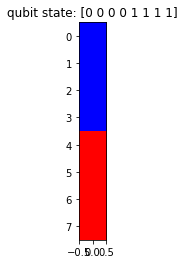

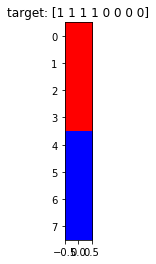

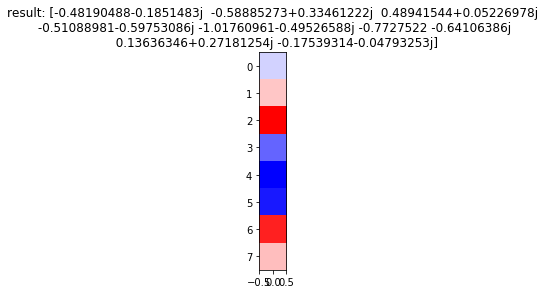

Generation: 43/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

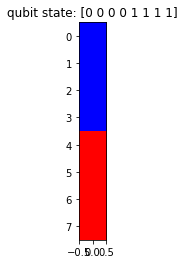

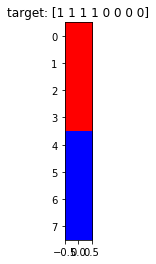

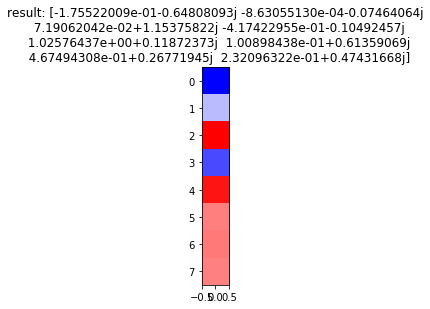

Generation: 44/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

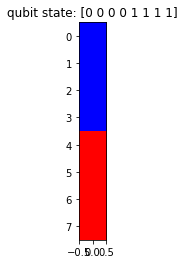

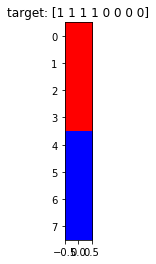

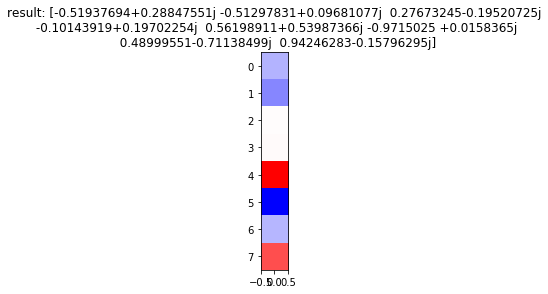

Generation: 44/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

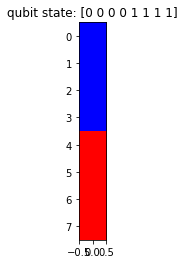

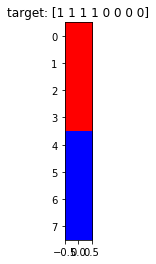

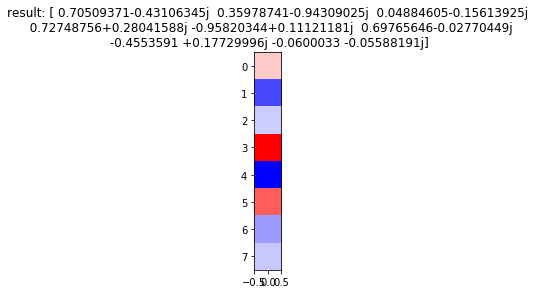

Generation: 44/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

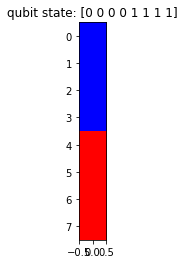

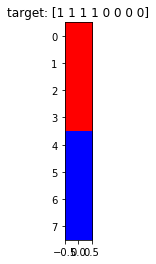

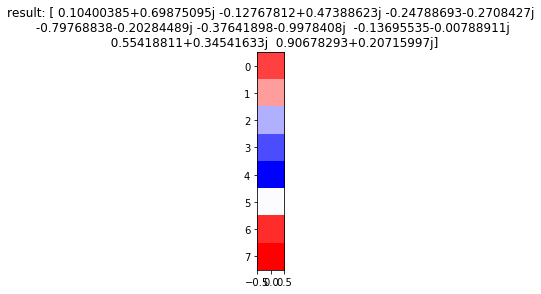

Generation: 44/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

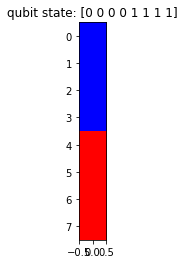

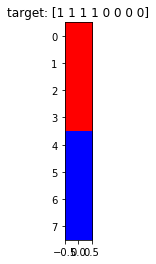

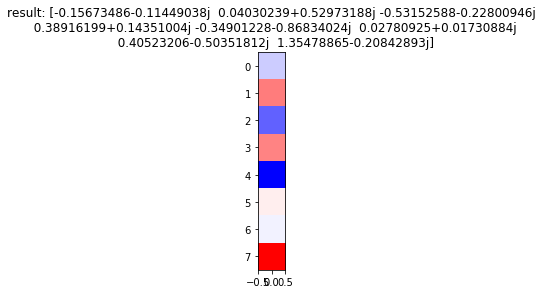

Generation: 44/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

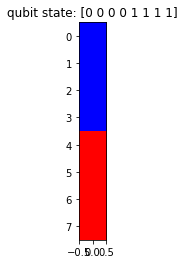

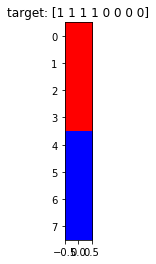

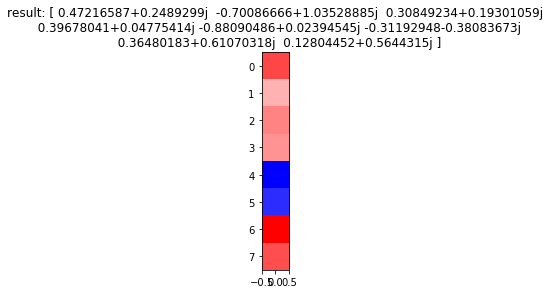

Generation: 44/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

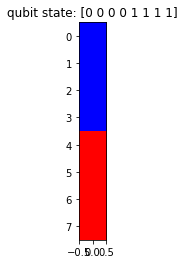

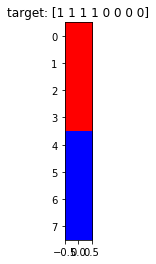

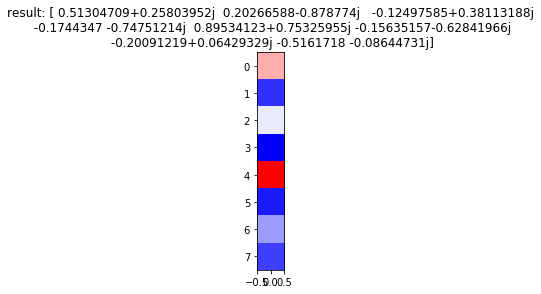

Generation: 44/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

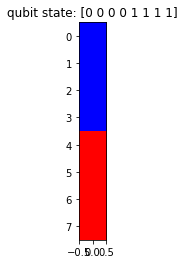

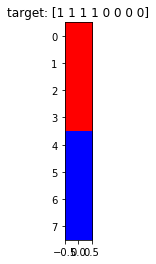

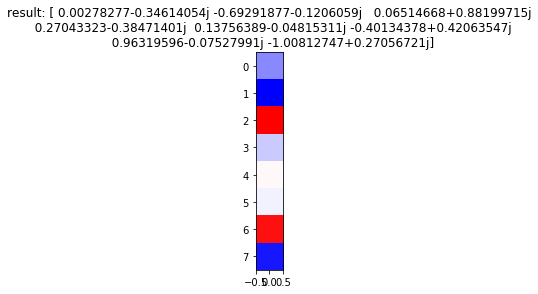

Generation: 44/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

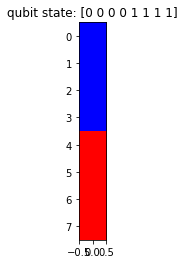

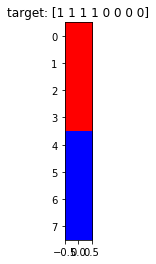

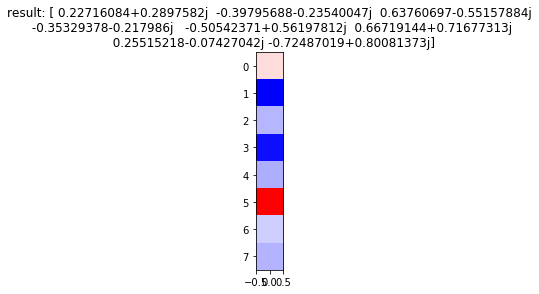

Generation: 44/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

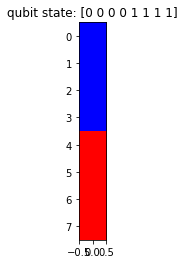

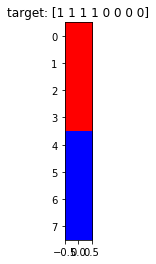

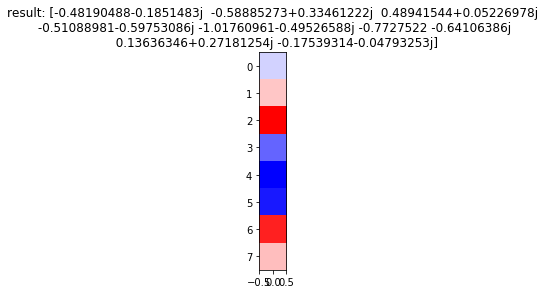

Generation: 44/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

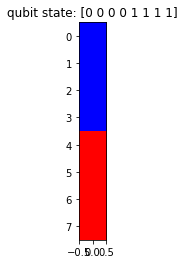

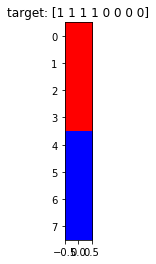

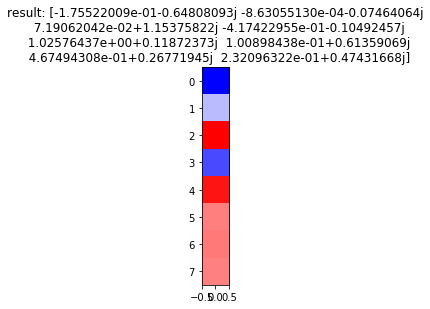

Generation: 45/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

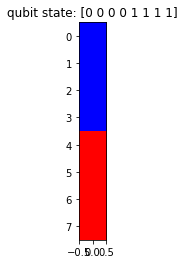

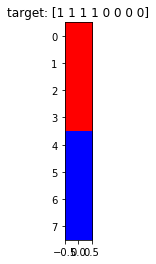

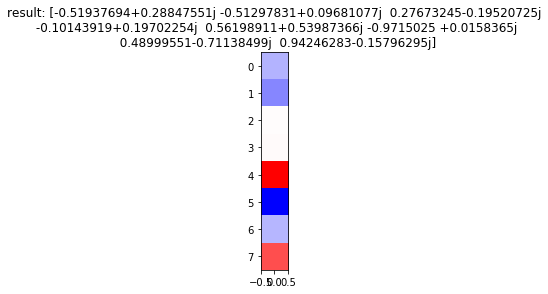

Generation: 45/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

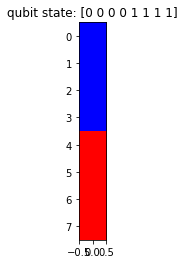

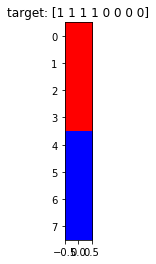

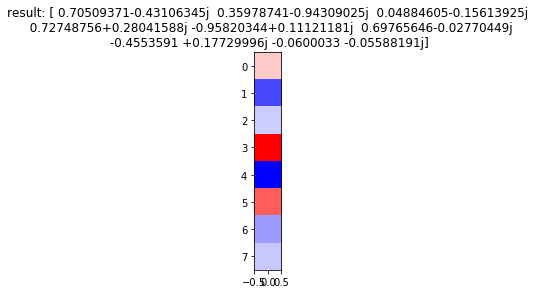

Generation: 45/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

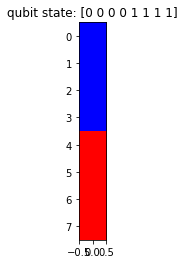

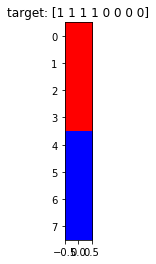

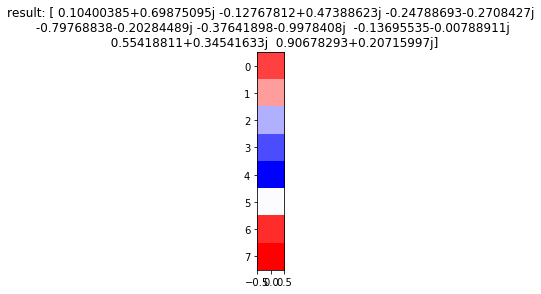

Generation: 45/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

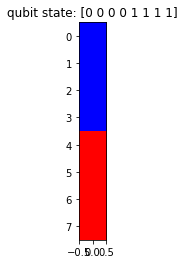

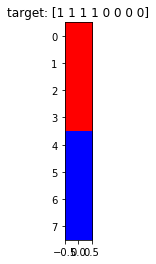

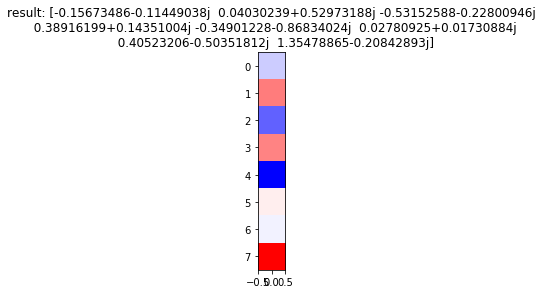

Generation: 45/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

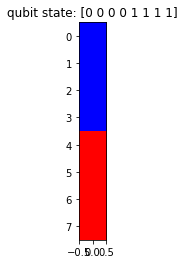

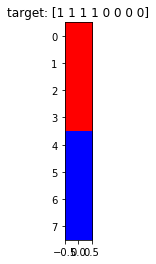

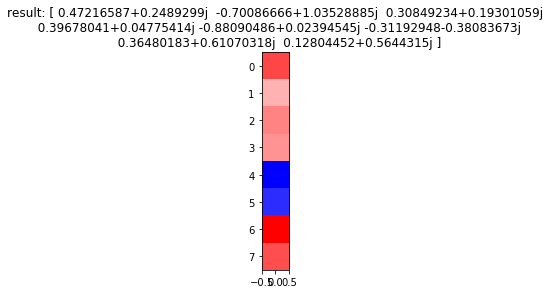

Generation: 45/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

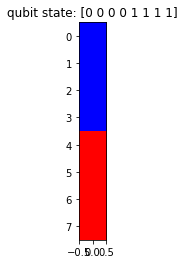

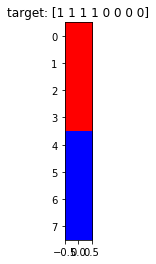

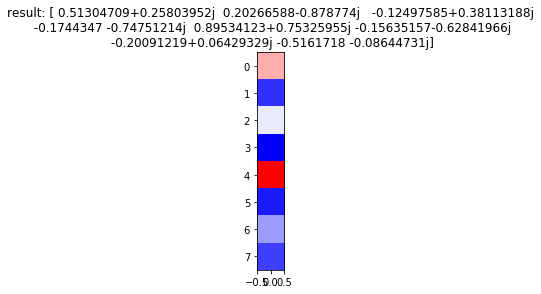

Generation: 45/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

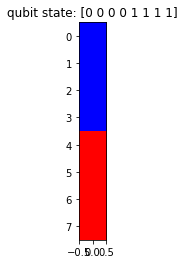

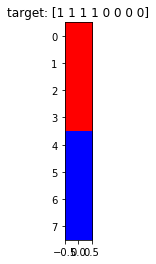

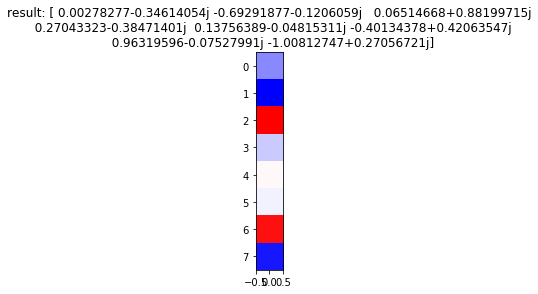

Generation: 45/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

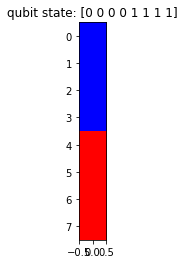

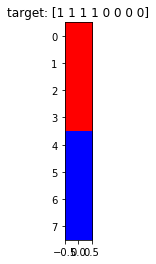

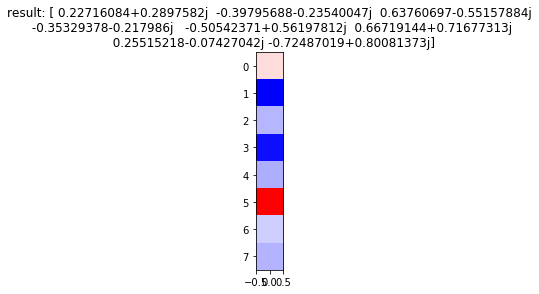

Generation: 45/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

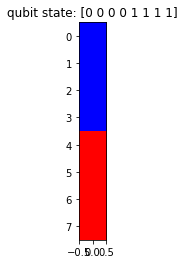

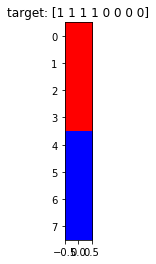

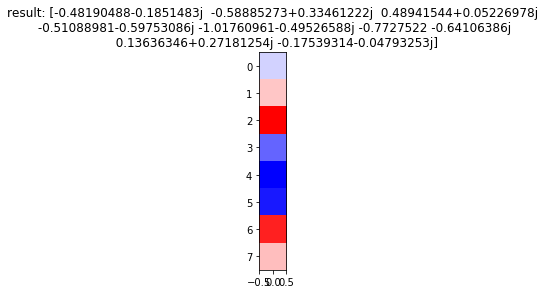

Generation: 45/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

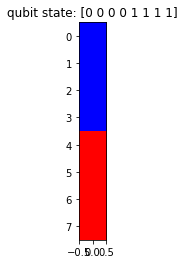

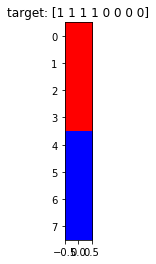

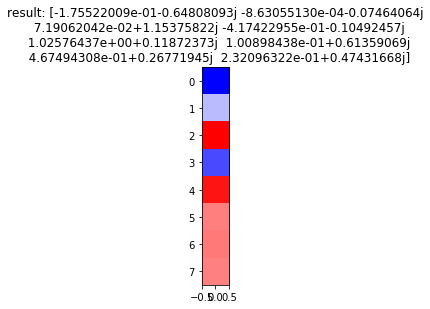

Generation: 46/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

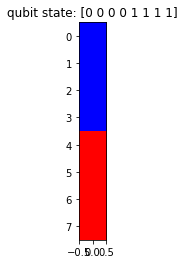

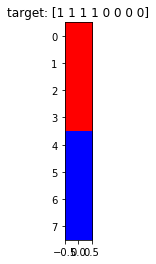

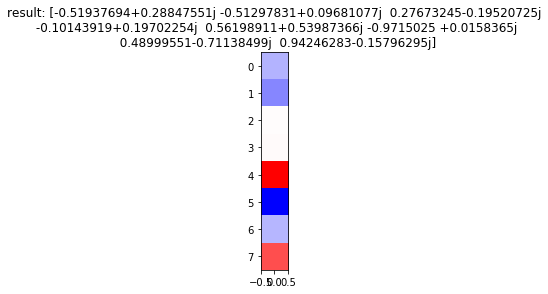

Generation: 46/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

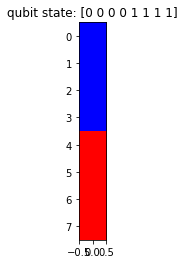

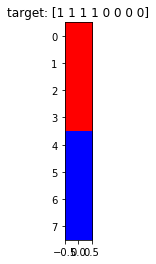

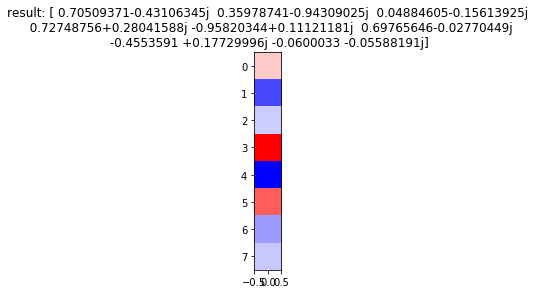

Generation: 46/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

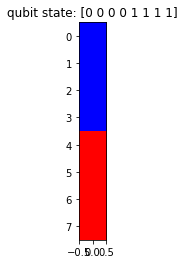

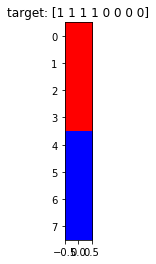

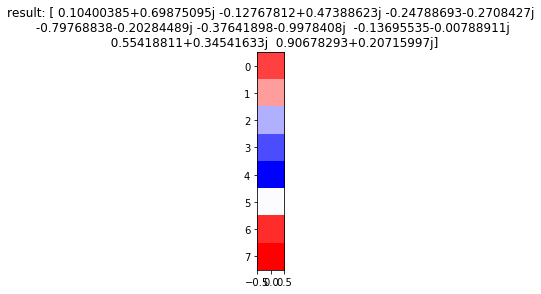

Generation: 46/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

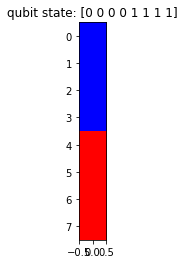

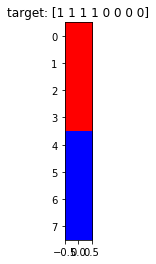

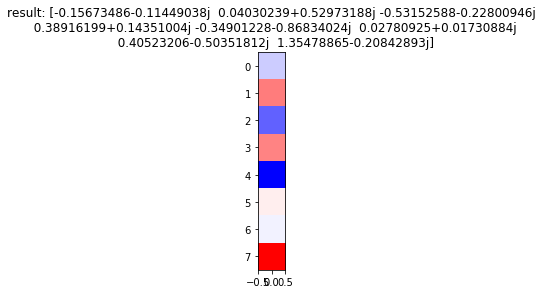

Generation: 46/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

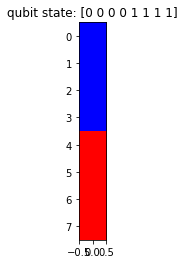

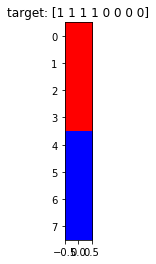

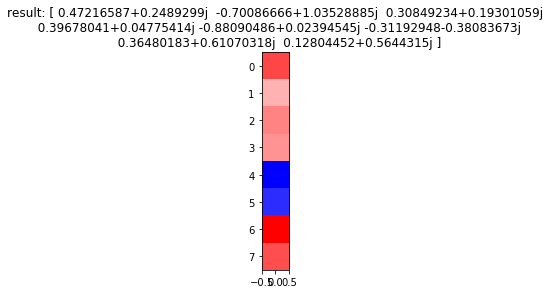

Generation: 46/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

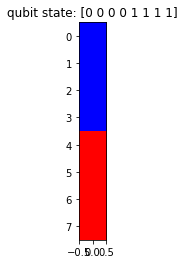

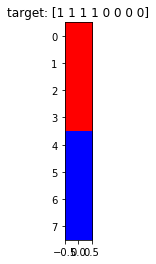

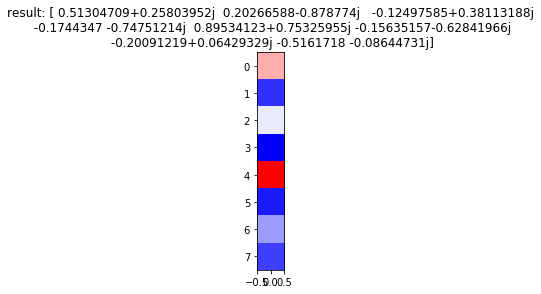

Generation: 46/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

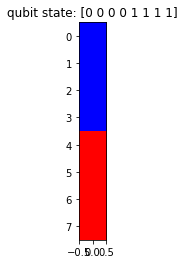

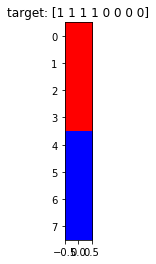

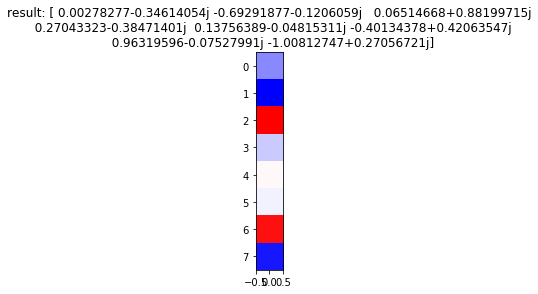

Generation: 46/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

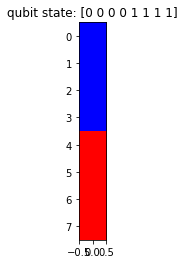

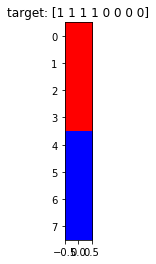

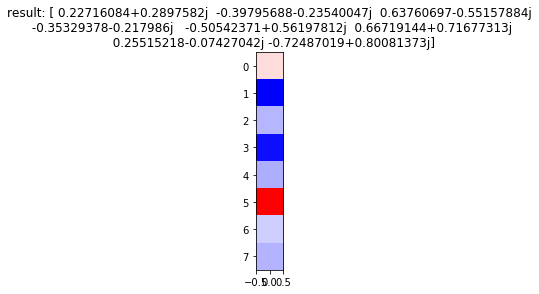

Generation: 46/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

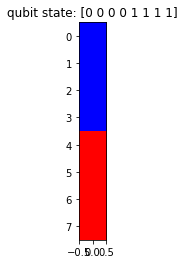

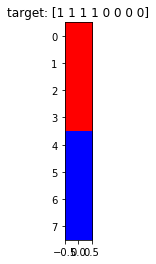

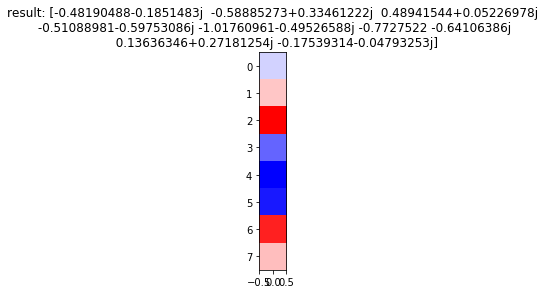

Generation: 46/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

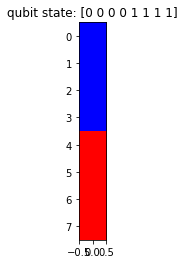

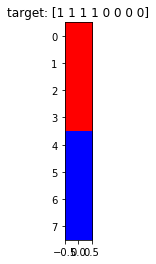

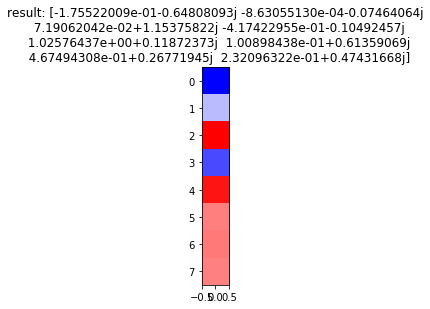

Generation: 47/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

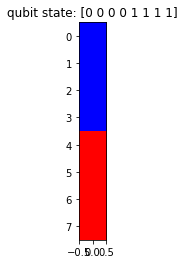

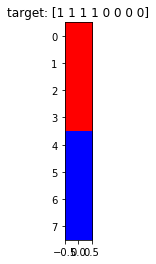

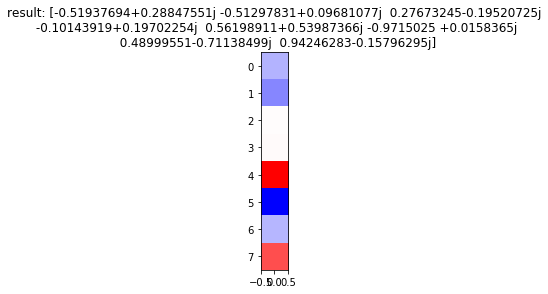

Generation: 47/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

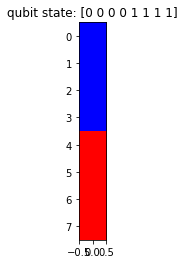

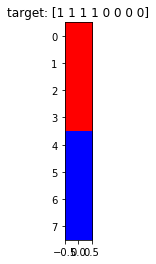

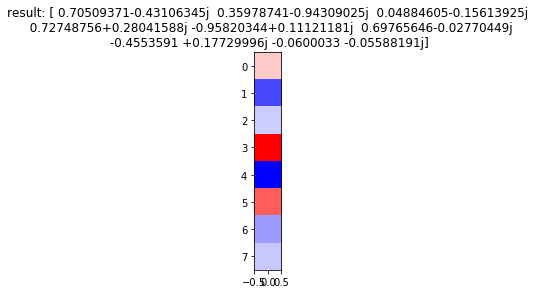

Generation: 47/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

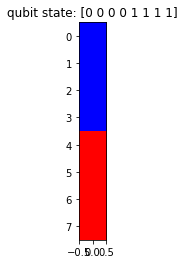

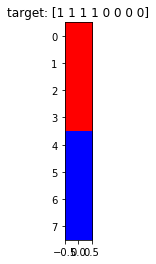

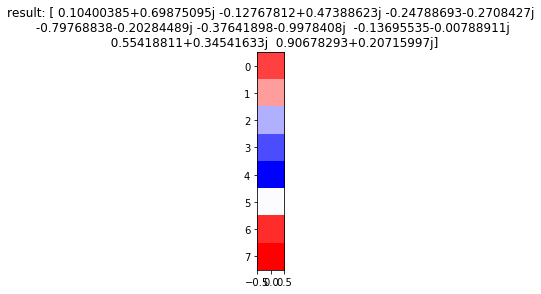

Generation: 47/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

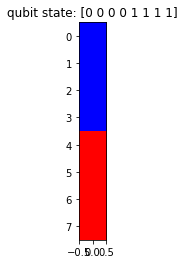

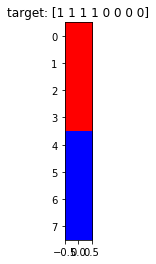

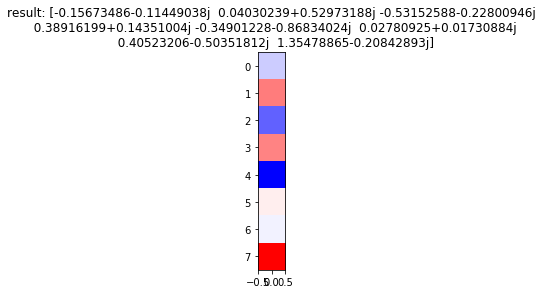

Generation: 47/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

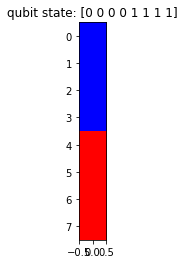

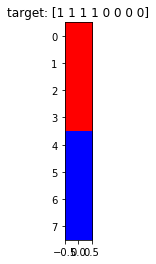

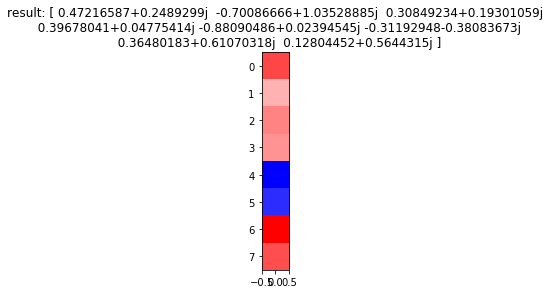

Generation: 47/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

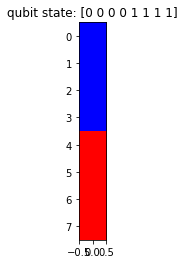

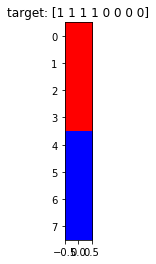

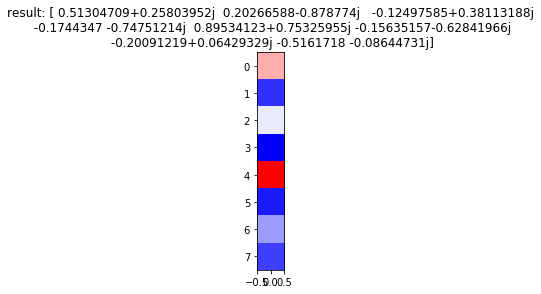

Generation: 47/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

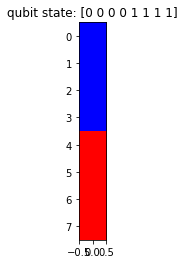

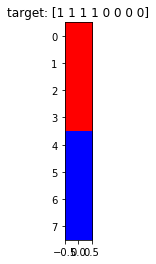

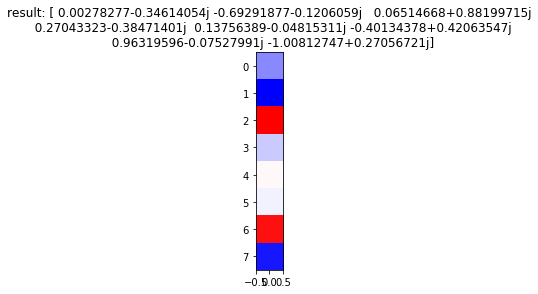

Generation: 47/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

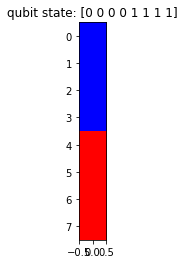

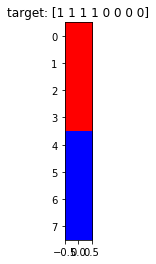

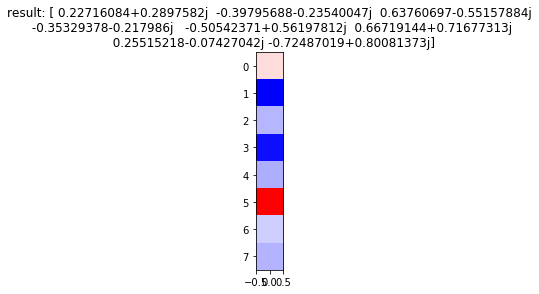

Generation: 47/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

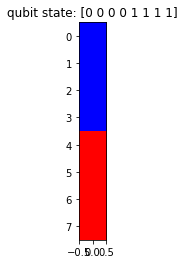

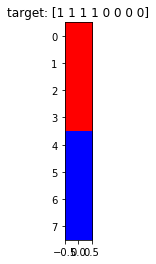

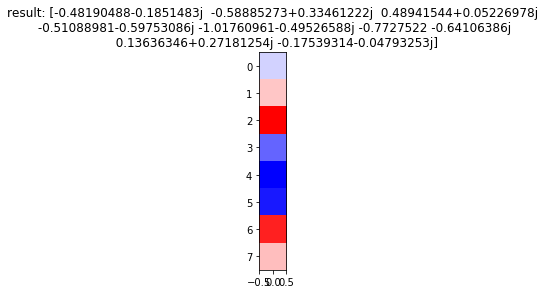

Generation: 47/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

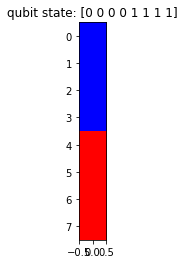

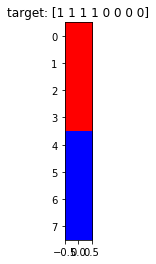

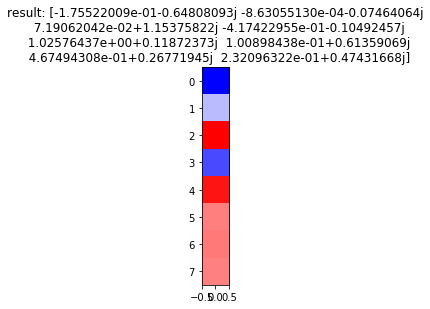

Generation: 48/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

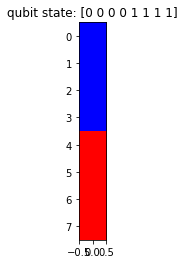

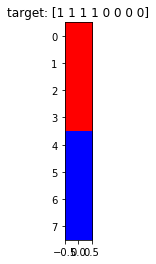

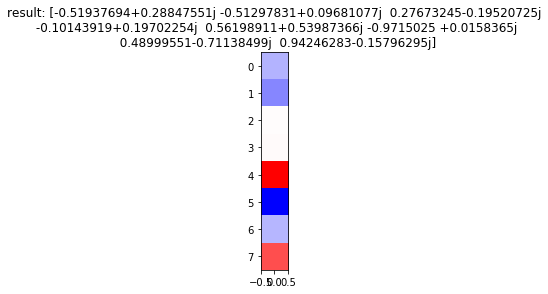

Generation: 48/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

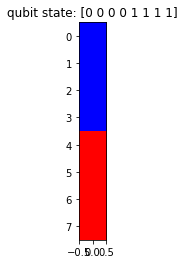

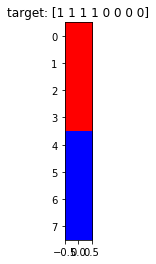

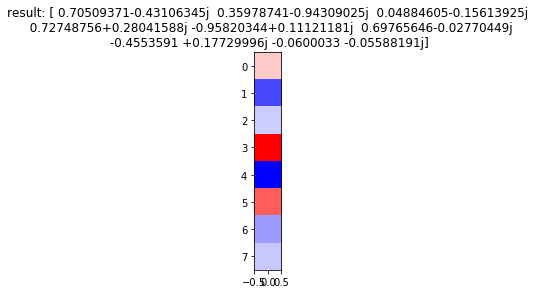

Generation: 48/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

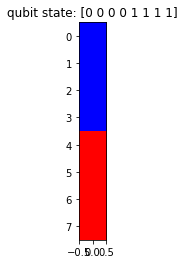

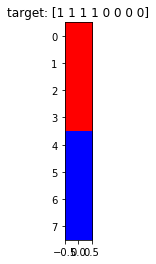

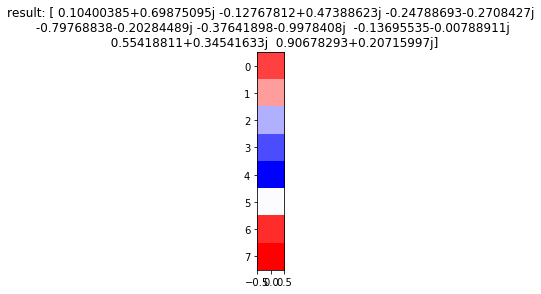

Generation: 48/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

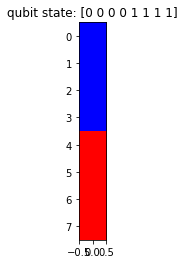

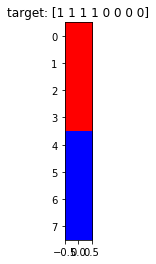

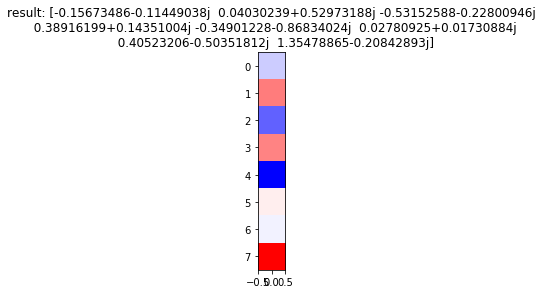

Generation: 48/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

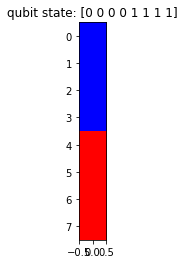

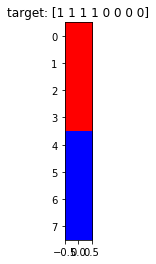

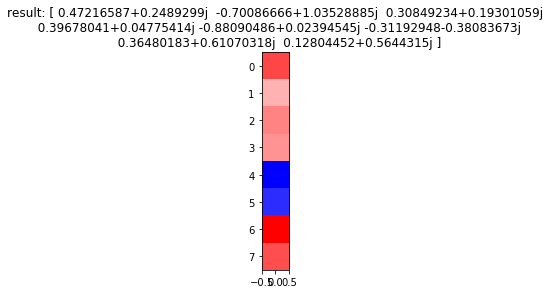

Generation: 48/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

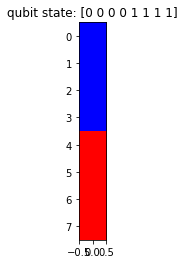

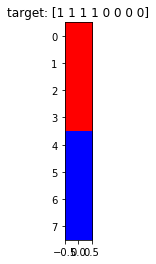

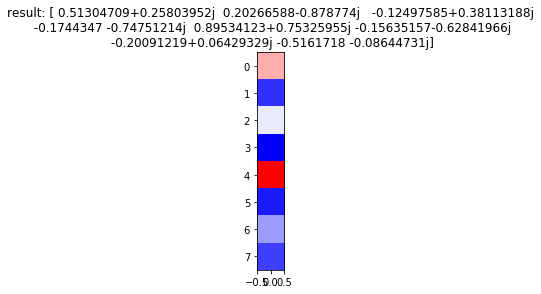

Generation: 48/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

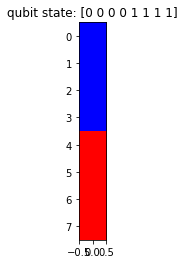

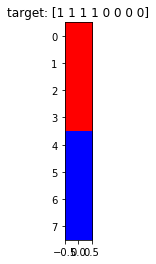

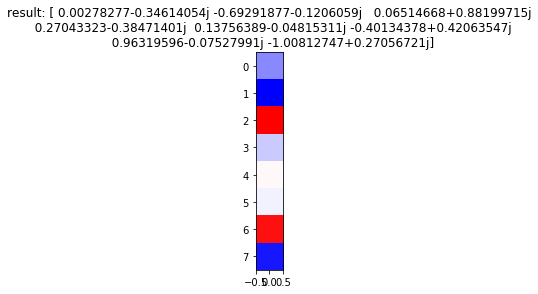

Generation: 48/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

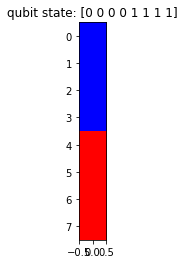

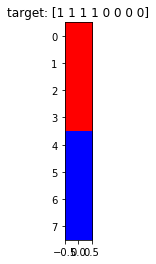

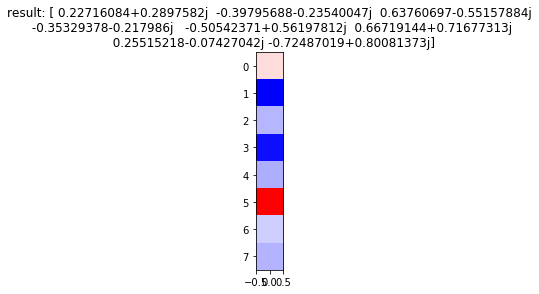

Generation: 48/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

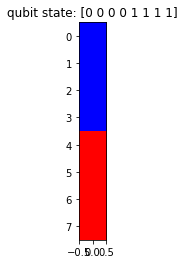

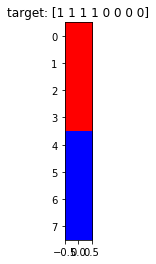

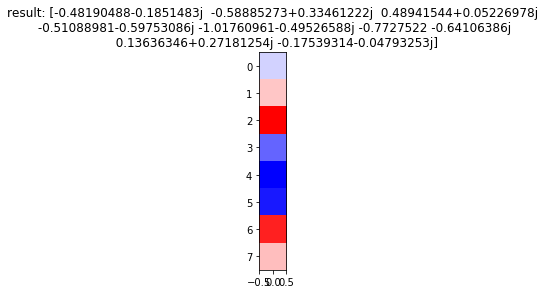

Generation: 48/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

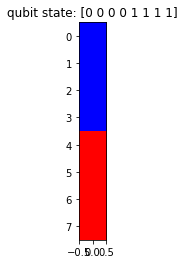

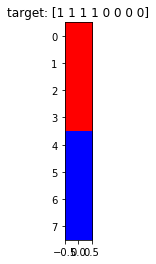

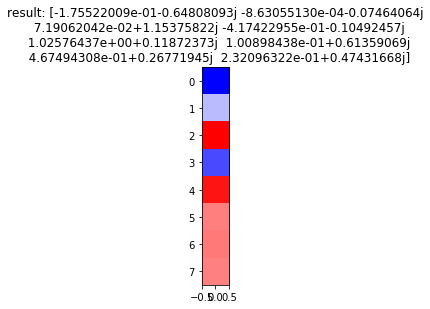

Generation: 49/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

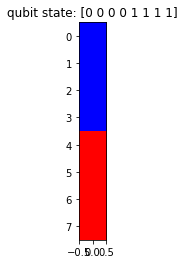

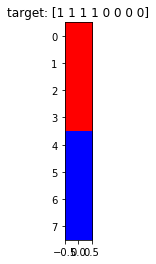

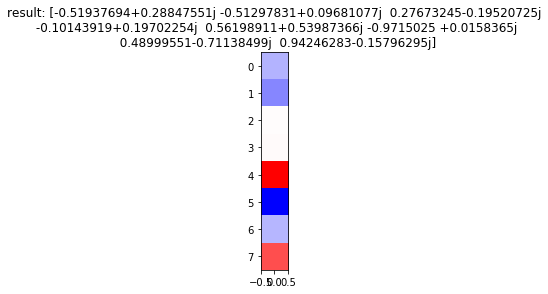

Generation: 49/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

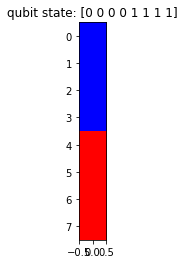

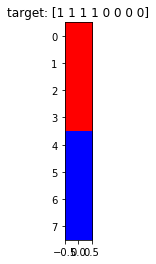

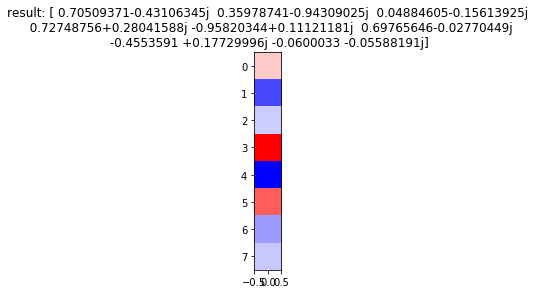

Generation: 49/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

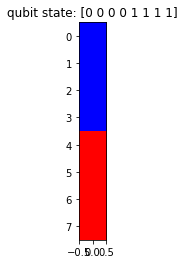

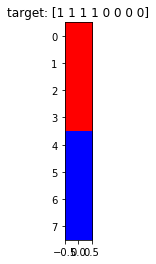

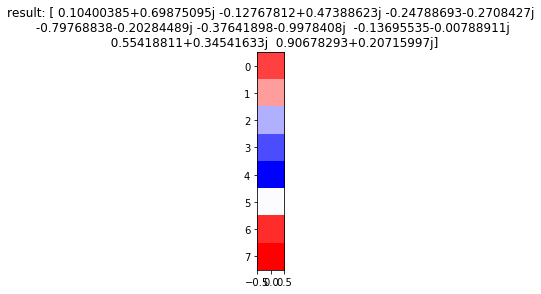

Generation: 49/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

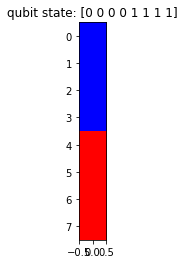

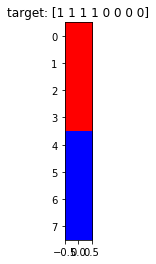

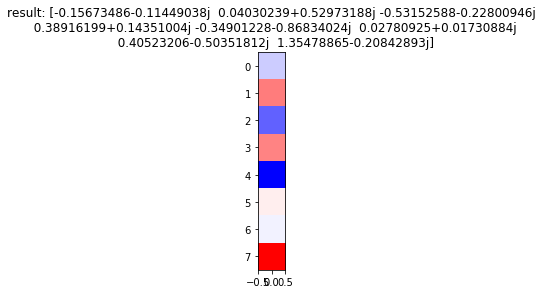

Generation: 49/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

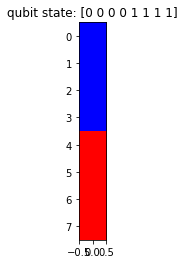

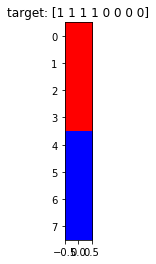

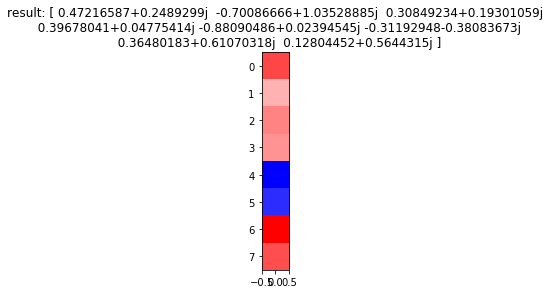

Generation: 49/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

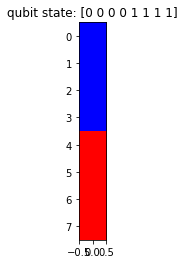

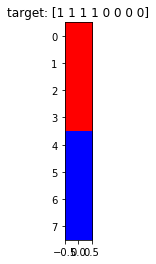

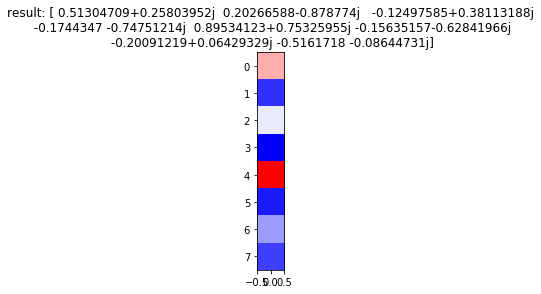

Generation: 49/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

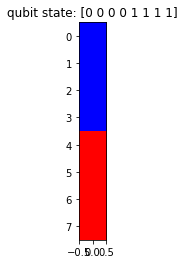

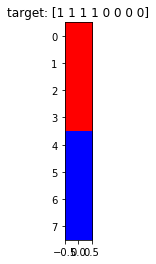

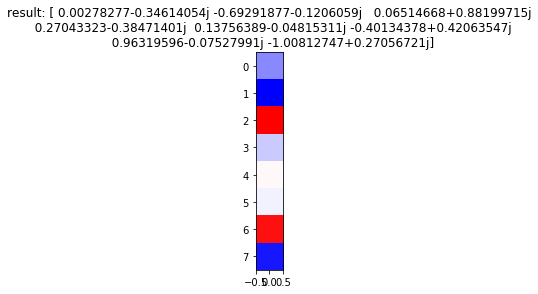

Generation: 49/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

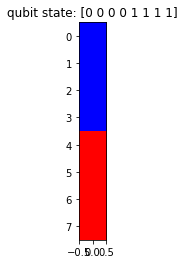

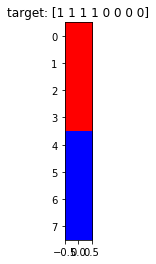

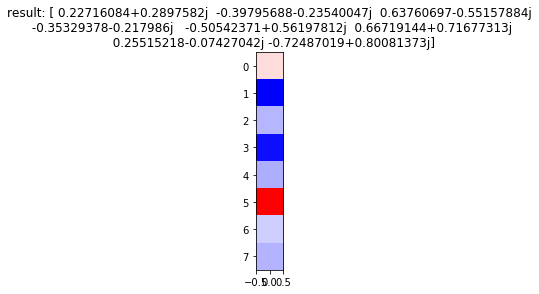

Generation: 49/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

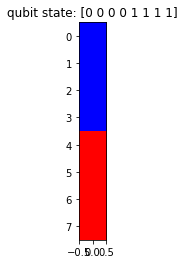

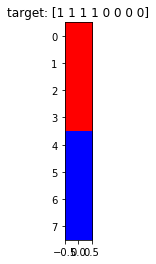

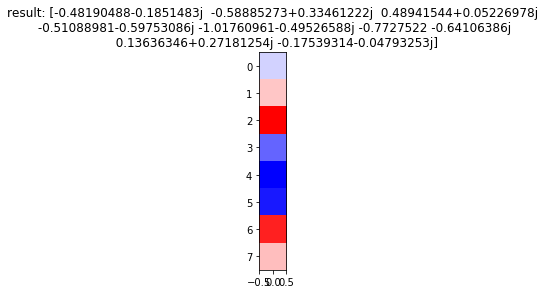

Generation: 49/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

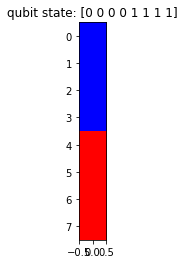

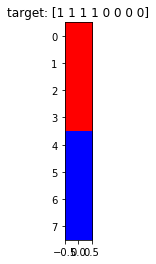

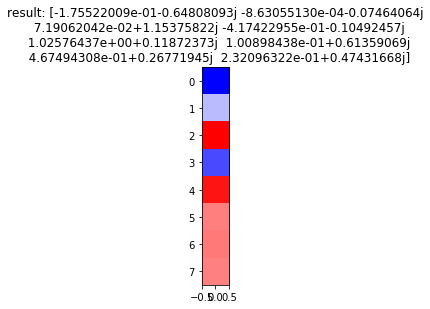

Generation: 50/50 Chromosome: 1/10
Quantum gate:
 [[ 0.23546676-0.14492498j  0.3713592 -0.42512004j  0.04292058+0.01299827j
  -0.16552976-0.22474415j  0.12587329+0.1178145j  -0.54575499+0.08028133j
   0.09036119+0.3122886j  -0.18985643-0.22190892j]
 [-0.0223009 -0.18316182j -0.00215248-0.17831109j  0.18497846-0.5389029j
  -0.18322122-0.20205776j -0.3266471 +0.12045745j -0.0781183 -0.34955704j
  -0.05732869-0.17367425j -0.05088422+0.49958461j]
 [ 0.36779104+0.15901877j -0.17067485+0.28875678j  0.2352963 -0.61826861j
  -0.20401043-0.00763831j  0.10116944+0.02742629j  0.07086239+0.20527956j
   0.0558076 +0.00101429j  0.04889302-0.42892739j]
 [-0.03051735-0.21524455j -0.06978728+0.49596142j  0.21610558+0.28170465j
  -0.56054299+0.26061187j -0.00893994+0.06556358j -0.16447825-0.21844493j
   0.18240906+0.23768289j -0.11043005+0.11222101j]
 [-0.43671239-0.00417677j  0.16693264+0.2324879j  -0.13871565-0.11062376j
   0.04865666-0.46190721j -0.18644738+0.22061049j  0.15918335+0.1654703j
   0.537

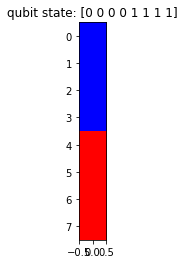

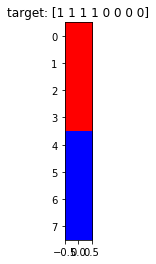

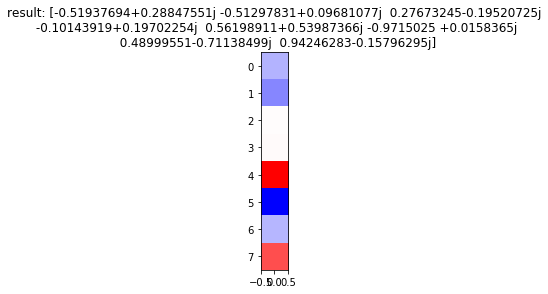

Generation: 50/50 Chromosome: 2/10
Quantum gate:
 [[-0.11819845+0.02314974j -0.0925562 -0.10800442j  0.02513411-0.23005397j
  -0.07572066-0.15174633j  0.51459744-0.01504339j  0.14790172-0.56532538j
   0.32628306+0.2725846j  -0.28368852-0.12327928j]
 [-0.03465782+0.12563278j -0.14639904-0.15872035j  0.20256768+0.44650878j
  -0.27720305-0.04626005j  0.26525731-0.23125457j  0.24341414-0.26637049j
  -0.38060719-0.40326551j  0.23172314-0.04219968j]
 [-0.461606  -0.22499789j -0.34256055+0.3308471j  -0.05309875+0.06457103j
   0.37598015+0.21780053j -0.01157704+0.31795029j -0.13517767-0.33243837j
  -0.02392027-0.18238815j  0.21952102+0.04073698j]
 [-0.22973676+0.31197456j -0.45611836-0.03861865j -0.03865986-0.35718301j
   0.1126965 -0.13257863j  0.00633573-0.3348712j   0.27810169+0.26794832j
   0.04656672+0.17329965j  0.39648343+0.1740391j ]
 [ 0.20454555+0.03558776j -0.18069039-0.03053804j -0.336348  -0.21539j
   0.20788374-0.33845932j -0.0690374 +0.09678157j  0.05720559-0.17235797j
  -0.5710

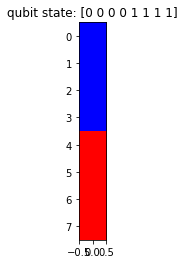

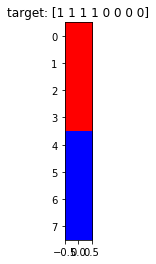

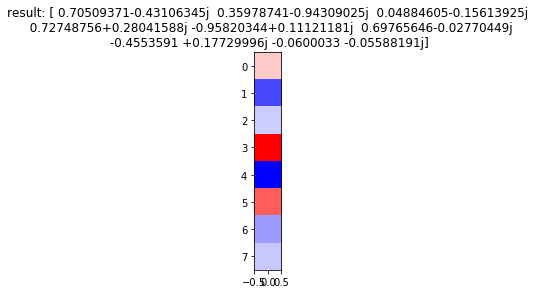

Generation: 50/50 Chromosome: 3/10
Quantum gate:
 [[-0.25753218+0.36423693j -0.25109729-0.02342747j -0.10397395-0.35154869j
  -0.1509412 +0.16211838j -0.06779467-0.27666437j  0.00339554+0.2333262j
   0.1460194 +0.6171995j   0.02238358+0.12488964j]
 [-0.16282133+0.3435071j  -0.11456126+0.41800449j -0.08086108+0.08801367j
   0.13127535-0.32476781j -0.1321497 +0.27265863j  0.27795732+0.28617755j
  -0.48204987-0.03236714j  0.20856413-0.05258281j]
 [-0.24358649-0.32454362j  0.51867631+0.29666442j -0.2262397 -0.31577718j
  -0.16745474-0.27176771j -0.25141658-0.24272254j  0.01442163+0.20155903j
   0.12511395-0.08307617j -0.13600594-0.14660303j]
 [-0.23024436-0.12073557j -0.14600104+0.39421853j  0.16523367+0.49284282j
  -0.23584956+0.25732602j -0.42488938-0.00510935j -0.21979679-0.22258052j
  -0.0092249 +0.19154891j -0.14377731-0.16670393j]
 [-0.07961335+0.29748766j -0.05544295-0.15129389j  0.00670341-0.41559627j
   0.03199165-0.08978462j -0.2306636 +0.13199665j -0.26983833-0.44015708j
  -0.02

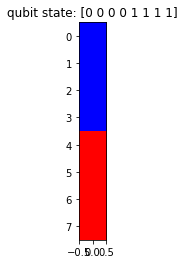

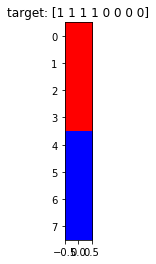

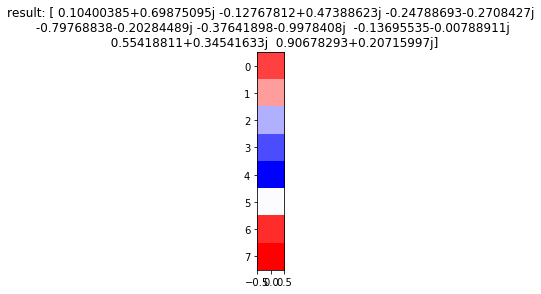

Generation: 50/50 Chromosome: 4/10
Quantum gate:
 [[ 0.34700126+0.37366745j -0.24422551+0.09179537j -0.42344448-0.41568455j
  -0.00449267-0.2256231j  -0.30254241+0.08838784j  0.30795564-0.15650538j
   0.00321209-0.12749599j -0.16536018+0.08112315j]
 [ 0.19051074+0.26797905j  0.01506718+0.1687922j   0.18428659-0.00940497j
  -0.18512037+0.53060607j -0.12738452+0.51247622j  0.01764492+0.37517422j
  -0.01812912-0.19798487j  0.1681711 -0.15993369j]
 [ 0.13704822+0.0322416j  -0.31315431+0.24825955j  0.1629106 +0.05356446j
   0.08032412-0.12671997j  0.20352094-0.26559674j -0.230072  +0.2590614j
  -0.42693587-0.51301984j -0.07803894+0.29154571j]
 [ 0.13545449+0.06356635j  0.40655398+0.24210732j  0.51967218-0.17725324j
  -0.01427934-0.1295837j   0.02401549+0.10468619j  0.06438445-0.3143073j
   0.28777031-0.11960487j  0.01299174+0.47273602j]
 [ 0.13726409-0.03902791j -0.3276226 +0.11717909j  0.30132734+0.0058927j
   0.35210699+0.14506649j -0.31822827-0.06046798j -0.18215869-0.53208539j
  -0.1447

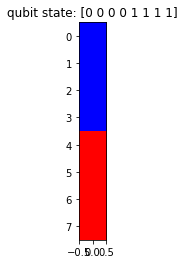

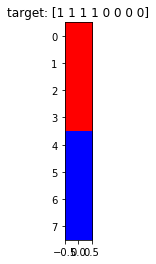

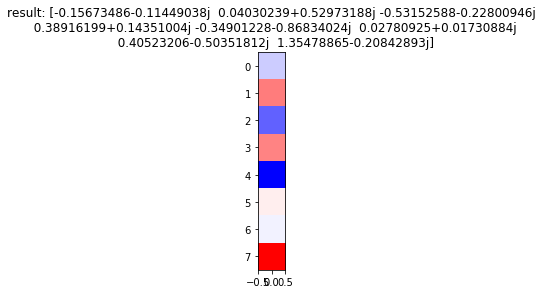

Generation: 50/50 Chromosome: 5/10
Quantum gate:
 [[-0.11841227+0.07555205j  0.39324808+0.09136771j -0.26438338+0.02656952j
   0.11319009+0.3200334j  -0.41944307+0.34416817j  0.25684409+0.03448688j
   0.29013932+0.10621648j  0.34462553-0.23594163j]
 [ 0.39600629-0.19190181j  0.13465581-0.16730862j  0.2661887 -0.15204829j
   0.04053172-0.20443939j -0.3639076 +0.47229747j  0.10531728+0.28800006j
  -0.29705519+0.02316178j -0.14522115+0.25182954j]
 [ 0.4817683 -0.14051627j -0.3395579 -0.0925519j  -0.40010127+0.16421896j
   0.17556637+0.15306539j  0.0610867 -0.20615113j  0.29196691+0.37458082j
   0.12294533+0.19630966j -0.16750661-0.17172876j]
 [ 0.17888903+0.1805798j   0.62752639+0.20805028j -0.07699022-0.05133786j
   0.1839534 -0.12432482j  0.34918847-0.24333616j  0.35001732-0.096009j
  -0.20928144+0.2031521j  -0.09314394+0.18394719j]
 [ 0.08453243-0.00967892j -0.10146255+0.08653943j -0.45654635-0.24816358j
   0.18741158+0.2782698j  -0.16142923+0.15677828j -0.2497722 -0.48440248j
  -0.090

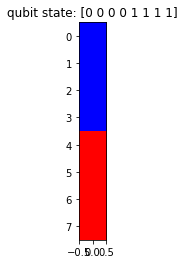

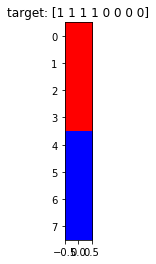

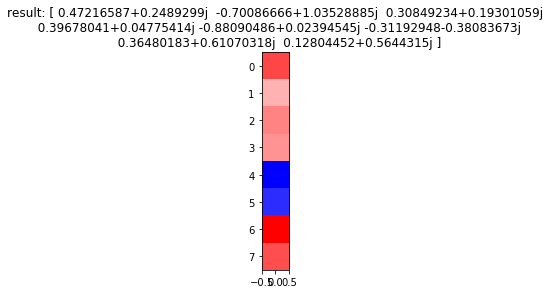

Generation: 50/50 Chromosome: 6/10
Quantum gate:
 [[ 5.22466777e-01+0.10893364j  1.79476747e-01+0.31520316j
   2.11676788e-02-0.01118041j -2.70276404e-01+0.065664j
   8.27312756e-02+0.21793049j -1.25584089e-01-0.06164559j
   4.93077459e-01-0.24870914j  6.28224476e-02+0.35046376j]
 [ 5.31984741e-02+0.28039287j -3.53608014e-01+0.22054591j
  -2.42230294e-01-0.05849095j  1.94879852e-01-0.09315008j
   4.52753411e-01-0.45776946j -2.02329498e-01-0.28400924j
  -1.59908998e-01-0.23043785j  1.12150964e-01+0.09344255j]
 [-1.73606017e-01+0.5297573j   5.93508572e-01-0.2328796j
  -1.17615473e-01+0.10467983j  1.95630420e-01+0.16571503j
   1.74836281e-01-0.10023796j -1.88355908e-01+0.26402924j
   1.25436927e-02+0.0484529j  -1.23999912e-01+0.16888771j]
 [-1.15204456e-01+0.21036466j  1.83472820e-01-0.04520645j
   3.67637577e-01-0.60795175j  9.91432978e-02-0.00356813j
  -4.14489124e-01-0.21831373j -3.47217989e-03-0.30058818j
   6.79479888e-02-0.2161883j   1.75578611e-01-0.01242193j]
 [-4.02974840e-02+0.0

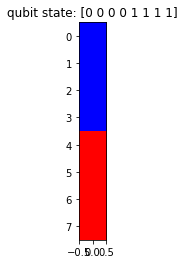

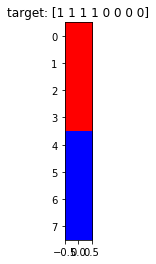

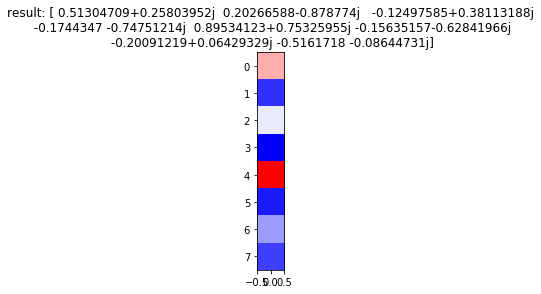

Generation: 50/50 Chromosome: 7/10
Quantum gate:
 [[ 0.23792485+0.04820647j  0.04339237+0.10414056j  0.09897635+0.50757858j
   0.24789285+0.08156289j -0.02331837+0.02978444j  0.19140977-0.20320085j
  -0.25642513-0.54705287j  0.09111649+0.37432873j]
 [-0.17867615+0.2407314j  -0.17850221+0.09307171j -0.19673949+0.15508211j
  -0.0971241 +0.21969877j -0.46665241+0.44795721j -0.16369352-0.03747246j
  -0.25844609-0.09773431j  0.19587324-0.43335634j]
 [-0.00408719+0.6102414j  -0.28099246+0.01352274j  0.12952737-0.14535204j
   0.23412694-0.35096773j -0.15268444+0.04046255j  0.0670269 +0.38512489j
  -0.0224022 +0.12788036j  0.17320641+0.32852935j]
 [ 0.00585114-0.31244923j -0.18069241+0.15726684j -0.00746064-0.25097151j
   0.73300527+0.01033344j -0.17928005-0.00707465j  0.30933466-0.00620932j
   0.13468782-0.06438579j  0.0056908 -0.30704425j]
 [ 0.01753955+0.23630184j  0.24763831+0.4567612j  -0.20822889-0.10016131j
   0.25482739+0.20849636j  0.05202005-0.08636803j -0.37763759-0.39522919j
   0.2

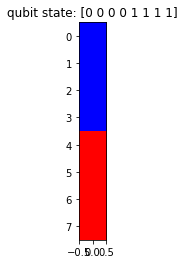

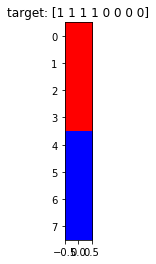

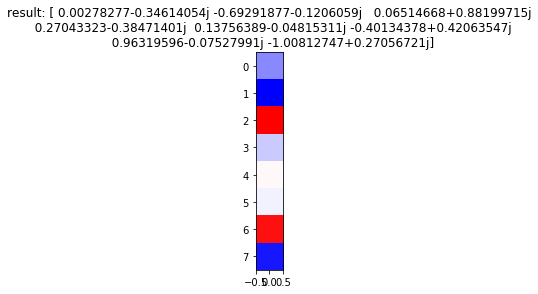

Generation: 50/50 Chromosome: 8/10
Quantum gate:
 [[ 0.24041983-0.17038459j  0.22442041-0.11694175j -0.09764798+0.42776847j
  -0.27600576-0.52037283j  0.30944813-0.24577324j -0.09616736+0.25840642j
   0.04483094+0.00423479j -0.03095087+0.27289024j]
 [ 0.18968276-0.09985667j  0.07007355+0.32111506j  0.10457247-0.04346353j
   0.18935291-0.08058783j -0.11196585-0.24654524j -0.30623379+0.22946634j
  -0.47989524+0.07363151j  0.500138  -0.29195309j]
 [-0.005382  +0.23355357j -0.06658694+0.36530881j  0.18887993+0.31459472j
   0.08057413-0.4101943j  -0.12220456+0.08961137j  0.55142644-0.13908823j
   0.08031677-0.28884069j  0.12806832-0.21326128j]
 [ 0.30071468-0.35710528j -0.22067423-0.17194942j -0.03797369+0.19398445j
  -0.03438636-0.09327299j -0.38403751+0.35901959j -0.37594966-0.08961309j
   0.32070494-0.24911034j  0.08598846-0.23828216j]
 [-0.05383388+0.37895174j -0.33101167-0.3095613j   0.52390611-0.15700524j
   0.08470184-0.42118981j -0.11516912+0.08844688j -0.22932969+0.14721376j
  -0.0

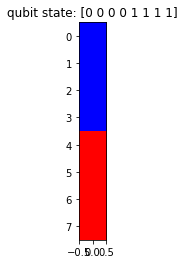

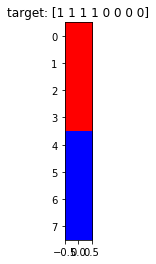

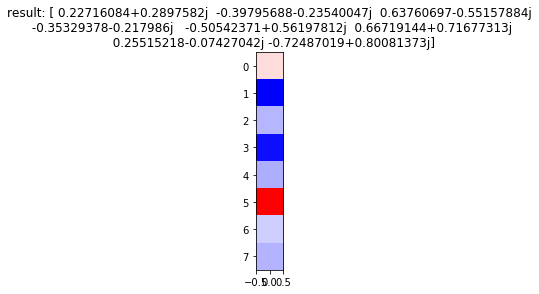

Generation: 50/50 Chromosome: 9/10
Quantum gate:
 [[ 0.30372071+0.30422791j  0.00981133+0.41615654j -0.12788817-0.28604402j
   0.16516437-0.35896186j -0.20954136-0.05893825j -0.4197838 -0.26706166j
   0.2154708 +0.19633715j -0.06805053-0.05548554j]
 [ 0.55588129-0.00290053j  0.05247381-0.05952041j  0.18047449-0.20542339j
   0.02173921+0.21432859j  0.2963326 +0.06739482j  0.03109342+0.00075113j
  -0.37228881+0.12418725j -0.54398994+0.14227902j]
 [ 0.17182768+0.04001984j -0.2033045 +0.08890482j -0.41603037-0.23918975j
  -0.0295409 -0.2582164j  -0.16533397+0.03095927j  0.73325716+0.17211625j
   0.02659986-0.03612644j -0.10510762-0.11467929j]
 [-0.08695857-0.1712235j   0.07997437+0.4894306j   0.01951625+0.10750373j
  -0.13807448-0.18763949j  0.04726455-0.52925035j -0.03628103+0.15511426j
  -0.56140929-0.08378041j  0.03953595-0.13961437j]
 [-0.239445  -0.21593675j -0.0579662 -0.46525885j -0.24659756+0.0616302j
   0.26844023-0.34412284j -0.12691496-0.04772739j -0.22715708-0.1167234j
  -0.197

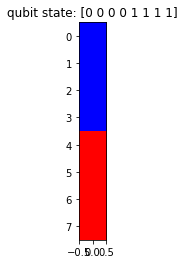

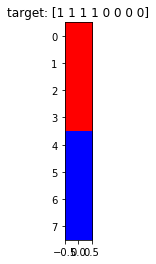

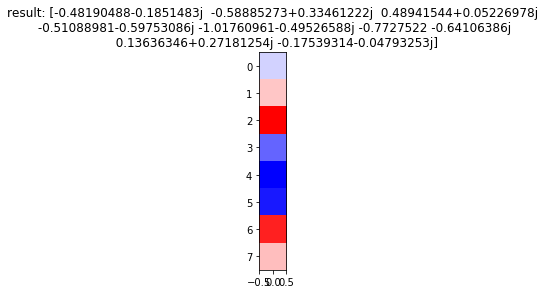

Generation: 50/50 Chromosome: 10/10
Quantum gate:
 [[-0.28035883+0.28098702j  0.13843963-0.19278401j  0.25210282+0.00750279j
   0.11434563-0.19750645j  0.14523933+0.01722352j -0.15538943-0.20331014j
   0.38498686-0.11760152j -0.55035877-0.3443928j ]
 [ 0.00447769-0.01130493j  0.03110314-0.41875283j -0.10880452-0.17584329j
   0.07709533+0.40487194j -0.61482952-0.03044886j  0.29096976+0.05711169j
   0.35868959-0.11764251j -0.03569288+0.01633904j]
 [-0.27275086-0.04526136j  0.23451929+0.14147695j -0.06880127+0.3192386j
   0.05987451-0.06291264j -0.07971491+0.21423245j -0.04614646-0.04386036j
   0.31981546+0.29503535j -0.12204789+0.68835077j]
 [ 0.12595718+0.73724936j -0.03452112+0.13458838j -0.10829321+0.1598904j
  -0.12559571+0.28995001j -0.20423996+0.02911712j -0.1616517 -0.33601293j
  -0.13626569+0.26893294j  0.0847344 -0.0669617j ]
 [ 0.14993998+0.22959223j  0.05080369+0.2998148j  -0.25688028+0.15748338j
  -0.13109044+0.19285628j  0.38235833+0.10243101j  0.57481482+0.27103529j
   0.24

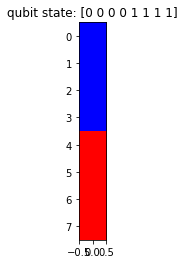

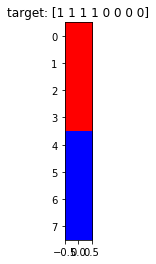

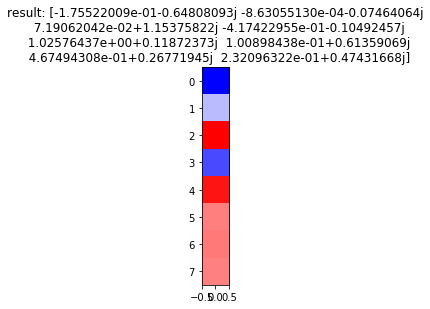

[0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.44725258833466447,
 0.4472525

<Figure size 432x288 with 0 Axes>

In [4]:
evolve_quantum_gates(q_in=[0,0,0,0,1,1,1,1],q_out=[1,1,1,1,0,0,0,0])

### Bell states

#### It isn't difficult to see that we can evolve gates such that we create Bell states for given qubit systems. In the future, we can modify our fitness function so that we priortiize gates that lead to maximally entangled states.

### Quantum operations

#### The purpose of the above is to show we can use genetic algorithms to evolve quantum gates. What we $\textit{really}$ want to do however is to implement quantum $\textit{algorithms}$ like addition, multiplication etc. 

#### The way we can transform this problem into one amenable to a genetic algorithm solution is to realize all we are doing in quantum circuits are appling a sequence of N gates with M parameters. The way we can genetically program quantum circuits (evolve a sequence of them) is to evolve both the number of gates and then the parameters for each of those gates. 

#### Again, due to practical considerations, rather than considering the search space to be $U(n)$ we should only familar quantum gates. 

### Milestones


1) Implementation of basic arithmetic.

2) Implenetation of Grover's and Shor's algorithm.

3) Modifying the fitness function to consider the hardware implementation of the quantum computer. 

4) Visualization of the qubit states

5) GUI that generates the quantum circuits from the chromosomes and saves the most fit ones to a directory. 

6) repeat steps 1-5 using quantum annealing



### Quantum full-adder

<img src="full_adder.png" width="350x350">

#### This is a circuit for a quantum full-adder, which was manually engineered. In order to make genetic engineering of useful quantum circuits realistic, we would need to have a way to evolve circuits which can operate on a varying number of qubits, rather than a fixed number of qubits. For example, the Hadamard transform cannot act on an odd number of qubits, wheras the Pauli gates act on individual qubits. We may need to do tensor product(s) of gates to potentially shorcut some of the steps. We also would need to consider entangelement of qubits as something to keep track of during the evolution of gates. 


#### An important question which can also be tackled with genetic algorithms is what are the $\textit{fewest}$ number of universal quantum gates needed to construct a given unitary transformation on an n-qubit system? This can be acheived by selecting a random unitary matrix and evolving a sequence of universal gates. The fitness function could be the normed distance between the selected random unitary matrix and the result of multiplying the output of universal gates together. 


